In [131]:
import os
import io
import sys
import re
from typing import Dict, List, Literal
import json
import sqlite3
import requests
import pandas as pd
import itertools
import numpy as np
from numpy.linalg import inv
import seaborn as sns
import yfinance as yf
from datetime import datetime
import contextlib
from contextlib import contextmanager
from typing import Dict, List, Tuple, Union, Literal, Optional
from fredapi import Fred
from itertools import combinations
from statsmodels.tsa.stattools import adfuller
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.linear_model import LinearRegression
from scipy.linalg import svd
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
from matplotlib.colors import ListedColormap
import matplotlib
import statsmodels.api as sm
from scipy.cluster.hierarchy import linkage, dendrogram, leaves_list
from scipy.spatial.distance import squareform
import skfuzzy as fuzz
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from hmmlearn.hmm import GaussianHMM
import ruptures as rpt
from functools import partial
from sklearn.decomposition import PCA, KernelPCA
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# loading & processing data

In [2]:
# naming convention #

naming_convention = {
    # root
    'base_case' : 'upper', # what will be the case of the root ? 

    # prefixes
    'prefixes' : {'avg':'avg', # allowed prefixes and what we use for each
                  'std':'std',
                  'z':'z',
                  'None':'',
                  None:'',
                  '':''},
    'prefix_format': '{prefix.lower()}', # how will we format a prefix?
    'special' : {'adjust':'Adj',
                 'beta_neuter' :'Bneut',
                 'term_premium':'Tp',
                 'None':'',
                 None:'',
                 '':''}, 
    'special_format': '{other}{special.title()}', # other : wrt ; special can stack

    # suffixes
    'types' : {'Open':'open',
               'High':'high',
               'Low':'low',
               'Close':'close',
               'Twap':'twap',
            #    '1m':'1m',
            #    '6m':'6m',
               'None':'',
               None: '',
               '':''},

    # order
    'full_name' : '{prefix}{special}{root}{type}{transformations}' 
    ##### examples #####
    # avgSPYTRtwap_DIFF2
    # normCPIhigh_DIFF1
    # GOLDopen
}

In [3]:
# TICKER NAMING FUNCTIONS #

# name according to naming convention
def name(
     data_name: str,
     operations: str = None,
     data_type: str = 'None',
     prefix: str = 'None',
     special: str = 'None',
     config: dict = naming_convention
) -> str:
     """
     Construct a name based on base name, operations, and additional parameters.

     Parameters:
     - data_name (str): The base name of the data (e.g., 'DATA').
     - operations (List[str]): List of operations in sequence, e.g., ['D', 'd'] for differencing once and deriving once.
     - data_type (str): Type of data (e.g., 'Open', 'Low').
     - prefix (str): Prefix like 'avg' or 'std'.
     - special (str): Special designation for adjustment, if any.
     - config (dict): Configuration dict for the naming convention.

     Returns:
     - str: The constructed name.
    """
     
     if operations:
        operation_suffix = operations # ''.join(operations)
     else:
        operation_suffix = ''
     
     return config['full_name'].format(
          prefix=prefix if prefix != 'None' else '',
          special=special if special != 'None' else '',
          root=data_name.upper() if config['base_case']=='upper'
               else data_name.lower() if config['base_case']=='lower'
               else data_name,
          type=config['types'][data_type.title()] if data_type != '' else '',
          transformations='_' + operation_suffix if operation_suffix != '' else '') 

# extract some or all elements of name
def nameget(cname : str, get : List[Literal['all', 'prefix', 'special', 'root', 'type', 'operations']],
             config : dict = naming_convention) -> Union[Dict[str, str],str]:
     """
     Extract elements of a name by the naming convention and output as a dictionary 
          - Useful for renaming or dropping 

     Parameters:
     name (str): Name conforming to the naming convention
     get (List[Literal]): Which elements to extract
     config (dict): The naming convention configuration

     Returns:
     Union[Dict[str, str],str]: A dictionary of the extracted elements if more than one, otherwise a single string
     """
     out = {}

     # Patterns for optional components
     prefix_pattern = r'^([a-z]*)?'                  # Optional lowercase prefix
     special_pattern = r'((?:[A-Z][a-z0-9]+)+)?'     # Optional title case special marker (one or more components)
     main_pattern = r'([A-Z][A-Z0-9]+)'              # Root in uppercase
     type_pattern = r'([a-z]*)?'                     # Optional type in lowercase
     operations_pattern = r'(_(?:[Dd])*)?$'          # Optional sequence of operations like _D, _d

     # Combine all into a flexible full pattern
     full_pattern = f'{prefix_pattern}{special_pattern}{main_pattern}{type_pattern}{operations_pattern}'
     
     # print(type(cname))
     match = re.match(full_pattern, cname)
     
     if match:
          # Extract components from regex groups, making sure defaults are handled
          prefix = match.group(1) or 'None'
          special = match.group(2) or 'None'
          root = match.group(3)  # We assume root must be present
          data_type = match.group(4) or 'None'
          operations_seq = match.group(5) or ''

          # Parse operation sequence into individual operations
          operations = re.findall(r'[Dd]', operations_seq)

          # Populate the output dictionary based on `get` parameters
          if 'all' in get or 'prefix' in get:
               out['prefix'] = prefix
          if 'all' in get or 'special' in get:
               out['special'] = special
          if 'all' in get or 'root' in get:
               out['root'] = root
          if 'all' in get or 'type' in get:
               out['type'] = data_type
          if 'all' in get or 'operations' in get:
               out['operations'] = operations
     else:
          # Default values if no match found or if required element is missing
          if 'all' in get or 'prefix' in get:
               out['prefix'] = 'None'
          if 'all' in get or 'special' in get:
               out['special'] = 'None'
          if 'all' in get or 'root' in get:
               out['root'] = 'None'
          if 'all' in get or 'type' in get:
               out['type'] = 'None'
          if 'all' in get or 'operations' in get:
               out['operations'] = []

     # Return single element if only one key is requested
     if len(out.keys()) == 1:
          return list(out.values())[0] 
     
     return out

# rename, mainly to add a prefix/special or to increment the diff when differencing
def rename(cname : str, transform: List[str] = None, add_prefix = None, add_special = [], incr_diff : int = None, config : Dict[str, str] = naming_convention) -> str:
     """
     Rename a column name according to the naming convention

     Parameters:
     cname (str): The current name of the column
     transform (str): A list of operations to apply, written as a str
     add_prefix (str): Prefix to add to the name if applicable
     add_special (List[str]): Special indicators to add to the name
          - Must follow the format: [other_name_1, 'adj'|'beta_neutered'|'term_premium', other_name_2, 'adj'|'beta_neutered', ...]
     incr_diff (int): Increment to apply to the differencing order if applicable
     config (dict): The naming convention configuration

     Returns:
     str: The new column name.
     """
     def add_prefix_func(cname: str, prefix: str) -> str:
        info = nameget(cname, get=['all'])
        new_prefix = prefix + info['prefix'] if info['prefix'] != 'None' else prefix
        return name(
               data_name=info['root'],
               operations=''.join(info['operations']),
               data_type=config['types'][info['type'].title()],
               prefix=new_prefix,
               special=info['special'] if info['special'] != 'None' else '')

     def add_special_func(cname: str, special_list: List[str]) -> str:
          info = nameget(cname, get=['all'])
          special = ''
          for string in special_list:
               if string not in config['special']:
                    other_info = nameget(string, get=['root', 'operations'])
                    string = other_info['root'].title() + other_info['operations'] if len(other_info['operations']) > 0 else other_info['root'].title()
               else:
                    string = config['special'][string].title()
               special = string + special
          if special == '':
               special = 'None'

          return name(
               data_name=info['root'],
               operations=''.join(info['operations']),
               data_type=config['types'][info['type'].title()] if info['type'] != '' else '',
               prefix=info['prefix'] if info['prefix'] != 'None' else '',
               special=special + info['special'] if info['special'] != 'None' else special)

     def apply_transformation_func(cname: str, transform: str) -> str:
          info = nameget(cname, get=['all'])
          return name(
               data_name=info['root'],
               operations=''.join(info['operations']) + transform if len(info['operations']) != 0 else transform,
               data_type=config['types'][info['type'].title()] if info['type'] != '' else '',
               prefix=info['prefix'] if info['prefix'] != 'None' else '',
               special=info['special'] if info['special'] != 'None' else '')
     
     if add_prefix is not None:
          newname = add_prefix_func(cname, add_prefix)

     if len(add_special) > 0:
          newname = add_special_func(cname, add_special)

     if transform is not None:
          newname = apply_transformation_func(cname, transform)

     return newname

In [4]:
# misc, suppressing print functs #
@contextmanager
def suppress_print_cm():
    with open(os.devnull, 'w') as fnull:
        old_stdout = sys.stdout
        sys.stdout = fnull
        try:
            yield
        finally:
            sys.stdout = old_stdout

def suppress_print(func):
    """
    Decorator to suppress print statements in a function
    Used occasionally for functions with debug prints that we might not want to delete, or if import functions like yfinance print out processing lines that we don't want to display
    """
    def wrapper(*args, **kwargs):
        with contextlib.redirect_stdout(io.StringIO()), contextlib.redirect_stderr(io.StringIO()):
            result = func(*args, **kwargs)
        return result
    return wrapper

In [5]:
# FORCED PERCENT CHANGES, AUTOREMOVE STATIONARITY, LOOKBACK, CLIP FUNCTIONS #

def increment_deriv(col_name : str, by : int = 1) -> str:
    """
    Increment the derivate level of a column name

    Parameters:
    col_name (str): The current column name
    by (int): The amount to increment by (default is 1)

    Returns:
    str: The new column name with incremented derivative level
    """
    return rename(col_name, transform='d'*by)

def increment_diff(col_name : str, by : int = 1) -> str:
    """
    Increment the differencing level of a column name

    Parameters:
    col_name (str): The current column name
    by (int): The amount to increment by (default is 1)

    Returns:
    str: The new column name with incremented differencing level
    """
    transf = 'D'*by
    return rename(col_name, transform=transf)

# # find the base and difference level of a column's name
# def get_base_and_diff_level(cname: str) -> Tuple[str, int]:
#     """
#     Find the base name and differencing level of a column's name

#     Parameters:
#     cname (str): The column name to parse

#     Returns:
#     Tuple[str, int]: The base name and differencing level
#     """
#     info = nameget(cname, get=['root', 'diff'])
#     base_name, diff_level = info['root'], info['diff']
#     return base_name, int(diff_level)

# pct change for chosen columns
def pct_change(df: pd.DataFrame, cols: Dict[str, int], only: bool = False) -> pd.DataFrame:
    """
    Calculate percentage changes for specified columns

    Parameters:
    df (pd.DataFrame): The input DataFrame
    cols (Dict[str, int]): Dictionary of columns and the number of differencings to apply
    only (bool): If True, return only the percentage change columns. If False, return the original columns plus the percentage change columns

    Returns:
    pd.DataFrame: DataFrame with percentage changes applied
    """
    target = df if not only else pd.DataFrame()
    for col, diff_count in cols.items():
        if col in df.columns:
            index = df.columns.get_loc(col) if not only else len(target.columns)
            pct_change_col = df[col]
            for _ in range(diff_count):
                pct_change_col = (pct_change_col.pct_change(fill_method=None)).dropna()
                pct_change_col_name = col + 'd' if '_' in col else col + '_d'
            # print(type(pct_change_col_name), ' : ', pct_change_col_name, ' from ', col)
            target.insert(index, pct_change_col_name, pct_change_col)
            # print(f'{col} found and differenced {diff_count} times to {increment(col, by=diff_count)}')
        else:
            print(f'Warning! {col} was not differenced because it could not be found in the DataFrame')
    return target

def assess_stationarity(series: pd.Series, sig_level : float = 0.05) -> Tuple[bool, float, tuple]:
    """
    Assess  stationarity of a time series

    Parameters:
    series (pd.Series): The time series to assess
    sig_level (float): The significance level for the test (default is 0.05)

    Returns:
    Tuple[bool, float, tuple]: Tuple containing a boolean indicating if the series is stationary, the p-value, and the test result
    """
    # print(f'Assessing stationary for: {series.name}')
    series = series.replace([np.inf, -np.inf], np.nan).dropna()

    if series.min()==series.max():
        print(f'Series {series.name} is constant, adfuller not applied')
        return True, None, None # a constant series is stationary...?
    
    if len(series)>1:
        try: 
            result = adfuller(series)
            p_value = result[1]
            is_stationary = p_value < sig_level
            return is_stationary, p_value, result
        except ValueError as e:
            print(f'Error applying adfuller to {series.name}: {e}')
            return False, None, None
    else:
        print(f'{series.name} was zero-length after dropping NaN values')
        return False, None, None

# find optimal differencing level for a single column
def optimal_differencing_col(series: pd.Series, max_diff: int = 2, sig_level: float = 0.05) -> Tuple[pd.Series, int, Dict[str, Union[int, float, tuple]]]:
    """
    Find the optimal differencing level for a time series

    Parameters:
    series (pd.Series): The time series to difference
    max_diff (int): The maximum number of differencings allowed (default is 2)
    sig_level (float): The significance level for the stationarity test (default is 0.05)

    Returns:
    Tuple[pd.Series, int, Dict[str, Union[int, float, tuple]]]: Tuple containing the differenced series, the order of differencing, and the differencing log
    """
    is_stationary, p_value, result = assess_stationarity(series, sig_level)
    diff_order = 0
    diff_log = {'diff': diff_order, 'p_value': p_value, 'result': result}

    while not is_stationary:
        if diff_order < max_diff:
            diff_order += 1
            series = series.diff().dropna()
            is_stationary, p_value, result = assess_stationarity(series, sig_level)
            diff_log = {'diff': diff_order, 'p_value': p_value, 'result': result}
        else:
            print(f'Warning: {series.name} differenced {max_diff} times, but is still not stationary\n\
                  The last difference was returned')
            break

    return series, diff_order, diff_log

# could expand to not be just for that
# @suppress_print
# def insert_forced(forced : pd.DataFrame, diff_data : pd.DataFrame) -> pd.DataFrame:
#     """
#     Insert forced differenced columns into the DataFrame

#     Parameters:
#     forced (pd.DataFrame): DataFrame of forced differenced columns
#     diff_data (pd.DataFrame): DataFrame of optimally differenced data

#     Returns:
#     pd.DataFrame: DataFrame with forced columns inserted
#     """
#     for forced_col in forced:
#         print(f'Processing forced {forced_col}...')
#         forced_base_name, forced_diff_level = get_base_and_diff_level(forced_col)
#         if forced_col in diff_data:
#             print(f'Column {forced_col} already in dataframe')
#             continue
#         for i, diff_col in enumerate(diff_data):
#             diff_base_name, diff_level = get_base_and_diff_level(diff_col)
#             print(f'Testing for matching base names: {forced_col}, {diff_col}')
#             if diff_base_name==forced_base_name:
#                 print(f'Matching base names found! {forced_col}, {diff_col}')
#                 if forced_diff_level < diff_level:
#                     diff_data.insert(i, forced_col, forced[forced_col])
#                     print(f'Inserted {forced_col} at index {i}')
#                     break
#                 elif forced_diff_level > diff_level:
#                     if forced_diff_level-diff_level==1:
#                         diff_data.insert(i+1,forced_col, forced[forced_col])
#                         print(f'Inserted {forced_col} at index {i}')
#                         break
#                     # not inserting here because there might be more 
#                     continue
#                 else:
#                     # same difference shouldn't happen because already dealt with by pre-loop if statement
#                     break
#         else: 
#             # if no matching column, we'll add it to the end
#             diff_data.insert(len(diff_data),forced_col, forced[forced_col])
#             print(f'Appended {forced_col}')
#     return diff_data

# @suppress_print
def difference(df: pd.DataFrame, force_diff: Dict[str, int] = None, force: bool = False, max_diff: int = 2, sig_level: float = 0.05) -> Dict[str, Union[pd.DataFrame, pd.Series, Dict[str, dict]]]:
    """
    Difference columns in a DataFrame to achieve stationarity
        - Step 1: Apply percent changes to forced columns
        - Step 2: Find optimal differencing for each column of the original data, optimal being the least level of differencing that makes the series stationary via DF p-value
        - Step 3: Insert forced columns into optimally differenced DataFrame

    Parameters:
    df (pd.DataFrame): The input DataFrame.
    force_diff(Dict[str, int]): Dictionary of columns to force differencing, with key as the column name and value as the number of times to difference 
        - will be warned if a forced is nonstationary, but it will be kept in output unless force == False
    force (bool): Keep the columns in force_diff in the final output undifferenced by the automatic differencing regardless of if stationary? 
    max_diff (int): The maximum number of differencings allowed (default is 2)
        - will be warned if still nonstationary, but it will keep the max-level differenced column even if it is not stationary
    sig_level (float): The significance level for the stationarity test (default is 0.05)

    Returns:
    Dict[str, Union[pd.DataFrame, pd.Series, Dict[str, dict]]]: Dictionary containing:
        - 'full_data' : the dataframe with the forced columns and the stationary series (will = diff_data if none nonstationary are forced)
        - 'diff_only' : the dataframe with only the optimally differenced columns
        - 'diff_orders' : the series of orders of differencing needed for each series to become nonstationary in descending order
        - 'diff_log' : the dictionary of p-values at different confidence intervals for every column name as key
    """
    if force_diff:
        # step 1: apply percentage change to the forced columns and return df of only the differenced columns
        print(force_diff)
        forced = pct_change(df, force_diff, only=True)
        print(forced)
        # warn if not stationary
        for forced_col in forced.columns:
            if force: 
                if not assess_stationarity(forced[forced_col], sig_level=sig_level)[0]: # this is the bool is_stationary
                    print(f'Warning: {forced_col} is being forced into the dataset, but it is not stationary') 
            else: 
                df = pd.concat([df, pd.DataFrame({forced_col: forced[forced_col]})], axis=1)

    # step 2: find the optimal differencing for each column in the original data
    # optimal -> least level of differencing that makes the series stationary by DF p-value
    diff_data = pd.DataFrame(index=df.index)
    diff_log = {}
    diff_orders = pd.Series(dtype=int)

    for col in df.columns:
        series, diff_order, diff_data_log = optimal_differencing_col(df[col], max_diff, sig_level)
        diff_log[col] = diff_data_log
        diff_orders[col] = diff_order

        new_col_name = increment_diff(col, by=diff_order) if diff_order > 0 else col

        if diff_order > 0:
            if new_col_name not in df.columns:
                diff_data[new_col_name] = series
            else:
                # print(f'{new_col_name} already differenced/in dataframe; skipped')
                continue
        else:
            diff_data[col] = series
    diff_orders.sort_values(ascending=False, inplace=True) # why ? 

    if force_diff and force:
        # step 3: insert forced columns into optimally differenced dataframe
        full_data = diff_data.append(col for col in forced)
    else:
        full_data = diff_data

    output = {
        'full_data': full_data, # the dataframe with the forced columns + stationary series (will = diff_data if none forced)
        'diff_only': diff_data, # the dataframe with only the stationary series
        'diff_orders': diff_orders, # the series of orders of differencing needed for each series to become nonstationary in descending order
        'diff_log': diff_log # the dictionary of p-values at different confidence intervals for every column name as key
    }

    return output

def lookback(df: pd.DataFrame, lookback: int = 12, specific_lookbacks: Dict[str, int] = None, out: str = 'norm') -> pd.DataFrame:
    """
    Apply a lookback window to normalise data

    Parameters:
    df (pd.DataFrame): The input DataFrame
    lookback (int): The default lookback window (default is 12)
    specific_lookbacks (Dict[str, int]): Dictionary of specific lookback windows for certain columns; optional, intended for exceptions
    out (str): The output type ('norm', 'std', or 'avg')

    Returns:
    pd.DataFrame: DataFrame with normalised data based on the lookback window
    """
    if specific_lookbacks is None:
        specific_lookbacks = {}

    df_avg = pd.DataFrame()
    df_std = pd.DataFrame()
    data_norm = pd.DataFrame()

    for col in df.columns:
        col_lookback = specific_lookbacks.get(col, lookback)
        col_avg = df[col].rolling(window=col_lookback).mean()
        col_std = df[col].rolling(window=col_lookback).std()
        col_norm = (df[col] - col_avg) / col_std
        
        df_avg[rename(col, add_prefix='avg')] = col_avg
        df_std[rename(col, add_prefix='std')] = col_std
        data_norm[rename(col, add_prefix='z')] = col_norm

    if out == 'norm':
        return data_norm
    elif out == 'std':
        return df_std
    elif out == 'avg':
        return df_avg
    else:
        raise ValueError("Invalid value for 'out'. Choose from 'norm', 'std', or 'avg'.")

def clip_by_range(data : Union[pd.DataFrame, List[pd.DataFrame]], start_date :  str, end_date :  str) -> Union[pd.DataFrame, List[pd.DataFrame]]:
    """
    Clip data by a date range, can handle either a DataFrame or a list of DataFrames 

    Parameters:
    data (Union[pd.DataFrame, List[pd.DataFrame]]): The input data, either a DataFrame or a list of DataFrames
    start_date (str): The start date for clipping.
    end_date (str): The end date for clipping.

    Returns:
    Union[pd.DataFrame, List[pd.DataFrame]]: Clipped data within the specified date range.
    """
    def clip_df(df: pd.DataFrame, start_date: str, end_date: str) -> pd.DataFrame:
        if start_date in df.index and end_date in df.index:
            return df.loc[start_date:end_date]
        else:
            raise KeyError(f'start or end date not in index range for DataFrame:\n{df}')

    if isinstance(data, list):
        clipped_list = []
        for i, df in enumerate(data):
            if isinstance(df, pd.DataFrame):
                clipped_list.append(clip_df(df, start_date, end_date))
            else:
                print(f'dataframe at index {i} in data is not a DataFrame; skipped')
        return clipped_list
    elif isinstance(data, pd.DataFrame):
        return clip_df(data, start_date, end_date)
    else:
        raise TypeError('data type should be DataFrame or list of DataFrames')

In [6]:
# CHECK FOR NANS /INFS FUNCTION
# eee
def check_missing_data(df: pd.DataFrame, _display : bool = False, _print : bool = True) -> pd.DataFrame:
    """
    Check for NaNs and Infinities in the DataFrame and optionally display or print the results

    Parameters:
    df (pd.DataFrame): The input DataFrame to check
    _display (bool): If True, display the results as a DataFrame (default is False)
    _print (bool): If True, print the summary of NaNs and Infinities (default is True)

    Returns:
    pd.DataFrame: DataFrame containing details of NaNs and Infinities found
    """
    nan_count = df.isna().sum()
    inf_count = df.isin([np.inf, -np.inf]).sum()
    if _print==True:
        if not nan_count[nan_count > 0].empty:
            print(f'NaNs:\n{nan_count[nan_count > 0].sort_values(ascending=False)}')
        else:
            print('No NaNs')
        
        if not inf_count[inf_count > 0].empty:
            print(f'Infinities:\n{inf_count[inf_count > 0].sort_values(ascending=False)}')
        else:
            print('No Infinities')

    results = []
    
    for col in df.columns:
        nan_mask = df[col].isna()
        inf_mask = df[col].isin([np.inf, -np.inf])
        
        if nan_mask.any():
            nan_data = df[nan_mask][col]
            for idx, val in nan_data.items():
                results.append({'date': idx, 'column': col, 'value': df[col][idx], 'type': 'NaN'})
        
        if inf_mask.any():
            inf_data = df[inf_mask][col]
            for idx, _ in inf_data.items():
                results.append({'date': idx, 'column': col, 'value': _, 'type': 'Inf'})
    
    results_df = pd.DataFrame(results)
    
    if not results_df.empty:
        if _display==True:
            display(results_df)
        return results_df
    else:
        # print("No NaNs or Infinities found")
        if display==True:
            display(results_df)
        return pd.DataFrame(columns=['date', 'column', 'value', 'type'])

# finding exactly where #
def find_nans(df : pd.DataFrame) -> None:
    """
    Find and print the dates where NaNs are present in the DataFrame

    Parameters:
    df (pd.DataFrame): The input DataFrame to check

    Returns:
    pd.Series: Series containing the percentage of missing values for each column
    """
    missing_pcts = (df.isna().sum()/data.shape[0]*100).sort_values(ascending=False).loc[lambda x : x>0]
    for col in missing_pcts.index:
        nan_dates = []
        mask = df.isna()[missing_pcts.index]
        for index, nullpoint in mask[col].items():
            if nullpoint:
                nan_dates.append(index.strftime('%Y-%m'))
        print(f'{col} has nans at {nan_dates}')
    return missing_pcts

In [7]:
# SPECIAL CASES FUNCTIONS # 
def special_case_wrapper(dfs: Dict[str, pd.DataFrame], handler_func: callable, added_columns: List[str]) -> List[str]:
    """
    Wrapper to apply a special case handler function and track added columns

    Parameters:
    dfs (Dict[str, pd.DataFrame]): Dictionary of dataframes
    handler_func (callable): The special case handler function to apply
    added_columns (List[str]): List to track the names of added columns

    Returns:
    List[str]: Updated list of added columns
    """
    before_columns = set(col for df in dfs.values() for col in df.columns)
    handler_func(dfs)
    after_columns = set(col for df in dfs.values() for col in df.columns)
    new_columns = after_columns - before_columns
    added_columns.extend(new_columns)
    return added_columns

### IMPORTANT! column names must conform to the naming convention, can use either rename function or write the name according to the convention ### 
def handle_nfp_cbpop(dfs: Dict[str, pd.DataFrame]) -> None:
    """
    Special case handling for making Census Bureau Population-Adjusted NFP as: 
        - 'CbpopAdjNFP' for adjustment by undifferenced pop data
        - 'Cbpopdiff1AdjNFP' for adjustment by 1x differenced pop data
    """
    if 'NFP' in dfs and 'CBPOP' in dfs:
        dfs['NFP']['CbpopAdjNFP'] = dfs['NFP']['NFP'] * 1000 / dfs['CBPOP']['CBPOP']
        dfs['NFP']['CbpopDAdjNFP'] = dfs['NFP']['NFP'] * 1000 / dfs['CBPOP']['CBPOP'].diff()
        dfs['NFP'] = dfs['NFP'].drop('NFP', axis=1) # because correl is 1 with CbpopAdjNFP_DIFF1

def handle_vix(dfs: Dict[str, pd.DataFrame]) -> None:
    """
    Special case handling for making the VIXY / VIXM ratio as 'VIXYM' 
    """
    if 'VIXY' in dfs and 'VIXM' in dfs:
        if 'VIXYM' not in dfs:
            dfs['VIXYM'] = pd.DataFrame()
        dfs['VIXYM']['VIXYMclose'] = dfs['VIXY']['VIXYclose'] / dfs['VIXM']['VIXMclose']
    else:
        print('One of VIXY, VIXM was not found in the data')

def handle_realrate(dfs: Dict[str, pd.DataFrame]) -> None:
    """
    Special case for making the 10Y real rate as 'REALRATE10Y'
    """
    if 'BERATE10Y' in dfs and 'RATE10Y' in dfs:
        if 'REALRATE10Y' not in dfs:
            dfs['REALRATE10Y'] = pd.DataFrame()
        dfs['REALRATE10Y']['REALRATE10Y'] = dfs['RATE10Y']['RATE10Y'] - dfs['BERATE10Y']['BERATE10Y']

def handle_debt_gdp(dfs: Dict[str, pd.DataFrame]) -> None:
    """
    Special case handling for making the Government Debt to GDP ratio as 'GdpAdjDEBT'
    """
    if 'DEBT' in dfs and 'GDP' in dfs:
        dfs['DEBT']['GdpAdjDEBT'] = dfs['DEBT']['DEBT'] / dfs['GDP']['NGDP']

In [8]:
# SQLITE CACHE FUNCTIONS # 
def init_cache_db(db_path: str = "treasury_cache.db"):
    """
    Initialize the SQLite cache database and create the treasury_data table if it doesn't exist.
    """
    conn = sqlite3.connect(db_path)
    cursor = conn.cursor()
    cursor.execute('''
        CREATE TABLE IF NOT EXISTS treasury_data (
            config_key TEXT,
            params TEXT,
            data TEXT,
            PRIMARY KEY (config_key, params)
        )
    ''')
    conn.commit()
    return conn

def get_cached_treasury_data(conn, config_key: str, params: Dict[str, str]) -> pd.DataFrame:
    """
    Check if the Treasury data is cached in the database.
    """
    cursor = conn.cursor()
    params_json = json.dumps(params, sort_keys=True)  # Convert params dict to JSON string (sorted for consistency)
    cursor.execute("SELECT data FROM treasury_data WHERE config_key = ? AND params = ?", (config_key, params_json))
    result = cursor.fetchone()
    
    if result:
        cached_data = pd.read_json(result[0], orient="split")  # Convert the cached JSON back to a DataFrame
        print(f"Loading cached data for {config_key}...")
        return cached_data
    return None

def cache_treasury_data(conn, config_key: str, params: Dict[str, str], data: pd.DataFrame):
    """
    Cache the Treasury data into the SQLite database.
    """
    cursor = conn.cursor()
    params_json = json.dumps(params, sort_keys=True)  # Convert params dict to JSON string (sorted for consistency)
    data_json = data.to_json(orient = "split")  # Convert DataFrame to JSON including the index
    cursor.execute("INSERT OR REPLACE INTO treasury_data (config_key, params, data) VALUES (?, ?, ?)", 
                   (config_key, params_json, data_json))
    conn.commit()
    print(f'Cached {config_key} data')


In [23]:
df = yf.download("SPY", interval='1d', progress=False)
print(df.columns)

MultiIndex([( 'Close', 'SPY'),
            (  'High', 'SPY'),
            (   'Low', 'SPY'),
            (  'Open', 'SPY'),
            ('Volume', 'SPY')],
           names=['Price', 'Ticker'])


In [40]:
# DATA LOADING AND PROCESSING FUNCTIONS #
def get_key_by_value(dictionary: Dict, target_value: str) -> str:
    """
    Get key associated with a specific value in a dictionary
    Currently only used for naming the FRED data

    Parameters:
    dictionary (Dict): The dictionary to search in
    target_value (str): The value to search for

    Returns:
    str: The key associated with the target value

    Raises:
    KeyError: If the target value is not found in the dictionary
    """
    # print(dictionary, target_value)
    for key, value in dictionary.items():
        if value == target_value:
            return key
    raise KeyError(f"The value '{target_value}' is not found in the dictionary.")

# get data from FRED
@suppress_print
def fetch_fred_data(config_key: str, config_value: str, api_key: str) -> pd.DataFrame:
    """
    1. Fetch data from FRED using the given configuration
    2. Name columns according to convention
    3. Resample all columns to monthly at month start
    4. Organise to be used for processing function

    Parameters:
    config_key (str): The key name in the config (e.g., 'NFP', 'CBPOP')
    config_value (str): The symbol to query with
    api_key (str): Api key to be used

    Returns:
    pd.DataFrame: DataFrame containing the fetched data
    """
    fred = Fred(api_key=api_key)
    data = pd.DataFrame(fred.get_series(config_value), columns=[name(data_name=config_key)]).ffill()
    if data.index.inferred_freq != 'MS':
        data = data.asfreq('MS', method='ffill')
    data.index.name = 'date'
    return data

# get data from Yahoo Finance
@suppress_print
def fetch_yfinance_data(config_key: str, config_value: dict) -> pd.DataFrame:
    """
    1. Fetch data from Yahoo Finance using the given symbol
    2. Calculate and add TWAP
    3. Resample all columns to monthly at month start
    4. Organise to be used for processing function

    Parameters:
    symbol (str): The Yahoo Finance symbol to fetch data for

    Returns:
    pd.DataFrame: DataFrame containing the fetched data
    """    
    data = yf.download(config_value, interval='1d')
    
    # Check if data is retrieved
    if data.empty:
        print(f"No data retrieved for {config_key} ({config_value})!")
        return pd.DataFrame() 
    
    data.columns = data.columns.get_level_values(0)  # has been changed to multindex
    data.index = pd.to_datetime(data.index)
    data = data.ffill()
    
    if all(col in data.columns for col in ['Open', 'High', 'Low', 'Close']):
        data['TWAP'] = data[['Open', 'High', 'Low', 'Close']].mean(axis=1)
    
    data = data.resample('MS').agg({
        'Open': 'first',
        'High': 'max',
        'Low': 'min',
        'Close': 'last',
        'TWAP': 'mean'
    })

    # All are turned into returns
    if config_value not in ['VIXY', 'VIXM']: 
        returns = np.log(data / data.shift(1)).dropna() * 100

    data.index.name = 'date'
    data.columns = [name(data_name=config_key, data_type=col) for col in data.columns]
    return data

# get data from Treasury
# @suppress_print
def fetch_treasury_data(config_key: str, config_value: dict, db_path: str = "treasury_cache.db") -> pd.DataFrame:
    """
    1. Fetch data from the Treasury using the given configuration key
    2. Resample all columns to monthly at month start 
    3. Organise to be used for processing function

    Parameters:
    config_key (str): The configuration key for the Treasury data
    treasury_cfg (Dict[str, str]): Configuration dictionary for Treasury data including which data to retrieve and the parameters
    db_path (str): String representation of the path to the treasury cache file

    Returns:
    pd.DataFrame: DataFrame containing the fetched data
    """
    endpoint = config_value['endpoint']
    params = config_value['params']
    rename = config_value.get('rename',{})

    base_url = "https://api.fiscaldata.treasury.gov/services/api/fiscal_service/"
    url = base_url + endpoint + '?' + '&'.join([f"{key}={value}" for key, value in params.items()])

    # Initialise cache
    conn = init_cache_db(db_path)

    # Try to load cached data
    cached_data = get_cached_treasury_data(conn, config_key, params)
    if cached_data is not None:
        cached_data.index.name = 'date'
        return cached_data
    
    # If no cached data, fetch as normal
    ext = '?'
    for i, (key, value) in enumerate(params.items()):
        ext+=f'{key}={value}&' if i!=len(params.items())-1 else f'{key}={value}'
    url = base_url + endpoint + ext
    
    all_data = []
    while url:
        print(f"Fetching data from: {url}")
        response = requests.get(url, params=params)
        if response.status_code == 200:
            json_response = response.json()
            all_data.extend(json_response["data"])
            next_url = json_response["links"].get("next")
            if next_url:
                url = base_url + endpoint + ext + next_url
            else:
                url = None 
        else:
            print(f"Failed to fetch data: {response.status_code}")
            return pd.DataFrame()
    
    if not all_data:
        print("No data fetched.")
        return pd.DataFrame()

    data = pd.DataFrame(all_data)
    if 'record_date' in data.columns:
        data["record_date"] = pd.to_datetime(data["record_date"])
        data = data.set_index("record_date")
        data.index.name = 'date'
        data = data.rename(columns=rename)
        data = data.apply(pd.to_numeric)
        data = data.ffill()
        data = data.asfreq('MS', method='ffill')

    # Cache the fetched data
    cache_treasury_data(conn, config_key, params, data)

    return data

# get GDP data
def process_gdp_data(config_key: str, config_value: dict) -> pd.DataFrame:
    """
    Process GDP data from the given URL and organise to be used for processing function

    Parameters:
    GDP_DATA_URL (str): URL to the GDP data file

    Returns:
    pd.DataFrame: Processed GDP data
    """
    gdp_url = config_value['url']
    gdp_data = pd.read_excel(gdp_url, sheet_name='Vintage History', skiprows=5, na_values=('.....'))
    to_float = lambda x: float(str(x).replace(',', '')) if pd.notna(x) else None
    processed_data = process_gdp_rows(gdp_data, to_float)
    processed_data.set_index('date', inplace=True)
    processed_data.to_csv('out.csv')
    processed_data = processed_data.reindex(pd.date_range(start=processed_data.index.min(), end=processed_data.index.max(), freq='MS'))
    processed_data.index.name = 'date'

    #there is a weird thing in 2008Q4 , where our file doesnt have a January-release, 
    # just the 2nd?? and it is called 'initial' and then very next Q, returns to normal
    # what happened? we'll interpolate to deal with this but yeah...
    if all(pd.isna(processed_data.loc['2019-01-01'])):
        # print("Interpolating missing January 2019 release.")
        month_before = '2018-12-01'
        month_after = '2019-02-01'
        
        columns_to_interpolate = ['NGDP', 'NGDP_d', 'RGDP_d']
        for column in columns_to_interpolate:
            processed_data.loc['2019-01-01', column] = (processed_data.loc[month_before, column] + processed_data.loc[month_after, column]) / 2
        processed_data.sort_index(inplace=True)
     
    print('GDP Data loaded successfully')
    return processed_data[['NGDP','NGDP_d', 'RGDP_d']]

def get_current_quarter() -> str:
    """
    Get the current quarter in the format YYYYQX

    Returns:
    str: The current quarter
    """
    now = datetime.now()
    quarter = (now.month - 1) // 3
    current_quarter = f"{now.year}Q{quarter}"
    # print(current_quarter)
    return current_quarter

def process_gdp_rows(gdp_data: pd.DataFrame, to_float) -> pd.DataFrame:
    """
    Process rows of GDP data from URL because the format is unique

    Parameters:
    gdp_data (pd.DataFrame): The raw GDP data
    to_float (function): Function passed from process_gdp_data to convert string numbers to float

    Returns:
    pd.DataFrame: Processed GDP data.
    """
    years, quarters, estimates, gdp_values, gdi_values, real_gdp_changes, real_gdi_changes, release_dates = [], [], [], [], [], [], [], []
    current_quarter = get_current_quarter()
    for index, row in gdp_data.iterrows():
        if pd.notna(row.iloc[0]):
            current_quarter = row.iloc[0]
        elif pd.notna(row.iloc[1]) and row.iloc[1] != 'Vintage':
            release_date_match = re.match(r'[A-Z][a-z]{2}\s\d{2},\s\d{4}', row.iloc[6])
            if release_date_match:
                release_date = pd.to_datetime(release_date_match.group(0), format='%b %d, %Y')
                date_match = re.match(r'(\d{4})Q(\d)', current_quarter)
                year, quarter = int(date_match.group(1)), int(date_match.group(2))
                years.append(year)
                quarters.append(quarter)
                estimates.append(row.iloc[1])
                gdp_values.append(to_float(row.iloc[2]))
                gdi_values.append(to_float(row.iloc[3]))
                real_gdp_changes.append(to_float(row.iloc[4]))
                real_gdi_changes.append(to_float(row.iloc[5]))
                release_dates.append(release_date)
    df = pd.DataFrame({
        'Year': years,
        'Quarter': quarters,
        'Vintage': estimates,
        'NGDP': gdp_values,
        'NGDI': gdi_values,
        'RGDP_d': real_gdp_changes,
        'RGDI_d': real_gdi_changes,
        'Release Date': release_dates
    })
    df['date'] = df.apply(to_date, axis=1)
    df.dropna(subset=['date'], inplace=True)
    df['NGDP_d'] = df['NGDP'].pct_change() * 100
    return df

def to_date(row: pd.Series) -> pd.Timestamp:
    """
    Convert row information (the release, year, and quarter) to a timestamp

    Parameters:
    row (pd.Series): A row from the GDP data

    Returns:
    pd.Timestamp: The corresponding timestamp
    """
    estimate_month_mapping = {'Advance': 1, 
                              'Second': 2, 
                              'Third': 3, 
                              'Initial': 2, # occured once in 2018Q4; same Q doesnt have a 1??
                              'Preliminary': 2, # pre-2009Q2
                              'Final': 3, # pre-2009Q2
                              'Revised': None} # maybe
    estimate, year, quarter = row['Vintage'], row['Year'], row['Quarter']
    if estimate in estimate_month_mapping and estimate_month_mapping[estimate] is not None:
        month = quarter * 3 + estimate_month_mapping[estimate]
        if month > 12:
            year += 1
            month -= 12
        return pd.Timestamp(datetime(year=year, month=month, day=1))
    return None

In [10]:
# READ & MERGE FUNCTIONS #

# fetch data by source
def fetch_data_by_source(source: str, dataset_key: str, dataset_info: dict, api_key: str = None) -> pd.DataFrame:
    """
    Fetch data dynamically based on the source and dataset info defined in the unified config.

    Parameters:
    source (str): The source type (e.g., 'fred', 'yfinance').
    dataset_key (str): The dataset key (e.g., 'NFP', 'CBPOP').
    dataset_info (dict): The dataset-specific configuration.
    api_key (str): API key if required by the source.

    Returns:
    pd.DataFrame: The fetched data as a DataFrame, empty if unknown source.
    """
    if source == 'fred':
        return fetch_fred_data(dataset_key, dataset_info, api_key) 
    elif source == 'yfinance':
        return fetch_yfinance_data(dataset_key, dataset_info)
    elif source == 'treasury':
        return fetch_treasury_data(dataset_key, dataset_info)
    elif source == 'gdp':
        return process_gdp_data(dataset_key, dataset_info)
    else:
        print(f"Unknown source: {source}")
        return pd.DataFrame()

# main function to read and process files
def read_and_process_files(
    config: dict,
    special_case_handlers: List[callable] = None  # added
) -> Dict[str, pd.DataFrame]:
    """
    Function to read and process data from FRED, Yahoo Finance, Treasury, and GDP sources
    Additionally, adds in special cases that we hardcode here (might change this)

    Parameters:
    config (Dict[str, dict]): Unified configuration for all data sources (FRED, Yahoo Finance, Treasury, GDP)
    special_case_handlers (List[callable]): List of special case handler functions 

    Returns:
    Dict[str, pd.DataFrame]: Dictionary containing the processed DataFrames, corresponding to each individual key in the config
    """
    def check_processed(config: dict, cfg_name: str):
        """
        Helper function to check which keys were successfully processed and which failed, and to print out this information.

        Parameters:
        config (dict): The unified configuration dictionary for the current data source
        cfg_name (str): The name of the configuration (e.g., 'generic_config')
        """
        worked = []
        failed = []
        
        # Iterate through config and check if data was processed
        for source in config.keys():
            for key in config[source]['datasets'].keys():
                if key in dfs:
                    worked.append(key)
                else:
                    failed.append(key)
        
        print(f'Successfully processed from {cfg_name}:\n {[key for key in worked]}')
        
        if len(failed) > 0:
            print(f'The following keys from {cfg_name} failed:\n {[key for key in failed]}')

    dfs = {}
    
    # Loop through the unified config and fetch data
    for source, source_config in config.items():
        # Check if api_key is present
        api_key = source_config.get('api_key', None)
        # Iterate through datasets for current source
        for dataset_key, dataset_info in source_config['datasets'].items():
            data = fetch_data_by_source(source, dataset_key, dataset_info, api_key)
            if not data.empty:
                dfs[dataset_key] = data

    # Call check_processed to verify what was processed
    check_processed(config, 'config')

    # Check for duplicates in each DataFrame
    for key, df in dfs.items():
        duplicates = df.index[df.index.duplicated()]
        if not duplicates.empty:
            print(f"Duplicates found in {key}: {duplicates}")

    # debug
    print(dfs)

    # Handle special cases
    added_columns = []
    if special_case_handlers:
        for handler in special_case_handlers:
            added_columns = special_case_wrapper(dfs, handler, added_columns)
        if added_columns:
            print(f'Successfully processed special cases: {added_columns}')

    return dfs

def merge(dfs: Dict[str, pd.DataFrame]) -> pd.DataFrame:
    """
    Merge multiple dataframes into a single dataframe

    Parameters:
    dfs (Dict[str, pd.DataFrame]): Dictionary of dataframes to merge

    Returns:
    pd.DataFrame: The merged dataframe
    """
    data = pd.DataFrame()
    for key, value in dfs.items():
        if data.empty:
            data = value
        else:
            data = data.merge(value, on='date', how='outer')

    data.index.name = 'date'
    data.sort_index(inplace=True)
    all_dates = pd.date_range(start=data.index.min(), end=data.index.max(), freq='MS')
    data = data.reindex(all_dates)
    return data

In [11]:
# MULTICOLLINEARITY FUNCTS

def calculate_vif(df : pd.DataFrame) -> pd.DataFrame:
    """
    Calculate the Variance Inflation Factor (VIF) for each feature in the DataFrame.

    Parameters:
    df (pd.DataFrame): The input DataFrame.

    Returns:
    pd.DataFrame: DataFrame containing the VIF values for each feature.
    """
    # Check for NaNs, Infs, and drop if found
    if len(check_missing_data(df, _display=False, _print=False))!=0:
        df = df.replace([np.inf, -np.inf], np.nan).dropna()
        print('DataFrame has nans or infs while assessing multicollinearity, they were dropped')
    # Add constant column for intercept
    X = sm.add_constant(df)
    # Calculate VIF for each feature
    vif_data = pd.DataFrame()
    vif_data["feature"] = X.columns
    vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    
    return vif_data

def assess_multicollinearity(df: pd.DataFrame, _print : bool = True, print_only : list = []) -> dict:
    """
    Assess multicollinearity in the DataFrame by calculating VIF values and categorizing them.

    Parameters:
    df (pd.DataFrame): The input DataFrame.
    _print (bool): If True, print the VIF summary (default is True).
    print_only (list): List of specific categories to print ('vhm', 'hm', 'mm', 'lm').

    Returns:
    dict: Dictionary containing VIF data and categorized columns.
    """
    if len(print_only)>0:
        _print=False

    # Calculate VIF
    vif_data = calculate_vif(df)

    # Categorize columns based on VIF values
    vhm = vif_data[vif_data['VIF'] > 10].sort_values(by='VIF', ascending=False)
    vhmcols = vhm.iloc[:, 0]
    if _print or 'vhm' in print_only:
        print('Columns with very high multicollinearity (VIF > 10):')
        display(vhm)

    hm = vif_data[(vif_data['VIF'] > 5) & (vif_data['VIF'] <= 10)].sort_values(by='VIF', ascending=False)
    hmcols = hm.iloc[:, 0]
    if _print or 'hm' in print_only:
        print('\nColumns with high multicollinearity (5 < VIF <= 10):')
        display(hm)

    mm = vif_data[(vif_data['VIF'] > 1) & (vif_data['VIF'] <= 5)].sort_values(by='VIF', ascending=False)
    mmcols = mm.iloc[:, 0]
    if _print or 'mm' in print_only:
        print('\nColumns with moderate multicollinearity (1 < VIF <= 5):')
        display(mm)

    lm = vif_data[vif_data['VIF'] <= 1].sort_values(by='VIF', ascending=False)
    lmcols = lm.iloc[:, 0]
    if _print or 'lm' in print_only:
        print('\nColumns with low multicollinearity (VIF <= 1):')
        display(lm)

    output = {
        'data' : vif_data.sort_values(by='VIF', ascending=False),
        'vhmcols' : vhmcols,
        'hmcols' : hmcols,
        'mmcols' : mmcols,
        'lmcols' : lmcols
    }
    return output

In [12]:
# OUTLIER SUMMARY FUNCT #
def outlier_summary(df_analysis : pd.DataFrame, df_comp : pd.DataFrame, outlier_range : int = None, _display=True) -> Dict:
    """
    Generate a summary of outliers in the DataFrame based on a specified z-score range

    Parameters:
    df_analysis (pd.DataFrame): DataFrame to analyze for outliers
    df_comp (pd.DataFrame): DataFrame to get the original values for identified outliers
    outlier_range (int): The z-score range to identify outliers
    _display (bool): If True, display the summary (default is True)

    Returns:
    Dict: Dictionary containing outlier summary and count of outliers for each column.
    """
    # Dictionary storing the outlier data , the format being:
    # outlist = {
    #     'ColumnA': [3, pd.DataFrame({
    #         'date': ['2021-01-01', '2021-01-02', '2021-01-03'],
    #         'value': [100, 120, 110],
    #         'z-score': [3.5, 4.0, 3.1]
    #     })],
    #     'ColumnB': [5, pd.DataFrame({
    #         'date': ['2021-01-01', '2021-01-02', '2021-01-03', '2021-01-04', '2021-01-05'],
    #         'value': [200, 210, 205, 215, 220],
    #         'z-score': [3.5, 3.7, 3.6, 4.1, 3.8]
    #     })]
    # }
    # aka. outlist is a dictionary of each column key with value being a list [number of outliers, dataframe of their dates, values, and z-scores]
    outlist = {} 

    for col in df_analysis.columns:
        if col != 'date': # and df_analysis[col].dtype != 'object':
            df_analysis.loc[:,col] = pd.to_numeric(df_analysis[col], errors='coerce')
            df = pd.DataFrame(columns=['date', 'value', 'z-score']) # DF to store outlier data
            abs_col_data = abs(df_analysis[col]) 
            # Check for outliers based on z-score threshold
            for date, datapoint in (abs_col_data > outlier_range).items(): 
                if datapoint: 
                    if pd.isna(abs_col_data.loc[date]):
                        print(f'found nan at index {date}')
                        continue # skip all NaNs

                    outlier_date = date 
                    col_rename = re.sub(r'^(avg|std|z)', '',col)
                    outlier_value = df_comp[col_rename].loc[date]
                    z_value = df_analysis[col].loc[date]

                    # Append outlier info to the DF
                    df.loc[len(df)] = {
                        'date': outlier_date, 
                        'value': outlier_value,
                        'z-score': z_value 
                    }
            # Number of outliers
            count_above_range = (abs_col_data > outlier_range).sum() 
            outlist[col] = [count_above_range, df] 
    
    # Summary of columns with outliers sorted by highest->lowest
    outlist_series = pd.Series({col: count for col, (count, _) in outlist.items() if count > 0}).sort_values(ascending=False)
    print(f'Columns with outlier(s) > {outlier_range} z-score:\n{outlist_series}')

    # Reorganizing outlist by highest->lowest number of outliers and appending the z-score threshold for which we consider a datapoint an outlier
    # outlist = [
    #     {
    #         'ColumnB': [5, pd.DataFrame({
    #             'date': ['2021-01-01', '2021-01-02', '2021-01-03', '2021-01-04', '2021-01-05'],
    #             'value': [200, 210, 205, 215, 220],
    #             'z-score': [3.5, 3.7, 3.6, 4.1, 3.8]
    #         })],
    #         'ColumnA': [3, pd.DataFrame({
    #             'date': ['2021-01-01', '2021-01-02', '2021-01-03'],
    #             'value': [100, 120, 110],
    #             'z-score': [3.5, 4.0, 3.1]
    #         })],
    #     },
    #     3 
    # ]
    # aka. outlist is a list [the prior dictionary sorted by highest->lowest # of outliers; the outlier z-score threshold]
    outlist=[dict(sorted(outlist.items(), key=lambda item: item[1][0], reverse=True)), outlier_range]
    
    if _display==True:
        display_outlier_summary(outlist)
    
    return outlist

def display_outlier_summary(outlist_with_range: Tuple[Dict, int]) -> None:
    """
    Display the summary of outliers

    Parameters:
    outlist_with_range (Tuple[Dict, int]): Tuple containing the outlier summary and the z-score range
    """
    outlist, outlier_range = outlist_with_range
    no_outliers = []
    for col, (count, df) in outlist.items():
        if count == 0:
            no_outliers.append(col)
        else:
            print(f'\nColumn: {col}; Count of outliers with > {outlier_range} z-score: {count}')
            display(df)
    print(f'\nThe following columns have no outliers > {outlier_range} z-score:\n' + ', '.join(f'{x}' for x in no_outliers))

In [13]:
# DROP FUNCTS #

def drop_constants(df : pd.DataFrame) -> None: #Unused
    """
    Drop columns with data that is constant from the DataFrame

    Parameters:
    df (pd.DataFrame): The input DataFrame

    Returns:
    pd.DataFrame: DataFrame with specified columns dropped
    """
    for col in df:
        if df[col].min() == df[col].max():
            df.drop(col, axis=1, inplace=True)
            print(col, 'constant, dropped from DataFrame')
    return df
    
def drop_ohlc_if_twap(df : pd.DataFrame) -> None: #Unused
    """
    Drop columns of type 'open','high','low','close' from the DataFrame if corresponding root data has a TWAP column 

    Parameters:
    df (pd.DataFrame): The input DataFrame

    Returns:
    pd.DataFrame: DataFrame with specified columns dropped
    """
    for col in df:
        if col.endswith('TWAP'):
            match = re.match('^(\w+)_TWAP$', col)
            if match:
                prefix = match.group(1)
                droplist = [column for column in df.columns if column.startswith(prefix) and not column.endswith('TWAP')]
                df.drop(columns=droplist, inplace=True)
                print(f'{prefix} has TWAP, columns {droplist} dropped from DataFrame')
    return df

def drop_by_regex(df: pd.DataFrame, patterns: List[str]) -> pd.DataFrame:
    """
    Drop columns from the DataFrame that match any of the given regex patterns

    Parameters:
    df (pd.DataFrame): The input DataFrame
    patterns (List[str]): List of regex patterns to match columns to and drop

    Returns:
    pd.DataFrame: DataFrame with specified columns dropped
    """
    for pattern in patterns:
        regex = re.compile(pattern)
        cols_to_drop = [col for col in df.columns if regex.search(col)]
        df = df.drop(columns=cols_to_drop)
    return df

def drop_by_nameget(df : pd.DataFrame, elements: Dict[str, Union[str, List[str]]], exclude: List[str] = []) -> pd.DataFrame:
    """
    Drop columns from the DataFrame based on specified elements.

    Parameters:
    df (pd.DataFrame): The input DataFrame.
    elements (Dict[str, Union[str, List[str]]]): Dictionary of elements to match columns to drop
        - Elements must be of the form { str1: str2|List[str], ... } where str1 is one paramater of the naming convention
        - For example:
            { 'type' : 'open' }
        - or:
            { 'type' : ['open','high','low','close'] }
    exclude (List[str]): List of columns to exclude from dropping.

    The following are equivalent for the elements paramater:
    'ohlc' = ['open','high','low','close']
    
    Returns:
    pd.DataFrame: DataFrame with matched columns dropped.
    """
    cols_to_drop = []

    nelements = {}
    # replacing abbreviations or predefined [currently just 'ohlc' ]
    for key, value in elements.items():
        if isinstance(value, str):
            if value.lower() == 'ohlc':
                value = ['open', 'high', 'low', 'close']
            else:
                value = [value]
        nelements[key] = value
    
    for col in df.columns:
        if col in exclude:
            continue
        col_info = nameget(col, get=['all'])
        for key, value_list in nelements.items():
            if col_info[key] in value_list:
                cols_to_drop.append(col)
                break
    
    return df.drop(columns=cols_to_drop)

def drop_columns_from_data(full_data, norm_data, column_name, reason=None):
    """
    Drops columns from both full_data and normalized data based on the provided column name.
    This function handles both prefixed 'z' columns in normalized data and their corresponding columns in full_data.

    Parameters:
    full_data (DataFrame): DataFrame containing the original data.
    norm_data (DataFrame): DataFrame containing the normalized data.
    column_name (str): The name of the column to drop.

    Returns:
    None
    """
    # Identify the corresponding column name in the other dataframe
    if column_name.startswith('z'):
        original_name = column_name[1:]
        target_name = column_name
    else:
        original_name = column_name
        target_name = 'z' + column_name

    reason_str = f' {reason}' if reason is not None else ''
    # Drop from full_data
    if original_name in full_data.columns:
        full_data.drop(original_name, axis=1, inplace=True)
        print(f'Dropped {original_name} from full_data{reason_str}')

    # Drop from norm_data
    if target_name in norm_data.columns:
        norm_data.drop(target_name, axis=1, inplace=True)
        print(f'Dropped {target_name} from norm_data{reason_str}')


In [14]:
# linear combinations

def find_linear_combinations(df):
    scaled_data = StandardScaler().fit_transform(df)
    U, s, Vt = svd(scaled_data)
    rank = np.sum(s > 1e-10)
    dependent_columns = Vt[rank:].T
    linear_combinations = {}

    for i, col in enumerate(dependent_columns.T):
        if np.any(np.abs(col) > 1e-2):
            dependent_vars = np.where(np.abs(col) > 1e-2)[0]
            dependent_var_names = [df.columns[j] for j in dependent_vars if i != j]
            if dependent_var_names:  # Only consider if there's other columns involved
                linear_combinations[df.columns[i]] = dependent_var_names

    return linear_combinations

def handle_linear_combinations(full_data, norm_data, drop_linear_combinations=True):
    # Check for linear combintions in both
    lincombs_full = find_linear_combinations(full_data)
    lincombs_norm = find_linear_combinations(norm_data)

    all_combinations = set(lincombs_full.keys()) | set(lincombs_norm.keys())
    if all_combinations == set():
        print ('No linear combinations found')
    else: 
        print(f'Found linear combinations: {all_combinations}')
        if drop_linear_combinations:
            # Drop linear combinations from both dataframes
            for column_name in all_combinations:
                drop_columns_from_data(full_data, norm_data, column_name, 'due to being a linear combination of other features')
    
    # return check to see if we can do vif afterwards
    return all_combinations

def drop_to_solve_linear_combinations(df, max_group_size=3, find_all_solutions=False):
    """
    Iteratively find column groups to drop to solve linear combinations.
    
    Args:
    df (pd.DataFrame): The DataFrame from which columns are to be dropped.
    max_group_size (int): Maximum size of column groups to try dropping (default is 3).
    find_all_solutions (bool): Whether to find all solving combinations or stop at the first (default False).
    
    Returns:
    dict: Dictionary containing:
        'df': DataFrame after removing columns if not finding all solutions.
        'solutions': List of tuples, each a combination of columns that when dropped, solve the linear combinations.
    """
    original_df = df.copy()
    solutions = []

    for group_size in range(1, max_group_size + 1):
        lin_combs = find_linear_combinations(df)
        if not lin_combs:
            print("No more linear combinations found.")
            break
        
        all_possible_drops = list(combinations(df.columns, group_size))
        
        for columns_to_drop in all_possible_drops:
            temp_df = df.drop(columns=columns_to_drop)
            if not find_linear_combinations(temp_df):
                print(f"Dropping columns {columns_to_drop} solved the linear combinations.")
                solutions.append(columns_to_drop)
                if not find_all_solutions:
                    return {'df': temp_df, 'solutions': solutions}

        if not find_all_solutions:
            break

    return {'df': original_df, 'solutions': solutions if solutions else ["No solution found within the provided group size limit."]}


In [15]:
# BETA NEUTRALISING FUNCTION #

def beta_neutralise(x: pd.Series, y: pd.Series, _plot: bool = False ) -> pd.Series:
    """
    Perform beta neutralisation of series x against series y

    Parameters:
    x (pd.Series): The independent series 
    y (pd.Series): The dependent series

    Returns:
    pd.Series: The residual series after beta neutralisation
    """
    # CHECK STATIONARITY 
    if assess_stationarity(x) == False:
        raise ValueError('independent series in beta-neutralisation not stationary')
    if assess_stationarity(y) == False:
        raise ValueError('dependent series in beta-neutralisation not stationary')

    df = pd.concat([x, y], axis=1).dropna()
    x_values = df.iloc[:, 0].values.reshape((-1, 1))  
    y_values = df.iloc[:, 1].values
    print('y name:', y.name)
    print('x name:', x.name)
    reg = LinearRegression().fit(x_values, y_values)
    pred_y_values = reg.predict(x_values)
    residuals = y_values - pred_y_values

    df2 = pd.DataFrame({'y': y, 'residuals': residuals}, index=df.index)
    # display(df2)

    residuals_series = pd.Series(residuals, index=df.index, name=rename(cname=y.name, add_special={x.name, 'beta_neuter'}))
    print('Beta-neutralisation successful, new column name:', residuals_series.name)
    print(f'Correlation check:\n\tX and Residual: {x.corr(df2["residuals"])}\n\tY and Residual: {y.corr(df2["residuals"])}')
    # print('Multicollinearity check:\n', calculate_vif(df2))

    if _plot:
        plt.figure(figsize=(12,6))
        plt.subplot(1, 2, 1)
        sns.regplot(x=x, y=residuals_series, ci=95, scatter_kws={'s': 20, 'alpha': 0.6}, line_kws={'color':'red'})
        plt.title(f'Relationship between {x.name} and {residuals_series.name}')
        plt.xlabel(x.name)
        plt.ylabel('Residuals')
            
        plt.subplot(1, 2, 2)
        sns.histplot(residuals, kde=True)
        plt.title(f'Residuals Distribution')
        plt.xlabel('Residuals')
        
        plt.tight_layout()
        plt.show()

    return residuals_series

In [16]:
# TERM PREMIUM #
def calculate_term_premiums(data: pd.DataFrame, short_rate: str, long_rates: list, drop_columns: str = "long") -> pd.DataFrame:
    """
    Calculate term premiums for specified columns based on a given short rate

    Parameters:
    data (pd.DataFrame): The DataFrame containing at least the short and long rates
    short_rate (str): The name of the column representing the short rate
    long_rates (list): A list of column names representing long-term rates
    drop_columns (str): Specifies whether to drop original columns
                        - "none": Keep all columns.
                        - "long" (default): Drop all long-term rate columns.
                        - "all": Drop both long-term rate columns and the short rate column

    Returns:
    pd.DataFrame: A DataFrame with new columns for each term premium
    """
    if short_rate not in data.columns:
        raise ValueError(f"Short rate column '{short_rate}' not found in DataFrame.")
    
    tp_cols = []

    for col in data.columns:
        if nameget(cname=col, get=['root']) in long_rates: # not just same but all w same root
            # Create the term premium column
            tp_name = rename(cname=col, add_special=[short_rate, 'term_premium'])
            data[tp_name] = data[col] - data[short_rate]
            tp_cols.append(tp_name)
            print(f"Calculated term premium for {col}, saved as {tp_name}")

    # Handle column dropping based on the `drop_columns` parameter
    if drop_columns == "long":
        # Drop all long-term rate columns
        data.drop(columns=[col for col in long_rates if col in data.columns], inplace=True)
        print("Dropped all long-term rate columns")
    elif drop_columns == "all":
        # Drop all long-term rate columns and the short rate column
        columns_to_drop = [col for col in long_rates if col in data.columns]
        if short_rate in data.columns:
            columns_to_drop.append(short_rate)
        data.drop(columns=columns_to_drop, inplace=True)
        print("Dropped all long-term and short-term rate columns")
    elif drop_columns != "none":
        raise ValueError("Invalid value for 'drop_columns'. Use 'none', 'long', or 'all'.")

    return data

In [17]:
# config, desc, and split into asset/factor #

config = {
    'fred': {
        'api_key': '5f6299b628fc5ed70754440d93d977bb',
        'datasets': {
            'NFP': 'PAYEMS',
            'CBPOP': 'POPTHM',
            'UNRATE': 'UNRATE',
            'CPI': 'CPIAUCSL',
            'CORECPI': 'CPILFESL',
            'EFFRATE': 'FEDFUNDS',
            'RATE10Y': 'DGS10',
            'BERATE10Y': 'T10YIEM'
        }
    },
    'yfinance': { # only things in here will be assets, everything else will be factors
        'datasets': {
            'MSCIEM': 'EEM',
            'VTI': 'VTI',
            'GOLD': 'GC=F',
            # 'VXX': 'VXX',
            # 'VXZ': 'VXZ',
            'VIXY': 'VIXY',
            'VIXM': 'VIXM',
            'HYG': 'HYG',
            'LQD':'LQD',
            'SPYTR': '^SP500TR',
            'DBE': 'DBE',
            'DBA': 'DBA',
            'BIL': 'BIL',
            # 'IWM': 'IWM',
            'DBE': 'DBE',
            'DBA': 'DBA',
            'DBB': 'DBB',
            'DBC': 'DBC',
            'VNQ': 'VNQ',
            'RWX': 'RWX',
            # 'BITW': 'BITW',
            'VGT': 'VGT',
            'XLV': 'XLV',
            'VFH': 'VFH',
            'VCR': 'VCR',
            'VDC': 'VDC',
            'VDE': 'VDE',
            'VIS': 'VIS',
            'VAW': 'VAW',
            'VPU': 'VPU',
            'VNQ': 'VNQ',
            # MOM or CHEP are neutral i think, but yfinance doesn't have them
            # 'MTUM': 'MTUM',
            # 'VLUE': 'VLUE',
            # 'SPLV': 'SPLV',
            # 'BTCUSD': 'BTC-USD' 
        }
    },
    'treasury': {
        'datasets': {
            'DEBT': {
                'endpoint': 'v2/accounting/od/debt_to_penny',
                'params': {
                    'fields': 'record_date,tot_pub_debt_out_amt',
                    'sort': '-record_date'
                },
                'rename': {'tot_pub_debt_out_amt': 'DEBT'}
            }
        }
    },
    'gdp': {
        'datasets': {
            'GDP': { 'url': 'https://apps.bea.gov/national/xls/gdp-gdi-vintage-history.xlsx' }
        } 
    }
}

# issues:
# the vix etfs only start in 2011
# momentum, value, and low vol etfs start only from mid-2013
# btc data is only from late-2014

descriptions = { 
    'NFP': 'Nonfarm Payrolls',
    'CBPOP': 'Civilian Population',
    'UNRATE': 'Unemployment Rate',
    'CPI': 'Consumer Price Index',
    'CORECPI': 'Core Consumer Price Index',
    'EFFRATE': 'Effective Federal Funds Rate',
    'RATE10Y': '10 Year Treasury Rate',
    'BERATE10Y': '10 Year Breakeven Inflation Rate',
    'VIXY': 'ProShares VIX Short-Term Futures ETF',
    'VIXM': 'ProShares VIX Mid-Term Futures ETF',
    'VXX': 'iPath S&P 500 VIX Short-Term Futures ETN',
    'VXZ': 'iPath S&P 500 VIX Mid-Term Futures ETN',
    'DEBT': 'Total Public Debt Outstanding',
    'GDP': 'Gross Domestic Product',
    'SPYTR': 'S&P 500 Total Return Index',
    'HYG': 'iShares iBoxx $ High Yield Corporate Bond ETF',
    'LQD': 'iShares iBoxx $ Investment Grade Corporate Bond ETF',
    'BIL': 'SPDR Bloomberg 1-3 Month T-Bill ETF',
    'MSCIEM': 'iShares MSCI Emerging Markets ETF',
    'IWM': 'iShares Russell 2000 ETF',
    'DBE': 'Invesco DB Energy Fund',
    'DBA': 'Invesco DB Agriculture Fund',
    'DBB': 'Invesco DB Base Metals Fund', 
    'DBC': 'Invesco DB Commodity Index Tracking Fund',
    'GOLD': 'Gold Futures (Front-Month Contract)',
    'VNQ': 'Vanguard Real Estate ETF',
    'RWX': 'SPDR Dow Jones International Real Estate ETF', 
    'BITW':'Bitwise 10 Crypto Index Fund',
    'VTI': 'Vanguard Total Stock Market ETF',
    'MTUM': 'iShares MSCI USA Momentum Factor ETF',
    'VLUE': 'iShares MSCI USA Value Factor ETF',
    'SPLV': 'Invesco S&P 500 Low Volatility ETF',
    'BTCUSD': 'Bitcoin (BTC) to USD Spot Price',
    'VGT': 'Vanguard Information Technology ETF',
    'XLV': 'Health Care Select Sector SPDR Fund',
    'VFH': 'Vanguard Financials ETF',
    'VCR': 'Vanguard Consumer Discretionary ETF',
    'VDC': 'Vanguard Consumer Staples ETF',
    'VDE': 'Vanguard Energy ETF',
    'VIS': 'Vanguard Industrials ETF',
    'VAW': 'Vanguard Materials ETF',
    'VPU': 'Vanguard Utilities ETF',
}

def split_dataframe(data: pd.DataFrame, config: dict = config, exceptions: list = None) -> tuple:
    """
    Splits a DataFrame into 'asset' and 'factor' DataFrames based on config

    Parameters:
    data (pd.DataFrame): The DataFrame to split
    config (dict): The config dictionary containing asset information
    exceptions (list): Entering a column's name into this list will flip them to the opposite

    Returns:
    tuple: A tuple containing two DataFrames:
        - asset_df: DataFrame with columns found in config['yfinance']['datasets']
        - factor_df: DataFrame with remaining columns
    """
    if exceptions is None:
        exceptions = []

    # Extract asset columns from the config
    asset_columns = set(config.get('yfinance', {}).get('datasets', {}).keys())
    
    # Determine asset and factor columns
    asset_cols, factor_cols = [], []

    for col in data.columns:
        root_col = nameget(cname=col, get=['root'])

        is_asset = root_col in asset_columns
        is_exception = col in exceptions

        if is_asset:
            if is_exception:
                factor_cols.append(col) 
            else:
                asset_cols.append(col)
        else:
            if is_exception:
                asset_cols.append(col) 
            else:
                factor_cols.append(col)
    
    return data[asset_cols], data[factor_cols]

def generate_data_info(config: dict = config, descriptions: dict = descriptions, data : pd.DataFrame = None ) -> pd.DataFrame:
    """
    Generate a DataFrame with detailed information about our data sources 

    Parameters:
    config (dict): The central config dictionary being used
    descriptions (dict): A dictionary mapping data names to descriptions
    data (pd.DataFrame, optional): DataFrame from which to extract date range

    Returns:
    pd.DataFrame: A DataFrame containing the name, symbol, source, description, and optionally date-range of each dataset
    """
    # Prepare lists to hold data
    names = []
    symbols = []
    sources = []
    description_texts = []
    date_ranges = []
    
    if data is not None:
        # Use the DataFrame columns and find their date ranges
        for column in data.columns:
            names.append(column)
            description_texts.append(descriptions.get(column, "No description available"))
            
            # Find the source and symbol using config
            symbol, source = None, None
            for source_key, source_info in config.items():
                if column in source_info['datasets']:
                    source = source_key
                    if source in ('fred', 'yfinance'):
                        symbol = source_info['datasets'][column]
                    elif source == 'treasury':
                        symbol = source_info['datasets'][column]['endpoint']
                    elif source == 'gdp':
                        symbol = source_info['datasets'][column]['url']
                    break
            
            symbols.append(symbol if symbol else "Unknown")
            sources.append(source if source else "Unknown")
            
            # Calculate the date range for the column
            non_nan_data = data[column].dropna()
            if not non_nan_data.empty:
                date_range = (non_nan_data.index.min().strftime('%Y-%m-%d'), 
                              non_nan_data.index.max().strftime('%Y-%m-%d'))
            else:
                date_range = ("No Data", "No Data")
            date_ranges.append(f"{date_range[0]} to {date_range[1]}")
    else:
        # Original logic when no DataFrame is passed
        # Loop through each source in the configuration
        for source, source_info in config.items():
            if source in ('fred','yfinance'):
                for name, symbol in source_info['datasets'].items():
                    names.append(name)
                    symbols.append(symbol)
                    sources.append(source)
                    description_texts.append(descriptions.get(name, "No description available"))
                    date_ranges.append("")
            elif source == 'treasury':  
                for name, details in source_info['datasets'].items():
                    names.append(name)
                    symbols.append(details['endpoint'])
                    sources.append(source)
                    description_texts.append(descriptions.get(name, "No description available"))
                    date_ranges.append("")
            elif source == 'gdp': 
                for name, details in source_info['datasets'].items():
                    names.append(name)
                    symbols.append(details['url'])
                    sources.append(source)
                    description_texts.append(descriptions.get(name, "No description available"))
                    date_ranges.append("")
    
    # Create the DataFrame
    data_info_df = pd.DataFrame({
        'Name': names,
        'Symbol': symbols,
        'Source': sources,
        'Description': description_texts,
        'Range': date_ranges
    })

    return data_info_df

In [18]:
# MAIN FUNCT #

def main() -> pd.DataFrame | Dict[str, Union[pd.DataFrame, Dict[str, Union[pd.DataFrame, pd.Series, Dict[str, dict]]]]]:
    """
    Main function to load, process, and analyze data.

    This function goes through the following steps:
    1. Load and process data from various sources
    2. Drop specified columns or dataframes
    3. Merge data into a single dataframe
    4. Apply transformations such as clipping, differencing, and beta-neutralization
    5. Normalize the data with specified lookbacks
    6. Check for and handle missing values
    # 7. Assess multicollinearity and identify outliers

    Parameters:
    None

    Returns:
    Dict[str, Union[pd.DataFrame, Dict[str, Union[pd.DataFrame, pd.Series, Dict[str, dict]]]]]:
        A dictionary containing:
        - 'full_data_clipped': The full dataset with all applied operations.
        - 'norm_data_clipped': Normalized data with specified lookback.
        # - 'vif_results': Results from assessing multicollinearity.
        # - 'outlier_results': Detailed information on outliers.
    OR pd.DataFrame consisting of:
        - All of the data minus any dropped data if quick_output is set to 1 

    Example:
    >>> result = main() # where quick_output = 0
    >>> print(result['full_data_clipped'])
    """
    
    # read and process
    print('Loading and processing data...')
    dfs = read_and_process_files(config = main_config, special_case_handlers = special_cases)
    print('Data processed')

    # drop for drop_all
    for i in drop_all:
        if i in dfs.keys():
            del dfs[i]
            print('Dropped all',i,'data')
        else:
            print('Tried to drop the dataframe',i,'but it was not found, continuing...')

    # merge into single dataframe
    print('Merging individual dataframes')
    data = merge(dfs)

    # describe
    descriptions = generate_data_info(data = data)
    display(descriptions)

    # drop for drop re
    if len(drop_re)>0 :
        print('Dropping by regex with patterns',drop_re)
        data = drop_by_regex(data, drop_re)

    # drop for a specific element of the name
    if len(drop_nameget)>0:
        print('Dropping by nameget with conditions',drop_nameget)
        data = drop_by_nameget(data, drop_nameget)

    if quick_output == 1:
        # drop before quick output, else drop at the end
        for i in drop_col:
            if i in data.columns:
                data.drop(i, axis=1, inplace=True)
                print('Dropped column',i)
            else:
                print('Tried to drop the column',i,'but it was not found, continuing...')
        print('Quick output selected, returning data')
        return data

    # turn some into term premiums
    calculate_term_premiums(
        data=data, 
        short_rate=term_premium_info[0], 
        long_rates=term_premium_info[1], 
        drop_columns=term_premium_info[2] if term_premium_info[2] else "long"
    )

    # clip
    # ideally we copuld do this after so we have lookback and differencing data for the whole period but we could just specify an earlier period
    # that way only the data relevant to the specified period will be used even if that means that our lookback and differenced cols and stuff start later?
    print('Clipping data to range:', start_date,'to', end_date)
    data = clip_by_range(data, start_date=start_date, end_date=end_date)
    # moving it here caused so many problem with nans i hope its worth it./..

    # difference as specified
    print('\nDifferencing data with the following being forced:\n',difference_config['force_diff'],'\nWith a max differencing of', difference_config['max_diff'],'and significance level of',difference_config['sig_level'])
    results = difference(data, force_diff = difference_config['force_diff'], force=difference_config['force'], max_diff=difference_config['max_diff'], sig_level=difference_config['sig_level'])

    full_data = results['full_data'] 
    diff_only = results['diff_only']
    diff_orders = results['diff_orders']
    diff_log = results['diff_log']

    # WILL have nans, cleaning
    print('Dropping nans and infs from full_data and diff_only')
    full_data.replace([np.inf, -np.inf], np.nan, inplace=True)
    full_data.dropna(inplace=True)
    diff_only.replace([np.inf, -np.inf], np.nan, inplace=True)
    diff_only.dropna(inplace=True)

    # apply beta neutralisation if applicable
    if beta_neutralise_columns:
        for dependent_col, independent_col in beta_neutralise_columns.items():
            print('\nBeta-neutralising', dependent_col, 'to', independent_col)
            if dependent_col in full_data.columns and independent_col in full_data.columns:
                adjusted_col = beta_neutralise(full_data[independent_col], full_data[dependent_col])
                adjusted_col_name = adjusted_col.name
                full_data[adjusted_col_name] = adjusted_col
                full_data.drop(columns=[dependent_col], inplace=True)  # Dropping the original column
            else:
                print(f'Could not find {dependent_col} or {independent_col} in full_data to beta-neutralise... skipping')

    # drop columns right before normalisation
    for i in drop_col:
        if i in full_data.columns:
            full_data.drop(i, axis=1, inplace=True)
            print('Dropped column',i)
        else:
            print('Tried to drop the column',i,'but it was not found, continuing...')

    # apply lookback as specified
    print('\nApplying lookback of', lookback_mos,'months with the following exceptions:\n',specific_lookbacks)
    norm_data = lookback(full_data, lookback=lookback_mos, specific_lookbacks=specific_lookbacks)

    # WILL have nans, cleaning
    print('Dropping nans and infs from norm_data')
    norm_data.replace([np.inf, -np.inf], np.nan, inplace=True)
    norm_data.dropna(inplace=True)

    # check for nans or infs
    print('\nChecking for NaNs or Infs in full_data_clipped')
    check_missing_data(full_data)
    print('Checking for NaNs or Infs in norm_data_clipped')
    check_missing_data(norm_data)

    # do not want linear combinations!!!
    all_combinations = handle_linear_combinations(full_data, norm_data, drop_linear_combinations)

    if len(all_combinations)==0 or drop_linear_combinations==True:
        vif_condition = True
    else: 
        vif_condition = False

    # multicollinearity check
    # if vif_condition:
    #     print('\nChecking multicollinearity on normalised data')
    #     vif_results = assess_multicollinearity(norm_data, print_only=['vhm','hm']) # we'll only show that seems to be of concern here
    # else: 
    #     print('\nSkipped multicollinearity check due to linear combinations present, vif_results will return an empty DataFrame')
    #     vif_results = pd.DataFrame()

    # outlier check
    # print('\nChecking for outliers of absolute z-scores >',outlier_range)
    # outlier_results = outlier_summary(norm_data, full_data, outlier_range=outlier_range, _display=False)
    # print('For more information on outliers use display_outlier_summary() on the \'outlier_results\' returned')

    # finish
    print('\nFinished')
    print((
            "Returned:"
            "\n\t'full_data_clipped' : full dataset with all applied operations"
            "\n\t'norm_data_clipped' : full_data_clipped normalised with specified lookback"
            "\n\t'descriptions' : description of all datasets (including those dropped except using drop_all method)"
            # "\n\t'vif_results' : result table from assessing multicollinearity"
            # "\n\t'outlier_results' : detailed information on the location and values of found outliers"
          ))

    return {
        'full_data_clipped': full_data,
        'norm_data_clipped': norm_data,
        # 'diff_orders': diff_orders,
        # 'diff_log': diff_log,
        'descriptions': descriptions,
        # 'vif_results': vif_results,
        # 'outlier_results': outlier_results
    }

In [ ]:
if __name__ == "__main__":
    main_config = config
    special_cases = []
    quick_output = False
    drop_all = [] 
    drop_re = []
    drop_nameget = []
    drop_col = []
    apply_pct = {}
    drop_linear_combinations = False
    beta_neutralise_columns = []
    lookback_mos = 12
    specific_lookbacks = None
    max_diff = 2
    sig_level = 0.05
    start_date = '2009-01-01'
    end_date = '2024-01-01'
    outlier_range = 3

    main()

In [41]:
main_config = config

special_cases = [handle_vix, handle_realrate, handle_debt_gdp]

quick_output = False

drop_all = [] 
drop_re = []
drop_nameget = {'type':['twap','open','high','low']}
drop_col = ['BILclose','NGDP_d','TpEffrateRATE10Y_d','VIXMclose','TpEffrateRATE10Y_D',
       'TpEffrateBERATE10Y_D','TpEffrateBERATE10Y_d', 'CPI_dD', 'CPI_DD', 'NGDP_D', 'DEBT_D',
       'EFFRATE_DD','CORECPI_DD','UNRATE_d','CBPOP_DD','NFP_D']

start_date = '2009-01-01'
end_date = '2024-01-01'

difference_config = {
    ## force_diff does pct change, differencing is done automatically to stationarity
    'force_diff' : {'UNRATE': 1, 
                    'TpEffrateRATE10Y':1,
                    'TpEffrateBERATE10Y':1,
                    'EFFRATE':1,
                    'CPI':1,
                    'CORECPI':1 },
    'force' : False, # keep columns in force_diff in final output undifferenced?
    'max_diff': 2, # max differencing times
    'sig_level': 0.05 
}

lookback_mos = 12
specific_lookbacks = None

drop_linear_combinations = False

beta_neutralise_columns = {'MSCIEMclose':'SPYTRclose', # em stocks to spy
                           'VIXYMclose':'VIXYclose', # vix 1m/6m to the 6m
                        #    'RWXclose':'VNQclose', # intl real estate to domestic
                           }

term_premium_info = [
    'EFFRATE', # full name of short rate
    ['RATE10Y', 'BERATE10Y', 'REALRATE10Y'], # root of name of all long rates to transform (doesn't matter if dropped)
    'long' # which to drop? ('none', 'long', or 'all')
]

outlier_range = 3

results = main()

norm_data = results['norm_data_clipped']
full_data = results['full_data_clipped']

Loading and processing data...


C:\Users\lucas\AppData\Local\Temp\ipykernel_19872\4000555300.py:29: FutureWarning: Passing literal json to 'read_json' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  cached_data = pd.read_json(result[0], orient="split")  # Convert the cached JSON back to a DataFrame


Loading cached data for DEBT...
GDP Data loaded successfully
Successfully processed from config:
 ['NFP', 'CBPOP', 'UNRATE', 'CPI', 'CORECPI', 'EFFRATE', 'RATE10Y', 'BERATE10Y', 'MSCIEM', 'VTI', 'GOLD', 'VIXY', 'VIXM', 'HYG', 'LQD', 'SPYTR', 'DBE', 'DBA', 'BIL', 'DBB', 'DBC', 'VNQ', 'RWX', 'VGT', 'XLV', 'VFH', 'VCR', 'VDC', 'VDE', 'VIS', 'VAW', 'VPU', 'DEBT', 'GDP']
{'NFP':                  NFP
date                
1939-01-01   29923.0
1939-02-01   30100.0
1939-03-01   30280.0
1939-04-01   30094.0
1939-05-01   30299.0
...              ...
2024-09-01  158314.0
2024-10-01  158358.0
2024-11-01  158619.0
2024-12-01  158926.0
2025-01-01  159069.0

[1033 rows x 1 columns], 'CBPOP':                CBPOP
date                
1959-01-01  175818.0
1959-02-01  176044.0
1959-03-01  176274.0
1959-04-01  176503.0
1959-05-01  176723.0
...              ...
2024-09-01  340825.0
2024-10-01  341002.0
2024-11-01  341169.0
2024-12-01  341320.0
2025-01-01  341454.0

[793 rows x 1 columns], 'UNRATE':        

,Name,Symbol,Source,Description,Range
0,NFP,PAYEMS,fred,Nonfarm Payrolls,1939-01-01 to 2025-01-01
1,CBPOP,POPTHM,fred,Civilian Population,1959-01-01 to 2025-01-01
2,UNRATE,UNRATE,fred,Unemployment Rate,1948-01-01 to 2025-01-01
3,CPI,CPIAUCSL,fred,Consumer Price Index,1947-01-01 to 2025-01-01
4,CORECPI,CPILFESL,fred,Core Consumer Price Index,1957-01-01 to 2025-01-01
...,...,...,...,...,...
130,NGDP,Unknown,Unknown,No description available,2002-04-01 to 2025-02-01
131,NGDP_d,Unknown,Unknown,No description available,2002-04-01 to 2025-01-01
132,RGDP_d,Unknown,Unknown,No description available,2002-04-01 to 2025-02-01
133,VIXYMclose,Unknown,Unknown,No description available,2011-01-01 to 2025-02-01


Dropping by nameget with conditions {'type': ['twap', 'open', 'high', 'low']}
Calculated term premium for RATE10Y, saved as TpEffrateRATE10Y
Calculated term premium for BERATE10Y, saved as TpEffrateBERATE10Y
Calculated term premium for REALRATE10Y, saved as TpEffrateREALRATE10Y
Dropped all long-term rate columns
Clipping data to range: 2009-01-01 to 2024-01-01

Differencing data with the following being forced:
 {'UNRATE': 1, 'TpEffrateRATE10Y': 1, 'TpEffrateBERATE10Y': 1, 'EFFRATE': 1, 'CPI': 1, 'CORECPI': 1} 
With a max differencing of 2 and significance level of 0.05
{'UNRATE': 1, 'TpEffrateRATE10Y': 1, 'TpEffrateBERATE10Y': 1, 'EFFRATE': 1, 'CPI': 1, 'CORECPI': 1}
            UNRATE_d  TpEffrateRATE10Y_d  TpEffrateBERATE10Y_d  EFFRATE_d  \
2009-02-01  0.064103            0.261905              0.956522   0.466667   
2009-03-01  0.048193            0.071698              0.033333  -0.181818   
2009-04-01  0.034483           -0.109155              0.301075  -0.166667   
2009-05-01  0.0

In [42]:
print(f'{norm_data.columns}\n\n{full_data.columns}')

Index(['zUNRATE_D', 'zMSCIEMclose', 'zVTIclose_D', 'zGOLDclose_D',
       'zVIXYclose', 'zHYGclose_D', 'zLQDclose_D', 'zSPYTRclose_D',
       'zDBEclose_D', 'zDBAclose_D', 'zBILclose_DD', 'zDBBclose_D',
       'zDBCclose_D', 'zVNQclose_D', 'zRWXclose', 'zVGTclose_D', 'zXLVclose_D',
       'zVFHclose_D', 'zVCRclose_D', 'zVDCclose_D', 'zVDEclose_D',
       'zVISclose_D', 'zVAWclose_D', 'zVPUclose_D', 'zGdpAdjDEBT_D', 'zRGDP_d',
       'zTpEffrateREALRATE10Y_D', 'zEFFRATE_d', 'zCORECPI_dD',
       'zBneutVixyVIXYMclose'],
      dtype='object')

Index(['UNRATE_D', 'MSCIEMclose', 'VTIclose_D', 'GOLDclose_D', 'VIXYclose',
       'HYGclose_D', 'LQDclose_D', 'SPYTRclose_D', 'DBEclose_D', 'DBAclose_D',
       'BILclose_DD', 'DBBclose_D', 'DBCclose_D', 'VNQclose_D', 'RWXclose',
       'VGTclose_D', 'XLVclose_D', 'VFHclose_D', 'VCRclose_D', 'VDCclose_D',
       'VDEclose_D', 'VISclose_D', 'VAWclose_D', 'VPUclose_D', 'GdpAdjDEBT_D',
       'RGDP_d', 'TpEffrateREALRATE10Y_D', 'EFFRATE_d', 'CORECPI_

In [43]:
handle_linear_combinations(full_data, norm_data)

No linear combinations found


set()

In [50]:
split_norm = split_dataframe(norm_data, exceptions=['zBneutSpytrMSCIEMclose'])
norm_assets = split_norm[0]
norm_factors = split_norm[1]

split_base = split_dataframe(full_data, exceptions=['BneutSpytrMSCIEMclose'])
base_assets = split_base[0]
base_factors = split_base[1]

print(base_assets.columns)
print(base_factors.columns)

Index(['MSCIEMclose', 'VTIclose_D', 'GOLDclose_D', 'VIXYclose', 'HYGclose_D',
       'LQDclose_D', 'SPYTRclose_D', 'DBEclose_D', 'DBAclose_D', 'BILclose_DD',
       'DBBclose_D', 'DBCclose_D', 'VNQclose_D', 'RWXclose', 'VGTclose_D',
       'XLVclose_D', 'VFHclose_D', 'VCRclose_D', 'VDCclose_D', 'VDEclose_D',
       'VISclose_D', 'VAWclose_D', 'VPUclose_D'],
      dtype='object')
Index(['UNRATE_D', 'GdpAdjDEBT_D', 'RGDP_d', 'TpEffrateREALRATE10Y_D',
       'EFFRATE_d', 'CORECPI_dD', 'BneutVixyVIXYMclose'],
      dtype='object')


In [51]:
norm_factors_mc = assess_multicollinearity(norm_factors)

Columns with very high multicollinearity (VIF > 10):


,feature,VIF



Columns with high multicollinearity (5 < VIF <= 10):


,feature,VIF



Columns with moderate multicollinearity (1 < VIF <= 5):


,feature,VIF
0,const,1.860140
4,zTpEffrateREALRATE10Y_D,1.121506
5,zEFFRATE_d,1.117744
1,zUNRATE_D,1.057069
7,zBneutVixyVIXYMclose,1.037959
3,zRGDP_d,1.026426
6,zCORECPI_dD,1.020618
2,zGdpAdjDEBT_D,1.015619



Columns with low multicollinearity (VIF <= 1):


,feature,VIF


# outliers

In [52]:
assets_os = outlier_summary(norm_assets,base_assets, outlier_range=3)

Columns with outlier(s) > 3 z-score:
Series([], dtype: object)

The following columns have no outliers > 3 z-score:
zMSCIEMclose, zVTIclose_D, zGOLDclose_D, zVIXYclose, zHYGclose_D, zLQDclose_D, zSPYTRclose_D, zDBEclose_D, zDBAclose_D, zBILclose_DD, zDBBclose_D, zDBCclose_D, zVNQclose_D, zRWXclose, zVGTclose_D, zXLVclose_D, zVFHclose_D, zVCRclose_D, zVDCclose_D, zVDEclose_D, zVISclose_D, zVAWclose_D, zVPUclose_D


In [53]:
factors_os = outlier_summary(norm_factors,base_factors, outlier_range=3)

Columns with outlier(s) > 3 z-score:
zUNRATE_D     2
zRGDP_d       2
zEFFRATE_d    2
dtype: int64

Column: zUNRATE_D; Count of outliers with > 3 z-score: 2


,date,value,z-score
0,2020-03-01,0.9,3.057777
1,2020-04-01,10.4,3.162129



Column: zRGDP_d; Count of outliers with > 3 z-score: 2


,date,value,z-score
0,2020-04-01,-4.8,-3.113525
1,2020-07-01,-32.9,-3.018934



Column: zEFFRATE_d; Count of outliers with > 3 z-score: 2


,date,value,z-score
0,2015-12-01,1.0,3.094386
1,2022-03-01,1.5,3.020112



The following columns have no outliers > 3 z-score:
zGdpAdjDEBT_D, zTpEffrateREALRATE10Y_D, zCORECPI_dD, zBneutVixyVIXYMclose


# multicollinearity and pairplots

In [35]:
# base correl matrix #
def corr_matrix(df: pd.DataFrame, plot: bool = False, triangle: str = 'lower') -> pd.DataFrame:
    """
    Create a correlation matrix for the DataFrame and optionally plot only one side of the triangle, 
    with NaN on the diagonal to avoid distorting the heatmap.

    Parameters:
    df (pd.DataFrame): The input DataFrame.
    plot (bool): If True, plot the correlation matrix (default is False).
    triangle (str): Which triangle to display ('lower' or 'upper'). Defaults to 'lower'.

    Returns:
    pd.DataFrame: DataFrame containing the correlation matrix.
    """
    corr_matrix = df.corr()
    
    if plot:
        # Create a copy for plotting with NaNs on the diagonal
        plot_matrix = corr_matrix.copy()
        np.fill_diagonal(plot_matrix.values, np.nan)

        # Plot the correlation matrix with NaNs on the diagonal
        fig_width, fig_height = len(df.columns) * 0.75, len(df.columns) * 0.75
        plt.figure(figsize=(fig_width, fig_height))
        
        # Mask the upper or lower triangle based on the input
        if triangle == 'lower':
            mask = np.triu(np.ones_like(plot_matrix, dtype=bool))
        elif triangle == 'upper':
            mask = np.tril(np.ones_like(plot_matrix, dtype=bool))
        else:
            raise ValueError("Parameter 'triangle' must be either 'lower' or 'upper'")
        
        # Plot the heatmap with the mask applied
        sns.heatmap(plot_matrix, annot=True, cmap='coolwarm_r', vmin=-1, vmax=1, mask=mask, cbar_kws={"shrink": .8})
        plt.title('Correlation Matrix')
        plt.show()
    
    return corr_matrix

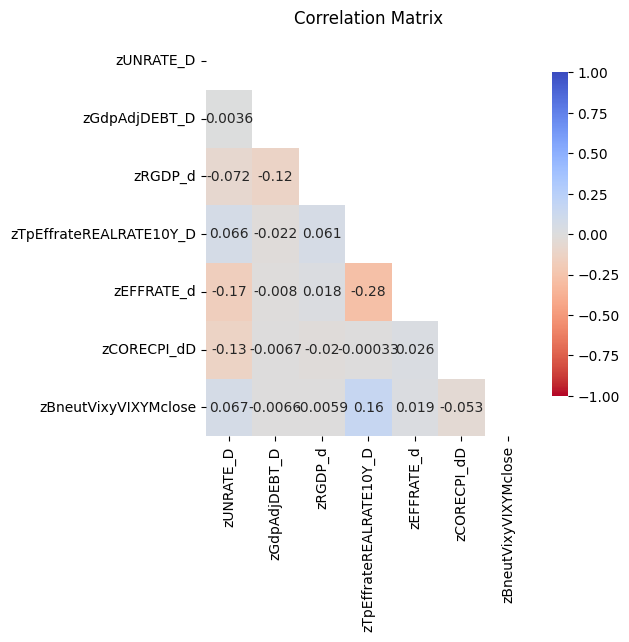

In [54]:
norm_factors_cm = corr_matrix(norm_factors, plot = True)
# base_factors_cm = corr_matrix(base_factors, plot = True)

In [37]:
# clustered corr matrix & dendrogram #
def clustered_corr_matrix(corr_matrix: pd.DataFrame = None, df: pd.DataFrame = None, method: str = 'ward', plot: bool = True, triangle: str = 'lower') -> pd.DataFrame:
    """
    Create a clustered correlation matrix and optionally plot it alongside a dendrogram

    Parameters:
    corr_matrix (pd.DataFrame): A precomputed correlation matrix. If provided, `df` is ignored.
    df (pd.DataFrame): Raw DataFrame from which to compute the correlation matrix if `corr_matrix` is not provided.
    method (str): The linkage method for hierarchical clustering (default is 'ward').
    plot (bool): If True, plot the dendrogram and reordered correlation matrix (default is True).
    triangle (str): Which triangle to display in the correlation matrix ('lower' or 'upper'). Defaults to 'lower'.

    Returns:
    pd.DataFrame: DataFrame containing the reordered correlation matrix.
    """
    # Validate input: either `corr_matrix` or `df` must be provided
    if corr_matrix is None and df is None:
        raise ValueError("Either `corr_matrix` or `df` must be provided.")

    # Compute the correlation matrix from `df` if not provided directly
    if corr_matrix is None:
        corr_matrix = df.corr()
        
    # Convert the correlation matrix to a distance matrix
    distance_matrix = 1 - corr_matrix.abs()

    # Perform hierarchical clustering
    linkage_matrix = linkage(squareform(distance_matrix), method=method)

    # Get the optimal order of the variables
    ordered_indices = leaves_list(linkage_matrix)

    # Reorder the correlation matrix
    reordered_corr_matrix = corr_matrix.iloc[ordered_indices, ordered_indices]

    if plot:
        fig, axes = plt.subplots(1, 2, figsize=(18, 8), gridspec_kw={'width_ratios': [1, 2]})

        # Plot the dendrogram
        dendrogram(linkage_matrix, labels=corr_matrix.columns[ordered_indices], ax=axes[0], orientation='right')
        axes[0].set_title("Dendrogram")

        # Mask the triangle for the correlation matrix plot
        mask = None
        if triangle == 'lower':
            mask = np.triu(np.ones_like(reordered_corr_matrix, dtype=bool))
        elif triangle == 'upper':
            mask = np.tril(np.ones_like(reordered_corr_matrix, dtype=bool))

        # Plot the reordered correlation matrix
        sns.heatmap(reordered_corr_matrix, annot=True, cmap='coolwarm_r', vmin=-1, vmax=1, mask=mask,
                    cbar_kws={"shrink": .8}, ax=axes[1])
        axes[1].set_title("Clustered Correlation Matrix")

        plt.tight_layout()
        plt.show()

    return reordered_corr_matrix

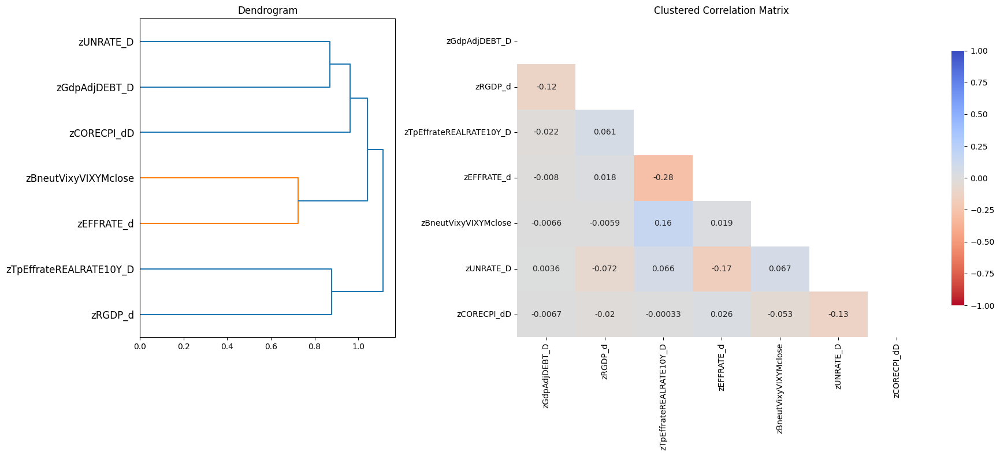

,zGdpAdjDEBT_D,zRGDP_d,zTpEffrateREALRATE10Y_D,zEFFRATE_d,zBneutVixyVIXYMclose,zUNRATE_D,zCORECPI_dD
zGdpAdjDEBT_D,1.000000,-0.122135,-0.021876,-0.007954,-0.006580,0.003637,-0.006690
zRGDP_d,-0.122135,1.000000,0.060584,0.017935,-0.005929,-0.072415,-0.020030
zTpEffrateREALRATE10Y_D,-0.021876,0.060584,1.000000,-0.275970,0.159053,0.065718,-0.000328
zEFFRATE_d,-0.007954,0.017935,-0.275970,1.000000,0.019342,-0.169752,0.026157
zBneutVixyVIXYMclose,-0.006580,-0.005929,0.159053,0.019342,1.000000,0.066838,-0.052577
zUNRATE_D,0.003637,-0.072415,0.065718,-0.169752,0.066838,1.000000,-0.129914
zCORECPI_dD,-0.006690,-0.020030,-0.000328,0.026157,-0.052577,-0.129914,1.000000


In [55]:
clustered_corr_matrix(corr_matrix=norm_factors_cm)

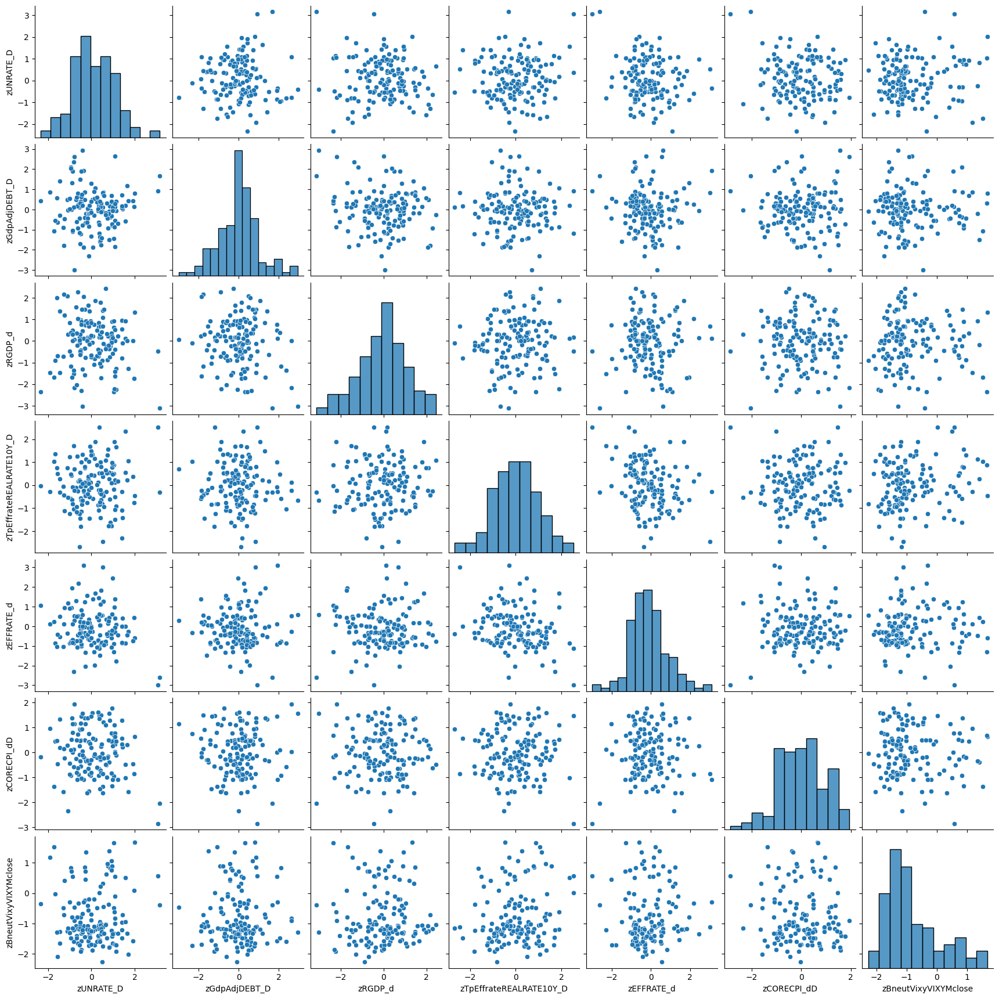

In [56]:
sns.pairplot(norm_factors)

# time series plots

In [256]:
# MATRIX PLOT FUNCT #

def matrix_plot(type: str,
                df: pd.DataFrame, 
                bin_no: Optional[int] = None, 
                lookback: int = 12, 
                reference_col: Optional[str] = None,
                dual: Optional[str] = None,
                multiple_series_def: Optional[List[List[str]]] = None):
    """
    Create a matrix plot of the specified type for all columns in the DataFrame or pairs of columns for rolling statistics.
    Optionally create dual plots side-by-side for each column if a second type is provided.
    If '#' is added to the type (e.g. 'ts#''), multiple series will be plotted per graph. Not compatible with dual.
    
    Parameters:
    type (str): The type of plot, takes the following strings: (Adding # at the end such as 'ts#' will enable multiple series per plot.)
        - 'hist' for histogram
        - 'box' for box plot
        - 'ts' for time series
        - 'qq' for qq plot
        - 'roll_corr' for rolling correlation
        - 'roll_vol' for rolling volatility
        - 'roll_beta' for rolling beta
    df (pd.DataFrame): The DataFrame to plot.
    bin_no (int): The number of bins for histogram (optional, default is 20).
    lookback (int): The lookback period for rolling calculations (optional, default is 12).
    reference_col (str): Reference column name for rolling calculations; if defined for 'roll_corr' or 'roll_beta' then all correlations or betas will be calculated against this column.
    dual (str): The second type of plot, None if desiring a single plot. ! Not implemented for 'roll_corr' or 'roll_beta' ! 
    multiple_series_def (List[List[str]]): List of lists specifying which time series should be grouped together in one subplot. (For ts#)

    Returns:
    None
    """

    multi_series = type.endswith('#')  
    base_type = type.rstrip('#') 

    if multi_series and dual:
        print('Multiple graphs per plot not compatible with dual plot.')
        return 

    if multiple_series_def is None and multi_series:
        print ('Multiple plots selected, but no configuration given. Defaulting to single-series plots.')
        multi_series = False

    num_cols = df.shape[1]

    # Special handling for rolling correlation & beta if no reference column is given
    if base_type in ['roll_corr', 'roll_beta'] and reference_col is None:
        num_plot_cols = num_cols
        num_plot_rows = num_cols
    else:
        if multi_series:
            num_plot_cols = int(np.ceil(np.sqrt(num_cols / 2)))  # Adjust for grouping
            num_plot_rows = int(np.ceil((num_cols / 2) / num_plot_cols))
        else:
            num_plot_cols = int(np.ceil(np.sqrt(num_cols)))
            num_plot_rows = int(np.ceil(num_cols / num_plot_cols))

    fig, axs = plt.subplots(num_plot_rows, num_plot_cols, figsize=(5 * num_plot_cols, 4 * num_plot_rows))

    def plot_function(ax, plot_type, data, col_names=None, reference_data=None):
        """
        Generalized function to plot different types of graphs
        """
        if isinstance(data, pd.DataFrame):  # Multiple series case
            for col in data.columns:
                label = col if col_names is None else col_names.get(col, col)  # Use column name or mapping
                if plot_type == 'hist':
                    ax.hist(data[col], bins=bin_no or 20, alpha=0.5, label=label)  # Semi-transparent overlay
                elif plot_type == 'box':
                    ax.boxplot(data[col], positions=[data.columns.get_loc(col)], labels=[label])
                elif plot_type == 'ts':
                    ax.plot(data.index, data[col], label=label)
                elif plot_type == 'qq':
                    sm.qqplot(data[col], line='45', ax=ax, fit=True)
                elif plot_type == 'roll_corr':
                    roll_corr_series = rolling_corr(data[col], reference_data, lookback, plot=False)
                    ax.plot(roll_corr_series.index, roll_corr_series, label=label)
                elif plot_type == 'roll_vol':
                    roll_vol_series = rolling_vol(data[col], lookback, plot=False)
                    ax.plot(roll_vol_series.index, roll_vol_series, label=label)
                elif plot_type == 'roll_beta':
                    roll_beta_series = rolling_beta(reference_data, data[col], lookback, plot=False)
                    ax.plot(roll_beta_series.index, roll_beta_series, label=label)
        else:  # Single series case
            label = col_names if isinstance(col_names, str) else None
            if plot_type == 'hist':
                ax.hist(data, bins=bin_no or 20, alpha=0.5, label=label)
            elif plot_type == 'box':
                ax.boxplot(data)
            elif plot_type == 'ts':
                ax.plot(data.index, data, label=label)
            elif plot_type == 'qq':
                sm.qqplot(data, line='45', ax=ax, fit=True)
            elif plot_type == 'roll_corr':
                roll_corr_series = rolling_corr(data, reference_data, lookback, plot=False)
                ax.plot(roll_corr_series.index, roll_corr_series, label=label)
            elif plot_type == 'roll_vol':
                roll_vol_series = rolling_vol(data, lookback, plot=False)
                ax.plot(roll_vol_series.index, roll_vol_series, label=label)
            elif plot_type == 'roll_beta':
                roll_beta_series = rolling_beta(reference_data, data, lookback, plot=False)
                ax.plot(roll_beta_series.index, roll_beta_series, label=label)

        # Always display legend if multiple series exist
        if isinstance(data, pd.DataFrame) or label:
            ax.legend(loc="best", fontsize="small")

    if type in ['roll_corr', 'roll_beta'] and reference_col is None:
        for i, col_name in enumerate(df.columns):
            for j, ref_col_name in enumerate(df.columns):
                ax = axs[i, j]
                plot_function(ax, type, df[col_name], col_name, df[ref_col_name])
                ax.set_title(f'{col_name} vs {ref_col_name}')
    else:
        if multi_series:
            grouped_cols = multiple_series_def if multiple_series_def else [[col] for col in df.columns]

            for i, group in enumerate(grouped_cols):
                row, col = divmod(i, num_plot_cols)
                ax = axs[row, col] if num_plot_rows > 1 else axs[col]

                valid_cols = [col for col in group if col in df.columns]
                if not valid_cols:
                    continue

                df_subset = df[valid_cols]  
                plot_function(ax, base_type, df_subset) 
                ax.set_title(" vs ".join(valid_cols))
        else:
            for i, col_name in enumerate(df.columns):
                row = i // num_plot_cols
                col = i % num_plot_cols
                
                ax = axs[row, col] if num_plot_rows > 1 else axs[col]
                ax.set_title(col_name)
                
                if dual:
                    ax.set_xticks([])
                    ax.set_yticks([])
                    ax.set_frame_on(False)
                    ax_left = ax.inset_axes([0.05, 0.1, 0.42, 0.8])
                    ax_right = ax.inset_axes([0.53, 0.1, 0.42, 0.8])
                    plot_function(ax_left, type, df[col_name], col_name)
                    plot_function(ax_right, dual, df[col_name], col_name)
                else:
                    plot_function(ax, type, df[col_name], col_name, df[reference_col] if reference_col else None)

    plt.tight_layout(pad=2.0)
    plt.show()
    

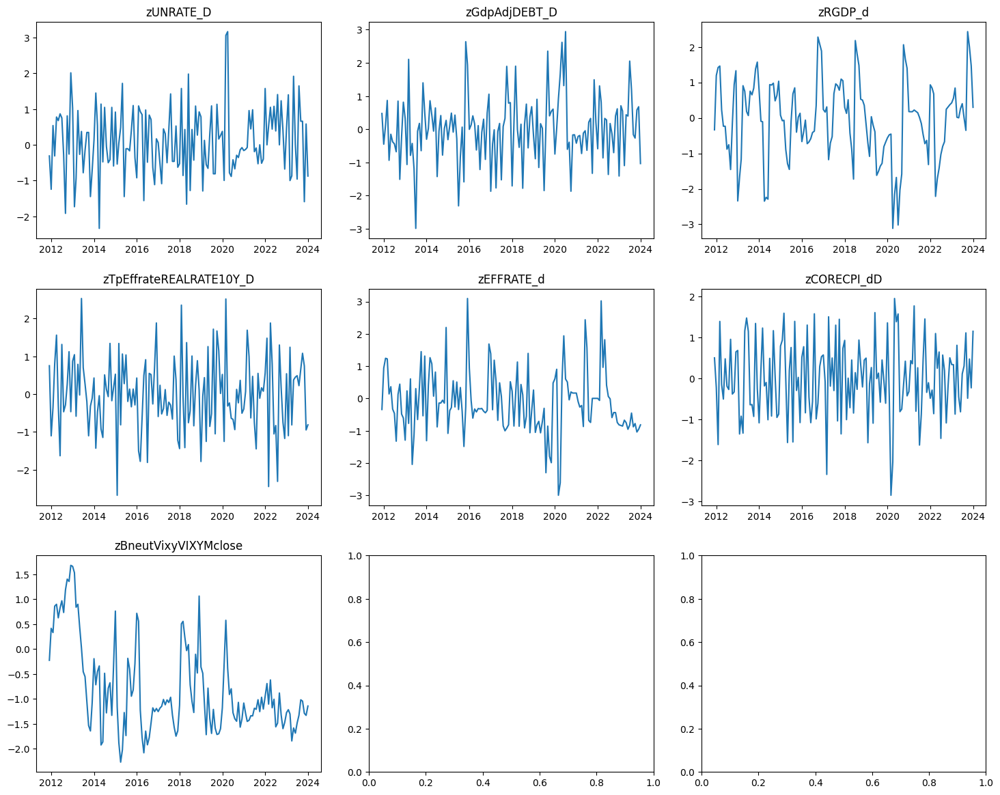

In [58]:
matrix_plot('ts', df=norm_factors)

# stat summary

In [59]:
# DESCRIBE DF #
def describe_df(df : pd.DataFrame) -> None:
    """
    Display a descriptive summary of all columns in the DataFrame

    Parameters:
    df (pd.DataFrame): The input DataFrame

    Returns:
    None
    """
    describe_df = pd.DataFrame()
    for col in df:
        desc = df[col].describe().transpose()
        desc.name = col
        describe_df = pd.concat([describe_df, desc], axis=1)
    display(describe_df)

In [60]:
describe_df(norm_factors)

,zUNRATE_D,zGdpAdjDEBT_D,zRGDP_d,zTpEffrateREALRATE10Y_D,zEFFRATE_d,zCORECPI_dD,zBneutVixyVIXYMclose
count,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000,146.000000
mean,0.107987,0.011859,-0.044973,0.009734,-0.114542,-0.003223,-0.802388
std,0.941681,0.990675,1.109678,0.987850,0.971603,0.925713,0.897687
min,-2.334203,-2.986629,-3.113525,-2.678267,-2.994421,-2.852796,-2.270827
25%,-0.528045,-0.581837,-0.704074,-0.637594,-0.765058,-0.645772,-1.399347
50%,0.022744,0.034566,0.025658,-0.002244,-0.273224,-0.047028,-1.100601
75%,0.780541,0.487508,0.730720,0.633702,0.410223,0.567628,-0.369862
max,3.162129,2.939807,2.428267,2.532886,3.094386,1.944645,1.675838


# boxplots

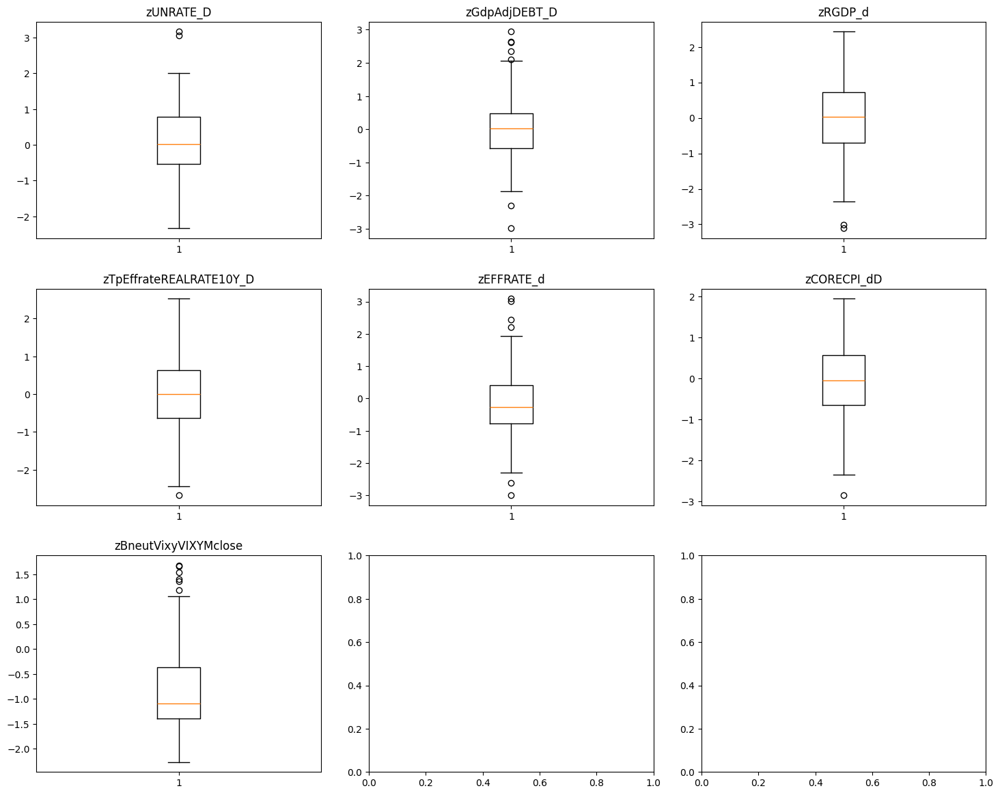

In [61]:
matrix_plot('box', df=norm_factors)

# histograms

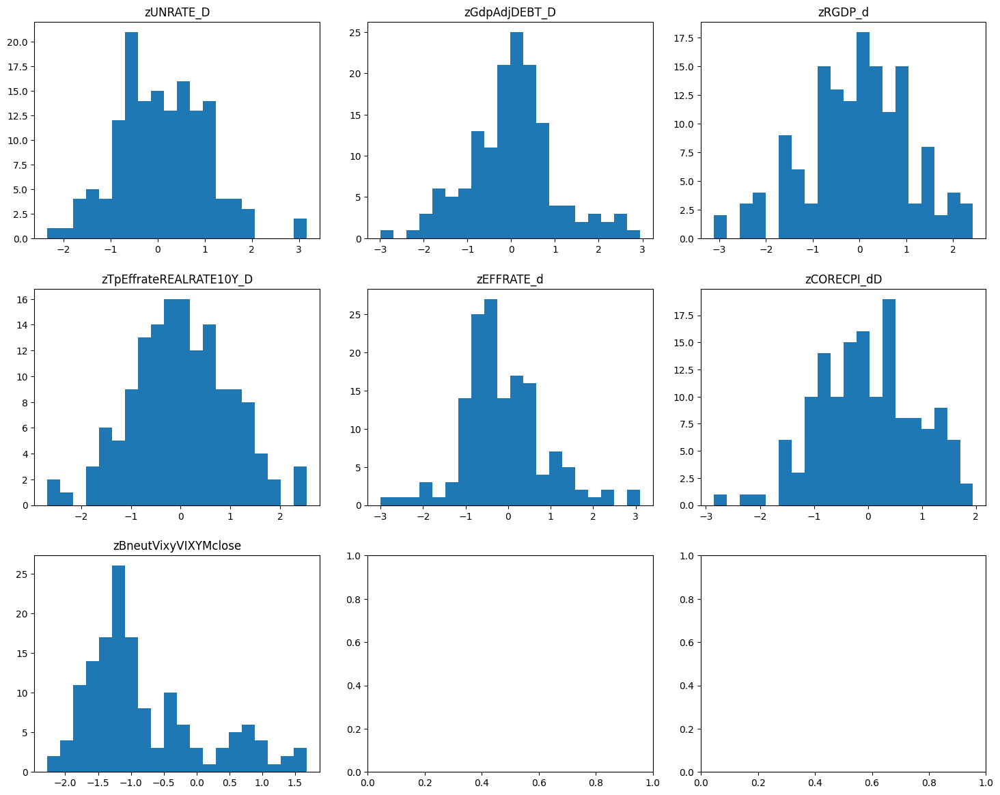

In [62]:
matrix_plot('hist', df=norm_factors, bin_no=20)

# qq plots

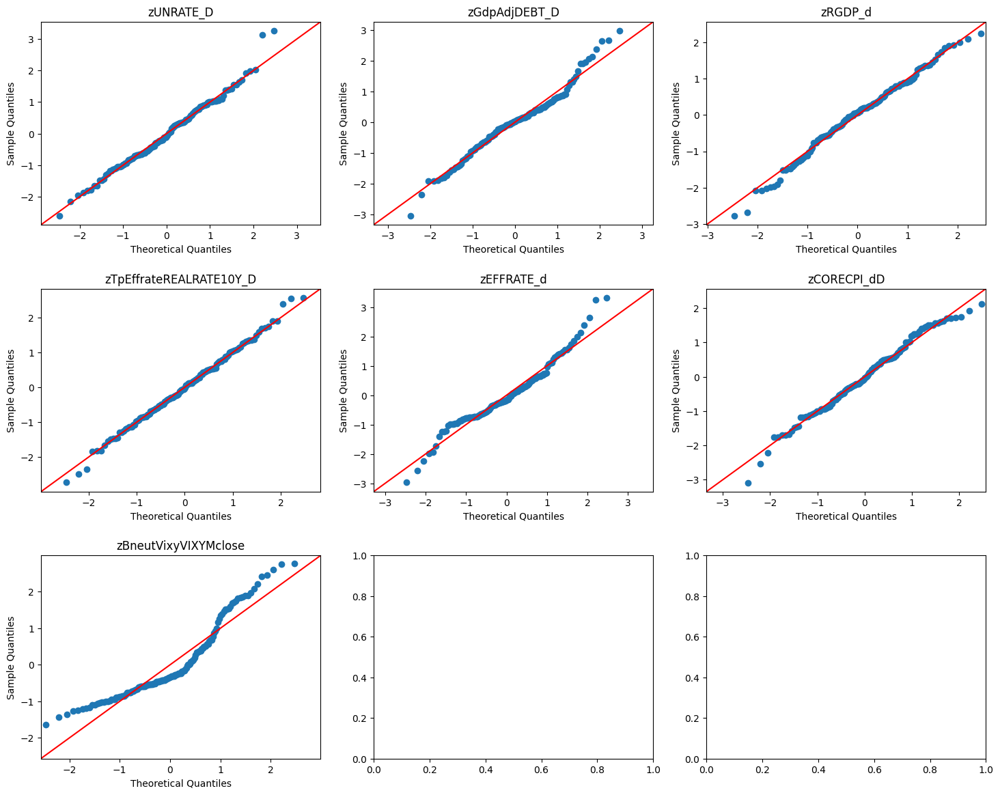

In [63]:
matrix_plot('qq', df=norm_factors.dropna())

# rollingn betas and rolling corrs

In [ ]:
# MA , ROLLING BETA, CORR, VOL FUNCTS #

import matplotlib.pyplot as plt
import io
import contextlib
import pandas as pd
import numpy as np
from statsmodels.regression.rolling import RollingOLS
from statsmodels.tools.tools import add_constant
from typing import List, Callable
from functools import partial

def ma(input: Union[pd.DataFrame, pd.Series], period: int = 3, ma_type: str = 'sma') -> Union[pd.DataFrame, pd.Series]:
    """
    Calculate the moving average of the DataFrame or Series

    Parameters:
    input (Union[pd.DataFrame, pd.Series]): The input DataFrame or Series
    period (int): The lookback period for the moving average
    ma_type (str): The type of moving average, takes the following strings:
        - 'sma' for simple moving average
        - 'ema' for exponential moving average

    Returns:
    Union[pd.DataFrame, pd.Series]: DataFrame or Series data as a moving average of the input
    """
    def get_series_ma(series: pd.Series, period: int, ma_type: str) -> pd.Series:
        """
        Calculate the moving average for a single Series

        Parameters:
        series (pd.Series): The input Series
        period (int): The lookback period for the moving average
        ma_type (str): The type of moving average, see above

        Returns:
        pd.Series: Series data as a moving average of the input
        """
        if ma_type in (None, 'sma'):
            return series.rolling(period).mean()
        elif ma_type == 'ema':
            return series.ewm(span=period, adjust=False).mean()
        else:
            raise ValueError("ma_type must be either 'sma' or 'ema'")
    if isinstance(input, pd.DataFrame):
        result = pd.DataFrame()
        for col in input.columns:
            result[col] = get_series_ma(input[col], period, ma_type)
        return result
    elif isinstance(input, pd.Series):
        return get_series_ma(input, period, ma_type)
    else:
        raise TypeError("Input must be a pandas DataFrame or Series")

# simple function gets year/motnhs we want to output in charts names
def lkbk_ym(lookback: int) -> str:
    """
    Convert lookback period to a readable string format, used for chart titles

    Parameters:
    lookback (int): The lookback period in months

    Returns:
    str: Readable string representation of the lookback period
    """
    years = lookback // 12 if lookback % 12 == 0 else None
    months = lookback if years is None else None
    out = years if years is not None else months
    out_type = '-year' if years is not None else '-month'
    return str(out) + out_type

def rolling_beta(x: pd.Series, y: pd.Series, lookback: int = 12, plot: bool = True) -> pd.DataFrame:
    """
    Calculate and optionally plot the rolling beta of series y against series x

    Parameters:
    x (pd.Series): The independent series
    y (pd.Series): The dependent series
    lookback (int): The lookback period for calculating rolling beta
    plot (bool): If True, plot the rolling beta (default is True)

    Returns:
    pd.Series: Series with rolling beta values
    """
    lagged_x_with_const = add_constant(x)
    model = RollingOLS(y, lagged_x_with_const, window=lookback, min_nobs=lookback)
    rres = model.fit()
    rolling_beta = rres.params[x.name]
    if plot:
        plt.figure(figsize=(12, 6))
        plt.axhline(y=0, c='gray', ls='-', lw=2, alpha=0.2)
        rolling_beta.plot()
        plt.title(f'{lkbk_ym(lookback)} Rolling Beta of {y.name} to {x.name}')
        plt.xlabel('Date')
        plt.ylabel('Beta')
        plt.show()
    return rolling_beta

def rolling_corr(x : pd.Series, y : pd.Series, lookback : int = 12, plot : bool = True) -> pd.Series:
    """
    Calculate and optionally plot the rolling correlation between two series

    Parameters:
    x (pd.Series): The first series
    y (pd.Series): The second series
    lookback (int): The lookback period for calculating rolling correlation
    plot (bool): If True, plot the rolling correlation (default is True)

    Returns:
    pd.Series: Series with rolling correlation values
    """
    output = x.rolling(window=lookback).corr(y)
    if plot:
        plt.figure(figsize=(12,6))
        plt.axhline(y=0, c='gray', ls='-', lw=2, alpha=0.2)
        output.plot()
        plt.title(f'{lkbk_ym(lookback)} Rolling Correlation between {x.name} and {y.name}')
        plt.xlabel('Date')
        plt.ylabel('Correlation')
        plt.show()
    return output

def rolling_vol(x : pd.Series, lookback : int = 12, plot : bool = True) -> pd.Series:
    """
    Calculate and optionally plot the rolling volatility of a series

    Parameters:
    x (pd.Series): The input series.
    lookback (int): The lookback period for calculating rolling volatility
    plot (bool): If True, plot the rolling volatility (default is True)

    Returns:
    pd.Series: Series with rolling volatility values
    """
    output = x.rolling(window=lookback).std()
    if plot:
        plt.figure(figsize=(12,6))
        output.plot()
        plt.title(f'{lkbk_ym(lookback)} {x.name} Rolling Vol ')
        plt.xlabel('Date')
        plt.ylabel('Vol')
        plt.show()
    return output

def apply_lags(func: Callable[[pd.Series, pd.Series], pd.Series], x: pd.Series, y: pd.Series, lags: List[int]) -> pd.DataFrame:
    """
    Apply a function to the series with different lags

    Parameters:
    func (Callable[[pd.Series, pd.Series], pd.Series]): The function to apply
    x (pd.Series): The first series
    y (pd.Series): The second series
    lags (List[int]): List of lag values to apply

    Returns:
    pd.DataFrame: DataFrame with the results for each lag
    """
    output = {}
    for i in lags:
        lagged_x = x.shift(i)
        lagged_x.name = f'{x.name}-lag{i}' if i != 0 else x.name
        col_name = f'{lagged_x.name}-{y.name}'
        result = func(lagged_x, y)
        output[col_name] = result
    return pd.DataFrame(output)

def rolling_correlation_matrix(df: pd.DataFrame, window: int = 60):
    """
    Computes rolling correlations for all unique factor pairs in the DataFrame.
    
    Parameters:
        df (pd.DataFrame): Input DataFrame where columns are macro factors.
        window (int): Rolling window size (default 60 time periods).

    Returns:
        pd.DataFrame: A DataFrame where each column is the rolling correlation of a factor pair.
    """
    factor_pairs = list(itertools.combinations(df.columns, 2))
    rolling_corr_df = pd.DataFrame(index=df.index)

    for factor1, factor2 in factor_pairs:
        rolling_corr = df[factor1].rolling(window=window).corr(df[factor2])
        rolling_corr_df[f'corr_{factor1}_{factor2}'] = rolling_corr

    return rolling_corr_df

In [76]:
norm_factors_rcorr = rolling_correlation_matrix(df=norm_factors)
norm_factors_rvol = pd.DataFrame()
for factor in norm_factors.columns:
    norm_factors_rvol[f'vol_{factor}'] = norm_factors[factor].rolling(window=12).std()

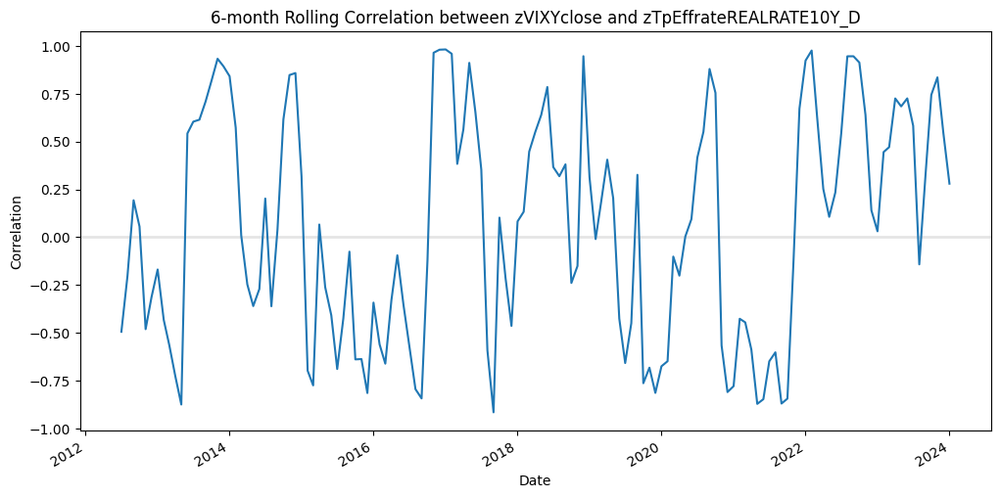

,zVIXYclose-zTpEffrateREALRATE10Y_D
2011-12-01,NaN
2012-01-01,NaN
2012-02-01,NaN
2012-03-01,NaN
2012-04-01,NaN
...,...
2023-09-01,0.316254
2023-10-01,0.743755
2023-11-01,0.834920
2023-12-01,0.545798


In [68]:
# example use of rolling corr & rolling beta
rolling_corr_partial = partial(rolling_corr, lookback=6, plot=True)
rolling_beta_partial = partial(rolling_beta, lookback=6, plot=True)

display(apply_lags(rolling_corr_partial, ma(norm_data['zVIXYclose'],3), ma(norm_data['zTpEffrateREALRATE10Y_D'],3), lags=[0]))
# display(apply_lags(rolling_beta_partial, data['CPI'], data['HY_SPREAD_Close'], lags=[0,12]))

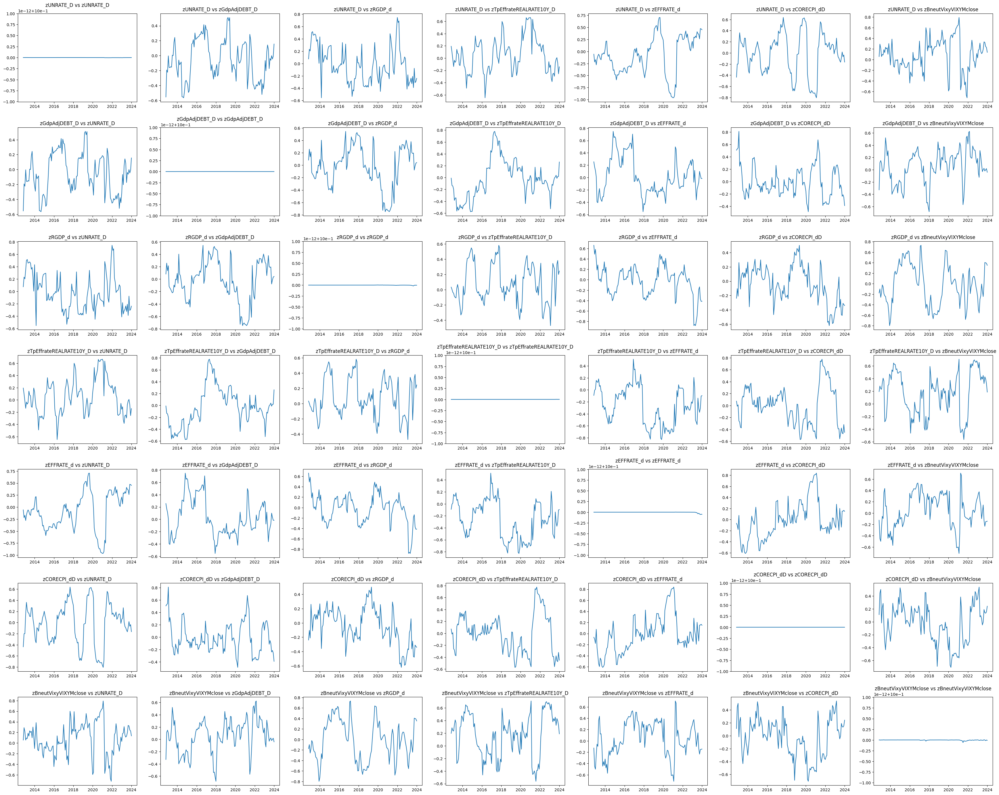

In [69]:
matrix_plot(type='roll_corr',df=norm_factors)

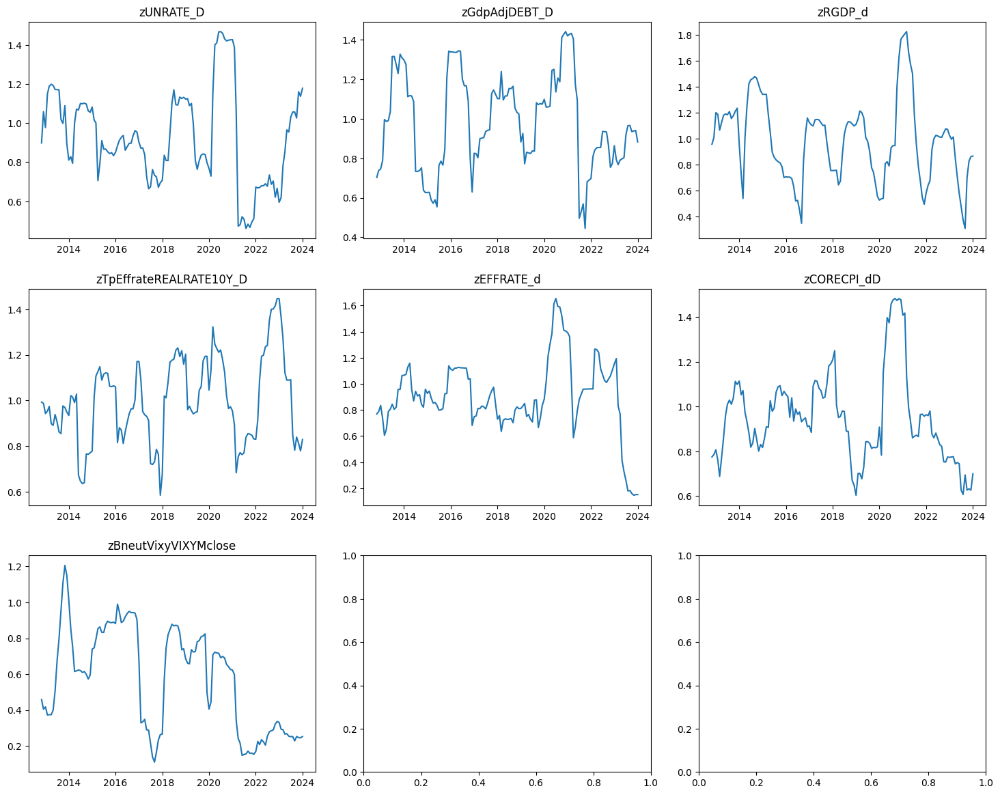

In [73]:
matrix_plot(type='roll_vol',df=norm_factors)

# regressions

In [ ]:
# DF PAIRWISE REGRESSION FUNCT # 
def regress_dataframe(df: pd.DataFrame):
    """
    Perform pairwise regression on all columns in the DataFrame and display the results in a matrix format

    Parameters:
    df (pd.DataFrame): The input DataFrame

    Returns:
    None
    """
    # Initialise empty results matrix
    results_matrix = pd.DataFrame(index=df.columns, columns=df.columns)
    
    # Iterate over all pairs of columns for regression
    for col_x in df.columns:
        for col_y in df.columns:
            if col_x != col_y:
                X = df[col_x]
                y = df[col_y]
                
                # Fit model with coefficient
                X = sm.add_constant(X)
                model = sm.OLS(y, X).fit()
                
                # Extract parameters
                t_values = model.tvalues
                p_values = model.pvalues
                conf_int = model.conf_int(alpha=0.02)
                
                # Create and store summary string
                summary = f"coef: {model.params.iloc[1]:.2f}, t: {t_values.iloc[1]:.2f}"
                results_matrix.at[col_y, col_x] = summary
    
    # Make sure display option shows full text in cells
    pd.set_option('display.max_colwidth', None) 
    print("Regression Results Matrix:")
    display(results_matrix)

In [ ]:
regress_dataframe(norm_data.dropna())

Regression Results Matrix:


,zUNRATE_DIFF1,zCPI_DIFF2,zCORECPI_DIFF2,zEFFRATE_DIFF2,zBERATE10Y,zGOLDclose,zVIX1Mclose,zSPYTRclose,zDBEclose,zDBAclose,zDBBclose,zGdpAdjDEBT_DIFF1,zRGDP_DIFF1,zREALRATE10Y_DIFF1,zSpytrBneutMSCIEMclose,zBneutVix6MVIX1M6M,zVnqBneutRWXclose,zSpytrBneutHYGclose,zSpytrBneutLQDclose,zSpytrBneutVNQclose
zUNRATE_DIFF1,NaN,"coef: -0.08, t: -1.05","coef: -0.11, t: -1.46","coef: -0.02, t: -0.32","coef: -0.08, t: -1.28","coef: 0.00, t: 0.02","coef: 0.05, t: 0.68","coef: -0.08, t: -1.07","coef: -0.08, t: -1.04","coef: -0.13, t: -1.72","coef: -0.13, t: -1.66","coef: -0.02, t: -0.23","coef: -0.09, t: -1.28","coef: 0.03, t: 0.36","coef: 0.01, t: 0.15","coef: -0.10, t: -1.35","coef: -0.09, t: -1.19","coef: 0.00, t: 0.01","coef: -0.03, t: -0.40","coef: 0.06, t: 0.74"
zCPI_DIFF2,"coef: -0.08, t: -1.05",NaN,"coef: 0.22, t: 2.87","coef: 0.12, t: 1.67","coef: 0.01, t: 0.13","coef: -0.03, t: -0.34","coef: -0.14, t: -1.87","coef: 0.20, t: 2.67","coef: 0.34, t: 4.86","coef: 0.14, t: 1.80","coef: 0.21, t: 2.73","coef: -0.02, t: -0.25","coef: -0.01, t: -0.20","coef: -0.14, t: -1.84","coef: 0.09, t: 1.17","coef: 0.08, t: 1.12","coef: 0.16, t: 2.17","coef: -0.03, t: -0.44","coef: -0.11, t: -1.45","coef: -0.13, t: -1.70"
zCORECPI_DIFF2,"coef: -0.11, t: -1.46","coef: 0.21, t: 2.87",NaN,"coef: 0.03, t: 0.49","coef: 0.01, t: 0.22","coef: 0.03, t: 0.42","coef: -0.02, t: -0.34","coef: 0.02, t: 0.22","coef: 0.12, t: 1.66","coef: 0.02, t: 0.25","coef: 0.12, t: 1.54","coef: -0.06, t: -0.83","coef: -0.01, t: -0.19","coef: 0.07, t: 0.87","coef: 0.08, t: 1.07","coef: 0.07, t: 1.03","coef: 0.09, t: 1.25","coef: 0.06, t: 0.83","coef: 0.02, t: 0.27","coef: 0.01, t: 0.08"
zEFFRATE_DIFF2,"coef: -0.03, t: -0.32","coef: 0.14, t: 1.67","coef: 0.04, t: 0.49",NaN,"coef: 0.09, t: 1.37","coef: -0.08, t: -0.99","coef: -0.08, t: -1.02","coef: 0.08, t: 0.98","coef: 0.16, t: 2.00","coef: 0.12, t: 1.52","coef: 0.10, t: 1.21","coef: 0.14, t: 1.76","coef: -0.00, t: -0.02","coef: -0.06, t: -0.76","coef: 0.01, t: 0.11","coef: 0.19, t: 2.38","coef: 0.12, t: 1.52","coef: 0.04, t: 0.46","coef: -0.01, t: -0.17","coef: 0.02, t: 0.28"
zBERATE10Y,"coef: -0.13, t: -1.28","coef: 0.01, t: 0.13","coef: 0.02, t: 0.22","coef: 0.13, t: 1.37",NaN,"coef: -0.20, t: -2.02","coef: 0.10, t: 1.02","coef: -0.03, t: -0.34","coef: 0.21, t: 2.21","coef: 0.00, t: 0.03","coef: -0.02, t: -0.20","coef: -0.19, t: -2.02","coef: 0.09, t: 1.02","coef: 0.19, t: 2.02","coef: -0.07, t: -0.72","coef: 0.02, t: 0.22","coef: -0.08, t: -0.87","coef: -0.07, t: -0.71","coef: -0.32, t: -3.45","coef: 0.08, t: 0.80"
zGOLDclose,"coef: 0.00, t: 0.02","coef: -0.03, t: -0.34","coef: 0.03, t: 0.42","coef: -0.07, t: -0.99","coef: -0.12, t: -2.02",NaN,"coef: -0.03, t: -0.46","coef: 0.06, t: 0.82","coef: 0.06, t: 0.87","coef: 0.16, t: 2.21","coef: 0.28, t: 3.74","coef: -0.03, t: -0.43","coef: -0.05, t: -0.77","coef: -0.17, t: -2.27","coef: 0.27, t: 3.72","coef: 0.03, t: 0.41","coef: 0.21, t: 2.86","coef: 0.24, t: 3.17","coef: 0.34, t: 4.93","coef: 0.15, t: 2.02"
zVIX1Mclose,"coef: 0.05, t: 0.68","coef: -0.15, t: -1.87","coef: -0.03, t: -0.34","coef: -0.07, t: -1.02","coef: 0.06, t: 1.02","coef: -0.04, t: -0.46",NaN,"coef: -0.69, t: -12.44","coef: -0.34, t: -4.70","coef: -0.14, t: -1.77","coef: -0.39, t: -5.20","coef: 0.00, t: 0.01","coef: 0.05, t: 0.69","coef: 0.22, t: 2.92","coef: 0.01, t: 0.17","coef: -0.37, t: -5.34","coef: -0.29, t: -3.96","coef: 0.06, t: 0.75","coef: 0.01, t: 0.12","coef: -0.06, t: -0.72"
zSPYTRclose,"coef: -0.09, t: -1.07","coef: 0.21, t: 2.67","coef: 0.02, t: 0.22","coef: 0.07, t: 0.98","coef: -0.02, t: -0.34","coef: 0.07, t: 0.82","coef: -0.70, t: -12.44",NaN,"coef: 0.42, t: 6.02","coef: 0.21, t: 2.78","coef: 0.48, t: 6.75","coef: -0.09, t: -1.16","coef: 0.02, t: 0.23","coef: -0.31, t: -4.16","coef: -0.10, t: -1.29","coef: 0.33, t: 4.59","coef: 0.31, t: 4.31","coef: -0.20, t: -2.58","coef: -0.13, t: -1.73","coef: -0.08, t: -1.09"
zDBEclose,"coef: -0.08, t: -1.04","coef: 0.36, t: 4.86","coef: 0.13, t: 1.66","coef:

# stepwise regression

In [ ]:
# STEPWISE REGRESSION FUNCT #
def stepwise_regression(df : pd.DataFrame, response : Union[str, pd.Series]) -> pd.DataFrame:
    """
    Perform stepwise regression to select the best predictors for the response variable

    Parameters:
    df (pd.DataFrame): The input DataFrame containing predictors and response
    response (Union[str, pd.Series]): The response variable name or Series

    Returns:
    pd.DataFrame: DataFrame summarizing the stepwise regression results
    """
    # If response is a Series, get its name
    if isinstance(response, pd.Series):
        response = response.name
    df.dropna(inplace=True) 
    
    # Get the list of valid predictors, excluding the response variable
    predictors = df.columns.tolist()
    predictors.remove(response)

    # Definitions for loop
    initial_list = []
    results_summary = pd.DataFrame(columns=["AIC", "R²", "Equation"])
    best_aic = float('inf')

    # Loop through every valid predictor and find the lowest AIC
    while predictors:
        aic_with_candidates = []
        for predictor in predictors:
            predictors_with_candidate = initial_list + [predictor]
            X = df[predictors_with_candidate]
            X = sm.add_constant(X)
            y = df[response]

            # Fit OLS regression model
            model = sm.OLS(y, X).fit()
            aic_with_candidates.append((model.aic, predictor, model))
        
        # Sort candidates by AIC
        aic_with_candidates.sort(key=lambda x: x[0])
        best_new_aic, best_predictor, best_model = aic_with_candidates[0]
        
        # If new AIC better, update the model
        if best_new_aic < best_aic:
            best_aic = best_new_aic
            initial_list.append(best_predictor)
            predictors.remove(best_predictor)
            
            # Create the regression equation for display and add it to the row
            equation = f"{response} = {best_model.params.iloc[0]:.4f} + " + " + ".join(
                [f"{best_model.params.iloc[i + 1]:.4f}*{name}" for i, name in enumerate(initial_list)])
            new_row = pd.DataFrame({
                "AIC": [best_aic],
                "R²": [best_model.rsquared],
                "Equation": [equation]
            })
            results_summary = pd.concat([results_summary, new_row], ignore_index=True)
        else:
            break

    return results_summary

In [ ]:
# equities
us_eq = norm_data['zSPYTRclose']

# stepwise regression
pd.set_option('display.max_colwidth', None)
stepwise_regression(norm_data, us_eq)

C:\Users\lucas\AppData\Local\Temp\ipykernel_25280\3764464099.py:58: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_summary = pd.concat([results_summary, new_row], ignore_index=True)


,AIC,R²,Equation
0,358.970456,0.482580,zSPYTRclose = -0.0115 + -0.7000*zVIX1Mclose
1,344.455404,0.531025,zSPYTRclose = -0.0089 + -0.6105*zVIX1Mclose + 0.2481*zDBBclose
2,334.290504,0.563783,zSPYTRclose = -0.0138 + -0.5917*zVIX1Mclose + 0.2705*zDBBclose + -0.1882*zSpytrBneutHYGclose
3,328.370199,0.583871,zSPYTRclose = -0.0091 + -0.5568*zVIX1Mclose + 0.2102*zDBBclose + -0.2002*zSpytrBneutHYGclose + 0.1611*zDBEclose
4,323.821167,0.599780,zSPYTRclose = -0.0113 + -0.5516*zVIX1Mclose + 0.2154*zDBBclose + -0.2154*zSpytrBneutHYGclose + 0.1680*zDBEclose + -0.1226*zGdpAdjDEBT_DIFF1
5,319.778284,0.613920,zSPYTRclose = -0.0156 + -0.5356*zVIX1Mclose + 0.2608*zDBBclose + -0.1716*zSpytrBneutHYGclose + 0.1689*zDBEclose + -0.1173*zGdpAdjDEBT_DIFF1 + -0.1381*zSpytrBneutMSCIEMclose
6,314.232093,0.630878,zSPYTRclose = -0.0177 + -0.5139*zVIX1Mclose + 0.2464*zDBBclose + -0.1544*zSpytrBneutHYGclose + 0.1598*zDBEclose + -0.1241*zGdpAdjDEBT_DIFF1 + -0.1629*zSpytrBneutMSCIEMclose + -0.1395*zREALRATE10Y_DIFF1
7,313.442176,0.636958,zSPYTRclose = -0.0200 + -0.4827*zVIX1Mclose + 0.2506*zDBBclose + -0.1603*zSpytrBneutHYGclose + 0.1504*zDBEclose + -0.1243*zGdpAdjDEBT_DIFF1 + -0.1684*zSpytrBneutMSCIEMclose + -0.1375*zREALRATE10Y_DIFF1 + 0.0842*zBneutVix6MVIX1M6M
8,312.597334,0.643054,zSPYTRclose = -0.0220 + -0.4662*zVIX1Mclose + 0.2367*zDBBclose + -0.1644*zSpytrBneutHYGclose + 0.1359*zDBEclose + -0.1175*zGdpAdjDEBT_DIFF1 + -0.2006*zSpytrBneutMSCIEMclose + -0.1215*zREALRATE10Y_DIFF1 + 0.0861*zBneutVix6MVIX1M6M + 0.0957*zVnqBneutRWXclose


# factor-mimicking

In [ ]:
import numpy as np
import pandas as pd
from scipy.optimize import minimize

def minimum_tracking_error_portfolio(assets_df: pd.DataFrame, factors_df: pd.DataFrame, plot: bool = True):
    """
    Constructs a minimum tracking error portfolio that best mimics given factors.

    Parameters:
    - assets_df (pd.DataFrame): DataFrame of investible asset returns (rows = time periods, columns = assets).
    - factors_df (pd.DataFrame): DataFrame of factor return series to be mimicked (rows = time periods, columns = factors).

    Returns:
    - portfolio_weights (pd.DataFrame): DataFrame of asset weights for each factor-mimicking portfolio.
    - synthetic_factors (pd.DataFrame): DataFrame of synthetic factor returns.
    - evaluation_metrics (pd.DataFrame): DataFrame with performance metrics (Correlation, Tracking Error, MSE, R-Squared).
    """

    # Ensure common index
    common_index = assets_df.index.intersection(factors_df.index)
    assets_df, factors_df = assets_df.loc[common_index], factors_df.loc[common_index]

    if len(common_index) == 0:
        print("No common dates found. Returning empty DataFrames.")
        return pd.DataFrame(), pd.DataFrame(), pd.DataFrame()

    num_assets = assets_df.shape[1]
    # num_factors = factors_df.shape[1] # unused

    portfolio_weights = pd.DataFrame(index=assets_df.columns, columns=factors_df.columns)
    synthetic_factors = pd.DataFrame(index=factors_df.index, columns=factors_df.columns)

    for factor in factors_df.columns:
        factor_series = factors_df[factor]

        def tracking_error(weights):
            portfolio_return = assets_df.values @ weights 
            return np.var(portfolio_return - factor_series.values)
        
        constraints = ({'type': 'eq', 'fun': lambda w: np.sum(w) - 1})
        initial_weights = np.ones(num_assets) / num_assets

        # Short selling allowed?
        # bounds = [(0, 1) for _ in range(num_assets)]  # No short-selling
        bounds = None # Short-selling

        # Optimise
        result = minimize(tracking_error, initial_weights, constraints=constraints, bounds=bounds, method='SLSQP')

        if result.success:
            optimal_weights = result.x
            portfolio_weights[factor] = optimal_weights
            synthetic_factors[factor] = assets_df.values @ optimal_weights 
        else:
            print(f"Optimisation failed for factor {factor}. Assigning NaN weights.")
            portfolio_weights[factor] = np.nan
            synthetic_factors[factor] = np.nan

    portfolio_weights = portfolio_weights.T # Transpose for consistency

    evaluation_metrics = pd.DataFrame(index=factors_df.columns, columns=["Correlation", "Tracking Error", "MSE", "R-Squared"])

    for factor in factors_df.columns:
        actual = factors_df[factor]
        synthetic = synthetic_factors[factor]

        if synthetic.isna().all():
            evaluation_metrics.loc[factor] = [np.nan] * 4
            continue

        correlation = actual.corr(synthetic)
        tracking_error = ((actual - synthetic) ** 2).mean() ** 0.5
        mse = ((actual - synthetic) ** 2).mean()
        # R-squared
        residual_sum = ((actual - synthetic) ** 2).sum()
        total_sum = ((actual - actual.mean()) ** 2).sum()
        r_squared = 1 - (residual_sum / total_sum)

        evaluation_metrics.loc[factor] = [correlation, tracking_error, mse, r_squared]

    synthetic_factors.columns = [col + '_synth' for col in synthetic_factors.columns]
    if plot: 
        merged_df = pd.merge(factors_df, synthetic_factors, left_index=True, right_index=True, how="inner")
        multiple_series_def = [[col, col + "_synth"] for col in factors_df.columns if col + "_synth" in merged_df.columns]
        matrix_plot(type='ts#', df=merged_df, multiple_series_def=multiple_series_def)

    return portfolio_weights.astype(float), synthetic_factors.astype(float), evaluation_metrics.astype(float)


In [ ]:
def rolling_tracking_error_portfolio(assets_df: pd.DataFrame, factors_df: pd.DataFrame, rebalance_freq: int = 1, plot: bool = True):
    """
    Constructs a rolling minimum tracking error portfolio that recomposes at a fixed frequency.

    Parameters:
    - assets_df (pd.DataFrame): Investible asset returns.
    - factors_df (pd.DataFrame): Factor return series to be mimicked).
    - rebalance_freq (int): How often to recompute portfolio weights, in years.
    - plot (bool): Whether to plot synthetic vs actual factors.

    Returns:
    - rolling_portfolio_weights (pd.DataFrame): Asset weights over time.
    - rolling_synthetic_factors (pd.DataFrame): Synthetic factor returns over time.
    - rolling_evaluation_metrics (pd.DataFrame): Performance metrics (Correlation, Tracking Error, MSE, R-Squared).
    """

    # Ensure common index
    common_index = assets_df.index.intersection(factors_df.index)
    assets_df, factors_df = assets_df.loc[common_index], factors_df.loc[common_index]

    if len(common_index) == 0:
        print("No common dates found. Returning empty DataFrames.")
        return pd.DataFrame(), pd.DataFrame(), pd.DataFrame()

    rolling_portfolio_weights = pd.DataFrame(index=assets_df.columns)
    rolling_synthetic_factors = pd.DataFrame(index=factors_df.index, columns=factors_df.columns)
    rolling_evaluation_metrics = pd.DataFrame(columns=["Correlation", "Tracking Error", "MSE", "R-Squared"])

    years = sorted(set(assets_df.index.year))

    for i in range(rebalance_freq, len(years), rebalance_freq):
        train_years = years[i - rebalance_freq:i] 
        test_years = years[i:i + rebalance_freq]  

        train_idx = assets_df.index[assets_df.index.year.isin(train_years)]
        test_idx = assets_df.index[assets_df.index.year.isin(test_years)]

        train_assets = assets_df.loc[train_idx]
        train_factors = factors_df.loc[train_idx]
        test_assets = assets_df.loc[test_idx]

        num_assets = train_assets.shape[1]

        portfolio_weights = pd.DataFrame(index=train_assets.columns, columns=factors_df.columns)

        synthetic_factors = pd.DataFrame(index=test_assets.index, columns=factors_df.columns)

        for factor in factors_df.columns:
            factor_series = train_factors[factor]

            def tracking_error(weights):
                portfolio_return = train_assets.values @ weights
                return np.var(portfolio_return - factor_series.values)

            constraints = ({'type': 'eq', 'fun': lambda w: np.sum(w) - 1})
            initial_weights = np.ones(num_assets) / num_assets
            
            # Short selling allowed?
            # bounds = [(0, 1) for _ in range(num_assets)]  # No short-selling
            bounds = None # Short-selling

            result = minimize(tracking_error, initial_weights, constraints=constraints, bounds=bounds, method='SLSQP')

            if result.success:
                optimal_weights = result.x
                portfolio_weights[factor] = optimal_weights
                synthetic_factors[factor] = test_assets.values @ optimal_weights
            else:
                print(f"Optimisation failed for factor {factor}. Assigning NaN weights.")
                portfolio_weights[factor] = np.nan
                synthetic_factors[factor] = np.nan

        rolling_portfolio_weights = rolling_portfolio_weights.join(portfolio_weights, rsuffix=f"_{years[i]}")
        rolling_synthetic_factors.loc[test_idx] = synthetic_factors

    # Evaluate tracking performance
    rolling_evaluation_metrics = pd.DataFrame(index=factors_df.columns, columns=["Correlation", "Tracking Error", "MSE", "R-Squared"])

    for factor in factors_df.columns:
        actual = factors_df[factor]
        synthetic = rolling_synthetic_factors[factor]

        if synthetic.isna().all():
            rolling_evaluation_metrics.loc[factor] = [np.nan] * 4
            continue

        correlation = actual.corr(synthetic)
        tracking_error = ((actual - synthetic) ** 2).mean() ** 0.5
        mse = ((actual - synthetic) ** 2).mean()
        residual_sum = ((actual - synthetic) ** 2).sum()
        total_sum = ((actual - actual.mean()) ** 2).sum()
        r_squared = 1 - (residual_sum / total_sum)

        rolling_evaluation_metrics.loc[factor] = [correlation, tracking_error, mse, r_squared]

    rolling_synthetic_factors.columns = [col + '_synth' for col in rolling_synthetic_factors.columns]

    if plot:
        merged_df = pd.merge(factors_df, rolling_synthetic_factors, left_index=True, right_index=True, how="inner")
        multiple_series_def = [[col, col + "_synth"] for col in factors_df.columns if col + "_synth" in merged_df.columns]
        matrix_plot(type='ts#', df=merged_df, multiple_series_def=multiple_series_def)

    return rolling_portfolio_weights.astype(float), rolling_synthetic_factors.astype(float), rolling_evaluation_metrics.astype(float)

In [ ]:
def rolling_tracking_error_portfolio(
    assets_df: pd.DataFrame,
    factors_df: pd.DataFrame,
    rebalance_freq: int = 1,
    opt_mode: int = 1,  # 1 = Minimise tracking error, 2 = Maximize correlation while minimising tracking error
    plot: bool = True
):
    """
    Constructs a rolling minimum tracking error portfolio that recomposes at a fixed frequency.

    Parameters:
    - assets_df (pd.DataFrame): Investible asset returns.
    - factors_df (pd.DataFrame): Factor return series to be mimicked.
    - rebalance_freq (int): How often to recompute portfolio weights, in years.
    - opt_mode (int): 1 = Minimise tracking error, 2 = Maximize correlation while minimising tracking error.
    - plot (bool): Whether to plot synthetic vs actual factors.

    Returns:
    - rolling_portfolio_weights (pd.DataFrame): Asset weights over time.
    - rolling_synthetic_factors (pd.DataFrame): Synthetic factor returns over time.
    - rolling_evaluation_metrics (pd.DataFrame): Performance metrics (Correlation, Tracking Error, MSE, R-Squared).
    """

    # Ensure common index
    common_index = assets_df.index.intersection(factors_df.index)
    assets_df, factors_df = assets_df.loc[common_index], factors_df.loc[common_index]

    if len(common_index) == 0:
        print("No common dates found. Returning empty DataFrames.")
        return pd.DataFrame(), pd.DataFrame(), pd.DataFrame()

    rolling_portfolio_weights = pd.DataFrame(index=assets_df.columns)
    rolling_synthetic_factors = pd.DataFrame(index=factors_df.index, columns=factors_df.columns)
    rolling_evaluation_metrics = pd.DataFrame(columns=["Correlation", "Tracking Error", "MSE", "R-Squared"])

    years = sorted(set(assets_df.index.year))

    for i in range(rebalance_freq, len(years), rebalance_freq):
        train_years = years[i - rebalance_freq:i]  
        test_years = years[i:i + rebalance_freq] 

        train_idx = assets_df.index[assets_df.index.year.isin(train_years)]
        test_idx = assets_df.index[assets_df.index.year.isin(test_years)]

        train_assets = assets_df.loc[train_idx]
        train_factors = factors_df.loc[train_idx]
        test_assets = assets_df.loc[test_idx]

        num_assets = train_assets.shape[1]

        portfolio_weights = pd.DataFrame(index=train_assets.columns, columns=factors_df.columns)
        synthetic_factors = pd.DataFrame(index=test_assets.index, columns=factors_df.columns)

        for factor in factors_df.columns:
            factor_series = train_factors[factor]

            def tracking_error(weights):
                """Tracking error objective function"""
                portfolio_return = train_assets.values @ weights
                return np.var(portfolio_return - factor_series.values)

            def correlation_adjusted(weights):
                """Objective function includding both maximising correlation and minimising tracking error"""
                portfolio_return = train_assets.values @ weights
                correlation = np.corrcoef(portfolio_return, factor_series)[0, 1] 
                tracking_err = np.var(portfolio_return - factor_series.values)
                return -correlation + tracking_err 

            # Choose objective function based on opt_mode
            objective_function = tracking_error if opt_mode == 1 else correlation_adjusted

            constraints = ({'type': 'eq', 'fun': lambda w: np.sum(w) - 1})
            initial_weights = np.ones(num_assets) / num_assets
            
            # Short selling allowed?
            # bounds = [(0, 1) for _ in range(num_assets)]  # No short-selling
            bounds = None # Short-selling

            result = minimize(objective_function, initial_weights, constraints=constraints, bounds=bounds, method='SLSQP')

            if result.success:
                optimal_weights = result.x
                portfolio_weights[factor] = optimal_weights
                synthetic_factors[factor] = test_assets.values @ optimal_weights
            else:
                print(f"Optimisation failed for factor {factor}. Assigning NaN weights.")
                portfolio_weights[factor] = np.nan
                synthetic_factors[factor] = np.nan

        rolling_portfolio_weights = rolling_portfolio_weights.join(portfolio_weights, rsuffix=f"_{years[i]}")
        rolling_synthetic_factors.loc[test_idx] = synthetic_factors

    # Evaluate tracking performance
    rolling_evaluation_metrics = pd.DataFrame(index=factors_df.columns, columns=["Correlation", "Tracking Error", "MSE", "R-Squared"])

    for factor in factors_df.columns:
        actual = factors_df[factor]
        synthetic = rolling_synthetic_factors[factor]

        if synthetic.isna().all():
            rolling_evaluation_metrics.loc[factor] = [np.nan] * 4
            continue

        correlation = actual.corr(synthetic)
        tracking_error = ((actual - synthetic) ** 2).mean() ** 0.5
        mse = ((actual - synthetic) ** 2).mean()
        residual_sum = ((actual - synthetic) ** 2).sum()
        total_sum = ((actual - actual.mean()) ** 2).sum()
        r_squared = 1 - (residual_sum / total_sum)

        rolling_evaluation_metrics.loc[factor] = [correlation, tracking_error, mse, r_squared]

    rolling_synthetic_factors.columns = [col + '_synth' for col in rolling_synthetic_factors.columns]

    if plot:
        merged_df = pd.merge(factors_df, rolling_synthetic_factors, left_index=True, right_index=True, how="inner")
        multiple_series_def = [[col, col + "_synth"] for col in factors_df.columns if col + "_synth" in merged_df.columns]
        matrix_plot(type='ts#', df=merged_df, multiple_series_def=multiple_series_def)

    return rolling_portfolio_weights.astype(float), rolling_synthetic_factors.astype(float), rolling_evaluation_metrics.astype(float)


In [270]:
import numpy as np
import pandas as pd
from scipy.optimize import minimize

def rolling_tracking_error_portfolio(
    assets_df: pd.DataFrame,
    factors_df: pd.DataFrame,
    rebalance_freq: int = 1,
    opt_mode: int = 1,  # 1 = Minimize tracking error, 2 = Maximize correlation while minimising tracking error
    l2_reg: float = 0.01, 
    min_train_periods: int = 12, 
    plot: bool = True
):
    """
    Constructs a rolling minimum tracking error portfolio that recomposes at a fixed frequency.

    Parameters:
    - assets_df (pd.DataFrame): Investible asset returns.
    - factors_df (pd.DataFrame): Factor return series to be mimicked.
    - rebalance_freq (int): How often to recompute portfolio weights, in years.
    - opt_mode (int): 1 = Minimize tracking error, 2 = Maximize correlation while minimising tracking error.
    - l2_reg (float): L2 regularization term to stabilize optimization (default=0.01).
    - min_train_periods (int): Minimum required training periods before optimization.
    - plot (bool): Whether to plot synthetic vs actual factors.

    Returns:
    - rolling_portfolio_weights (pd.DataFrame): Asset weights over time.
    - rolling_synthetic_factors (pd.DataFrame): Synthetic factor returns over time.
    - rolling_evaluation_metrics (pd.DataFrame): Performance metrics (Correlation, Tracking Error, MSE, R-Squared).
    """

    # Ensure common index
    common_index = assets_df.index.intersection(factors_df.index)
    assets_df, factors_df = assets_df.loc[common_index], factors_df.loc[common_index]

    if len(common_index) == 0:
        print("No common dates found. Returning empty DataFrames.")
        return pd.DataFrame(), pd.DataFrame(), pd.DataFrame()

    rolling_portfolio_weights = pd.DataFrame(index=assets_df.columns)
    rolling_synthetic_factors = pd.DataFrame(index=factors_df.index, columns=factors_df.columns)
    rolling_evaluation_metrics = pd.DataFrame(columns=["Correlation", "Tracking Error", "MSE", "R-Squared"])

    years = sorted(set(assets_df.index.year))

    for i in range(rebalance_freq, len(years), rebalance_freq):
        train_years = years[i - rebalance_freq:i]  
        test_years = years[i:i + rebalance_freq]  

        train_idx = assets_df.index[assets_df.index.year.isin(train_years)]
        test_idx = assets_df.index[assets_df.index.year.isin(test_years)]

        train_assets = assets_df.loc[train_idx].dropna()
        train_factors = factors_df.loc[train_idx].dropna()
        test_assets = assets_df.loc[test_idx]

        if len(train_assets) < min_train_periods:
            print(f"Skipping {train_years} due to insufficient training data ({len(train_assets)} periods).")
            continue

        num_assets = train_assets.shape[1]
        portfolio_weights = pd.DataFrame(index=train_assets.columns, columns=factors_df.columns)
        synthetic_factors = pd.DataFrame(index=test_assets.index, columns=factors_df.columns)

        for factor in factors_df.columns:
            factor_series = train_factors[factor].dropna()

            if len(factor_series) < min_train_periods:
                print(f"Skipping {factor} for {train_years}: not enough valid data points ({len(factor_series)}).")
                continue

            def tracking_error(weights):
                """Tracking error with L2 regularization."""
                portfolio_return = train_assets.values @ weights
                te = np.var(portfolio_return - factor_series.values)
                reg_penalty = l2_reg * np.sum(weights ** 2)  # L2 penalty
                return te + reg_penalty

            def correlation_adjusted(weights):
                """Maximize correlation while minimizing tracking error."""
                portfolio_return = train_assets.values @ weights
                correlation = np.corrcoef(portfolio_return, factor_series)[0, 1] 
                tracking_err = np.var(portfolio_return - factor_series.values)
                reg_penalty = l2_reg * np.sum(weights ** 2)  
                return -correlation + tracking_err + reg_penalty 

            objective_function = tracking_error if opt_mode == 1 else correlation_adjusted
            constraints = ({'type': 'eq', 'fun': lambda w: np.sum(w) - 1})
            initial_weights = np.ones(num_assets) / num_assets
            
            # Short selling allowed?
            # bounds = [(0, 1) for _ in range(num_assets)]  # No short-selling
            bounds = None # Short-selling

            result = minimize(objective_function, initial_weights, constraints=constraints, bounds=bounds, method='SLSQP')

            if result.success:
                optimal_weights = result.x
                portfolio_weights[factor] = optimal_weights
                synthetic_factors[factor] = test_assets.values @ optimal_weights
            else:
                print(f"Optimization failed for factor {factor} ({train_years}). Assigning NaN weights.")
                portfolio_weights[factor] = np.nan
                synthetic_factors[factor] = np.nan

        rolling_portfolio_weights = rolling_portfolio_weights.join(portfolio_weights, rsuffix=f"_{years[i]}")
        rolling_synthetic_factors.loc[test_idx] = synthetic_factors

   # Evaluate tracking performance
    rolling_evaluation_metrics = pd.DataFrame(index=factors_df.columns, columns=["Correlation", "Tracking Error", "MSE", "R-Squared"])

    for factor in factors_df.columns:
        actual = factors_df[factor]
        synthetic = rolling_synthetic_factors[factor]

        # Ensure only non-NaN values are used
        valid_mask = ~(actual.isna() | synthetic.isna())
        actual_valid, synthetic_valid = actual[valid_mask], synthetic[valid_mask]

        if len(actual_valid) < 5: 
            rolling_evaluation_metrics.loc[factor] = [np.nan] * 4
            continue

        correlation = actual_valid.corr(synthetic_valid)
        tracking_error = ((actual_valid - synthetic_valid) ** 2).mean() ** 0.5
        mse = ((actual_valid - synthetic_valid) ** 2).mean()
        
        # R-Squared calculation
        residual_sum = ((actual_valid - synthetic_valid) ** 2).sum()
        total_sum = ((actual_valid - actual_valid.mean()) ** 2).sum()
        r_squared = 1 - (residual_sum / total_sum) if total_sum > 0 else np.nan 

        rolling_evaluation_metrics.loc[factor] = [correlation, tracking_error, mse, r_squared]

    rolling_synthetic_factors.columns = [col + '_synth' for col in rolling_synthetic_factors.columns]

    if plot:
        merged_df = pd.merge(factors_df, rolling_synthetic_factors, left_index=True, right_index=True, how="inner")
        multiple_series_def = [[col, col + "_synth"] for col in factors_df.columns if col + "_synth" in merged_df.columns]
        matrix_plot(type='ts#', df=merged_df, multiple_series_def=multiple_series_def)

    return rolling_portfolio_weights.astype(float), rolling_synthetic_factors.astype(float), rolling_evaluation_metrics.astype(float)

In [258]:
mimicking_factors = norm_factors.drop(columns=['zBneutVixyVIXYMclose'])

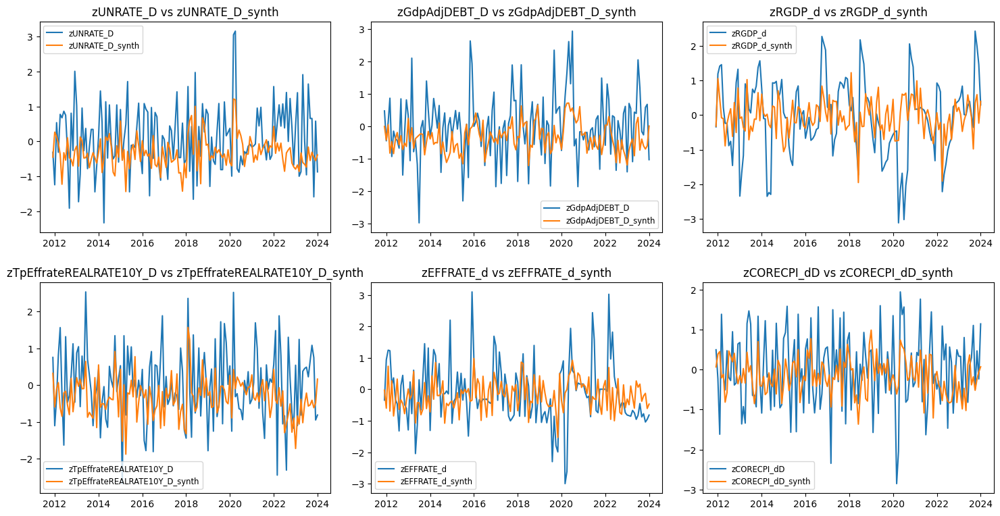

Factor-Mimicking Portfolio Weights:


,zMSCIEMclose,zVTIclose_D,zGOLDclose_D,zVIXYclose,zHYGclose_D,zLQDclose_D,zSPYTRclose_D,zDBEclose_D,zDBAclose_D,zBILclose_DD,...,zRWXclose,zVGTclose_D,zXLVclose_D,zVFHclose_D,zVCRclose_D,zVDCclose_D,zVDEclose_D,zVISclose_D,zVAWclose_D,zVPUclose_D
zUNRATE_D,-0.015016,-0.933895,0.185976,0.369861,0.019978,-0.149077,-0.286551,0.495029,0.079864,0.140299,...,0.028222,0.527530,0.271046,0.389644,0.202074,0.100810,0.407044,-0.359864,0.095397,-0.081427
zGdpAdjDEBT_D,0.118493,1.279697,-0.018314,0.420597,-0.309273,0.132501,-1.261297,0.769439,0.230072,-0.015678,...,-0.050841,0.099854,0.117446,-0.079211,-0.172302,0.063325,0.064414,-0.013799,0.126459,0.184762
zRGDP_d,0.160176,-2.050989,0.219654,0.109459,0.021335,-0.021459,1.113529,0.291713,0.309432,0.149220,...,-0.042544,0.336236,0.003086,0.616367,0.001614,-0.244878,-0.056619,0.736052,-0.540304,-0.030335
zTpEffrateREALRATE10Y_D,0.040492,-1.458033,0.036593,0.459916,-0.136734,-0.003384,-0.158219,0.273150,0.114821,-0.003749,...,0.117790,0.525760,0.389648,0.508599,0.121729,0.001260,-0.031811,0.556301,-0.558534,0.205053
zEFFRATE_d,0.161108,-1.265057,-0.036479,0.191997,0.082509,0.008543,1.025221,0.125204,0.107078,0.258256,...,-0.116535,-0.075865,-0.129581,0.046303,0.390790,0.097546,0.222563,-0.265842,-0.134583,0.135362
zCORECPI_dD,-0.068412,-1.519869,0.046190,0.259382,-0.143299,0.242043,0.698993,0.309862,-0.060606,0.056578,...,0.173621,-0.043550,0.085672,0.586851,0.385491,-0.027019,-0.461655,0.394505,-0.239937,0.076886



Synthetic Factor Returns:


,zUNRATE_D_synth,zGdpAdjDEBT_D_synth,zRGDP_d_synth,zTpEffrateREALRATE10Y_D_synth,zEFFRATE_d_synth,zCORECPI_dD_synth
2011-12-01,-0.449987,-0.005632,-0.317879,0.320026,-0.026802,0.067265
2012-01-01,0.267061,-0.425798,1.056748,-0.593866,-0.599655,0.388062
2012-02-01,0.140210,0.042788,0.476996,-0.100848,0.733537,0.451909
2012-03-01,-0.048070,-0.831811,-0.075103,0.067997,-0.690611,-0.207763
2012-04-01,-0.375945,-0.474638,-0.102889,-0.618497,0.268609,-0.119623
...,...,...,...,...,...,...
2023-09-01,-0.547525,-0.397016,-0.976701,-0.536174,-0.377507,-0.180617
2023-10-01,-0.308160,-0.605430,0.351074,-0.411525,-0.209936,-0.516625
2023-11-01,-0.451217,-0.703491,0.592275,-0.614771,-0.126852,-0.241097
2023-12-01,-0.550123,-0.608890,-0.232738,-0.486258,-0.607979,-0.061015



Evaluation Metrics:


,Correlation,Tracking Error,MSE,R-Squared
zUNRATE_D,0.329773,0.992362,0.984782,-0.118194
zGdpAdjDEBT_D,0.369595,0.986526,0.973234,0.001518
zRGDP_d,0.291785,1.074589,1.154742,0.055774
zTpEffrateREALRATE10Y_D,0.359315,0.998152,0.996307,-0.028007
zEFFRATE_d,0.323911,0.932624,0.869788,0.072272
zCORECPI_dD,0.337764,0.894041,0.799310,0.060822


In [271]:
portfolio_weights, synthetic_factors, evaluation_metrics = minimum_tracking_error_portfolio(norm_assets, mimicking_factors)
print("Factor-Mimicking Portfolio Weights:")
display(portfolio_weights)

print("\nSynthetic Factor Returns:")
display(synthetic_factors)

print("\nEvaluation Metrics:")
display(evaluation_metrics)

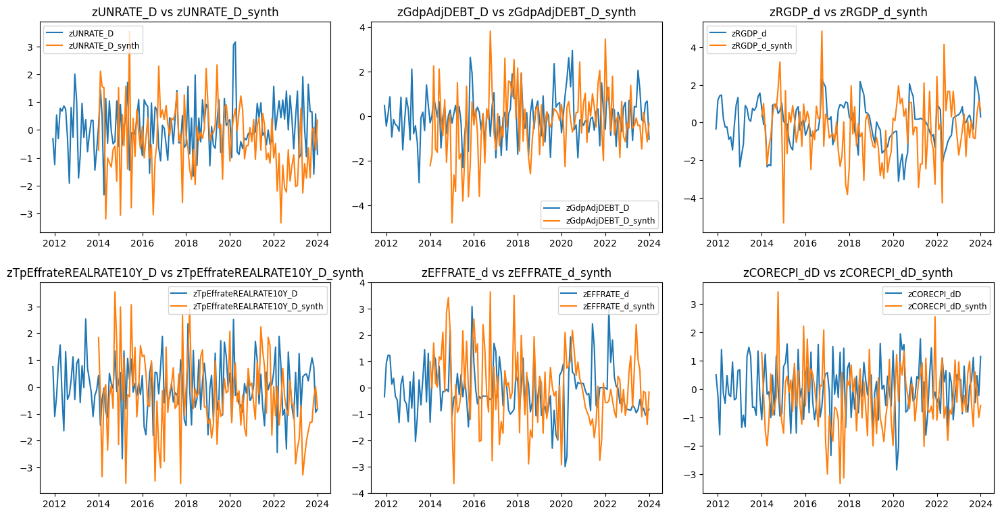

Factor-Mimicking Portfolio Weights:


,zUNRATE_D_2017,zGdpAdjDEBT_D_2017,zRGDP_d_2017,zTpEffrateREALRATE10Y_D_2017,zEFFRATE_d_2017,zCORECPI_dD_2017,zUNRATE_D_2020,zGdpAdjDEBT_D_2020,zRGDP_d_2020,zTpEffrateREALRATE10Y_D_2020,zEFFRATE_d_2020,zCORECPI_dD_2020,zUNRATE_D_2023,zGdpAdjDEBT_D_2023,zRGDP_d_2023,zTpEffrateREALRATE10Y_D_2023,zEFFRATE_d_2023,zCORECPI_dD_2023
zMSCIEMclose,0.113828,0.240469,0.494460,0.362640,0.113105,0.013428,0.156009,-0.215882,0.263392,-0.214915,0.519129,-0.046389,-0.139245,0.012086,0.112925,-0.326291,0.111624,-0.280500
zVTIclose_D,-0.172843,1.566710,-0.328075,-0.347165,0.727401,-0.177550,-0.083676,-0.269419,0.301868,-0.502823,-0.077012,-0.684515,0.350523,-0.193189,-0.075394,-1.916576,-0.427687,-0.101773
zGOLDclose_D,0.453838,-0.037993,-0.641113,0.246966,0.477849,-0.256056,0.406312,-0.441605,-0.144099,-0.062219,-0.100836,0.117484,0.095022,0.400667,-0.103923,-0.352116,-0.044050,0.161514
zVIXYclose,0.073311,0.510343,1.122429,0.498804,0.485142,1.074565,0.542763,0.043187,0.306057,0.296670,0.492316,0.237161,0.590930,0.283815,-0.016126,0.893457,-0.103465,0.197819
zHYGclose_D,-0.316667,-1.230847,0.437720,-0.048546,-0.356985,0.098851,0.277972,-1.087280,-0.232985,-1.013593,0.576162,0.055796,-0.766592,0.214059,-0.588215,0.027091,-0.084160,-0.174280
zLQDclose_D,0.649736,0.078303,-0.039820,-0.334177,-0.753307,0.484755,-0.347775,0.870060,0.633182,0.504195,-0.199405,0.075681,0.514007,0.088654,0.218528,0.255747,0.372805,0.574731
zSPYTRclose_D,-0.975514,-0.789887,0.059781,-0.023486,0.632057,0.495250,0.387910,-0.583130,0.275690,-0.655677,0.003726,0.520926,0.189612,0.087681,-2.013158,-0.870432,-0.423116,-0.393853
zDBEclose_D,0.067002,0.644398,-0.130431,0.876471,0.323200,0.213403,1.461549,1.128558,-0.393807,-0.272473,-0.418145,0.266769,-0.693735,0.310378,-1.296437,-2.328611,1.384169,0.073479
zDBAclose_D,-0.010049,-0.079174,0.276833,0.180827,-0.273060,0.259976,0.166126,0.348499,-0.114975,0.250359,0.039000,0.023037,0.403261,0.272725,0.408712,-0.110506,0.268933,0.155689
zBILclose_DD,-0.171761,0.104285,0.123887,0.125564,0.148625,-0.212953,-0.215712,-0.180443,0.363647,-0.015376,0.387221,0.228766,0.215300,0.135449,0.336639,-0.015382,0.261912,0.156020



Synthetic Factor Returns:


,zUNRATE_D_synth,zGdpAdjDEBT_D_synth,zRGDP_d_synth,zTpEffrateREALRATE10Y_D_synth,zEFFRATE_d_synth,zCORECPI_dD_synth
2011-12-01,NaN,NaN,NaN,NaN,NaN,NaN
2012-01-01,NaN,NaN,NaN,NaN,NaN,NaN
2012-02-01,NaN,NaN,NaN,NaN,NaN,NaN
2012-03-01,NaN,NaN,NaN,NaN,NaN,NaN
2012-04-01,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
2023-09-01,-1.715873,-1.473599,-0.804294,-1.311897,-1.099861,-1.327068
2023-10-01,-0.029173,0.159638,-0.853527,-1.314127,-0.136206,0.598056
2023-11-01,0.091478,-0.416807,0.475716,-0.406849,-0.183109,-0.110404
2023-12-01,-0.725345,-1.146737,1.145996,0.010936,-1.388398,-1.008047



Evaluation Metrics:


,Correlation,Tracking Error,MSE,R-Squared
zUNRATE_D,-0.205334,1.751509,3.067785,-2.516624
zGdpAdjDEBT_D,0.115534,1.688447,2.850855,-1.973700
zRGDP_d,0.062725,1.900155,3.610587,-1.936192
zTpEffrateREALRATE10Y_D,0.070689,1.719795,2.957694,-2.009404
zEFFRATE_d,0.067562,1.673342,2.800074,-1.898763
zCORECPI_dD,-0.107633,1.546676,2.392205,-1.784703


In [282]:
rolling_portfolio_weights, rolling_synthetic_factors, rolling_evaluation_metrics = rolling_tracking_error_portfolio(norm_assets, mimicking_factors, rebalance_freq=3, opt_mode=2, l2_reg=0.01)
print("Factor-Mimicking Portfolio Weights:")
display(rolling_portfolio_weights.drop(columns=[col for col in mimicking_factors]))

print("\nSynthetic Factor Returns:")
display(rolling_synthetic_factors)

print("\nEvaluation Metrics:")
display(rolling_evaluation_metrics)

In [225]:
factor_mimicking_weights, synthetic_factor_returns, evaluation_metrics = factor_mimicking(norm_assets, mimicking_factors)
print("Factor-Mimicking Portfolio Weights:")
display(factor_mimicking_weights)

print("\nSynthetic Factor Returns:")
display(synthetic_factor_returns)

print("\nEvaluation Metrics:")
display(evaluation_metrics)

⚠️ OLS issues detected for zMSCIEMclose: Autocorrelation detected (Durbin-Watson = 0.42). Attempting fixes...
✅ First difference transformation fixed Autocorrelation for zMSCIEMclose.
✅ OLS assumptions hold for zVTIclose_D. Proceeding.
✅ OLS assumptions hold for zGOLDclose_D. Proceeding.
❌ Skipping zGOLDclose_D: Low R² (0.030)
⚠️ OLS issues detected for zVIXYclose: Homoscedasticity violated (p < 0.05 in Breusch-Pagan test) | Autocorrelation detected (Durbin-Watson = 0.78). Attempting fixes...
❌ First difference failed for zVIXYclose: Homoscedasticity violated (p < 0.05 in Breusch-Pagan test).
❌ Log transform failed for zVIXYclose: Homoscedasticity violated (p < 0.05 in Breusch-Pagan test) | Autocorrelation detected (Durbin-Watson = 0.74).
❌ Log transform failed for zVIXYclose: Homoscedasticity violated (p < 0.05 in Breusch-Pagan test) | Autocorrelation detected (Durbin-Watson = 0.74).
❌ Log transform failed for zVIXYclose: Homoscedasticity violated (p < 0.05 in Breusch-Pagan test) | Au

C:\Users\lucas\AppData\Local\Temp\ipykernel_19872\1624364576.py:137: RuntimeWarning: invalid value encountered in log1p
  y_transformed = np.where(y > 0, np.log1p(y), y)
C:\Users\lucas\AppData\Local\Temp\ipykernel_19872\1624364576.py:137: RuntimeWarning: invalid value encountered in log1p
  y_transformed = np.where(y > 0, np.log1p(y), y)
C:\Users\lucas\AppData\Local\Temp\ipykernel_19872\1624364576.py:137: RuntimeWarning: invalid value encountered in log1p
  y_transformed = np.where(y > 0, np.log1p(y), y)
C:\Users\lucas\AppData\Local\Temp\ipykernel_19872\1624364576.py:137: RuntimeWarning: invalid value encountered in log1p
  y_transformed = np.where(y > 0, np.log1p(y), y)
C:\Users\lucas\AppData\Local\Temp\ipykernel_19872\1624364576.py:137: RuntimeWarning: invalid value encountered in log1p
  y_transformed = np.where(y > 0, np.log1p(y), y)
C:\Users\lucas\AppData\Local\Temp\ipykernel_19872\1624364576.py:137: RuntimeWarning: invalid value encountered in log1p
  y_transformed = np.where(y >

⚠️ OLS issues detected for zBILclose_DD: Homoscedasticity violated (p < 0.05 in Breusch-Pagan test) | Autocorrelation detected (Durbin-Watson = 2.99). Attempting fixes...
❌ First difference failed for zBILclose_DD: Homoscedasticity violated (p < 0.05 in Breusch-Pagan test) | Autocorrelation detected (Durbin-Watson = 3.29).
❌ First difference failed for zBILclose_DD: Homoscedasticity violated (p < 0.05 in Breusch-Pagan test) | Autocorrelation detected (Durbin-Watson = 3.29).
❌ First difference failed for zBILclose_DD: Homoscedasticity violated (p < 0.05 in Breusch-Pagan test) | Autocorrelation detected (Durbin-Watson = 3.29).
❌ Log transform failed for zBILclose_DD: Homoscedasticity violated (p < 0.05 in Breusch-Pagan test) | Autocorrelation detected (Durbin-Watson = 2.95).
❌ Log transform failed for zBILclose_DD: Homoscedasticity violated (p < 0.05 in Breusch-Pagan test) | Autocorrelation detected (Durbin-Watson = 2.95).
❌ Log transform failed for zBILclose_DD: Homoscedasticity violate

,zMSCIEMclose,zVTIclose_D,zHYGclose_D,zSPYTRclose_D,zDBEclose_D,zDBBclose_D,zDBCclose_D,zRWXclose,zVGTclose_D,zXLVclose_D,zVFHclose_D,zVCRclose_D,zVDEclose_D,zVISclose_D,zVAWclose_D
zUNRATE_D,0.207823,-1.516084,-0.828489,-8.406386,1.717454,0.526286,-3.309662,0.239950,3.085269,2.092278,6.108269,2.912720,0.703211,-7.814615,4.759776
zGdpAdjDEBT_D,1.415125,26.396655,-3.725310,-16.816214,1.070669,1.353240,-0.843305,-1.228019,-0.102142,-0.222804,-4.245376,-7.067462,0.884776,0.354062,1.200205
zRGDP_d,-0.025404,16.477774,-1.725175,-9.101438,-6.558235,0.871238,3.621613,0.269473,1.393458,-3.655547,3.488067,-5.804710,0.714739,-3.164943,0.239938
zTpEffrateREALRATE10Y_D,-0.327970,0.117159,-0.411453,-1.760628,0.279266,-0.819449,0.841557,-0.457013,0.729546,1.752424,-0.596011,-0.755102,-0.362710,2.730371,-2.608901
zEFFRATE_d,0.353014,-1.736774,1.129340,11.362022,-3.034326,0.926004,2.771711,0.061782,-4.068140,-3.812711,-0.950445,0.650744,0.295271,-3.762486,-1.370552
zCORECPI_dD,-0.523706,-18.205906,0.657815,7.420429,4.825398,1.109641,-0.473798,0.769101,-0.941346,1.397265,4.492602,6.798367,-4.159691,-0.513308,0.755782



Synthetic Factor Returns:


,zUNRATE_D,zGdpAdjDEBT_D,zRGDP_d,zTpEffrateREALRATE10Y_D,zEFFRATE_d,zCORECPI_dD
2011-12-01,-1.035730,-6.946714,-1.945782,1.783974,-0.028876,0.827210
2012-01-01,4.219848,0.703408,3.338658,-1.799692,-4.170214,3.343406
2012-02-01,-1.127492,-2.537888,-1.547638,-0.254577,1.408200,2.465586
2012-03-01,5.373300,-4.038815,1.563819,0.676571,-2.870700,3.790104
2012-04-01,-0.482641,-1.294913,-1.879595,-1.202914,1.959596,2.239337
...,...,...,...,...,...,...
2023-09-01,7.867797,2.669190,-1.039610,0.846239,0.261516,6.202569
2023-10-01,1.122663,-0.857482,4.399464,1.385355,1.655399,-0.168545
2023-11-01,-1.540161,-5.170303,3.282076,-1.702841,-1.143608,-3.240430
2023-12-01,0.073549,-1.151308,0.991256,-1.809336,-2.464681,-0.801882



Evaluation Metrics:


,Correlation,Tracking Error,MSE,R-Squared
zUNRATE_D,0.207024,4.176007,17.439036,-18.801569
zGdpAdjDEBT_D,0.240075,4.099300,16.804260,-16.240191
zRGDP_d,0.245276,4.353331,18.951494,-14.496525
zTpEffrateREALRATE10Y_D,0.378677,2.207881,4.874739,-4.029838
zEFFRATE_d,0.296346,3.040739,9.246093,-8.862009
zCORECPI_dD,0.251388,3.602075,12.974947,-14.245374


# predicting cycle

In [142]:
def classify_regimes_kmeans(data, features, n_clusters=4, show_plot=True):
    df_features = data[features].dropna()

    scaler = StandardScaler()
    scaled_features = scaler.fit_transform(df_features)

    kmeans = KMeans(n_clusters=n_clusters, random_state=10)
    clusters = kmeans.fit_predict(scaled_features)

    data.loc[df_features.index, 'Cluster'] = clusters.astype(int)

    if show_plot:
        fig, axes = plt.subplots(len(features), 1, figsize=(12, len(features) * 3), sharex=True)

        y_lims = [(data[feature].min() - 1, data[feature].max() + 1) for feature in features]

        for i, feature in enumerate(features):
            ax = axes[i] if len(features) > 1 else axes
            ax.plot(data.index, data[feature], label=f'{feature}', color='black', linewidth=2)

            cluster_mesh = np.array([data['Cluster'].values for _ in range(2)])

            pcm = ax.pcolorfast(ax.get_xlim(), y_lims[i],
                                cluster_mesh, cmap='viridis', alpha=0.5)

            ax.set_title(f'Feature: {feature}')
            ax.set_ylabel('Value')
            if i == len(features) - 1:
                ax.set_xlabel('Time')
            else:
                ax.tick_params(labelbottom=False)

        plt.tight_layout()
        plt.show()

    return data

In [141]:
def analyze_regimes(normalized_df, hidden_states, hidden_state_dates, base_df=None):
    """
    Analyze and display the characteristics of each factor/asset across different regimes.

    Parameters:
    - normalized_df (pd.DataFrame): DataFrame of normalized factors/assets with DateTime index.
    - hidden_states (np.ndarray): Array of detected regimes.
    - hidden_state_dates (pd.Index or list): Dates corresponding to hidden_states.
    - base_df (pd.DataFrame, optional): DataFrame of base factors/assets with DateTime index.
      If not provided, analysis is performed only on normalized_df.

    Returns:
    - summaries (dict): Dictionary containing individual summary statistics for each factor by regime for both normalized and base values (if available).
    """
    # Step 1: Align hidden states with normalized dataframe by date
    hidden_states_df = pd.DataFrame({'Regime': hidden_states}, index=pd.to_datetime(hidden_state_dates))
    
    # Ensure all indexes are in DateTime format
    normalized_df.index = pd.to_datetime(normalized_df.index)
    if base_df is not None:
        base_df.index = pd.to_datetime(base_df.index)
    
    # Find common dates
    common_dates = normalized_df.index.intersection(hidden_states_df.index)
    if base_df is not None:
        common_dates = common_dates.intersection(base_df.index)
    
    # Filter data to only include common dates
    aligned_hidden_states = hidden_states_df.loc[common_dates]['Regime']
    aligned_normalized_df = normalized_df.loc[common_dates]
    aligned_normalized_df['Regime'] = aligned_hidden_states.values
    
    if base_df is not None:
        aligned_base_df = base_df.loc[common_dates]
        aligned_base_df['Regime'] = aligned_hidden_states.values
    
    # Step 2: Generate and display information for each factor by regime
    summaries = {}

    for column in aligned_normalized_df.columns[:-1]:  # Exclude 'Regime' column
        factor_name = column[1:] if column.startswith("z") else column  # Adjust for prefix in normalized_df

        # Summary for normalized data
        norm_summary = aligned_normalized_df.groupby('Regime')[column].agg(['mean', 'std', 'min', 'max', 'count'])
        print(f"\nNormalized Data Summary for {factor_name} by Regime:")
        display(norm_summary)
        
        summaries[factor_name] = {'Normalized': norm_summary}

        # Plot distribution for normalized data
        plt.figure(figsize=(10, 6))
        sns.histplot(data=aligned_normalized_df, x=column, hue='Regime', kde=True, palette="muted", multiple="stack")
        plt.title(f'Distribution of {factor_name} (Normalized) by Regime')
        plt.xlabel(factor_name)
        plt.show()
        
        if base_df is not None:
            base_column = factor_name  # Assuming the base_df has the same name without "z" prefix
            base_summary = aligned_base_df.groupby('Regime')[base_column].agg(['mean', 'std', 'min', 'max', 'count'])
            print(f"\nBase Data Summary for {factor_name} by Regime:")
            display(base_summary)
            
            summaries[factor_name]['Base'] = base_summary

            # Plot distribution for base data
            plt.figure(figsize=(10, 6))
            sns.histplot(data=aligned_base_df, x=base_column, hue='Regime', kde=True, palette="muted", multiple="stack")
            plt.title(f'Distribution of {factor_name} (Base) by Regime')
            plt.xlabel(factor_name)
            plt.show()
    
    return summaries

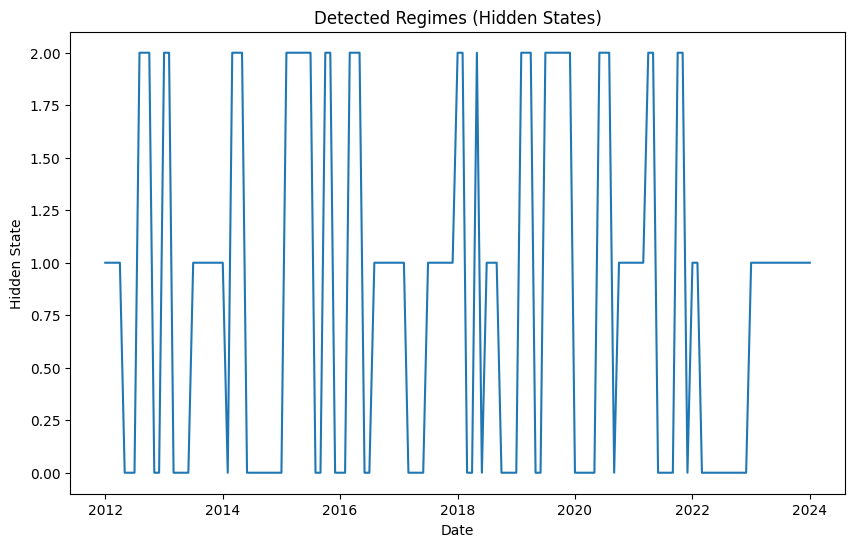

In [ ]:
def fit_hmm(data, n_states=3):
    model = GaussianHMM(n_components=n_states, covariance_type="diag", n_iter=1000)
    model.fit(data)
    hidden_states = model.predict(data)
    return model, hidden_states

macro_data = norm_factors.values  
dates = norm_factors.index 

model, hidden_states = fit_hmm(macro_data)

# Plot regimes with dates on the x-axis
plt.figure(figsize=(10, 6))
plt.plot(dates, hidden_states)
plt.title("Detected Regimes (Hidden States)")
plt.xlabel("Date")
plt.ylabel("Hidden State")
plt.show()


Normalized Data Summary for UNRATE_DIFF1 by Regime:


,mean,std,min,max,count
Regime,,,,,
0,0.344908,0.921508,-1.085620,3.162129,59
1,-0.038879,0.807780,-1.445388,2.115129,48
2,-0.100336,1.051042,-2.334203,1.716453,38



Base Data Summary for UNRATE_DIFF1 by Regime:


,mean,std,min,max,count
Regime,,,,,
0,0.108475,1.392255,-1.6,10.4,59
1,-0.072917,0.186501,-1.0,0.3,48
2,-0.202632,0.475614,-2.2,0.2,38


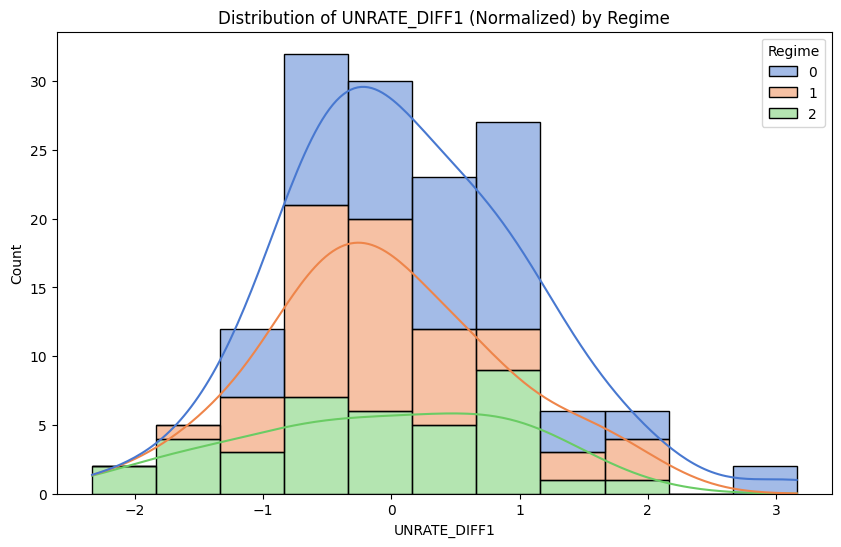

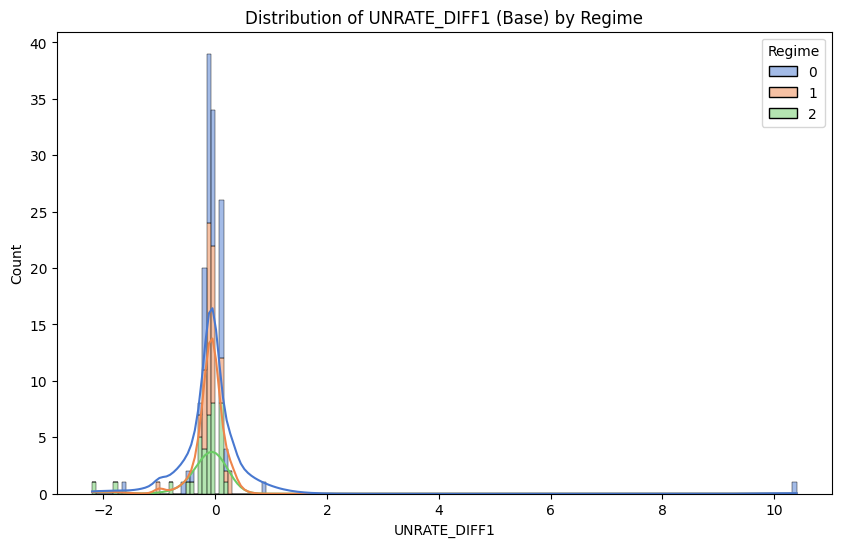


Normalized Data Summary for CPI_DIFF1 by Regime:


,mean,std,min,max,count
Regime,,,,,
0,-0.740041,1.021103,-2.605471,1.805154,59
1,0.141113,0.622286,-1.103711,1.802857,48
2,0.879282,0.578618,-0.315089,2.227572,38



Base Data Summary for CPI_DIFF1 by Regime:


,mean,std,min,max,count
Regime,,,,,
0,0.095412,0.356461,-0.784040,1.248288,59
1,0.259103,0.156157,0.032765,0.759588,48
2,0.341754,0.198923,0.091477,0.929946,38


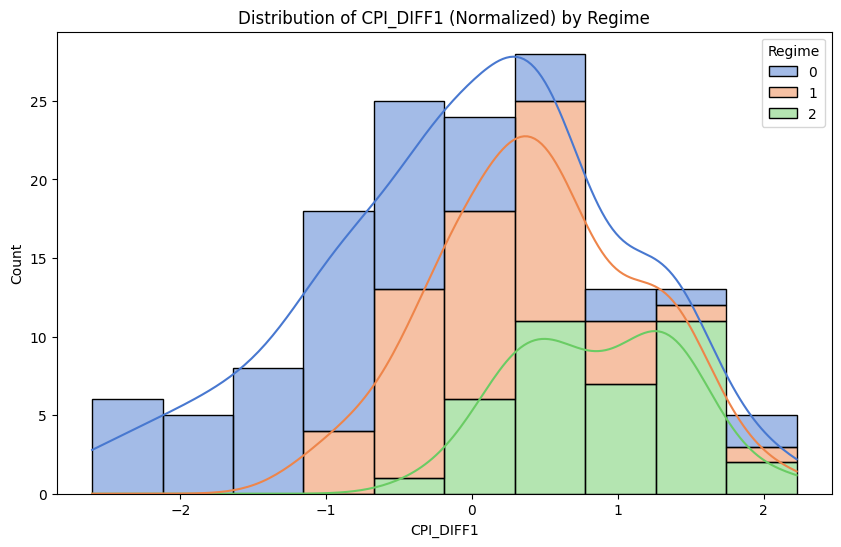

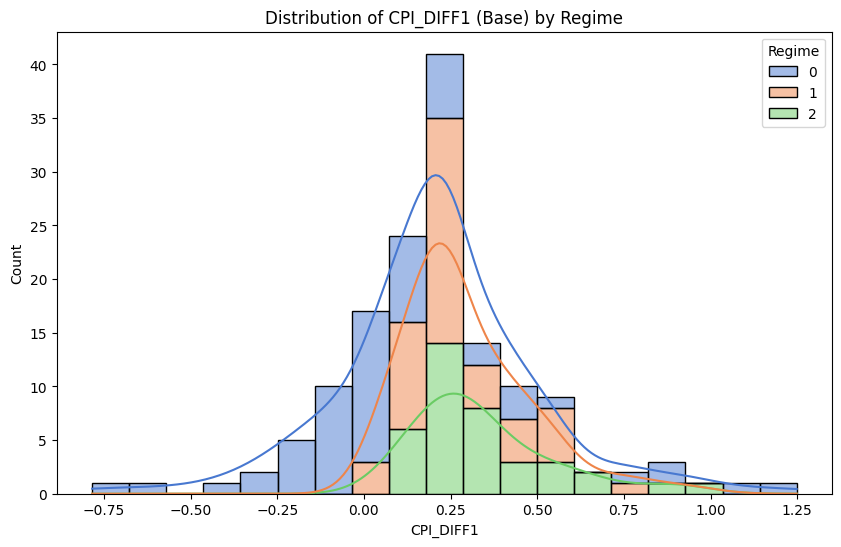


Normalized Data Summary for CORECPI_DIFF1 by Regime:


,mean,std,min,max,count
Regime,,,,,
0,-0.382379,1.023283,-2.845582,1.519264,59
1,-0.119331,0.807343,-1.974819,1.689541,48
2,0.602317,0.776151,-1.023619,2.285922,38



Base Data Summary for CORECPI_DIFF1 by Regime:


,mean,std,min,max,count
Regime,,,,,
0,0.200716,0.197525,-0.476283,0.759000,59
1,0.222975,0.119333,0.030332,0.557462,48
2,0.260978,0.172906,0.114363,0.811903,38


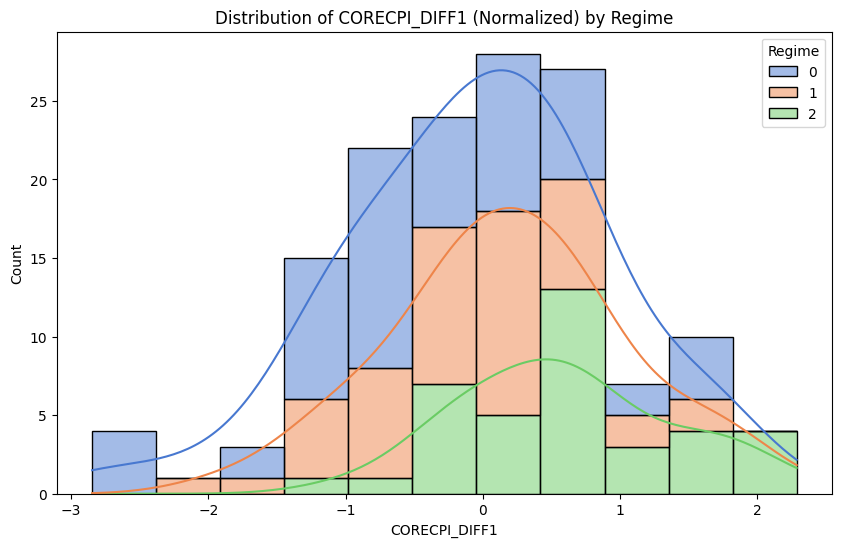

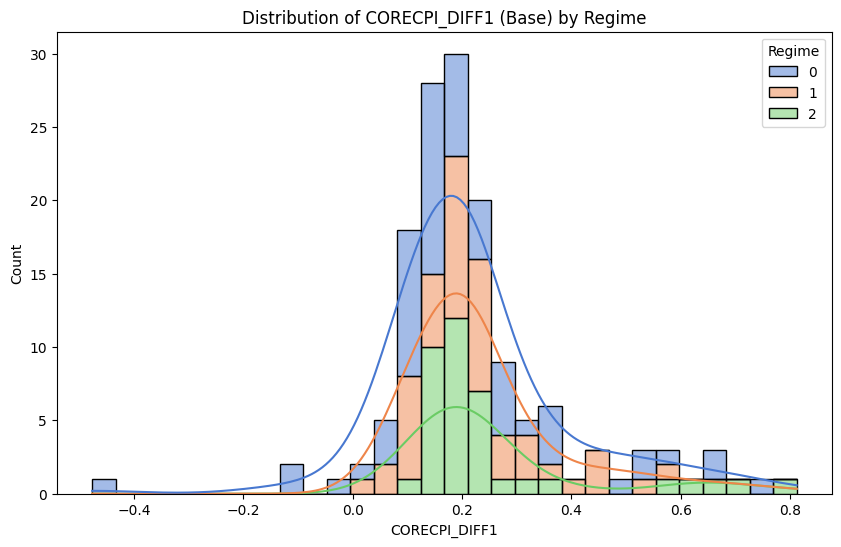


Normalized Data Summary for EFFRATE_DIFF1 by Regime:


,mean,std,min,max,count
Regime,,,,,
0,0.070196,1.144915,-2.994421,3.094386,59
1,-0.187372,0.770950,-1.306390,1.685786,48
2,-0.303429,0.889024,-2.296579,1.937907,38



Base Data Summary for EFFRATE_DIFF1 by Regime:


,mean,std,min,max,count
Regime,,,,,
0,11.512003,35.721714,-92.307692,150.000000,59
1,3.124689,9.781857,-22.222222,31.707317,48
2,1.710514,12.844818,-18.750000,60.000000,38


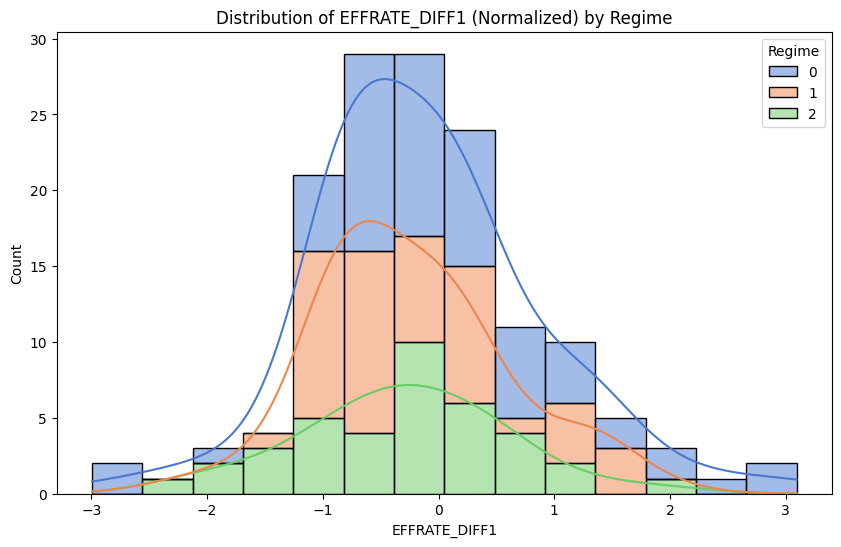

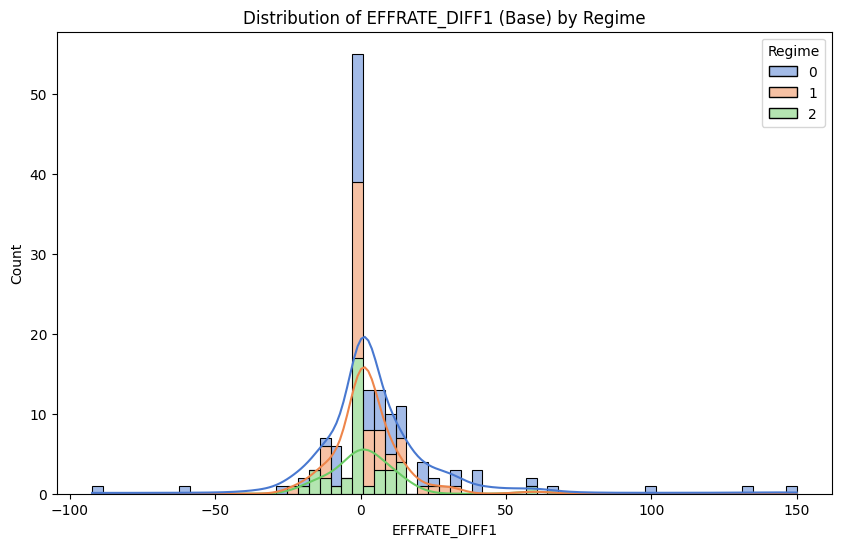


Normalized Data Summary for GdpAdjDEBT_DIFF1 by Regime:


,mean,std,min,max,count
Regime,,,,,
0,0.048499,0.840245,-1.767997,2.617172,59
1,-0.041498,1.012651,-2.986629,2.051861,48
2,0.010206,1.193828,-2.308439,2.939807,38



Base Data Summary for GdpAdjDEBT_DIFF1 by Regime:


,mean,std,min,max,count
Regime,,,,,
0,1.491610e+06,1.096049e+07,-2.738850e+07,5.676214e+07,59
1,-1.461181e+06,1.692926e+07,-9.056243e+07,1.942698e+07,48
2,5.381579e+06,2.927805e+07,-2.926622e+07,1.661649e+08,38


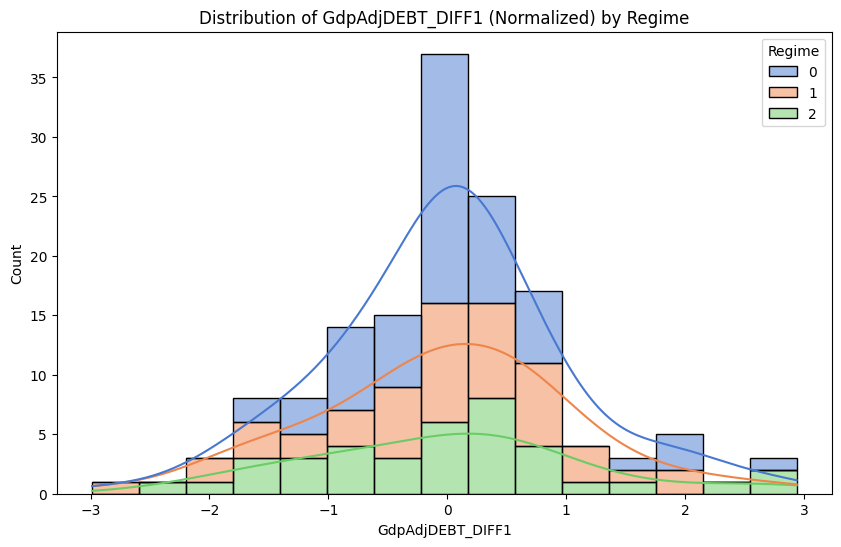

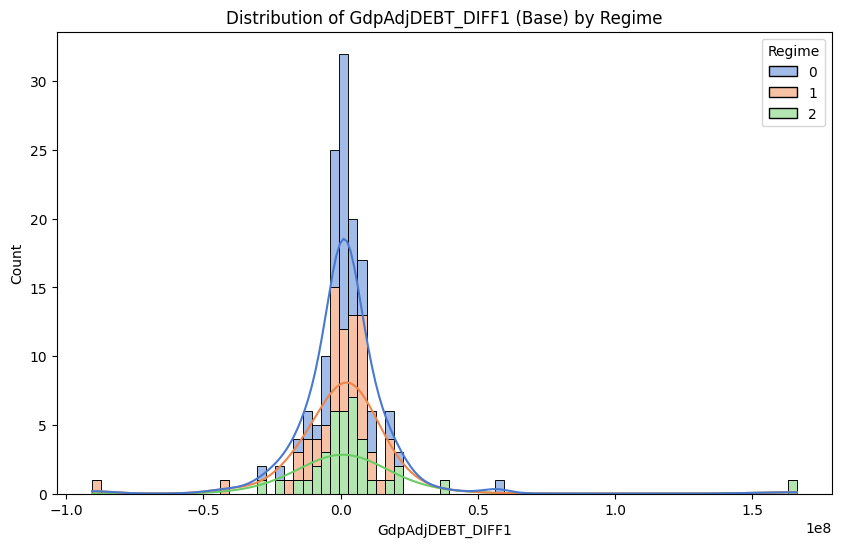


Normalized Data Summary for RGDP_DIFF1 by Regime:


,mean,std,min,max,count
Regime,,,,,
0,-0.266963,0.955865,-3.113525,1.326403,59
1,0.906961,0.737951,-0.375045,2.428267,48
2,-0.895043,0.838490,-3.018934,0.296166,38



Base Data Summary for RGDP_DIFF1 by Regime:


,mean,std,min,max,count
Regime,,,,,
0,1.591525,5.005765,-31.4,6.9,59
1,5.029167,7.456739,1.1,33.4,48
2,-0.163158,7.897260,-32.9,6.4,38


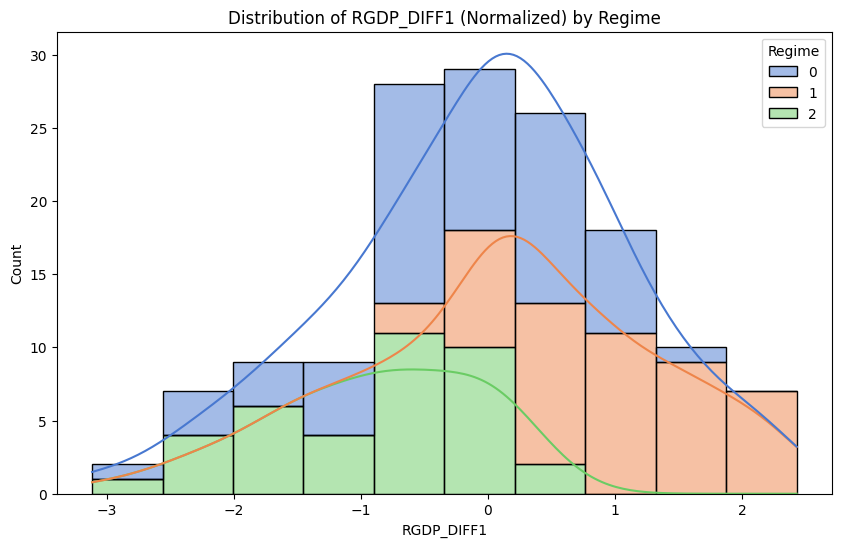

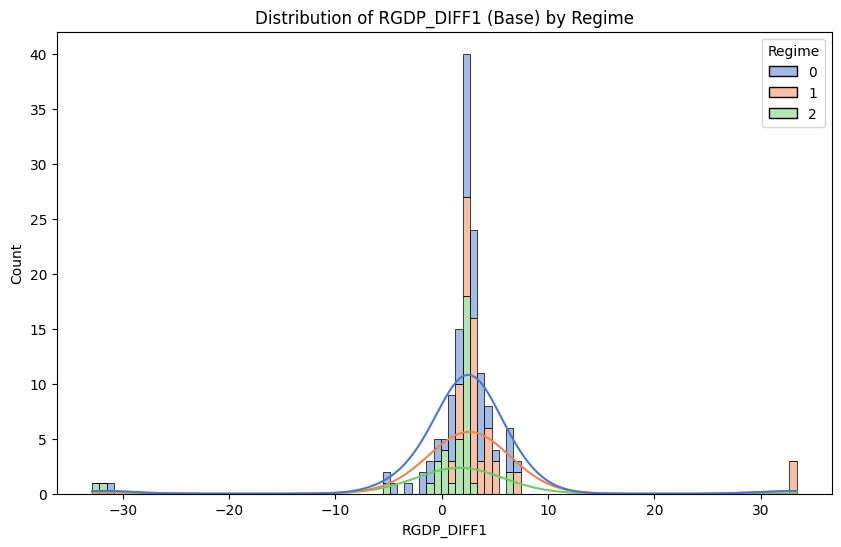


Normalized Data Summary for TpEffrateBERATE10Y_DIFF1 by Regime:


,mean,std,min,max,count
Regime,,,,,
0,-0.800582,0.984495,-2.625087,2.441333,59
1,0.361087,0.600594,-0.757937,1.569897,48
2,0.703547,0.653578,-0.448252,2.146103,38



Base Data Summary for TpEffrateBERATE10Y_DIFF1 by Regime:


,mean,std,min,max,count
Regime,,,,,
0,-0.134237,0.225688,-0.73,0.71,59
1,-0.002708,0.104122,-0.29,0.21,48
2,0.080263,0.084581,-0.04,0.36,38


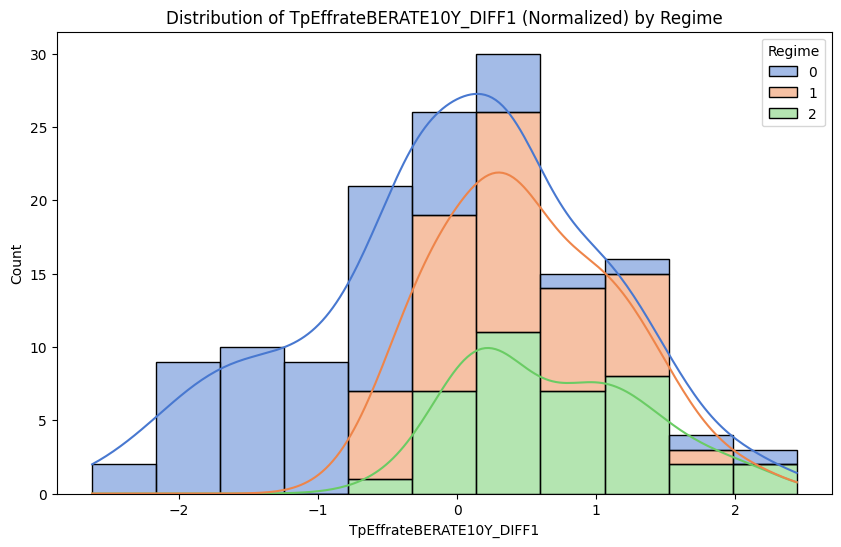

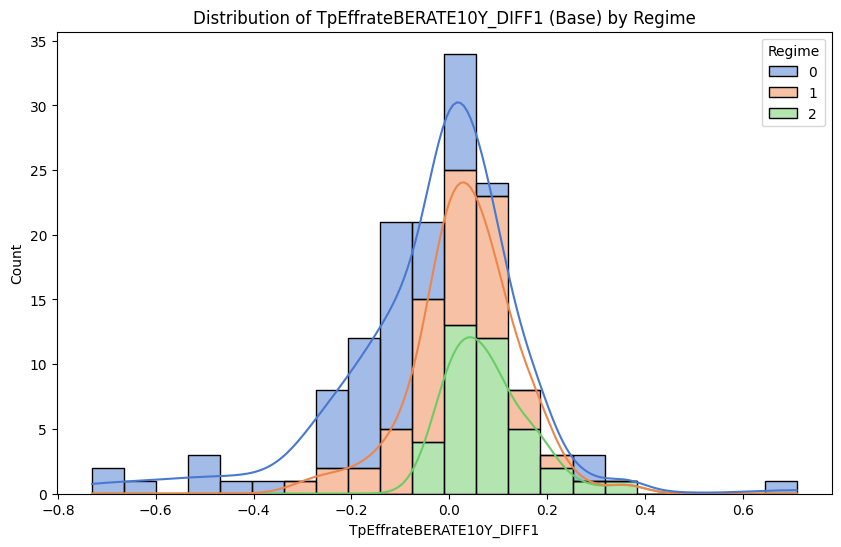


Normalized Data Summary for TpEffrateREALRATE10Y_DIFF1 by Regime:


,mean,std,min,max,count
Regime,,,,,
0,-0.128441,1.075327,-2.447454,2.532886,59
1,0.157327,0.794850,-1.220432,1.884771,48
2,0.018299,1.065567,-2.678267,2.357162,38



Base Data Summary for TpEffrateREALRATE10Y_DIFF1 by Regime:


,mean,std,min,max,count
Regime,,,,,
0,-0.048136,0.334594,-1.08,1.18,59
1,-0.001250,0.256462,-0.82,0.57,48
2,-0.022368,0.227815,-0.60,0.39,38


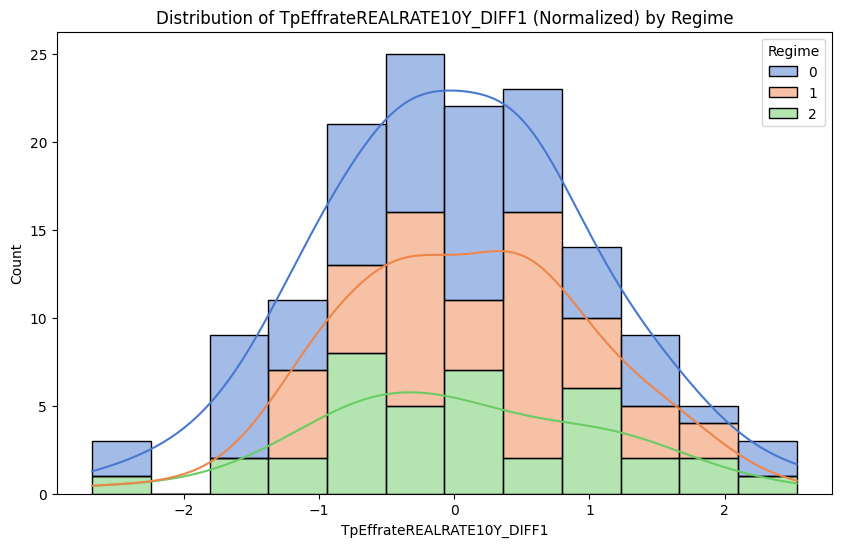

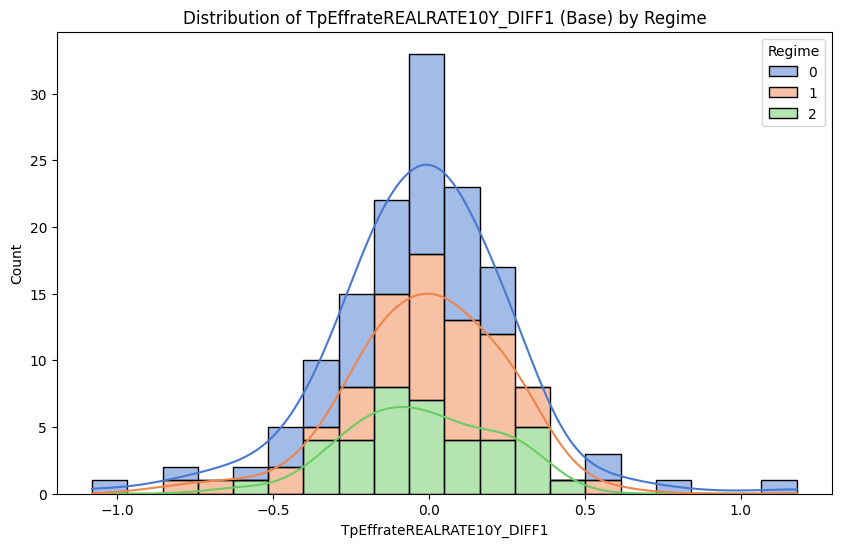

{'UNRATE_DIFF1': {'Normalized':             mean       std       min       max  count
  Regime                                               
  0       0.344908  0.921508 -1.085620  3.162129     59
  1      -0.038879  0.807780 -1.445388  2.115129     48
  2      -0.100336  1.051042 -2.334203  1.716453     38,
  'Base':             mean       std  min   max  count
  Regime                                      
  0       0.108475  1.392255 -1.6  10.4     59
  1      -0.072917  0.186501 -1.0   0.3     48
  2      -0.202632  0.475614 -2.2   0.2     38},
 'CPI_DIFF1': {'Normalized':             mean       std       min       max  count
  Regime                                               
  0      -0.740041  1.021103 -2.605471  1.805154     59
  1       0.141113  0.622286 -1.103711  1.802857     48
  2       0.879282  0.578618 -0.315089  2.227572     38,
  'Base':             mean       std       min       max  count
  Regime                                               
  0       0.0954

In [180]:
analyze_regimes(norm_factors, base_factors, hidden_states, norm_factors.index)

In [278]:
def detect_changepoints(data: pd.DataFrame, model: str = 'rbf', penalty: int = 10):
    """
    Detect change points in multivariate data

    Parameters:
    - data (pd.DataFrame): DataFrame with multiple factors as columns
    - model (str): The cost function model for ruptures; default is 'rbf' 
    - penalty (int): Penalty term for detecting fewer change points.

    Returns:
    - dict: Dictionary containing breakpoints and model.
    """
    algo = rpt.Pelt(model=model).fit(data.values)
    breakpoints = algo.predict(pen=penalty)
    return {'breakpoints': breakpoints, 'algo': algo}

def plot_changepoints(data: pd.DataFrame, changepoints: list):
    """
    Plot multivariate data with detected change points.

    Parameters:
    - data (pd.DataFrame): DataFrame with multiple factors as columns.
    - changepoints (list): List of detected change points.
    """
    # Validate changepoints to ensure they are within the DataFrame's index range
    valid_changepoints = [cp for cp in changepoints if 0 <= cp < len(data)]
    
    fig, axes = plt.subplots(len(data.columns), 1, figsize=(12, 16), sharex=True)

    for i, column in enumerate(data.columns):
        ax = axes[i]
        ax.plot(data.index, data[column], label=column)
        # Plot only valid changepoints
        for changepoint in valid_changepoints:
            ax.axvline(data.index[changepoint], color='red', linestyle='--', label="Change Point")
        ax.set_title(f"{column} with Change Points")
        ax.legend().remove()  # Hides the legend for this subplot

    plt.tight_layout()
    plt.show()


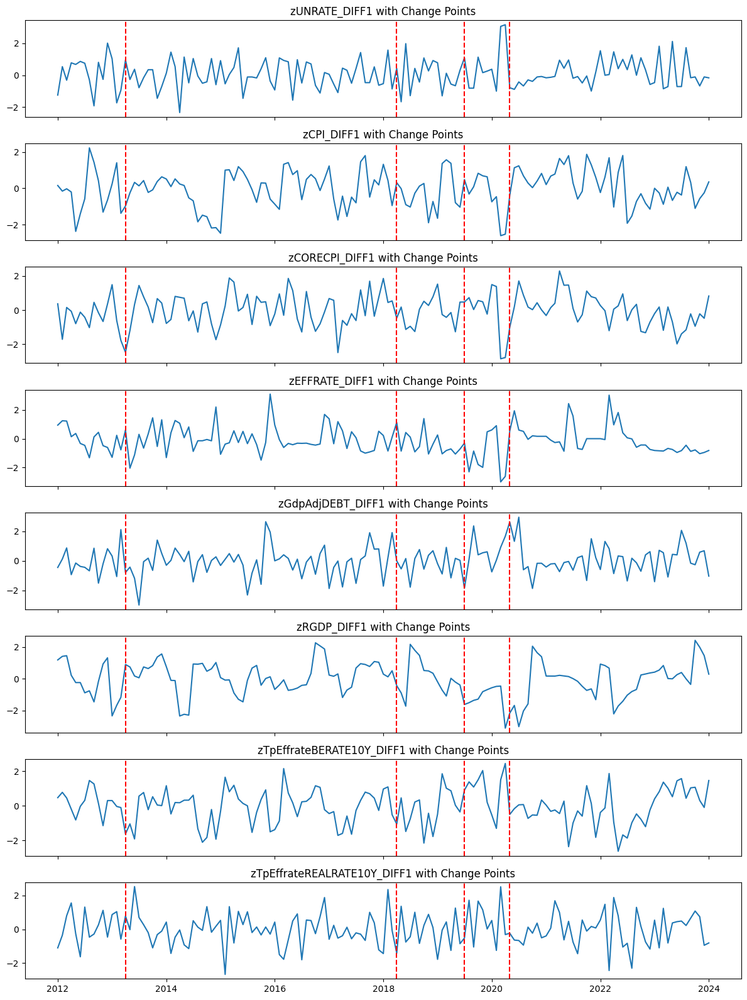

In [359]:
chagepoint_results = detect_changepoints(norm_factors, model = 'linear', penalty=10)
plot_changepoints(norm_factors, changepoints=chagepoint_results['breakpoints'])

In [134]:
def perform_pca(
    data: Union[pd.DataFrame, np.ndarray],
    n_components: int = 2,
    scale_data: bool = True,
    use_kernel_pca: bool = False,
    kpca_kernel: str = 'rbf'
) -> Tuple[pd.DataFrame, Union[PCA, KernelPCA]]:
    """
    Perform PCA or Kernel PCA (KPCA) on the given data and return the principal components.
    
    Parameters:
    - data (Union[pd.DataFrame, np.ndarray]): DataFrame or array containing features for PCA.
    - n_components (int): Number of principal components to retain.
    - scale_data (bool): Whether to standardize the data before PCA.
    - use_kernel_pca (bool): Whether to use Kernel PCA instead of regular PCA.
    - kpca_kernel (str): Kernel type for Kernel PCA (e.g., 'rbf', 'poly', 'sigmoid', 'linear').

    Returns:
    - pd.DataFrame: DataFrame containing the principal components.
    - PCA or KernelPCA: Fitted PCA/KPCA model for further analysis.
    """
    # Convert DataFrame to NumPy array
    if isinstance(data, pd.DataFrame):
        data_array = data.values
        index = data.index
    else:
        data_array = data
        index = range(data_array.shape[0]) 

    # Step 1: Standardize Data (if required)
    if scale_data:
        scaler = StandardScaler()
        data_scaled = scaler.fit_transform(data_array)
    else:
        data_scaled = data_array
    
    # Step 2: Apply PCA or KPCA
    if use_kernel_pca:
        pca_model = KernelPCA(n_components=n_components, kernel=kpca_kernel)
        principal_components = pca_model.fit_transform(data_scaled)
    else:
        pca_model = PCA(n_components=n_components)
        principal_components = pca_model.fit_transform(data_scaled)
    
    # Step 3: Convert to DataFrame
    pc_df = pd.DataFrame(
        data=principal_components,
        index=index,
        columns=[f'PC{i+1}' for i in range(n_components)]
    )
    
    return pc_df, pca_model

def pca_regime_detection(
    data: pd.DataFrame,
    n_components: int = 2,
    n_clusters: int = 3,
    clustering_method: str = 'kmeans',
    scale_data: bool = True,
    use_kernel_pca: bool = False,
    kpca_kernel: str = 'rbf',
    plot_results: bool = True
) -> pd.DataFrame:
    """
    Perform PCA-based or KPCA-based regime detection using clustering.
    
    Parameters:
    - data (pd.DataFrame): DataFrame containing macro factors as columns.
    - n_components (int): Number of principal components to retain.
    - n_clusters (int): Number of regimes (clusters) to detect.
    - clustering_method (str): Clustering method ('kmeans', 'gmm', 'hierarchical').
    - scale_data (bool): Whether to standardize the data before PCA/KPCA.
    - use_kernel_pca (bool): Whether to use Kernel PCA instead of regular PCA.
    - kpca_kernel (str): Kernel type for Kernel PCA ('rbf', 'poly', 'sigmoid', 'linear').
    - plot_results (bool): Whether to plot the results.
    
    Returns:
    - pd.DataFrame: Original DataFrame with an added 'Regime' column indicating the detected regimes.
    """
    # Step 1: Perform PCA or KPCA
    pc_df, pca_model = perform_pca(
        data, n_components=n_components, scale_data=scale_data, 
        use_kernel_pca=use_kernel_pca, kpca_kernel=kpca_kernel
    )
    
    # Explained variance only exists for standard PCA
    if not use_kernel_pca:
        explained_variance = pca_model.explained_variance_ratio_
        print("Explained variance ratio:", explained_variance)
    
    # Step 2: Clustering on Principal Components
    if clustering_method == 'kmeans':
        clustering_model = KMeans(n_clusters=n_clusters, random_state=42)
        cluster_labels = clustering_model.fit_predict(pc_df)
    elif clustering_method == 'gmm':
        clustering_model = GaussianMixture(n_components=n_clusters, random_state=42)
        cluster_labels = clustering_model.fit_predict(pc_df)
    elif clustering_method == 'hierarchical':
        clustering_model = AgglomerativeClustering(n_clusters=n_clusters)
        cluster_labels = clustering_model.fit_predict(pc_df)
    else:
        raise ValueError("clustering_method must be 'kmeans', 'gmm', or 'hierarchical'")
    
    # Step 3: Add Regime Labels to DataFrame
    result_df = data.copy()
    result_df['Regime'] = cluster_labels
    
    # Analyze Regime Characteristics
    regime_means = result_df.groupby('Regime').mean()
    print("\nMean of each factor within each regime:")
    display(regime_means)
    
    # Step 4: Plot Results (Optional)
    if plot_results:
        # Plot PCA/KPCA component scatter plots
        for i in range(n_components - 1):
            for j in range(i + 1, n_components):
                plt.figure(figsize=(10, 7))
                scatter = plt.scatter(
                    pc_df[f'PC{i+1}'],
                    pc_df[f'PC{j+1}'],
                    c=cluster_labels,
                    cmap='viridis',
                    alpha=0.7
                )
                plt.title(f'{"Kernel " if use_kernel_pca else ""}PCA Component {i+1} vs Component {j+1}')
                plt.xlabel(f'{"Kernel " if use_kernel_pca else ""}Principal Component {i+1}')
                plt.ylabel(f'{"Kernel " if use_kernel_pca else ""}Principal Component {j+1}')
                plt.colorbar(scatter, label='Regime')
                plt.show()
        
        # Regimes Over Time
        fig, ax = plt.subplots(figsize=(12, 4))
        cmap = plt.get_cmap('viridis', n_clusters)  # Define colormap
        unique_regimes = np.unique(cluster_labels)

        # Initialize first segment
        start_date = result_df.index[0]
        start_label = cluster_labels[0]

        # Iterate through the index to track regime changes
        for i, (date, label) in enumerate(zip(result_df.index, cluster_labels)):
            if label != start_label:
                ax.axvspan(start_date, date, color=cmap(start_label), alpha=0.5)
                start_date = date
                start_label = label

        # Ensure the last regime segment is shaded
        ax.axvspan(start_date, result_df.index[-1], color=cmap(start_label), alpha=0.5)

        ax.set_xlim([result_df.index.min(), result_df.index.max()])
        ax.set_yticks([])
        ax.set_xlabel("Time")
        ax.set_title(f'{"Kernel " if use_kernel_pca else ""}PCA-Based Regimes Over Time')

        plt.show()
    
    return result_df


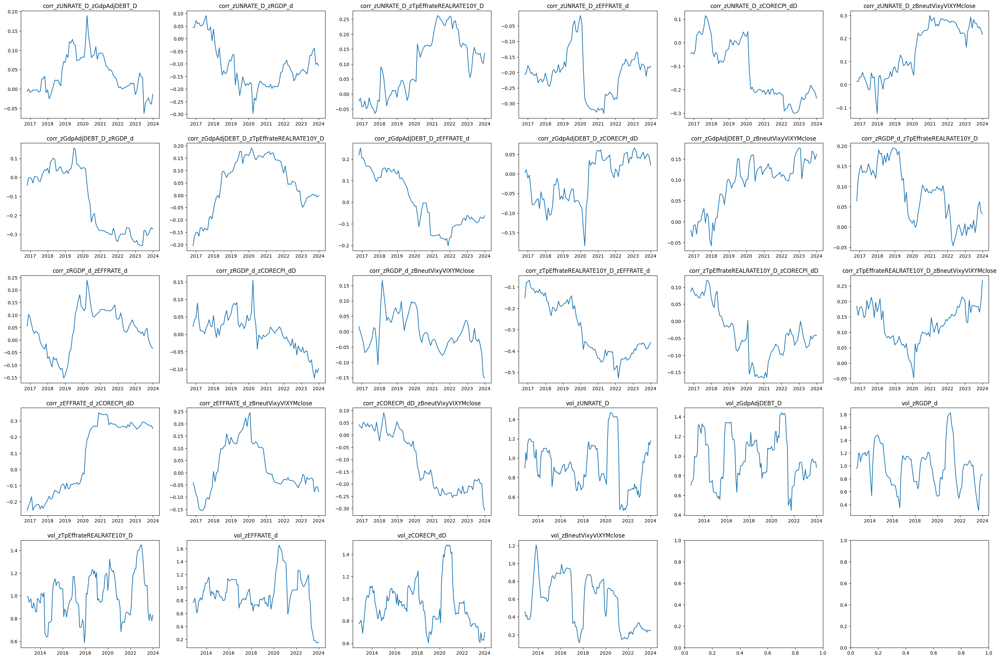

In [98]:
matrix_plot(type='ts',df=factor_inputs)

In [100]:
factor_inputs.to_excel("factor_inputs.xlsx", index=True)

In [101]:
factor_inputs = pd.merge(
    norm_factors_rcorr, norm_factors_rvol, 
    left_index=True, right_index=True, 
    how="inner" 
)


Mean of each factor within each regime:


,corr_zUNRATE_D_zGdpAdjDEBT_D,corr_zUNRATE_D_zRGDP_d,corr_zUNRATE_D_zTpEffrateREALRATE10Y_D,corr_zUNRATE_D_zEFFRATE_d,corr_zUNRATE_D_zCORECPI_dD,corr_zUNRATE_D_zBneutVixyVIXYMclose,corr_zGdpAdjDEBT_D_zRGDP_d,corr_zGdpAdjDEBT_D_zTpEffrateREALRATE10Y_D,corr_zGdpAdjDEBT_D_zEFFRATE_d,corr_zGdpAdjDEBT_D_zCORECPI_dD,...,corr_zEFFRATE_d_zCORECPI_dD,corr_zEFFRATE_d_zBneutVixyVIXYMclose,corr_zCORECPI_dD_zBneutVixyVIXYMclose,vol_zUNRATE_D,vol_zGdpAdjDEBT_D,vol_zRGDP_d,vol_zTpEffrateREALRATE10Y_D,vol_zEFFRATE_d,vol_zCORECPI_dD,vol_zBneutVixyVIXYMclose
Regime,,,,,,,,,,,,,,,,,,,,,
0,0.039679,-0.064108,0.004433,-0.167857,-0.002339,0.042078,0.038146,0.017521,0.118048,-0.060502,...,-0.144641,0.045284,0.009553,0.897339,0.985811,0.951700,1.022349,0.812006,0.924980,0.598364
1,0.022543,-0.143970,0.202240,-0.220613,-0.248081,0.255087,-0.306553,0.072689,-0.124446,0.032211,...,0.277876,-0.033511,-0.232399,0.615374,0.816304,0.973710,1.088308,0.990543,0.865808,0.230117
2,0.103996,-0.204211,0.163432,-0.313887,-0.205192,0.238148,-0.211473,0.161522,-0.079312,0.003965,...,0.277056,0.078276,-0.171357,1.398783,1.304791,1.288213,1.058375,1.438753,1.404082,0.643424
3,-0.019663,-0.086278,0.130531,-0.183815,-0.211200,0.255230,-0.300323,-0.003231,-0.080185,0.043212,...,0.277109,-0.043727,-0.216901,1.063165,0.905539,0.633549,0.906975,0.219105,0.666888,0.249724


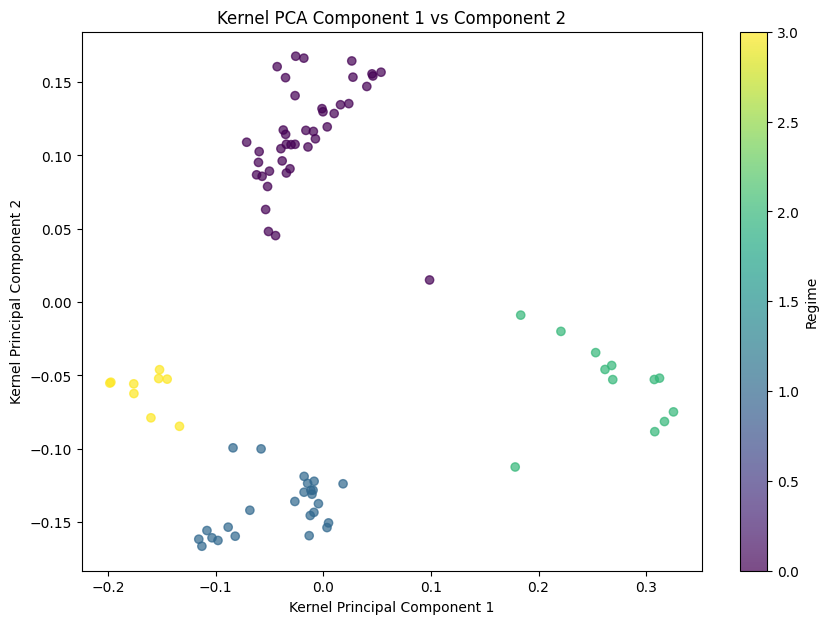

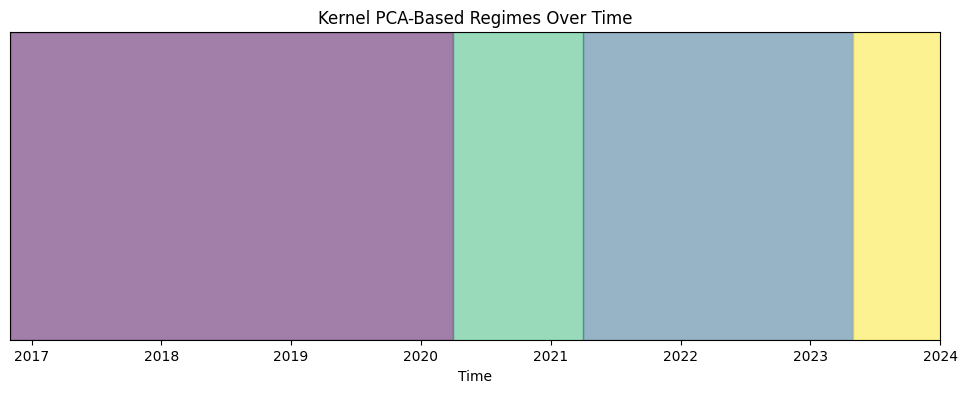

In [139]:
result = pca_regime_detection(
    data=factor_inputs.dropna(),
    n_components=2,
    n_clusters=4,
    clustering_method='kmeans',
    scale_data=False,
    use_kernel_pca = True,
    kpca_kernel = 'rbf',
    plot_results=True
)

In [149]:
def rolling_mean_per_regime(etf_returns: pd.DataFrame, regime_labels: pd.Series) -> pd.DataFrame:
    """
    Predicts ETF returns using the historical rolling mean per regime.

    Parameters:
    - etf_returns (pd.DataFrame): ETF returns (rows: time, columns: ETFs).
    - regime_labels (pd.Series): Regime classifications (matching index).

    Returns:
    - pd.DataFrame: Predicted ETF returns per regime.
    """
    # Merge on index (ensures alignment)
    df = etf_returns.merge(regime_labels.to_frame(name="Regime"), left_index=True, right_index=True, how="inner")

    # Compute rolling mean per regime
    regime_means = df.groupby("Regime").mean()

    # Map each time point to its corresponding regime mean
    predicted_returns = df["Regime"].map(regime_means.to_dict()).apply(pd.Series)

    return predicted_returns


Normalized Data Summary for MSCIEMclose by Regime:


,mean,std,min,max,count
Regime,,,,,
0,0.411770,1.209657,-2.573843,2.293171,41
1,-0.688811,1.059921,-2.002014,1.144642,25
2,0.859676,1.024326,-1.317680,1.924502,12
3,0.267702,0.872023,-1.470555,1.524808,9


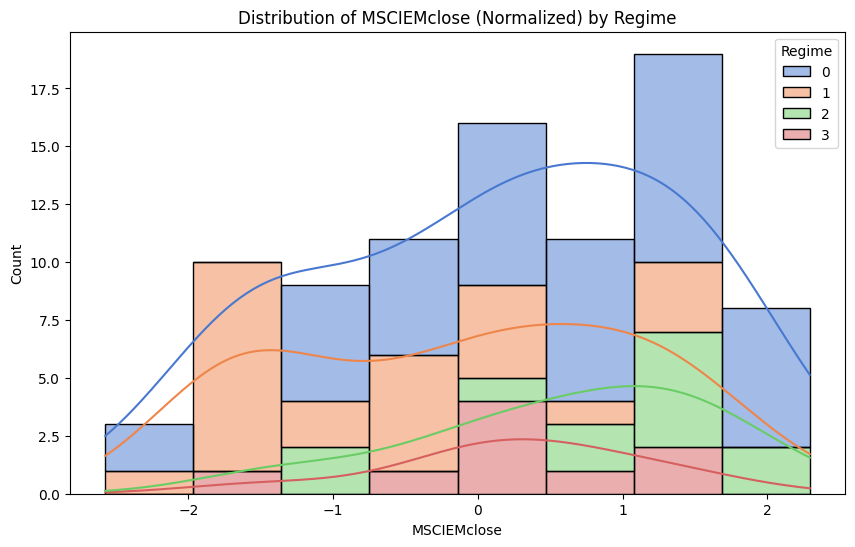


Normalized Data Summary for VTIclose_D by Regime:


,mean,std,min,max,count
Regime,,,,,
0,-0.025899,1.094315,-2.395913,2.359707,41
1,-0.146143,1.048831,-2.053630,1.514265,25
2,0.413087,0.729842,-0.767264,1.664446,12
3,0.127661,0.997396,-1.471915,1.723772,9


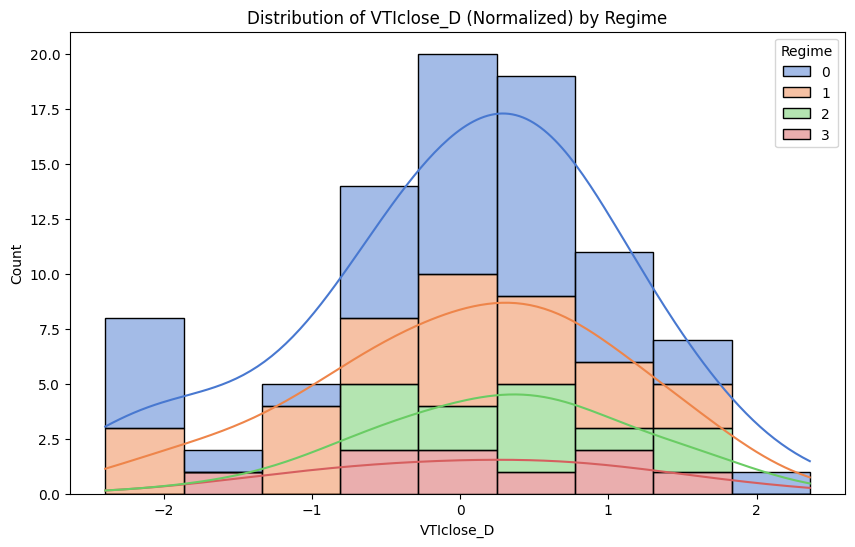


Normalized Data Summary for GOLDclose_D by Regime:


,mean,std,min,max,count
Regime,,,,,
0,0.070289,0.945174,-1.669102,2.324431,41
1,0.120272,0.941824,-1.318642,1.769838,25
2,-0.169593,1.211361,-1.738055,1.972000,12
3,-0.150877,0.753433,-1.307197,1.246586,9


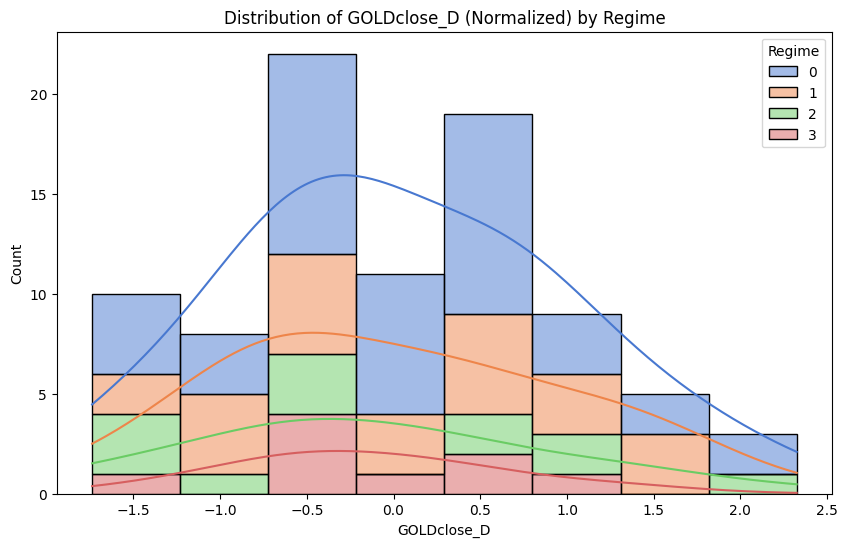


Normalized Data Summary for VIXYclose by Regime:


,mean,std,min,max,count
Regime,,,,,
0,-0.742101,0.829193,-1.685851,2.611680,41
1,-1.115831,0.476577,-1.832843,-0.021597,25
2,-0.260546,0.940502,-1.597273,1.347470,12
3,-1.253875,0.193721,-1.606855,-0.966997,9


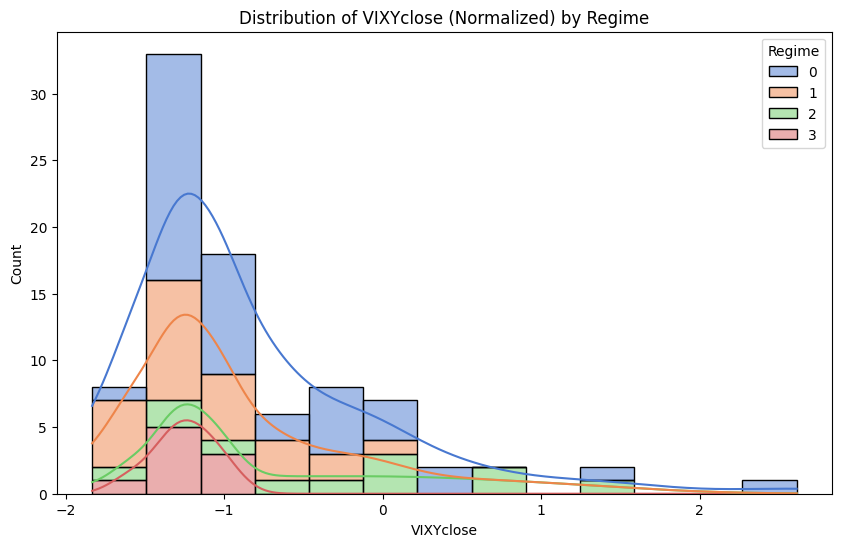


Normalized Data Summary for HYGclose_D by Regime:


,mean,std,min,max,count
Regime,,,,,
0,-0.235503,1.077483,-2.914806,2.546710,41
1,-0.235772,1.187675,-2.279210,2.085442,25
2,0.299319,0.570393,-0.274905,1.299023,12
3,0.130844,0.951944,-1.163150,1.980007,9


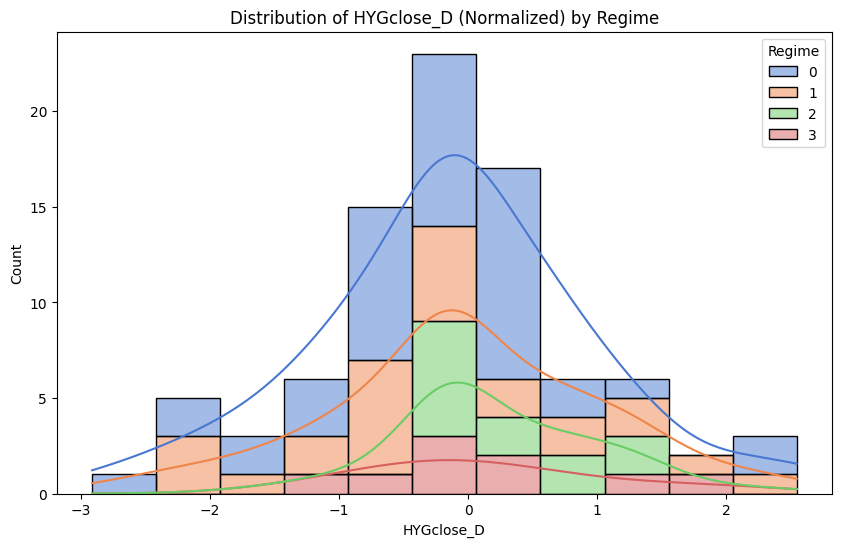


Normalized Data Summary for LQDclose_D by Regime:


,mean,std,min,max,count
Regime,,,,,
0,-0.030843,1.102932,-2.751834,2.024120,41
1,-0.042096,1.092397,-2.198611,1.893588,25
2,-0.036786,0.805777,-0.913222,1.337694,12
3,0.048455,0.968230,-1.182786,1.980103,9


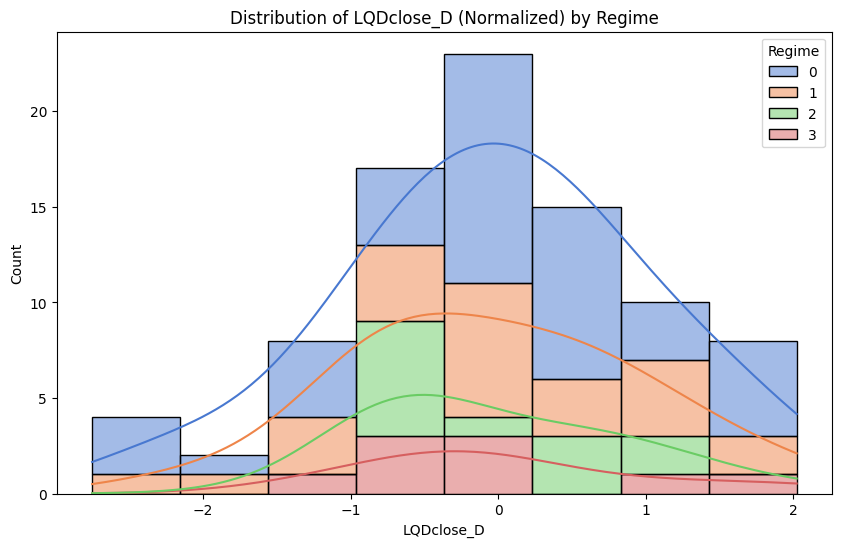


Normalized Data Summary for SPYTRclose_D by Regime:


,mean,std,min,max,count
Regime,,,,,
0,-0.009127,1.093680,-2.319652,2.455197,41
1,-0.111470,1.055747,-2.004100,1.465764,25
2,0.392238,0.758564,-0.848153,1.696677,12
3,0.121143,0.972115,-1.514732,1.720646,9


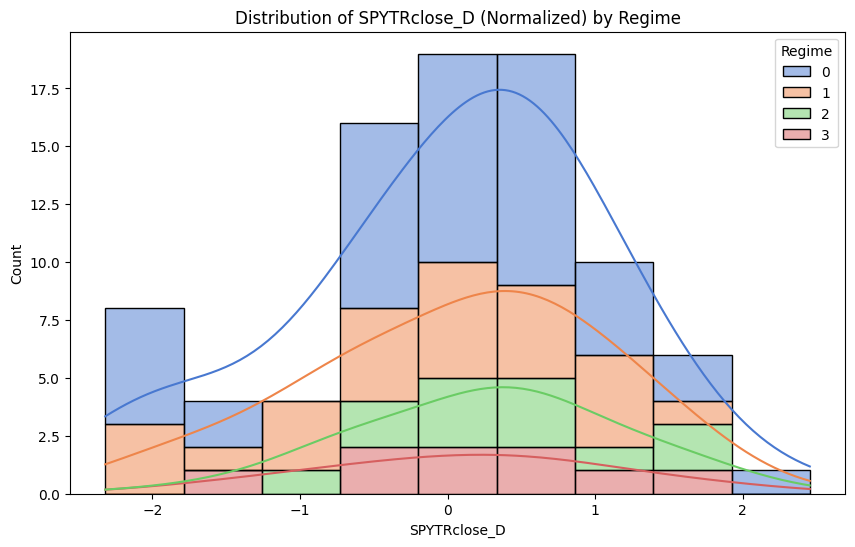


Normalized Data Summary for DBEclose_D by Regime:


,mean,std,min,max,count
Regime,,,,,
0,-0.079733,1.058559,-2.387397,1.299467,41
1,-0.080319,1.015082,-2.687506,1.328920,25
2,0.463896,0.620972,-0.667685,1.272001,12
3,0.200522,1.053650,-0.897629,1.947115,9


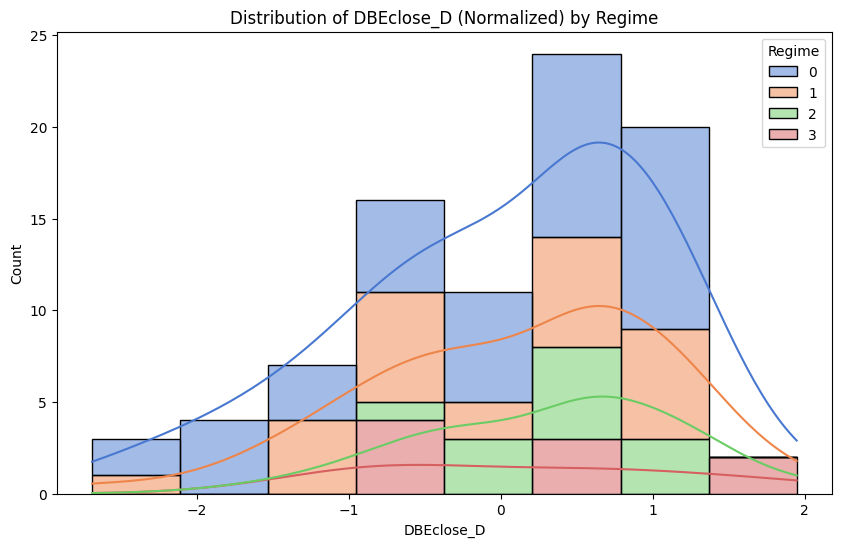


Normalized Data Summary for DBAclose_D by Regime:


,mean,std,min,max,count
Regime,,,,,
0,-0.051918,0.958618,-2.367846,1.814314,41
1,-0.081536,0.920423,-2.763717,1.897463,25
2,0.413451,0.782129,-1.219193,1.573103,12
3,0.183885,1.216344,-1.535533,1.621912,9


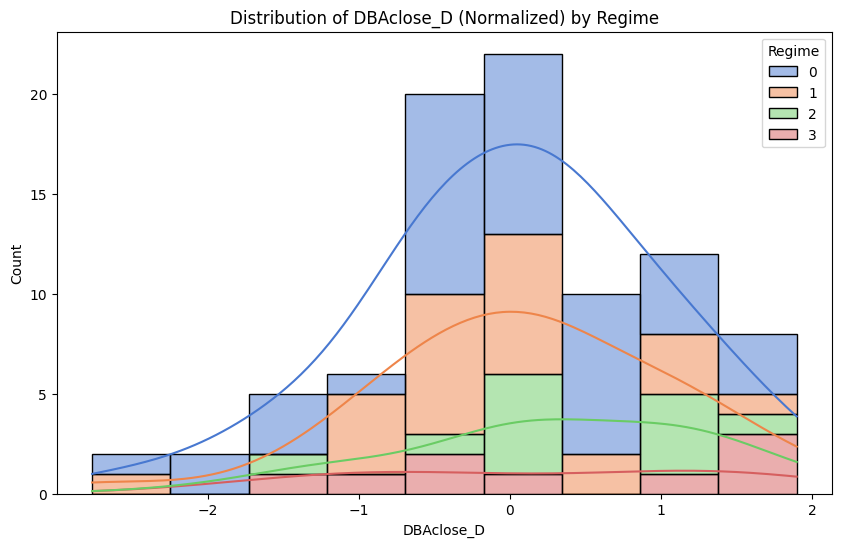


Normalized Data Summary for BILclose_DD by Regime:


,mean,std,min,max,count
Regime,,,,,
0,-0.022692,0.969758,-2.330763,2.542232,41
1,0.123363,1.236954,-1.837058,2.529386,25
2,-0.057803,0.904883,-2.839195,0.608216,12
3,-0.149345,0.870468,-1.390296,1.185536,9


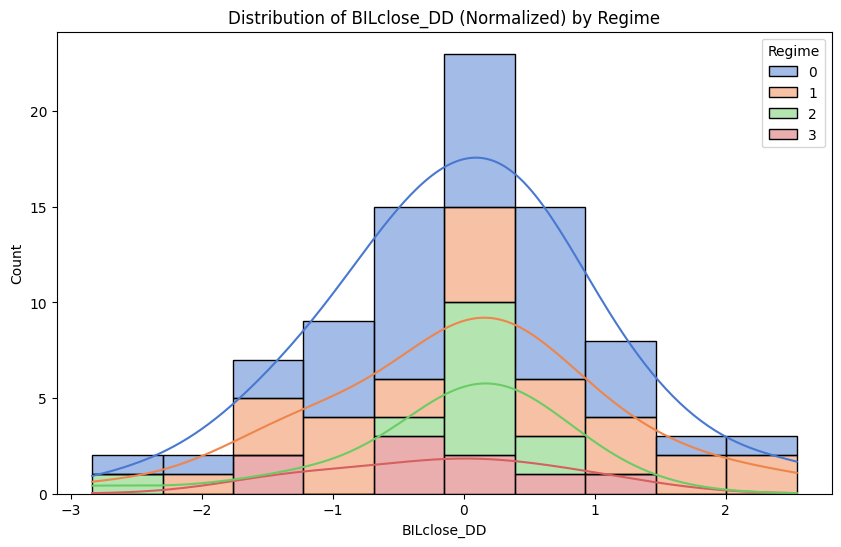


Normalized Data Summary for DBBclose_D by Regime:


,mean,std,min,max,count
Regime,,,,,
0,-0.117179,0.957355,-1.601353,1.846001,41
1,-0.103901,1.039498,-2.300497,1.500079,25
2,0.586909,0.966088,-0.801114,1.705619,12
3,0.071799,0.613101,-0.640903,0.887334,9


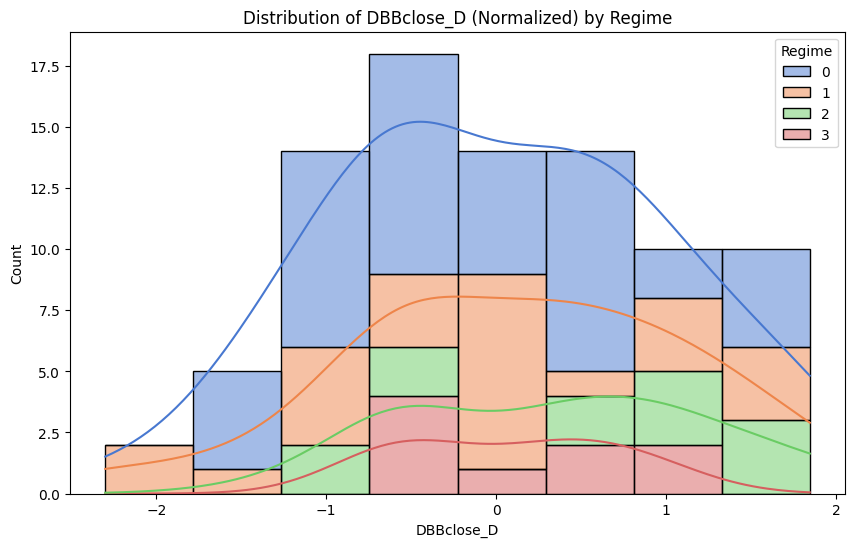


Normalized Data Summary for DBCclose_D by Regime:


,mean,std,min,max,count
Regime,,,,,
0,-0.117085,1.061348,-2.197612,1.479933,41
1,-0.072765,0.983880,-2.540572,1.318002,25
2,0.493667,0.684337,-0.857220,1.270439,12
3,0.114001,0.935653,-0.993243,1.901311,9


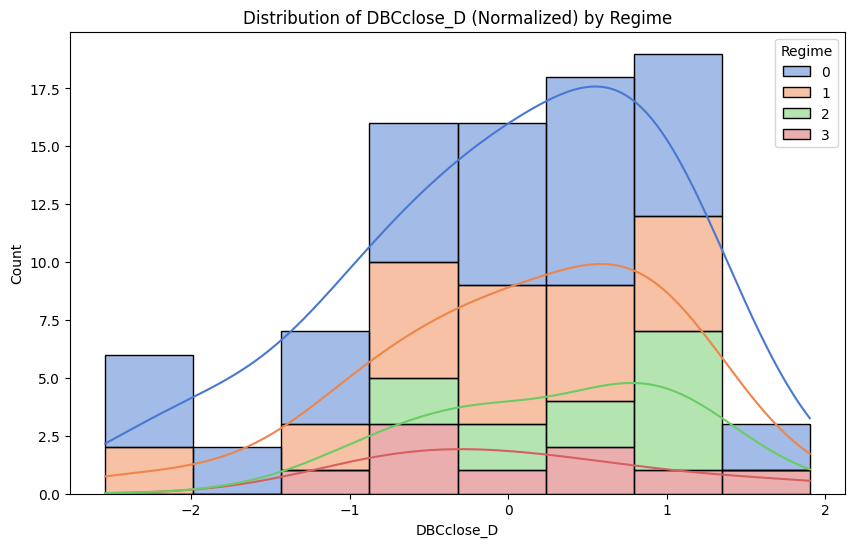


Normalized Data Summary for VNQclose_D by Regime:


,mean,std,min,max,count
Regime,,,,,
0,-0.126670,1.054218,-2.852563,1.917515,41
1,-0.078746,1.107570,-2.194791,1.690804,25
2,0.432863,0.472110,-0.216541,1.263276,12
3,0.101926,1.035609,-1.294545,1.794055,9


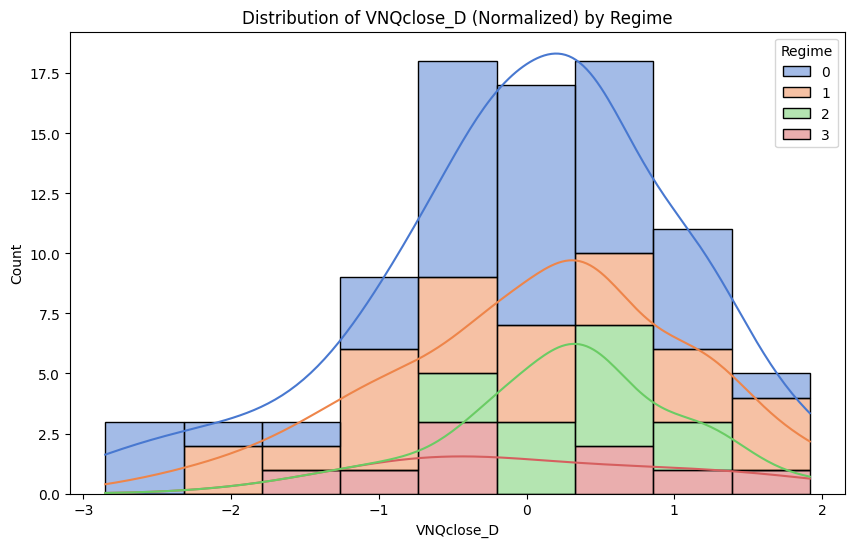


Normalized Data Summary for RWXclose by Regime:


,mean,std,min,max,count
Regime,,,,,
0,0.427566,1.153092,-2.863503,2.236836,41
1,-0.354087,1.244716,-2.330095,1.612343,25
2,-0.105505,1.163228,-1.851908,1.455762,12
3,-0.294458,1.023022,-1.943801,1.427728,9


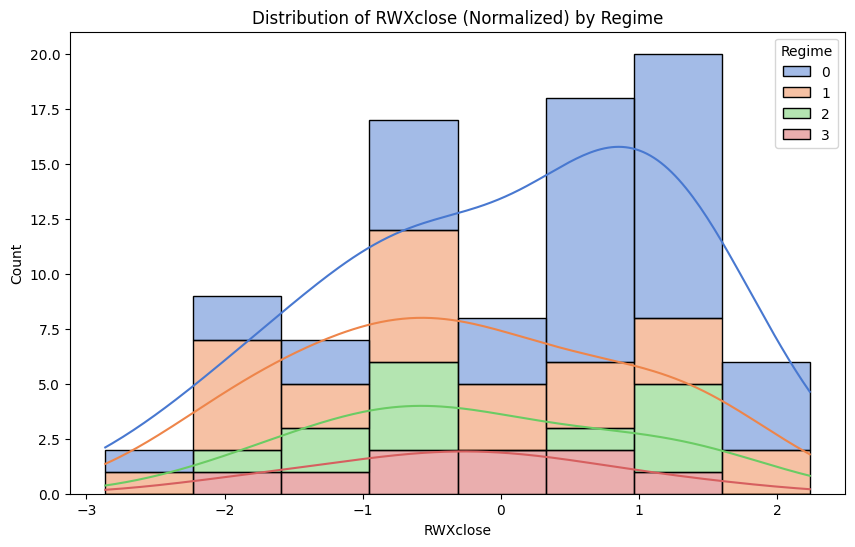


Normalized Data Summary for VGTclose_D by Regime:


,mean,std,min,max,count
Regime,,,,,
0,0.006349,1.102780,-2.141707,2.020176,41
1,-0.050348,1.052363,-2.119736,1.608585,25
2,0.300028,1.009469,-1.328341,1.723692,12
3,0.070972,1.007155,-1.709465,1.700019,9


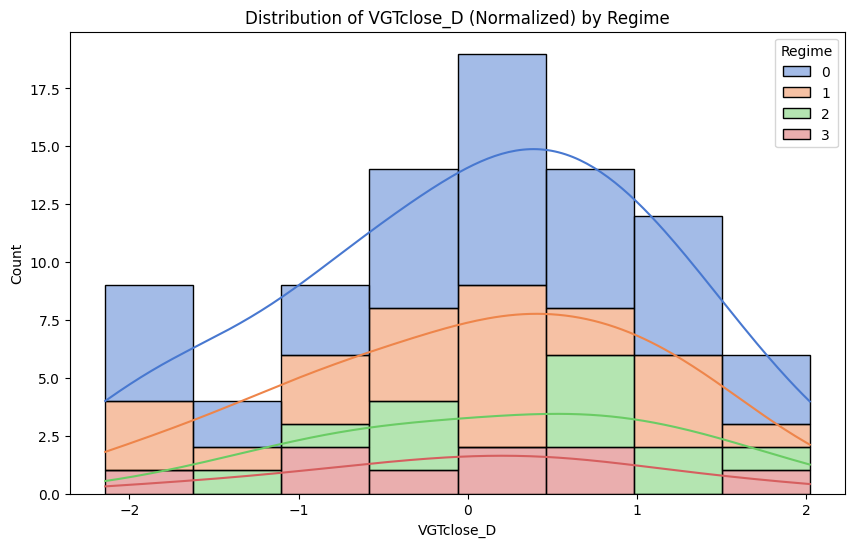


Normalized Data Summary for XLVclose_D by Regime:


,mean,std,min,max,count
Regime,,,,,
0,0.019058,1.024129,-2.084075,1.971400,41
1,-0.024965,1.015090,-2.129326,1.805091,25
2,0.215656,0.924729,-0.902292,2.056725,12
3,0.164061,0.967549,-0.944427,1.636908,9


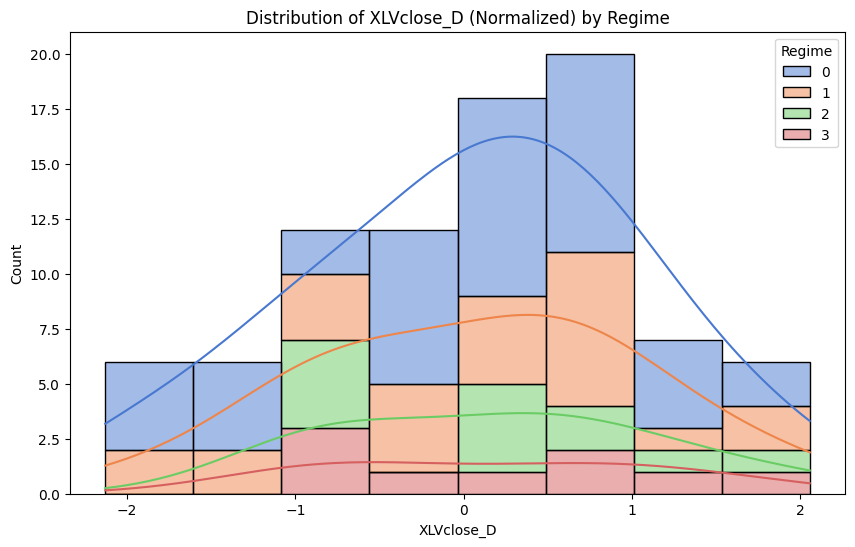


Normalized Data Summary for VFHclose_D by Regime:


,mean,std,min,max,count
Regime,,,,,
0,-0.130769,1.098299,-2.323476,2.253826,41
1,-0.220783,1.028908,-2.049585,1.789174,25
2,0.525252,0.542777,-0.273077,1.614265,12
3,0.276487,0.813130,-0.608988,1.671254,9


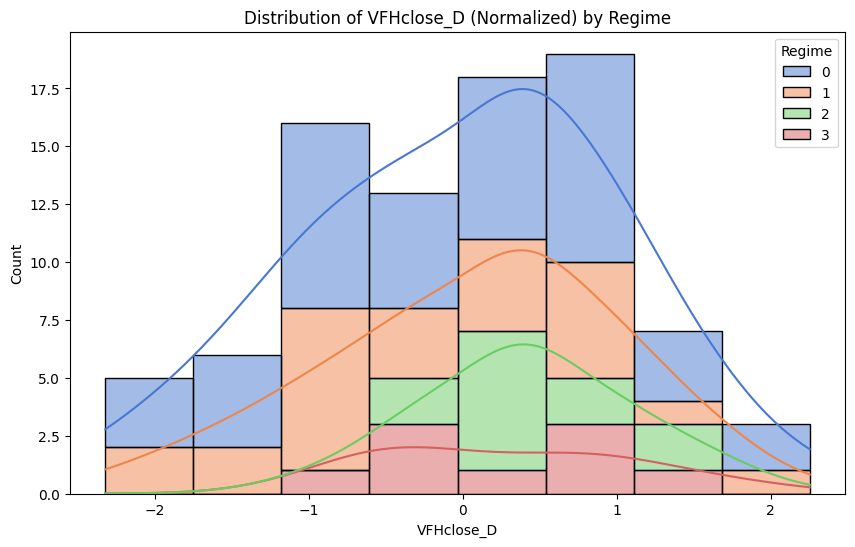


Normalized Data Summary for VCRclose_D by Regime:


,mean,std,min,max,count
Regime,,,,,
0,0.005823,1.096336,-2.458510,2.550050,41
1,-0.191368,1.023723,-2.281546,1.916751,25
2,0.449159,0.865167,-0.748497,2.064104,12
3,0.037471,0.954638,-1.163951,1.328074,9


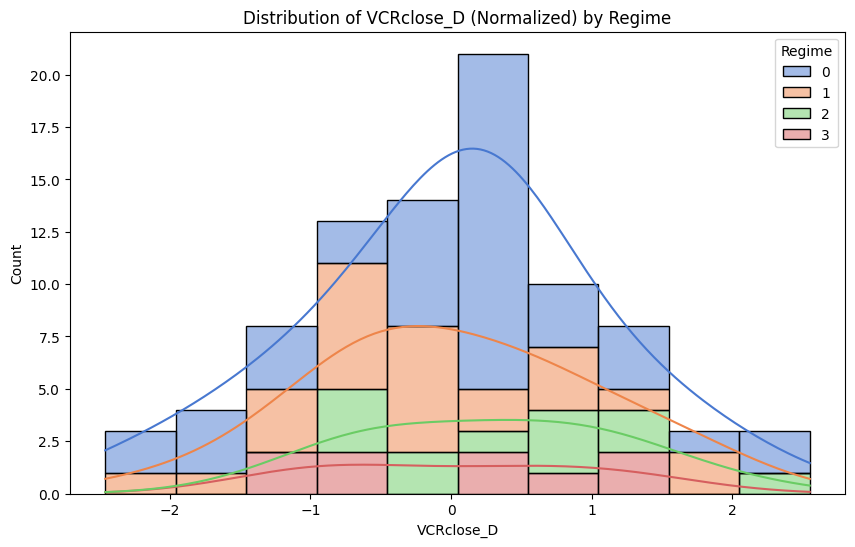


Normalized Data Summary for VDCclose_D by Regime:


,mean,std,min,max,count
Regime,,,,,
0,-0.066531,1.009354,-2.516456,1.876685,41
1,-0.067521,0.932330,-1.812677,2.084720,25
2,0.373369,0.922217,-0.982127,1.495421,12
3,-0.042455,0.862332,-1.180421,1.140195,9


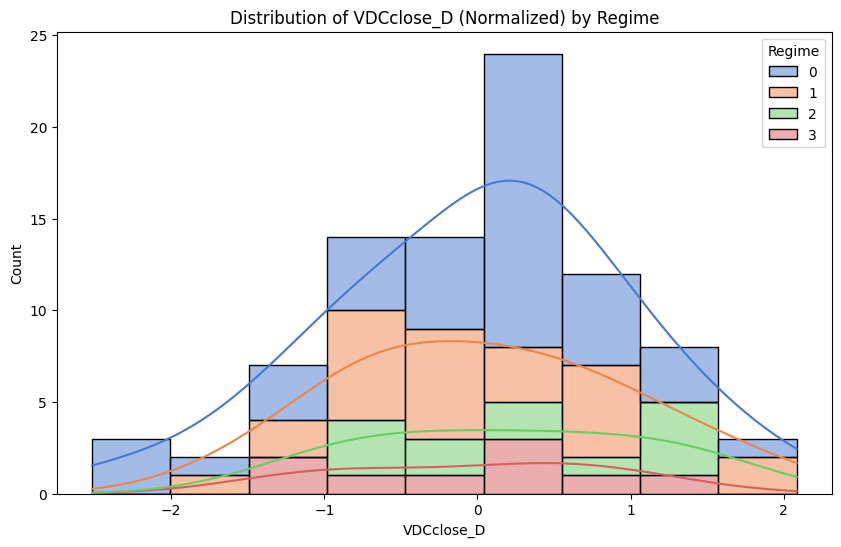


Normalized Data Summary for VDEclose_D by Regime:


,mean,std,min,max,count
Regime,,,,,
0,-0.154441,1.045744,-2.204439,1.882202,41
1,-0.010702,1.032792,-2.287409,1.722045,25
2,0.465413,0.635249,-0.490359,1.619174,12
3,-0.065497,0.617607,-1.055336,0.819606,9


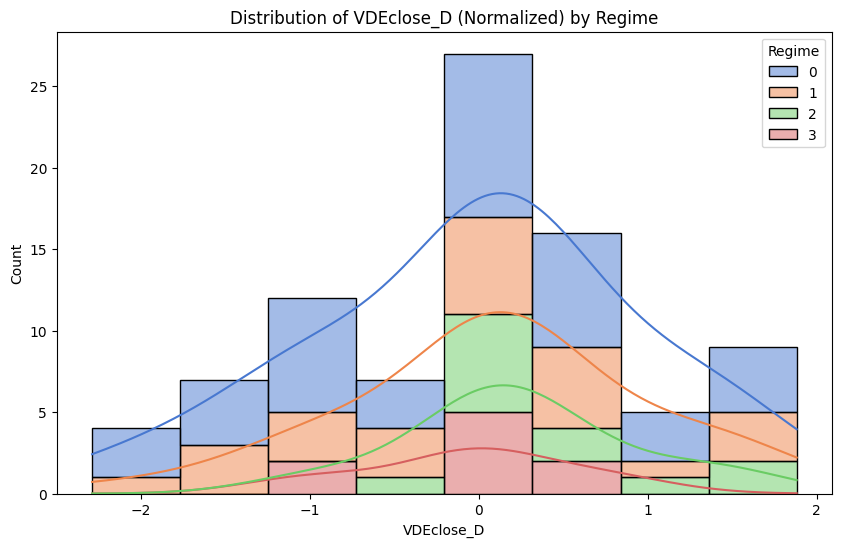


Normalized Data Summary for VISclose_D by Regime:


,mean,std,min,max,count
Regime,,,,,
0,-0.095320,1.111899,-2.376350,2.001633,41
1,-0.179592,0.974796,-1.666236,1.753979,25
2,0.529221,0.624952,-0.477804,1.761668,12
3,0.081755,1.094917,-1.405199,1.561016,9


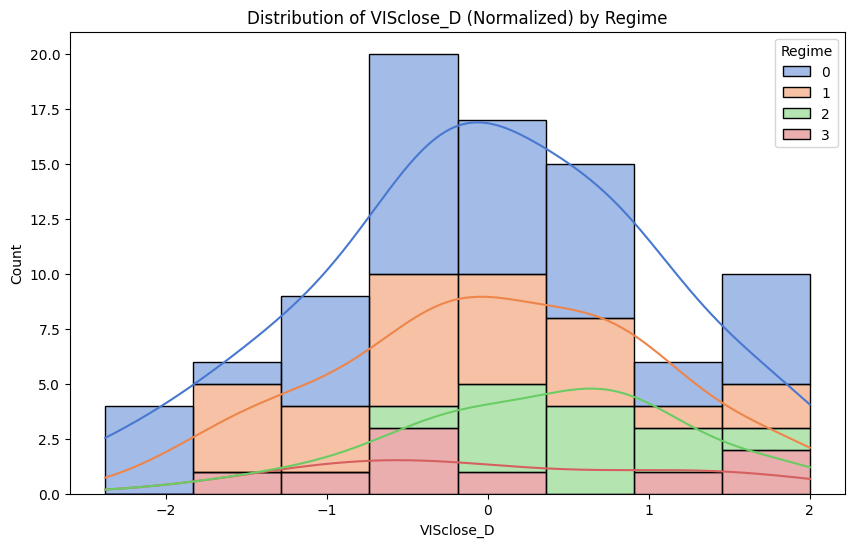


Normalized Data Summary for VAWclose_D by Regime:


,mean,std,min,max,count
Regime,,,,,
0,-0.117597,1.028445,-2.650462,1.670306,41
1,-0.137862,1.043702,-2.120207,1.276565,25
2,0.546833,0.655374,-0.639700,1.592213,12
3,0.006761,0.941043,-0.974860,1.323065,9


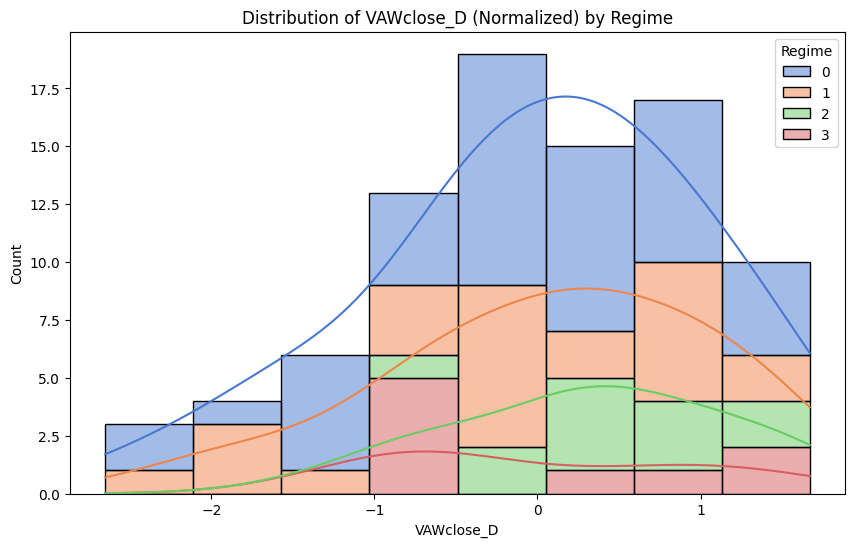


Normalized Data Summary for VPUclose_D by Regime:


,mean,std,min,max,count
Regime,,,,,
0,-0.015005,1.062271,-2.620772,1.681528,41
1,-0.038366,0.969918,-1.924675,1.663657,25
2,0.265679,0.810365,-1.128514,1.866354,12
3,-0.022372,0.864475,-1.051035,1.357276,9


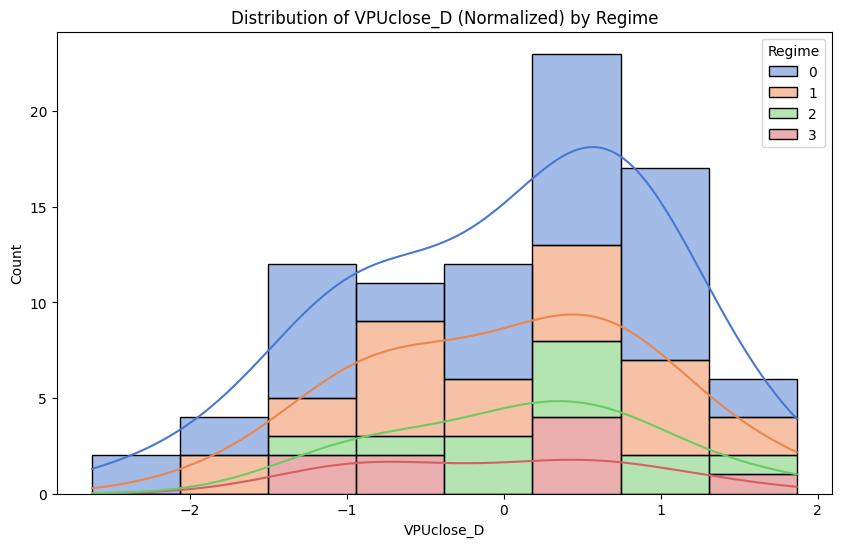

{'MSCIEMclose': {'Normalized':             mean       std       min       max  count
  Regime                                               
  0       0.411770  1.209657 -2.573843  2.293171     41
  1      -0.688811  1.059921 -2.002014  1.144642     25
  2       0.859676  1.024326 -1.317680  1.924502     12
  3       0.267702  0.872023 -1.470555  1.524808      9},
 'VTIclose_D': {'Normalized':             mean       std       min       max  count
  Regime                                               
  0      -0.025899  1.094315 -2.395913  2.359707     41
  1      -0.146143  1.048831 -2.053630  1.514265     25
  2       0.413087  0.729842 -0.767264  1.664446     12
  3       0.127661  0.997396 -1.471915  1.723772      9},
 'GOLDclose_D': {'Normalized':             mean       std       min       max  count
  Regime                                               
  0       0.070289  0.945174 -1.669102  2.324431     41
  1       0.120272  0.941824 -1.318642  1.769838     25
  2      -0.16

In [144]:
analyze_regimes(normalized_df=norm_assets.dropna(),hidden_states=result['Regime'],hidden_state_dates=factor_inputs.dropna().index)

In [ ]:
def classify_regimes_fcm(data, n_clusters=4, m=1.5, max_iter=1000, seed=42, show_plot=True, debug=False):
    """
    Classifies market regimes using Fuzzy C-Means clustering with robust Optimisation.

    Parameters:
    - data (pd.DataFrame): DataFrame containing features for clustering.
    - n_clusters (int): Number of clusters (default 4).
    - m (float): Fuzziness parameter (default 1.5, lower means sharper clusters).
    - max_iter (int): Maximum iterations for FCM.
    - seed (int): Random seed for reproducibility.
    - show_plot (bool): If True, plots the regime scores over time.
    - debug (bool): If True, prints additional debugging information.

    Returns:
    - pd.Series: Continuous regime scores over time.
    - np.ndarray: Membership probability matrix.
    - np.ndarray: Cluster centers.
    """

    # Step 1: Standardize the data
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)

    if debug:
        print("Variance of Scaled Data:\n", pd.DataFrame(data_scaled, columns=data.columns).var())

    # Step 2: PCA Check (Is there structure in the data?)
    pca = PCA(n_components=2)
    pca_transformed = pca.fit_transform(data_scaled)
    explained_variance = pca.explained_variance_ratio_.sum()

    if debug:
        print(f"\nExplained Variance from PCA: {explained_variance:.2f}")
        if explained_variance < 0.2:
            print("⚠ Warning: Low variance in PCA—data may lack structure for clustering.")

    # Step 3: Run FCM with multiple initializations for better clustering
    best_cntr, best_u = None, None
    best_variance = -np.inf  # Track best initialization
    np.random.seed(seed)

    for i in range(3):  # Try 3 different seeds
        cntr, u, _, _, _, _, _ = fuzz.cluster.cmeans(
            data_scaled.T, n_clusters, m, error=0.005, maxiter=max_iter, seed=i
        )

        # Check if initialization is producing distinguishable results
        variance_check = np.var(cntr)
        if variance_check > best_variance:
            best_cntr, best_u, best_variance = cntr, u, variance_check

    # Step 4: Compute continuous regime scores
    membership_scores = np.dot(best_u.T, np.arange(n_clusters))

    # Step 5: Convert to DataFrame with timestamps
    regime_series = pd.Series(membership_scores, index=data.index, name="Regime Score")

    # Step 6: Plot Results
    if show_plot:
        plt.figure(figsize=(12, 5))
        plt.scatter(regime_series.index, regime_series, c=regime_series, cmap="viridis", edgecolor='k')
        plt.colorbar(label="Continuous Regime Score")
        plt.xlabel("Time")
        plt.ylabel("Regime Score")
        plt.title("Market Regime Changes (Fuzzy C-Means)")
        plt.show()

    if debug:
        print("\nFinal Cluster Centers:\n", best_cntr)
        print("\nSample Membership Probabilities:\n", best_u[:, :5])  # Show first 5 rows

    return regime_series, best_u, best_cntr

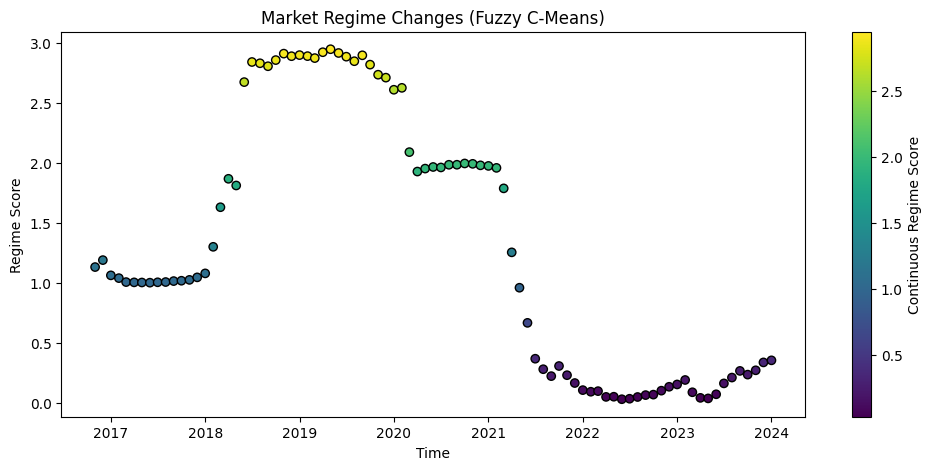

(2016-11-01    1.134203
 2016-12-01    1.192199
 2017-01-01    1.065102
 2017-02-01    1.042040
 2017-03-01    1.009047
                 ...   
 2023-09-01    0.268820
 2023-10-01    0.237903
 2023-11-01    0.273867
 2023-12-01    0.339645
 2024-01-01    0.356856
 Freq: MS, Name: Regime Score, Length: 87, dtype: float64,
 array([[2.38581779e-02, 2.96957976e-02, 1.09643811e-02, 8.61440366e-03,
         2.42773174e-03, 1.44284555e-03, 1.28439045e-03, 1.19274446e-03,
         1.97969622e-03, 2.42531772e-03, 3.72714144e-03, 3.59503744e-03,
         4.50703623e-03, 1.32958044e-02, 1.04852453e-02, 3.07401320e-02,
         5.53782437e-02, 3.75658736e-02, 3.31553494e-02, 1.60902842e-02,
         1.22563738e-02, 1.35217294e-02, 1.63194859e-02, 1.22222500e-02,
         7.52241606e-03, 1.02386987e-02, 9.85450240e-03, 8.91910686e-03,
         1.01966870e-02, 8.45750028e-03, 5.81322858e-03, 1.18232675e-02,
         1.74869796e-02, 2.48879924e-02, 1.50265742e-02, 3.01408151e-02,
         4.49359924e

In [125]:
classify_regimes_fcm(factor_inputs.dropna())

In [132]:
def plot_gmm(gmm, X, label=True, ax=None):
    ax = ax or plt.gca()
    labels = gmm.fit(X).predict(X)
    if label:
        ax.scatter(X[:, 0], X[:, 1], c=labels, s=40, cmap='viridis', zorder=2)
    else:
        ax.scatter(X[:, 0], X[:, 1], s=40, zorder=2)
    ax.axis('equal')
    
    w_factor = 0.2 / gmm.weights_.max()
    for pos, covar, w in zip(gmm.means_, gmm.covariances_, gmm.weights_):
        draw_ellipse(pos, covar, alpha=w * w_factor, ax=ax)

def draw_ellipse(position, covariance, ax=None, **kwargs):
    """Draw an ellipse with a given position and covariance"""
    ax = ax or plt.gca()
    
    if covariance.shape == (2, 2):
        U, s, Vt = np.linalg.svd(covariance)
        angle = np.degrees(np.arctan2(U[1, 0], U[0, 0]))
        width, height = 2 * np.sqrt(s)
    else:
        angle = 0
        width, height = 2 * np.sqrt(covariance)
    
    for nsig in range(1, 4):
        ax.add_patch(Ellipse(position, nsig * width, nsig * height,
                             angle, **kwargs))

def classify_regimes_gmm(data, n_components=3, column_to_plot=None, show_plot=True):
    """
    Classifies market regimes using Gaussian Mixture Models and calculates descriptive statistics for each regime,
    optionally overlaying a specified column on the regime plot.

    Parameters:
    data (pd.DataFrame): DataFrame containing the market data features for modeling.
    n_components (int): Number of clusters or Gaussian components in the model.
    column_to_plot (str): Column name to plot against the regimes. Must be a column in `data`.
    show_plot (bool): If True, plots the results of the classification.

    Returns:
    tuple: (mean_returns_df, volatilities_df, labels, model)
    """
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data.dropna(subset=[column_to_plot]) if column_to_plot else data)
    
    gmm = GaussianMixture(n_components=n_components, random_state=42)
    gmm.fit(data_scaled)
    labels = gmm.predict(data_scaled)
    
    # Calculate mean returns and volatilities for each regime
    data['Regime'] = labels
    mean_returns_df = data.groupby('Regime').mean()
    volatilities_df = data.groupby('Regime').std()
    
    if show_plot:
        fig, ax = plt.subplots(figsize=(10, 2))
        cmap = plt.get_cmap('viridis', np.unique(labels).max() + 1)
        
        start = data.index.min()
        end = data.index.max()
        for i, (date, label) in enumerate(zip(data.index, labels)):
            if i == 0:
                start_label = label
                start_date = date
            elif label != start_label:
                ax.axvspan(start_date, date, color=cmap(start_label), alpha=0.5)
                start_label = label
                start_date = date
            if i == len(labels) - 1:
                ax.axvspan(start_date, date, color=cmap(label), alpha=0.5)
        
        ax.set_xlim([data.index.min(), data.index.max()])
        ax.set_yticks([])
        ax.set_xlabel("Time")
        plt.title('Market Regime Changes')
        plt.show()

    return mean_returns_df, volatilities_df, labels, gmm


In [196]:
norm_data.columns

Index(['zUNRATE_DIFF1', 'zCPI_DIFF2', 'zCORECPI_DIFF2', 'zEFFRATE_DIFF2',
       'zBERATE10Y', 'zGOLDclose', 'zVIX1Mclose', 'zSPYTRclose', 'zDBEclose',
       'zDBAclose', 'zDBBclose', 'zGdpAdjDEBT_DIFF1', 'zRGDP_DIFF1',
       'zREALRATE10Y_DIFF1', 'zSpytrBneutMSCIEMclose', 'zBneutVix6MVIX1M6M',
       'zVnqBneutRWXclose', 'zSpytrBneutHYGclose', 'zSpytrBneutLQDclose',
       'zSpytrBneutVNQclose'],
      dtype='object')

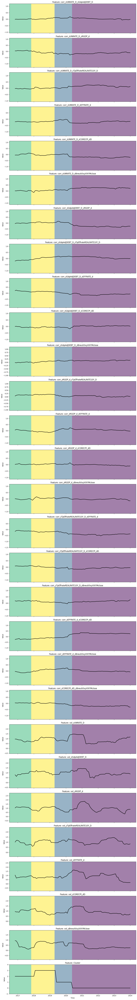

,corr_zUNRATE_D_zGdpAdjDEBT_D,corr_zUNRATE_D_zRGDP_d,corr_zUNRATE_D_zTpEffrateREALRATE10Y_D,corr_zUNRATE_D_zEFFRATE_d,corr_zUNRATE_D_zCORECPI_dD,corr_zUNRATE_D_zBneutVixyVIXYMclose,corr_zGdpAdjDEBT_D_zRGDP_d,corr_zGdpAdjDEBT_D_zTpEffrateREALRATE10Y_D,corr_zGdpAdjDEBT_D_zEFFRATE_d,corr_zGdpAdjDEBT_D_zCORECPI_dD,...,corr_zEFFRATE_d_zBneutVixyVIXYMclose,corr_zCORECPI_dD_zBneutVixyVIXYMclose,vol_zUNRATE_D,vol_zGdpAdjDEBT_D,vol_zRGDP_d,vol_zTpEffrateREALRATE10Y_D,vol_zEFFRATE_d,vol_zCORECPI_dD,vol_zBneutVixyVIXYMclose,Cluster
2016-11-01,-0.006365,0.044740,-0.023356,-0.206810,-0.046851,0.014153,-0.041657,-0.204755,0.218963,0.003968,...,-0.041045,0.041584,0.961369,0.794652,1.035870,1.002484,1.039667,0.948901,0.940578,2.0
2016-12-01,0.000003,0.045125,-0.013923,-0.199910,-0.041999,0.013866,-0.002992,-0.166507,0.251498,0.010345,...,-0.059345,0.032937,0.954164,0.629180,1.160032,1.170733,0.681326,0.910376,0.904415,2.0
2017-01-01,-0.008635,0.071368,-0.042582,-0.177886,-0.048157,0.032561,-0.001607,-0.150511,0.203780,-0.010692,...,-0.089117,0.028367,0.902260,0.825415,1.125684,1.171053,0.748611,0.913121,0.677743,2.0
2017-02-01,-0.006704,0.059724,-0.041029,-0.187076,-0.032569,0.033346,-0.007390,-0.150053,0.203570,-0.003282,...,-0.102575,0.052459,0.871290,0.823080,1.106116,1.089220,0.753891,0.883920,0.327830,2.0
2017-03-01,-0.002236,0.063106,-0.023392,-0.202865,0.030183,0.052985,-0.030570,-0.166124,0.184958,-0.033352,...,-0.143897,0.044164,0.873017,0.802840,1.098786,0.951755,0.811809,1.091277,0.334112,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-09-01,-0.030124,-0.047425,0.131735,-0.182291,-0.181675,0.264621,-0.307036,0.003830,-0.089414,0.038411,...,-0.025475,-0.178785,1.057199,0.966616,0.309019,0.782820,0.182957,0.693849,0.227646,0.0
2023-10-01,-0.022749,-0.038578,0.135915,-0.213088,-0.191937,0.245802,-0.300382,-0.000881,-0.069668,0.046433,...,-0.078811,-0.198632,1.026410,0.935119,0.699074,0.840072,0.159593,0.625984,0.252040,0.0
2023-11-01,-0.035922,-0.102117,0.109420,-0.182554,-0.202288,0.249504,-0.278489,0.001031,-0.072118,0.050843,...,-0.059706,-0.199098,1.161078,0.938625,0.827951,0.812843,0.146354,0.631563,0.246210,0.0
2023-12-01,-0.039190,-0.097795,0.101897,-0.185368,-0.210999,0.234865,-0.265144,-0.007901,-0.076616,0.044556,...,-0.057690,-0.285415,1.137423,0.940712,0.862645,0.779521,0.151499,0.626017,0.244726,0.0


In [159]:
classify_regimes_kmeans(factor_inputs.dropna(), factor_inputs.columns, n_clusters=4)

C:\Users\lucas\AppData\Local\Temp\ipykernel_19872\2868121334.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Regime'] = labels


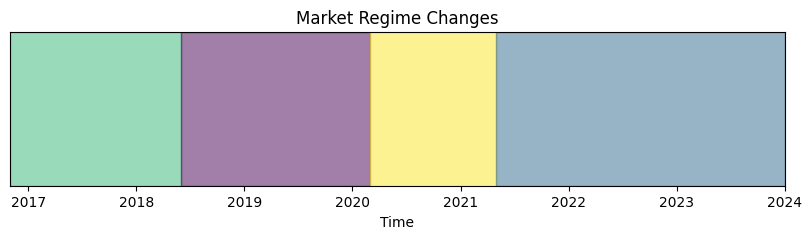

(        corr_zUNRATE_D_zGdpAdjDEBT_D  corr_zUNRATE_D_zRGDP_d  \
 Regime                                                         
 0                           0.072234               -0.143470   
 1                           0.009414               -0.127101   
 2                          -0.000655                0.029772   
 3                           0.103304               -0.200942   
 
         corr_zUNRATE_D_zTpEffrateREALRATE10Y_D  corr_zUNRATE_D_zEFFRATE_d  \
 Regime                                                                      
 0                                     0.015770                  -0.125227   
 1                                     0.181279                  -0.207680   
 2                                    -0.016657                  -0.214009   
 3                                     0.169773                  -0.304930   
 
         corr_zUNRATE_D_zCORECPI_dD  corr_zUNRATE_D_zBneutVixyVIXYMclose  \
 Regime                                                       

In [162]:
classify_regimes_gmm(factor_inputs.dropna(), n_components=4)

# other stuff


clustering/dendrograms

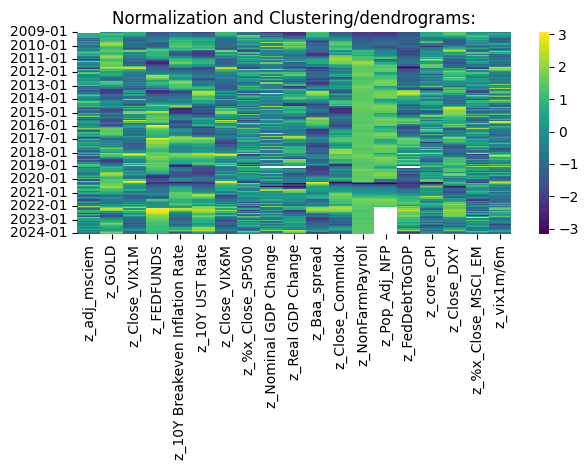

In [439]:
# fig, axs = plt.subplots(1,2, figsize=(16,6))
# sns.heatmap(data, cmap='viridis',ax=axs[0])
# axs[0].set_title('Clustering/dendrogram')

sns.heatmap(data_norm, cmap='viridis')
plt.title('Normalization and Clustering/dendrograms:')
ax = plt.gca()
tick_positions = np.arange(0, len(df.index), 12)
tick_labels = [date.strftime('%Y-%m') for date in df.index[tick_positions]]
ax.set_yticks(tick_positions)
ax.set_yticklabels(tick_labels, rotation=0)
plt.tight_layout()
plt.show()

determining dimensions for classification  
to do

In [ ]:
#Pearson (linear) correlation, Kendall (non-parametric) correlation, betas and covariance
# Pearson correlation
print('Pearson correlation: \n')
print(data_main.corr(), '\n')

#Kendall correlation 
print('Kendall correlation:\n')
print(data_main.corr(method='kendall'), '\n')

# covariance
print('Covariance:\n')
print(data_main.cov(), '\n')

#betas
#to do

autocorrelation and partial autocorrelation

In [ ]:
def plot_acf_pacf(df, col, title, lags=12):
    print(f'{title}:', sm.tsa.acf(df[col]), '\n')

    fig, axes = plt.subplots(2, 1, figsize=(12,8))
    sm.graphics.tsa.plot_acf(df[col].values.squeeze(), lags=lags, ax=axes[0], title=f'Autocorrelation {title}')
    sm.graphics.tsa.plot_pacf(df[col], lags=lags, ax=axes[1], title=f'Partial Autocorrelation {title}')
    plt.show()

for df, date_col, cols, title in dflib:
    plot_acf_pacf(df, cols[-1], title)
    
 

autoregression models

In [17]:
#ARIMA model - analysis of residuals

def arima_v1 (df, var, p, q,r):
  #define ARIMA, fit and assess by AIC, BIC , hqic
  arma_mod = ARIMA(df[var], order=(p, r, q)).fit()
  print(arma_mod.params)
  print(arma_mod.aic, arma_mod.bic, arma_mod.hqic)
  print(arma_mod.summary())

  #Durbin-Watson test for residuals
  sm.stats.durbin_watson(arma_mod.resid.values)
  fig = plt.figure(figsize=(12, 8))
  ax = fig.add_subplot(111)
  ax = arma_mod.resid.plot(ax=ax)

  #normal test & Jarque_bera test, qqplot for residuals 
  resid = arma_mod.resid
  print('Normality of Residuals: ',stats.normaltest(resid))
  print('Normality of Residuals: ', jarque_bera(resid))
  fig = plt.figure(figsize=(12, 8))
  ax = fig.add_subplot(111)
  fig = qqplot(resid, line="q", ax=ax, fit=True)

   #ACF and PACF for residuals
  fig = plt.figure(figsize=(12, 8))
  ax1 = fig.add_subplot(211)
  fig = sm.graphics.tsa.plot_acf(resid.values.squeeze(), lags=12, ax=ax1)
  ax2 = fig.add_subplot(212)
  fig = sm.graphics.tsa.plot_pacf(resid, lags=12, ax=ax2)

  #analysis residuals by lag
  r, q_r, p_r = sm.tsa.acf(resid.values.squeeze(), fft=True, qstat=True)
  data = np.c_[np.arange(1, len(p_r)+1), r[1:], q_r, p_r]
  table = pd.DataFrame(data, columns=["lag", "AC", "Q", "Prob(>Q)"])
  print(table.set_index("lag"))

  #predicts value next time
  predicted = arma_mod.predict()
  print(predicted)
   

In [39]:
#splits in train and test,fits on train set, tests on test set

#model ARIMA to fit (on train set - history) and forecast 1 period
def arima_forecast(history, p, q, r):
    model = ARIMA(history, order=(p,r,q))
    model_fit = model.fit()
    
    output = model_fit.forecast()
    yhat = output[0]
    return yhat

def arima_v2(df, var, p, q,r): 
    X = df[var].values
    size = int(len(X) * 0.8)
    train, test = X[0:size], X[size:len(X)]

    history = [x for x in train]
    predictions = list()
    for t in range(len(test)):
      yhat = arima_forecast(history, p, q,r)
      predictions.append(yhat)
      obs = test[t]
      history.append(obs)
    
    #plots actual vs predicted
    plt.figure(figsize=(12, 6), dpi=100)
    plt.plot(df.iloc[size:,:].index, test, label='Actual')
    plt.plot(df.iloc[size:,:].index, predictions, color='red', label='Predicted')
    plt.title('ARIMA Predictions vs Actual Values for '+ var)
    plt.xlabel('Date')
    plt.ylabel(var)
    plt.legend()
    plt.show()   

    #mape and rmse for test set
    mape = (np.abs((predictions-test)/test)).mean()
    rmse = np.sqrt((((predictions-test)*(predictions-test)).sum()/(len(predictions)-1)))
    
    return mape, rmse



In [19]:
# ARIMA(p,0,q) with p, q:

# https://people.duke.edu/~rnau/411arim3.htm  --  contains rules to get p and q

# ARIMA(p,0,q) with p, q:  p and q from pacf and acf


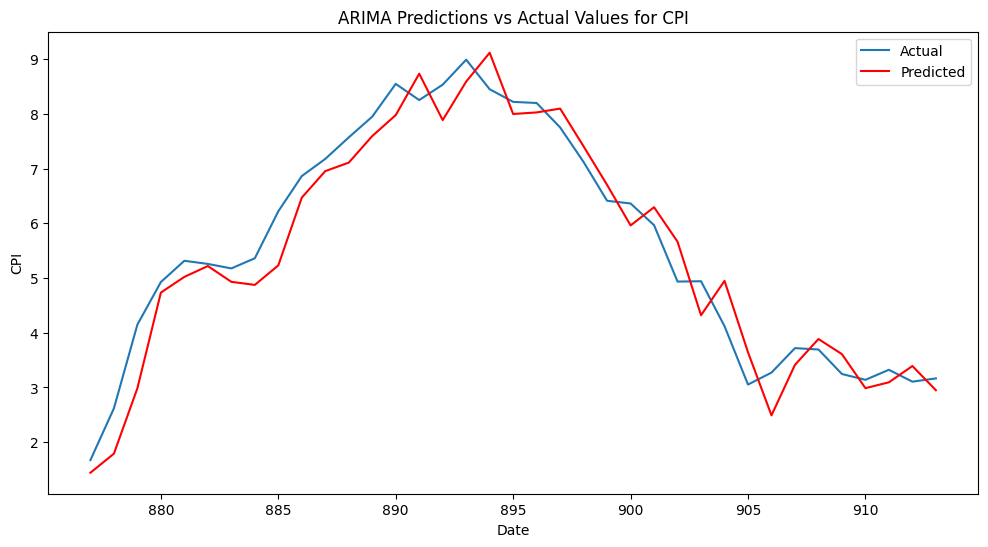

mape_cpi: 0.09127678275833465
const     2.221600
ar.L1     1.326146
ar.L2    -0.358719
ma.L1     0.165916
sigma2    0.132197
dtype: float64
161.99642039631664 178.0164538317006 168.49070885268952
                               SARIMAX Results                                
Dep. Variable:                    CPI   No. Observations:                  182
Model:                 ARIMA(2, 0, 1)   Log Likelihood                 -75.998
Date:                Sun, 02 Jun 2024   AIC                            161.996
Time:                        14:02:01   BIC                            178.016
Sample:                             0   HQIC                           168.491
                                - 182                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         

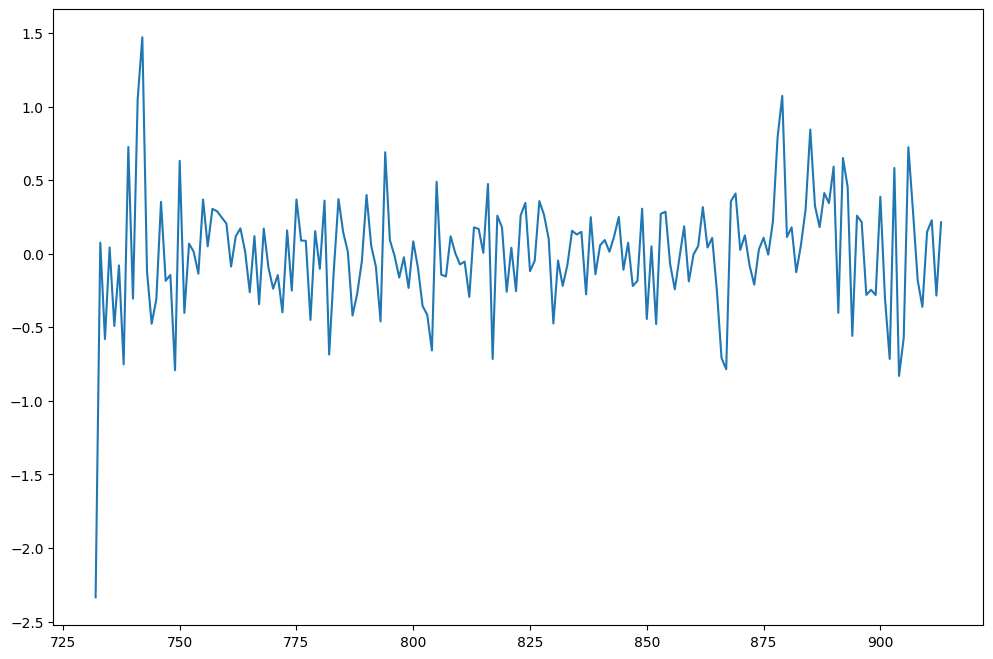

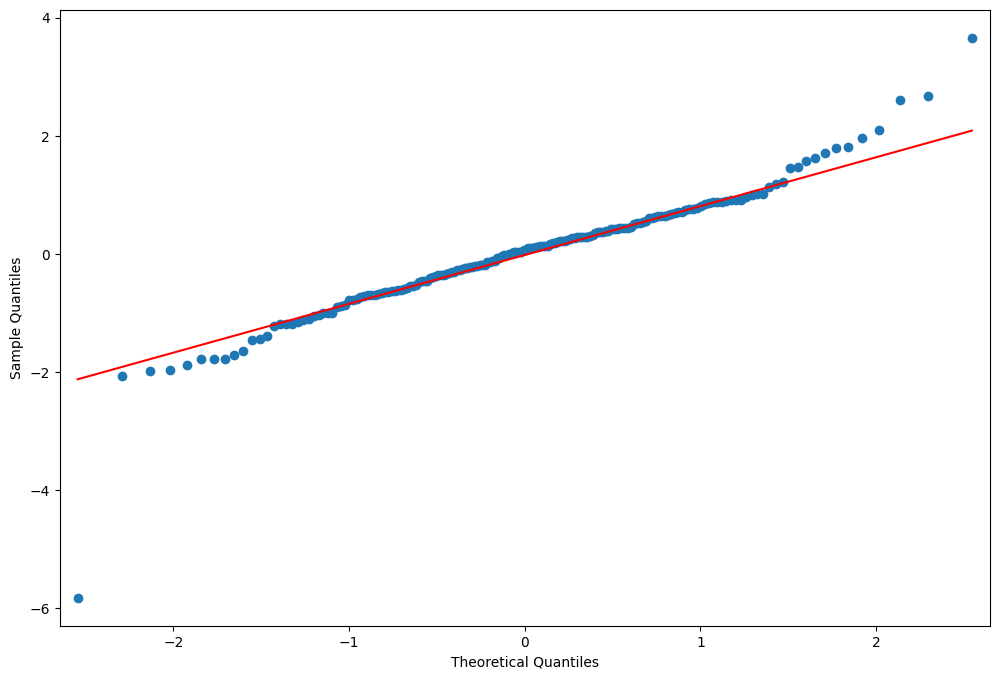

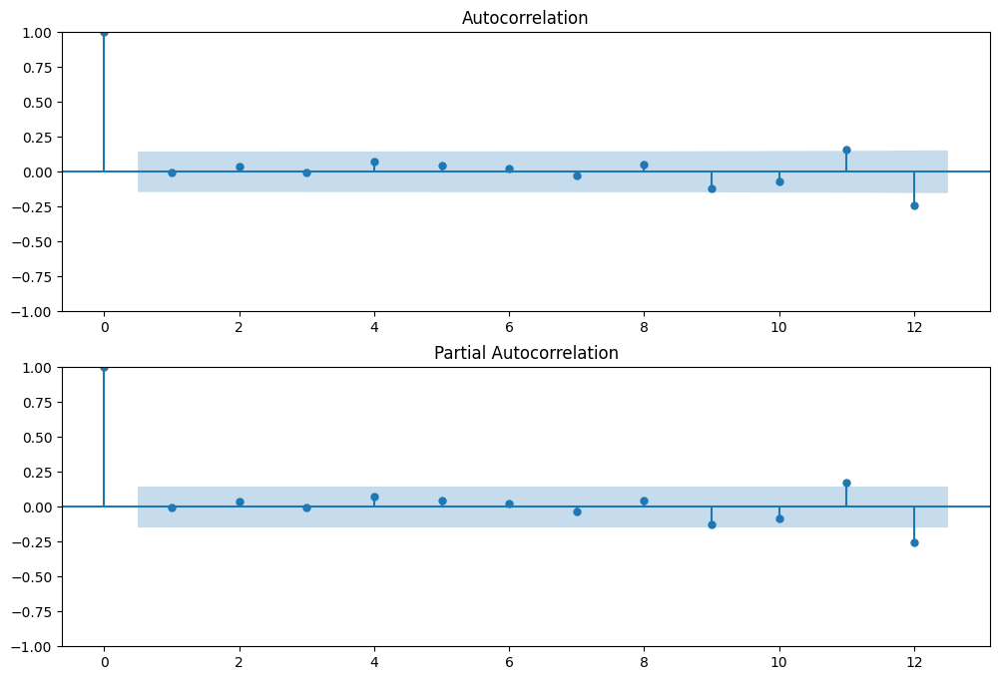

In [40]:
df_cpi_r = df_cpi[ (df_cpi['date'] >= '2009-01-01') & (df_cpi['date'] <= '2024-12-31' )].sort_values(by = 'date')
#df_cpi_r['sCPI'] =df_cpi_r['CPI']-df_cpi_r['CPI'].shift(11)
mape_cpi, rmse_cpi = arima_v2(df_cpi_r,'CPI', 2, 1,0)     
print("mape_cpi:", mape_cpi)

arima_v1(df_cpi_r,'CPI', 2, 1, 0)  

#issues: residuals not normals, and still have a correlation lag 

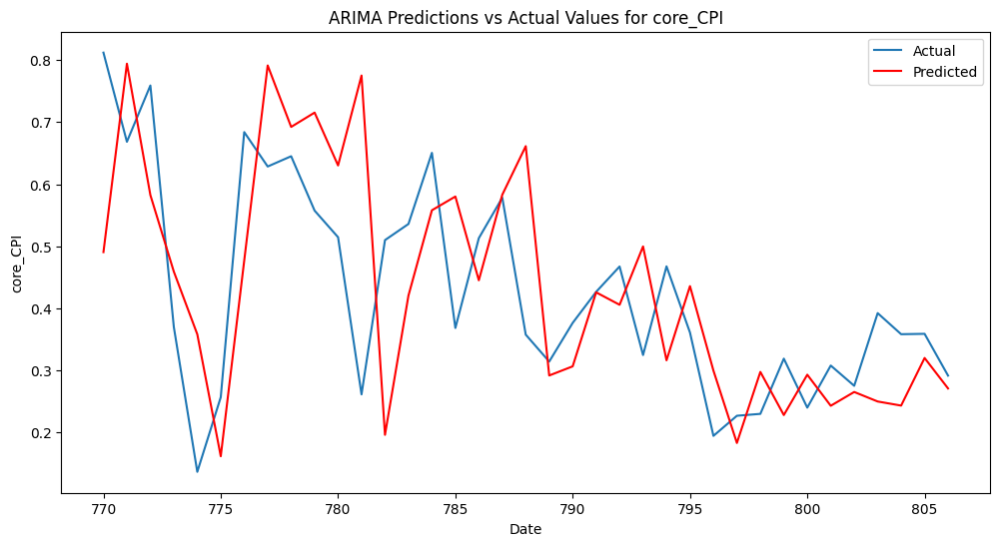

mape_cpi_core: 0.34568916528263327
ar.L1    -1.254909
ar.L2    -1.471727
ar.L3    -1.874142
ar.L4    -1.968994
ar.L5    -1.957754
ar.L6    -1.790576
ar.L7    -1.566890
ar.L8    -1.200081
ar.L9    -0.845684
ar.L10   -0.555094
ar.L11   -0.148064
sigma2    0.010809
dtype: float64
-278.15333002724435 -239.70524978232282 -262.5670377319494
                               SARIMAX Results                                
Dep. Variable:               core_CPI   No. Observations:                  184
Model:                ARIMA(11, 2, 0)   Log Likelihood                 151.077
Date:                Sun, 02 Jun 2024   AIC                           -278.153
Time:                        13:45:10   BIC                           -239.705
Sample:                             0   HQIC                          -262.567
                                - 184                                         
Covariance Type:                  opg                                         
                 coef    std er

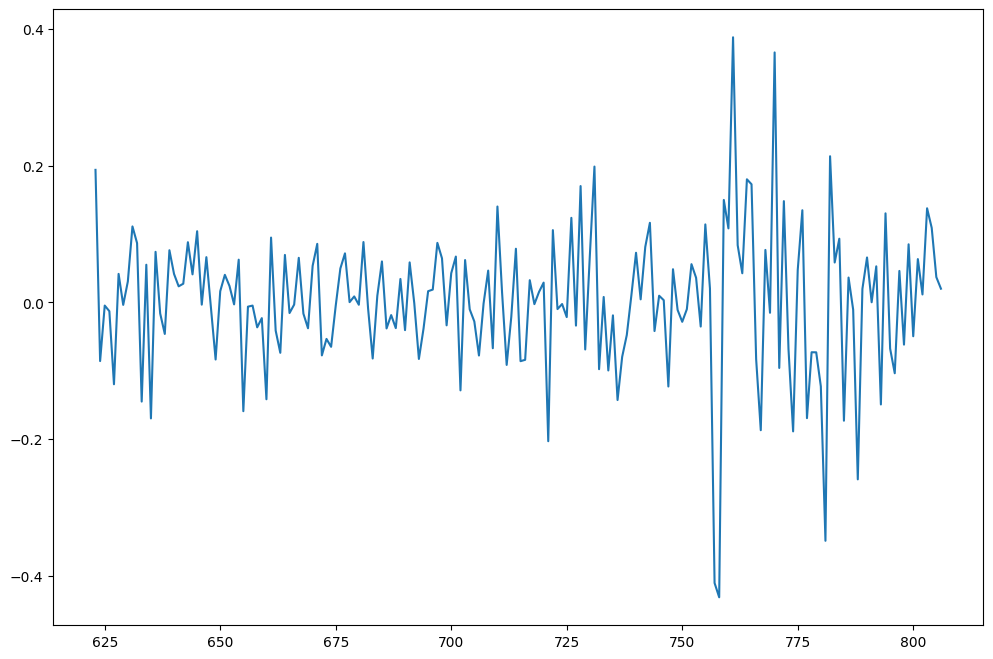

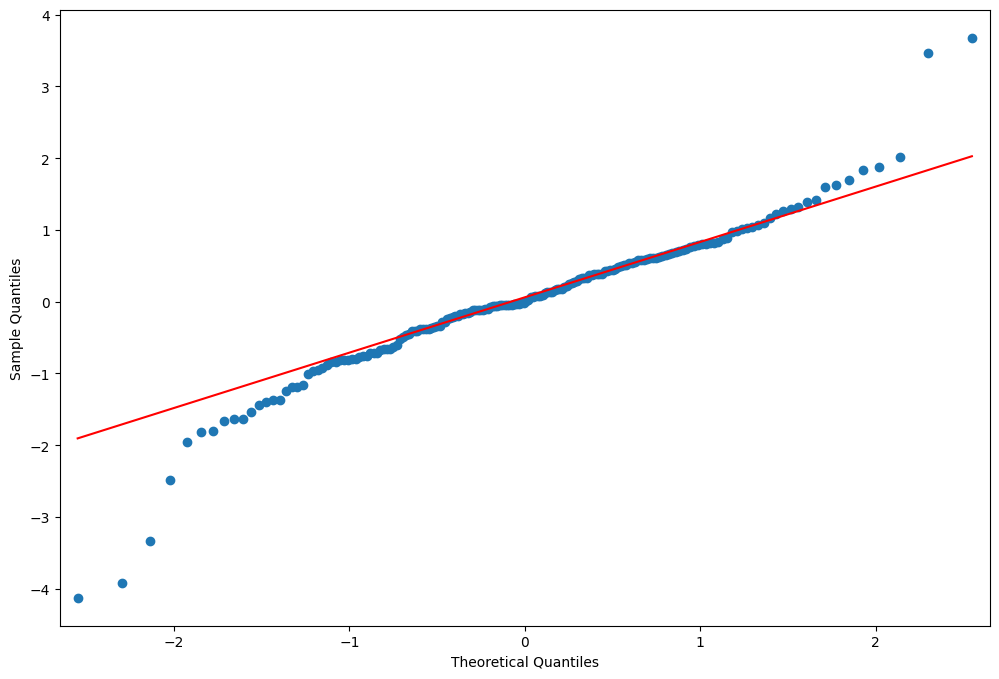

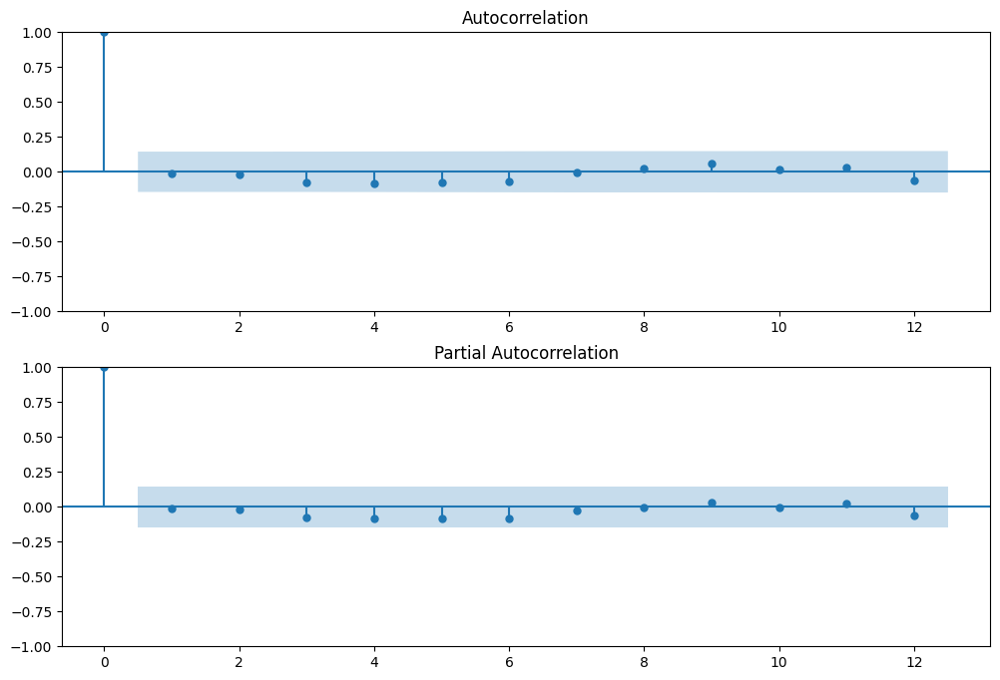

In [21]:
df_cpi_core_r = df_cpi_core[ (df_cpi_core['date'] >= '2009-01-01') & (df_cpi_core['date'] <= '2024-12-31' )].sort_values(by = 'date')
mape_cpi_core, rmse_cpi_core = arima_v2(df_cpi_core_r,'core_CPI', 11, 0,2)     
print("mape_cpi_core:", mape_cpi_core)

arima_v1(df_cpi_core_r,'core_CPI', 11,0,2)  

#issue: residuals not normal

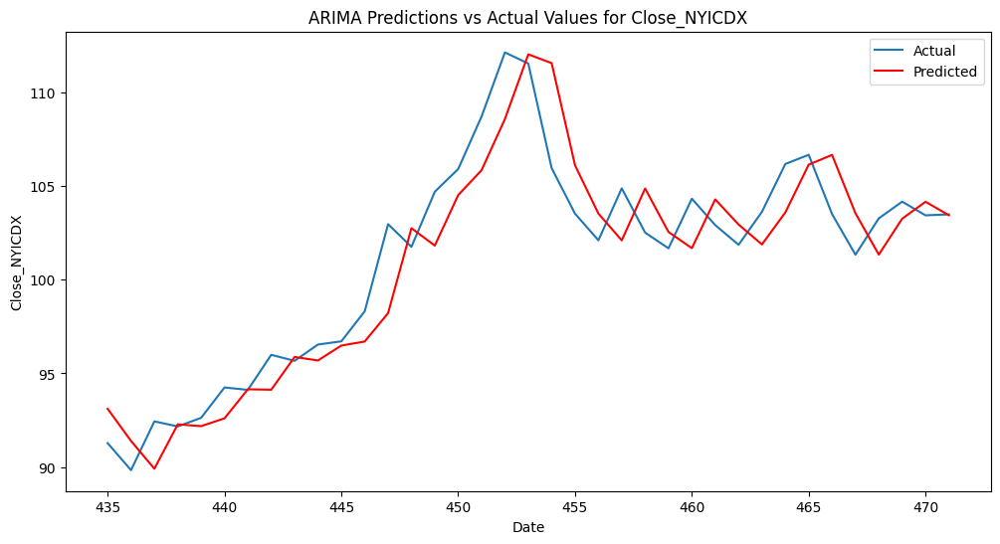

mape_nyicdx: 0.016992312147383948
ar.L1    -0.007784
sigma2    3.610066
dtype: float64
758.254380610972 764.6733529166548 760.8563055062021
                               SARIMAX Results                                
Dep. Variable:           Close_NYICDX   No. Observations:                  184
Model:                 ARIMA(1, 1, 0)   Log Likelihood                -377.127
Date:                Sun, 02 Jun 2024   AIC                            758.254
Time:                        13:45:11   BIC                            764.673
Sample:                             0   HQIC                           760.856
                                - 184                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0078      0.080     -0.097      0.923      -0.165    

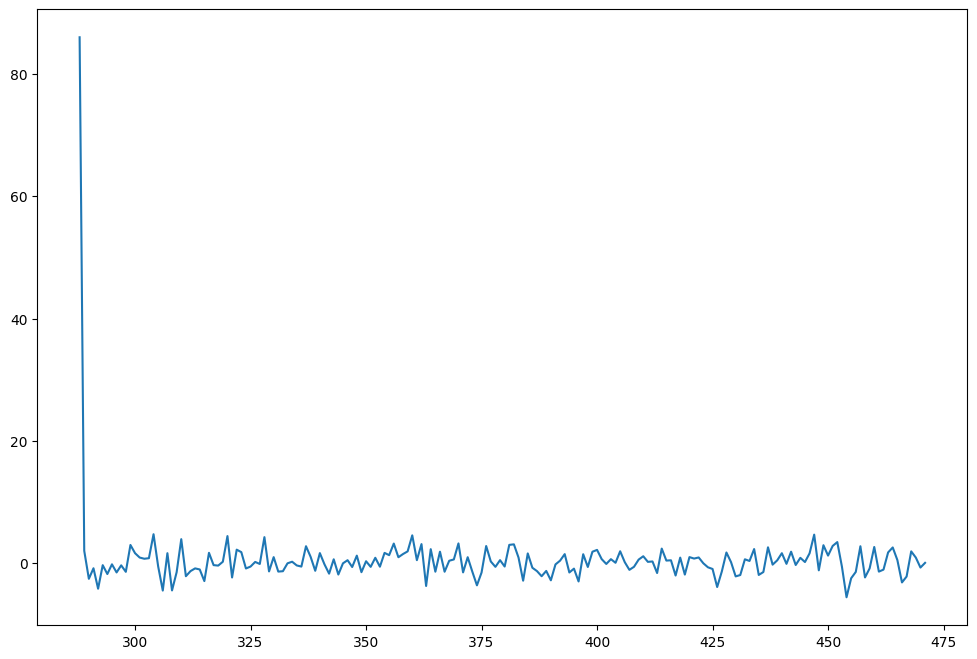

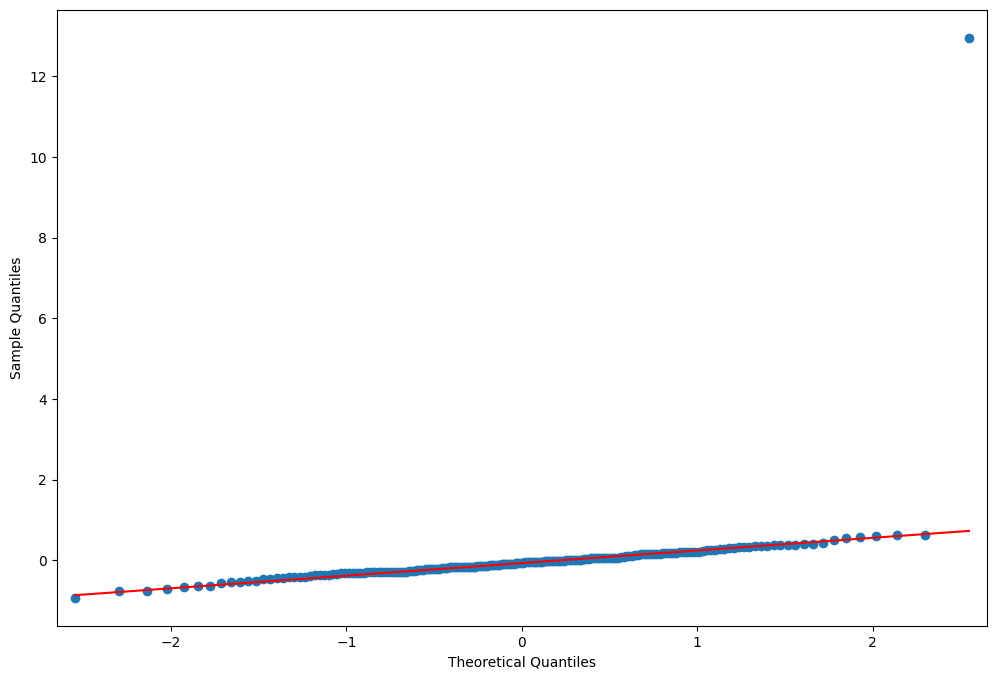

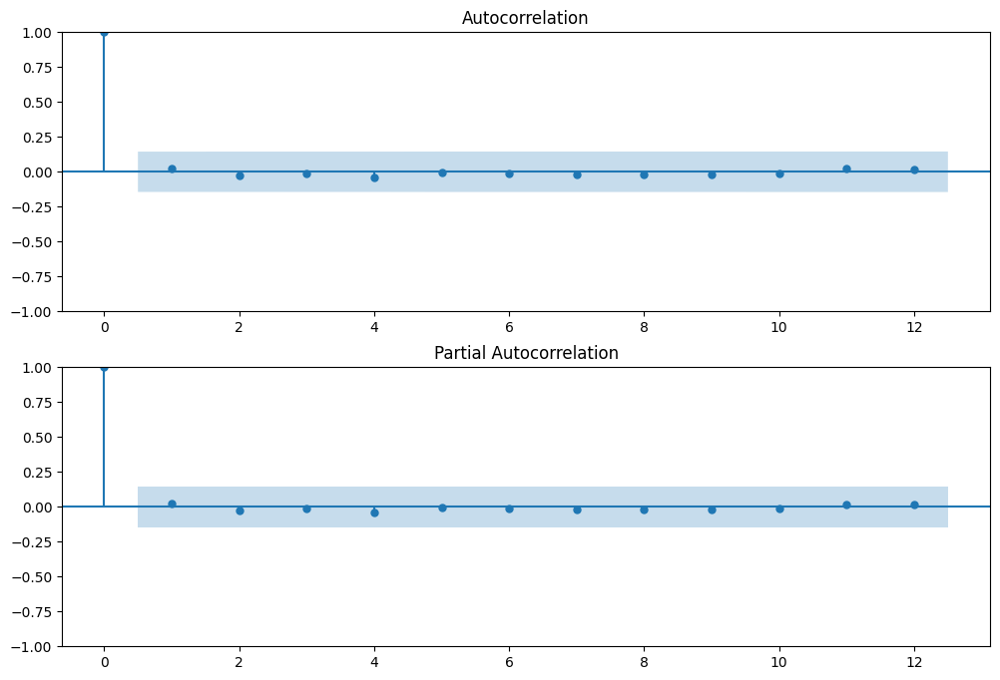

In [22]:
df_nyicdx_r = df_nyicdx[ (df_nyicdx['date'] >= '2009-01-01') & (df_nyicdx['date'] <= '2024-12-31' )].sort_values(by = 'date')
mape_nyicdx, rmse_nyicdx = arima_v2(df_nyicdx_r,'Close_NYICDX', 1, 0,1)     
print("mape_nyicdx:", mape_nyicdx)

arima_v1(df_nyicdx_r,'Close_NYICDX', 1,0,1)   

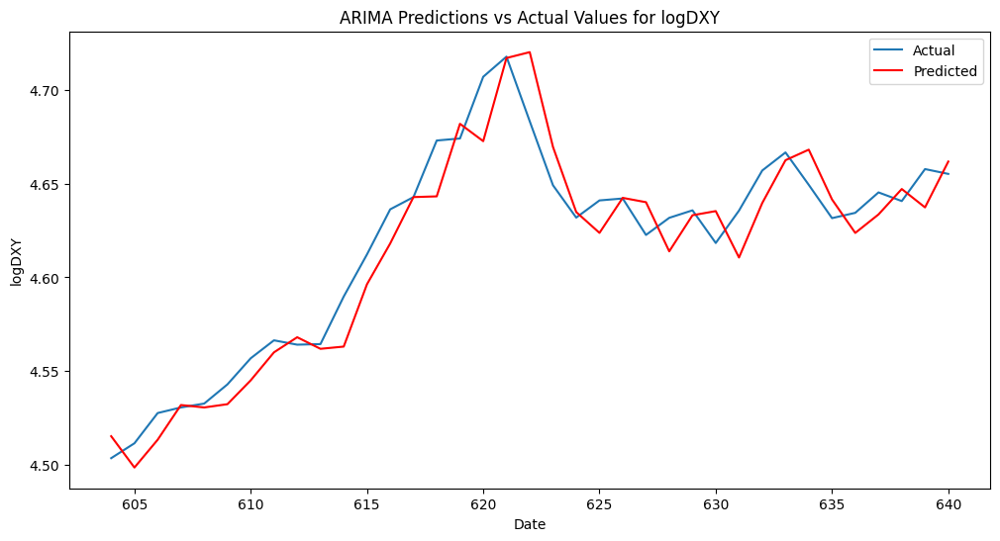

mape_dxy: 0.0027795281590637763
const     4.505350
ar.L1     1.315722
ar.L2    -0.328211
sigma2    0.000236
dtype: float64
-1008.1075261606396 -995.2261028603264 -1002.8870016382781
                               SARIMAX Results                                
Dep. Variable:                 logDXY   No. Observations:                  185
Model:                 ARIMA(2, 0, 0)   Log Likelihood                 508.054
Date:                Sun, 02 Jun 2024   AIC                          -1008.108
Time:                        13:45:21   BIC                           -995.226
Sample:                             0   HQIC                         -1002.887
                                - 185                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.5053      0

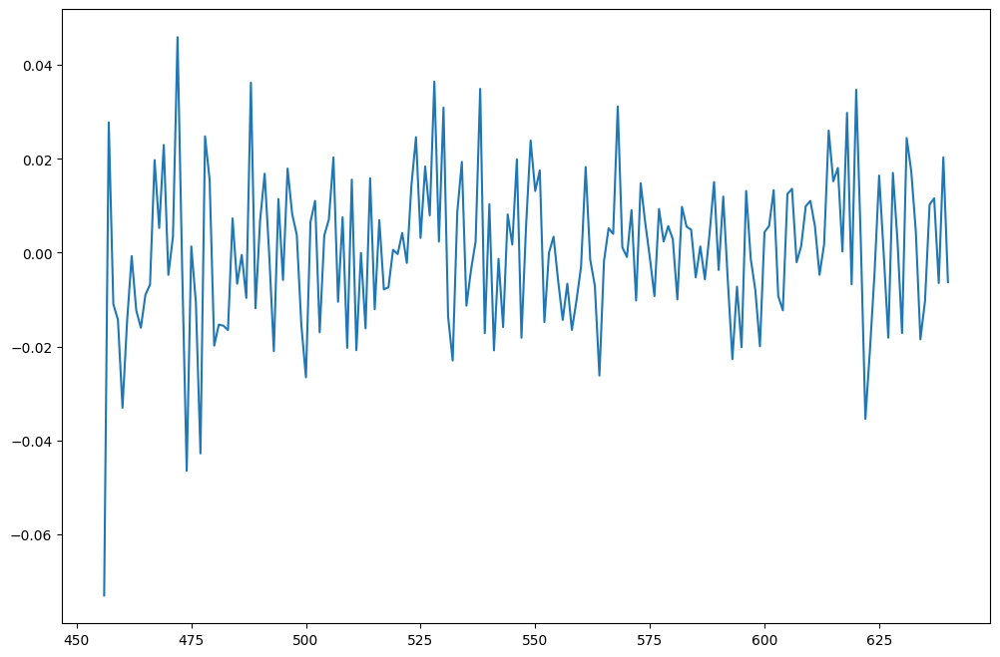

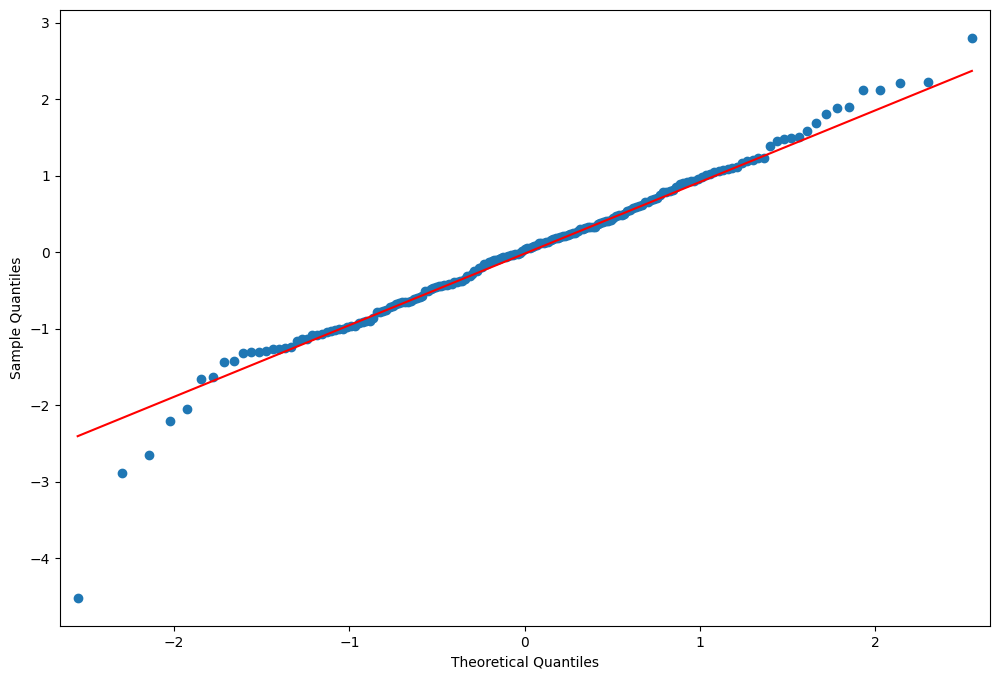

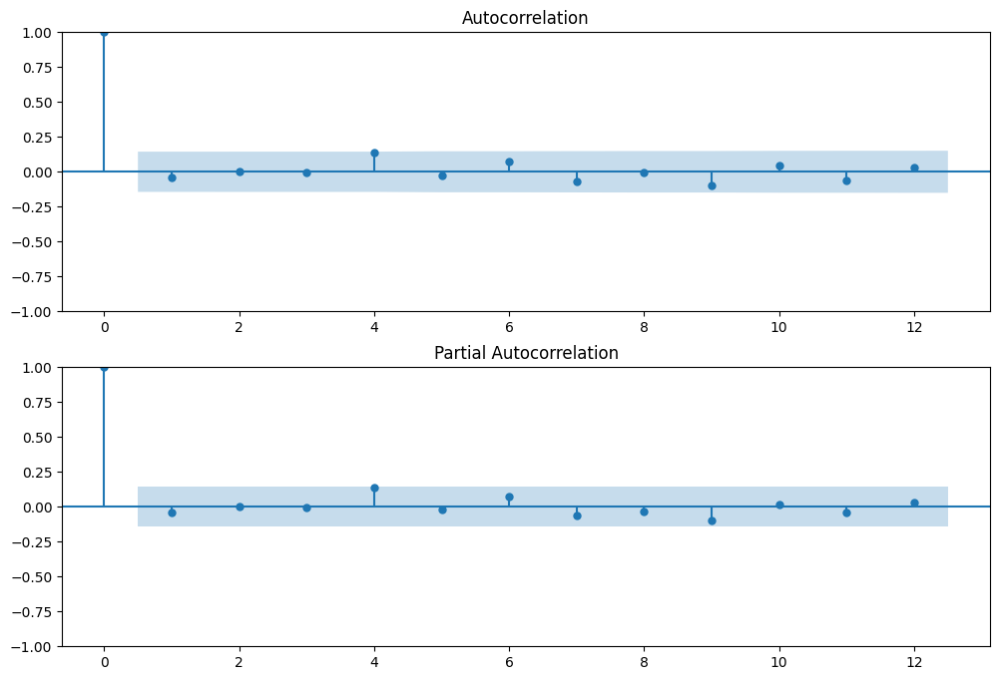

In [23]:
df_dxy_r = df_dxy[ (df_dxy['date'] >= '2009-01-01') & (df_dxy['date'] <= '2024-12-31' )].sort_values(by = 'date')
df_dxy_r['logDXY']= np.log(df_dxy_r['Close_DXY'])
mape_dxy, rmse_dxy = arima_v2(df_dxy_r,'logDXY',2 ,0,0)     
print("mape_dxy:", mape_dxy)

arima_v1(df_dxy_r,'logDXY', 2,0,0) 

#isssue: residuals not normal

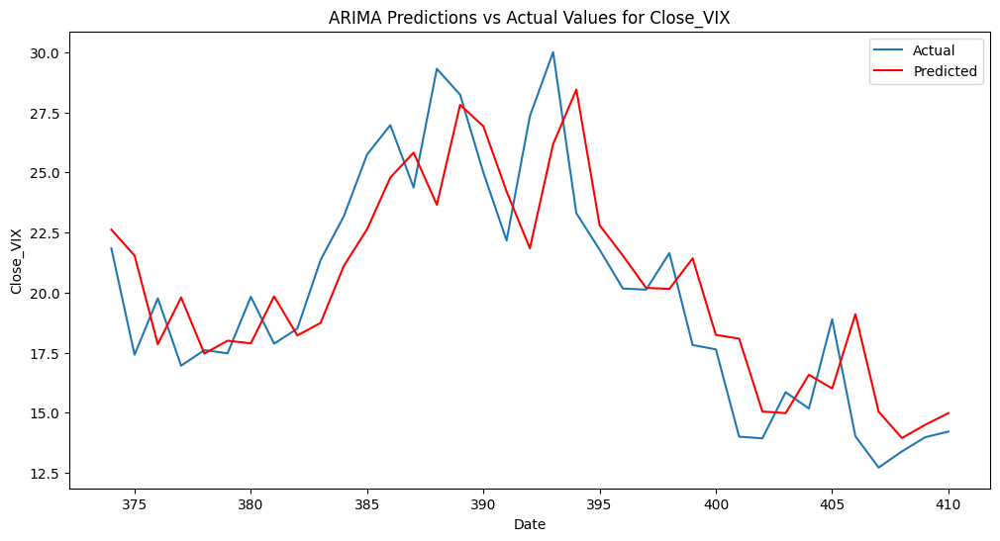

mape_vix: 0.10732732018000717
const     19.857291
ar.L1      0.830499
sigma2    19.197711
dtype: float64
1067.2288568051595 1076.8573152636836 1071.1317441480046
                               SARIMAX Results                                
Dep. Variable:              Close_VIX   No. Observations:                  183
Model:                 ARIMA(1, 0, 0)   Log Likelihood                -530.614
Date:                Sun, 02 Jun 2024   AIC                           1067.229
Time:                        13:45:23   BIC                           1076.857
Sample:                             0   HQIC                          1071.132
                                - 183                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         19.8573      2.657      7.473     

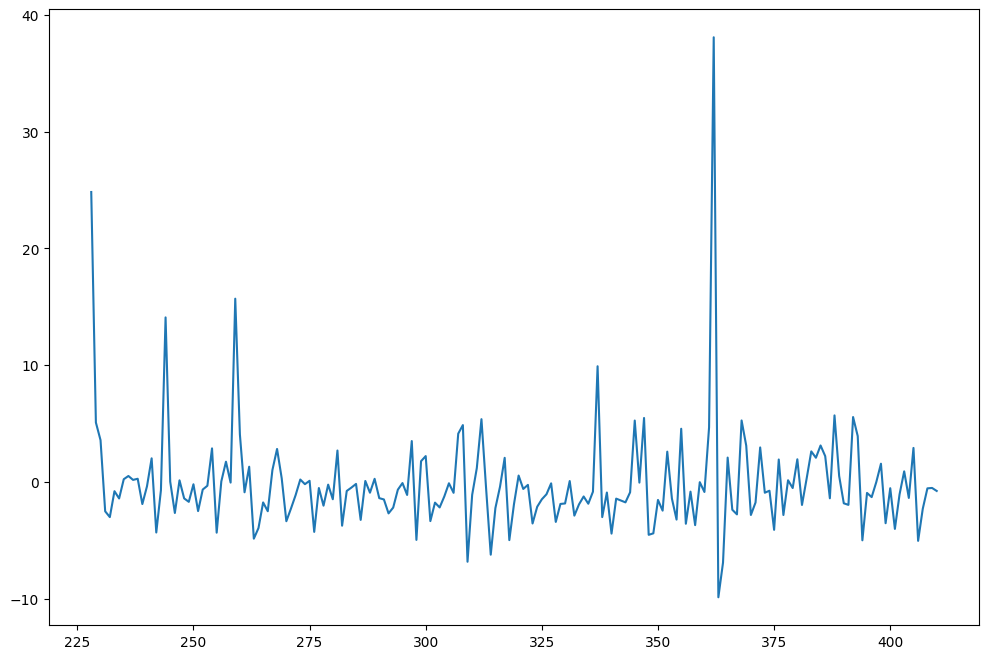

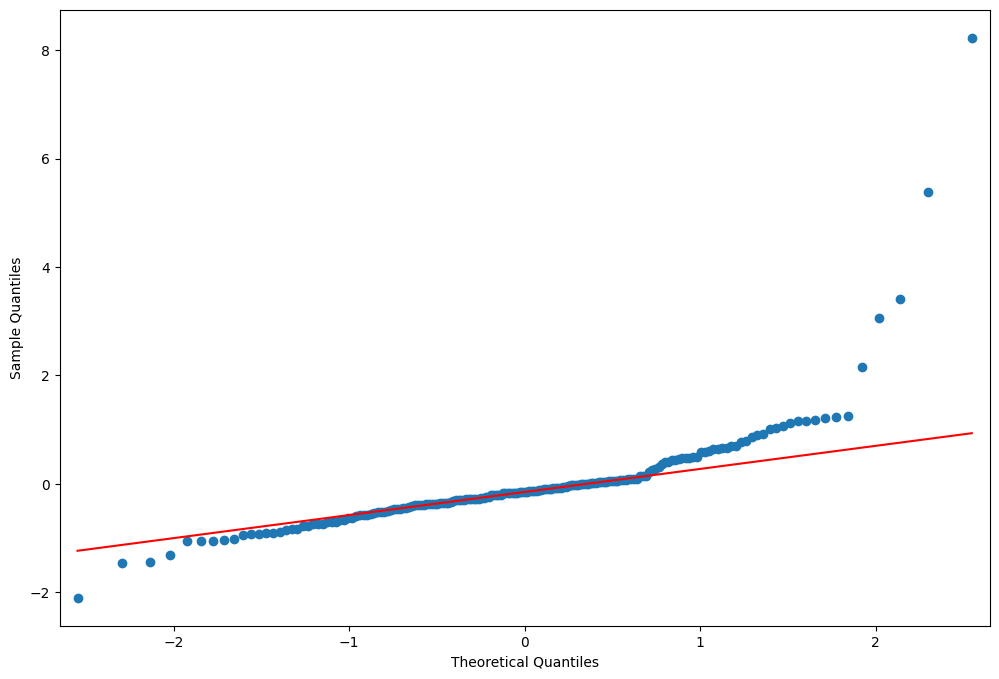

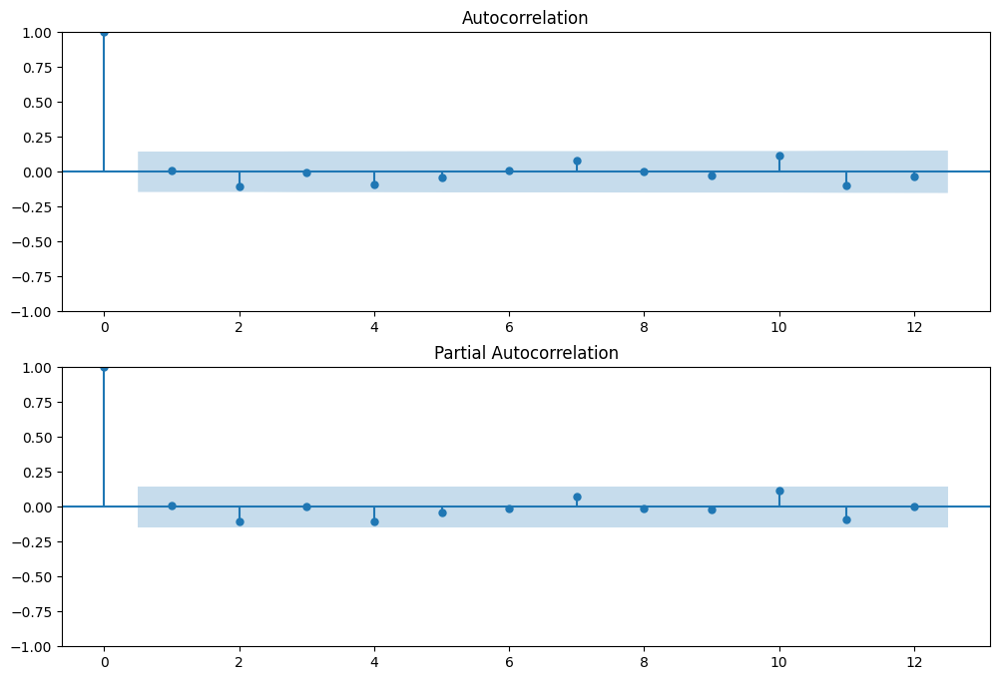

In [24]:
df_vix_r = df_vix[ (df_vix['date'] >= '2009-01-01') & (df_vix['date'] <= '2024-12-31' )].sort_values(by = 'date')
mape_vix, rmse_vix = arima_v2(df_vix_r,'Close_VIX', 1, 0,0)     
print("mape_vix:", mape_vix)

arima_v1(df_vix_r,'Close_VIX', 1,0,0) 

#isssue: residuals not normal

In [130]:
df_vxo_r = df_vxo[ (df_vxo['date'] >= '2009-01-01') & (df_vxo['date'] <= '2024-12-31' )].sort_values(by = 'date')
mape_vxo, rmse_vxo = arima_v2(df_vxo_r,'Close_VXO', 1, 0,0)     
print("mape_vxo:", mape_vxo)

arima_v1(df_vxo_r,'Close_VXO', 1,0,0) 

#isssue: residuals not normal

NameError: name 'df_vxo' is not defined

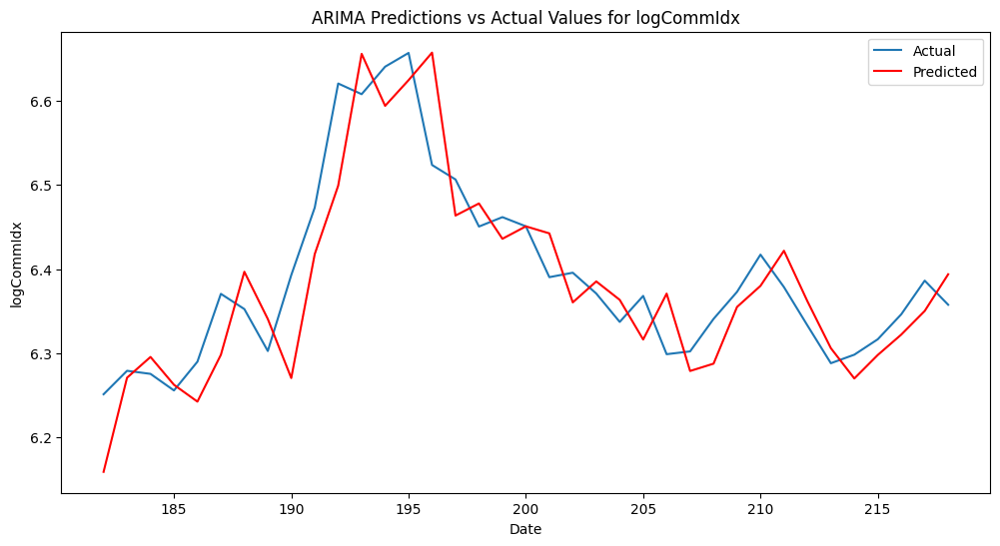

mape_comm_index: 0.006761882868566672
const     6.187620
ar.L1     0.947084
ma.L1     0.346248
ma.L2     0.218744
sigma2    0.002718
dtype: float64
-554.5924230279054 -538.4906439025137 -548.0667673749535
                               SARIMAX Results                                
Dep. Variable:             logCommIdx   No. Observations:                  185
Model:                 ARIMA(1, 0, 2)   Log Likelihood                 282.296
Date:                Sun, 02 Jun 2024   AIC                           -554.592
Time:                        13:45:59   BIC                           -538.491
Sample:                             0   HQIC                          -548.067
                                - 185                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const

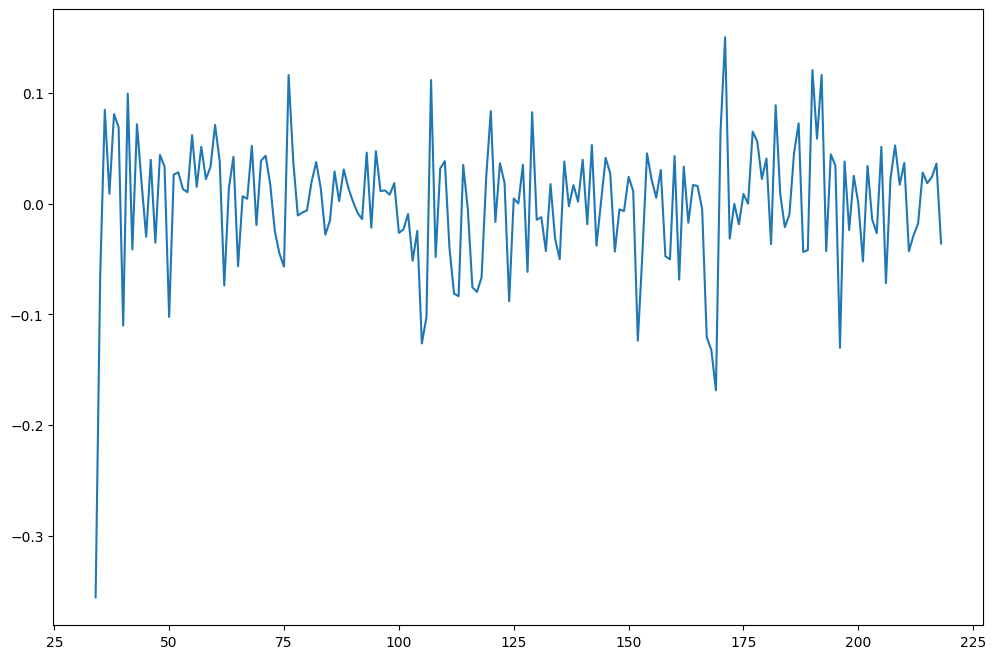

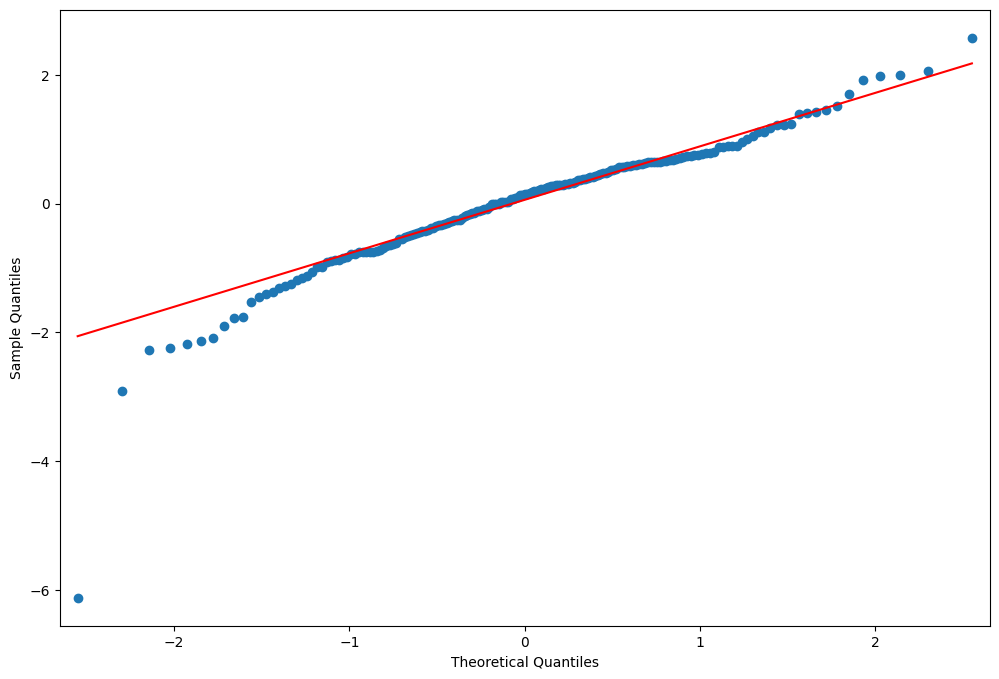

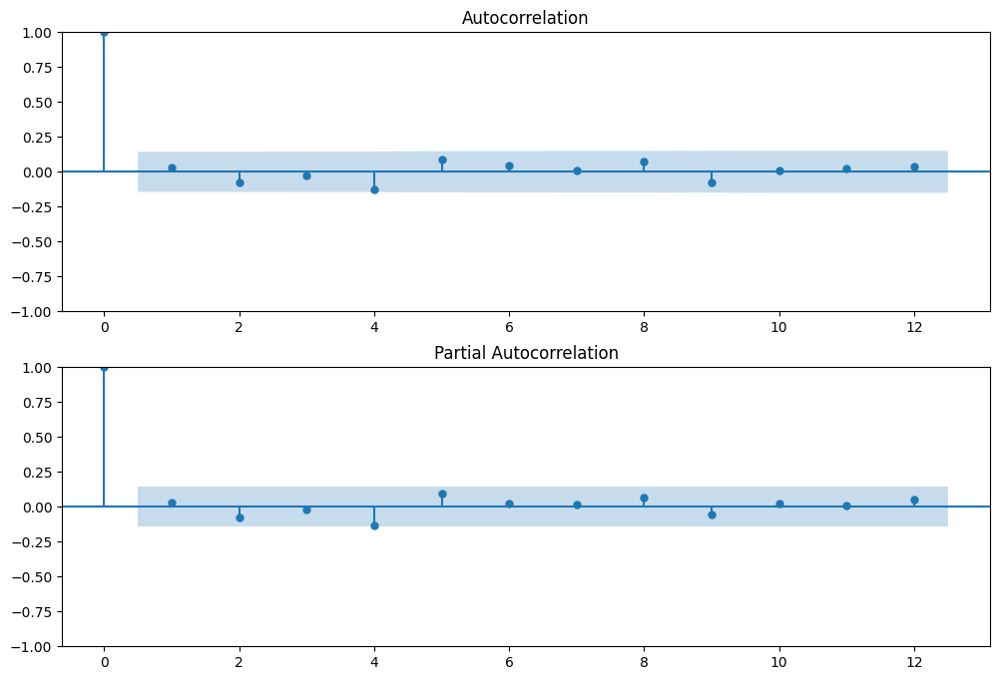

In [26]:
df_comm_index_r = df_comm_index[ (df_comm_index['date'] >= '2009-01-01') & (df_comm_index['date'] <= '2024-12-31' )].sort_values(by = 'date')
df_comm_index_r['logCommIdx'] = np.log(df_comm_index_r['Close_CommIdx'])
mape_comm_index, rmse_comm_index = arima_v2(df_comm_index_r,'logCommIdx', 1,2,0)     
print("mape_comm_index:", mape_comm_index)

arima_v1(df_comm_index_r,'logCommIdx', 1,2,0) 

#isssue: residuals not normal

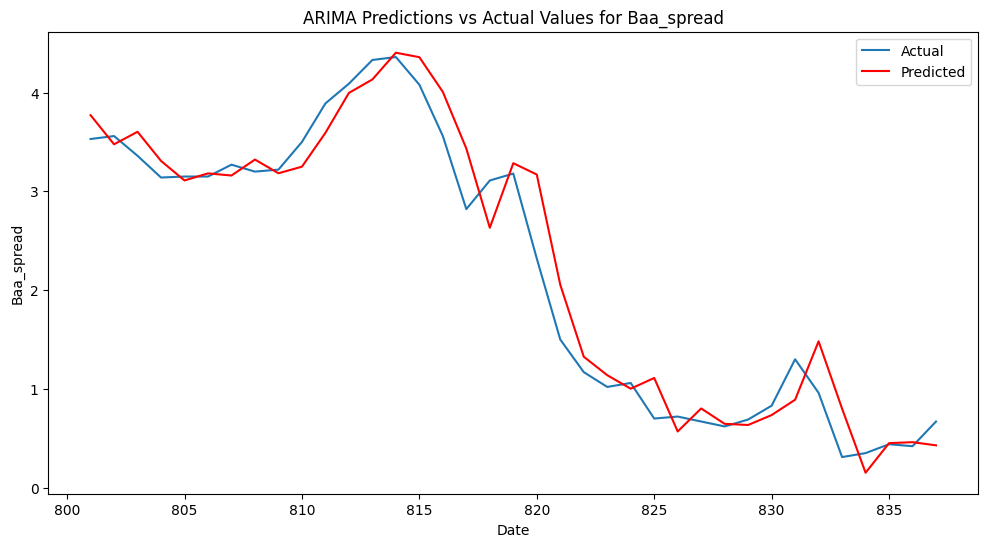

mape_cs_baa: 0.18668231969641993
const     4.271751
ar.L1     0.992750
ma.L1     0.385470
sigma2    0.055204
dtype: float64
2.2269923935015754 15.086735423937519 7.439206550348066
                               SARIMAX Results                                
Dep. Variable:             Baa_spread   No. Observations:                  184
Model:                 ARIMA(1, 0, 1)   Log Likelihood                   2.887
Date:                Sun, 02 Jun 2024   AIC                              2.227
Time:                        13:46:23   BIC                             15.087
Sample:                             0   HQIC                             7.439
                                - 184                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.2718      2.0

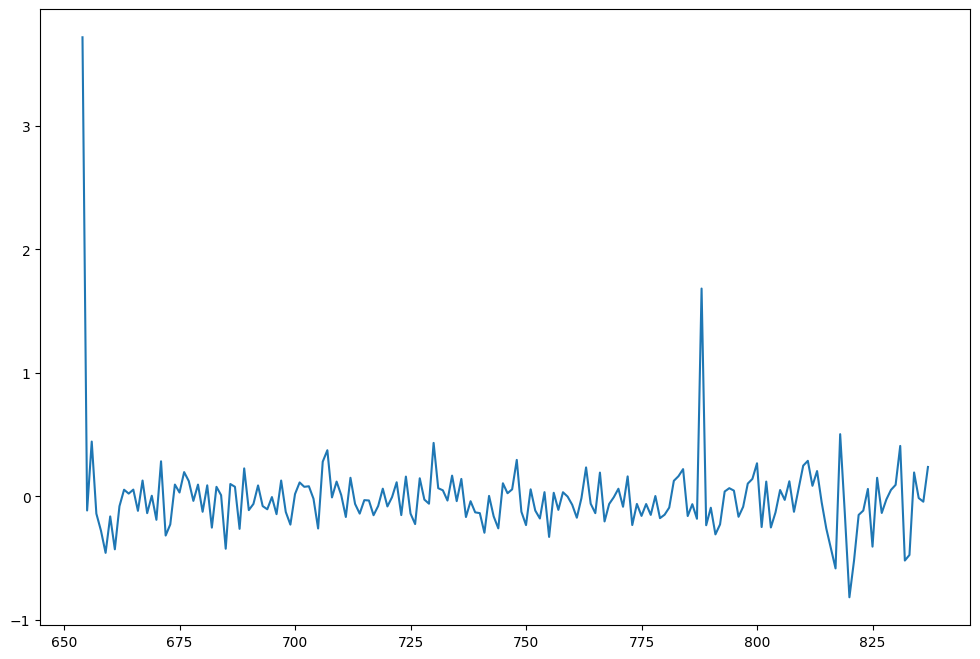

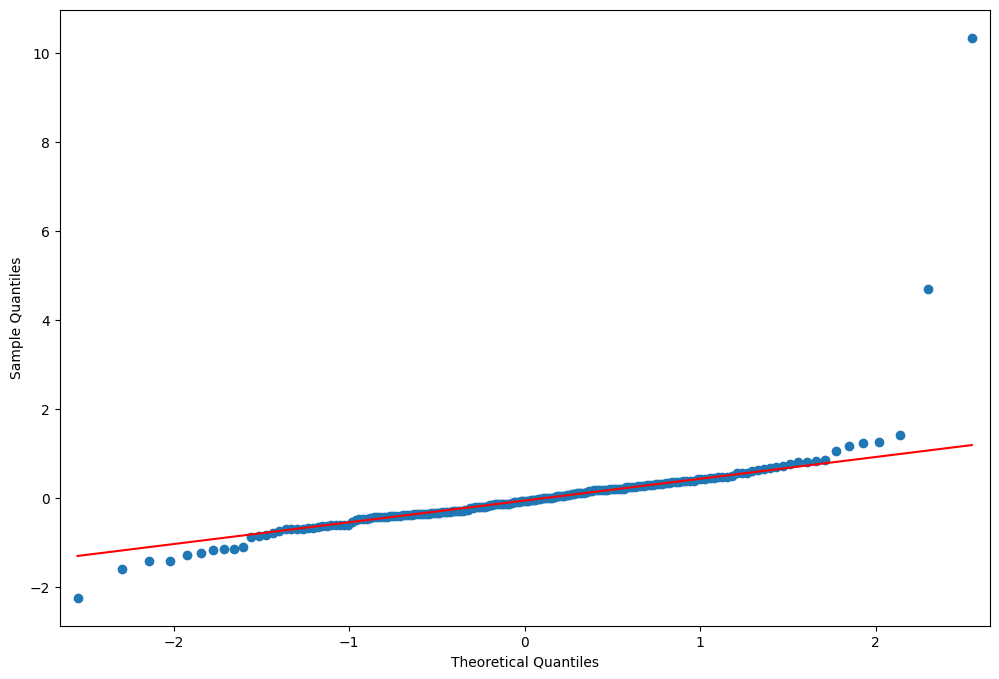

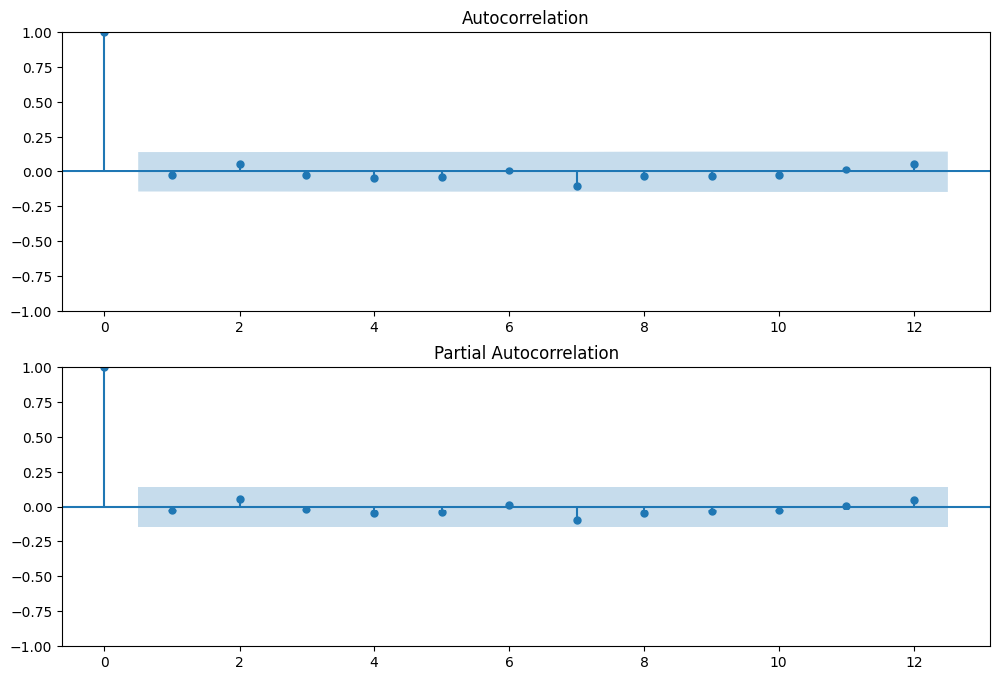

In [27]:
df_cs_baa_r = df_cs_baa[ (df_cs_baa['date'] >= '2009-01-01') & (df_cs_baa['date'] <= '2024-12-31' )].sort_values(by = 'date')
mape_cs_baa, rmse_cs_baa = arima_v2(df_cs_baa_r,'Baa_spread', 1, 1,0)     
print("mape_cs_baa:", mape_cs_baa)

arima_v1(df_cs_baa_r,'Baa_spread', 1,1,0) 

#isssue: residuals not normal

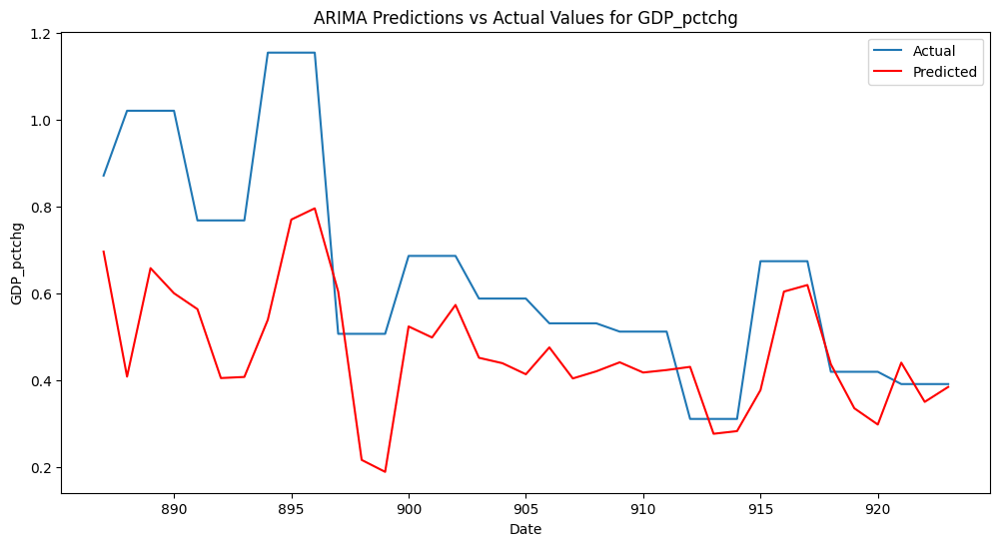

mape_gdp: 0.26643588767423454
const     0.375978
ar.L1     0.260063
ar.L2     0.342080
ar.L3    -0.483665
ma.L1     0.486659
sigma2    0.158442
dtype: float64
193.43623086430796 212.6272130519029 201.21666548063484
                               SARIMAX Results                                
Dep. Variable:             GDP_pctchg   No. Observations:                  181
Model:                 ARIMA(3, 0, 1)   Log Likelihood                 -90.718
Date:                Sun, 02 Jun 2024   AIC                            193.436
Time:                        13:46:39   BIC                            212.627
Sample:                             0   HQIC                           201.217
                                - 181                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------

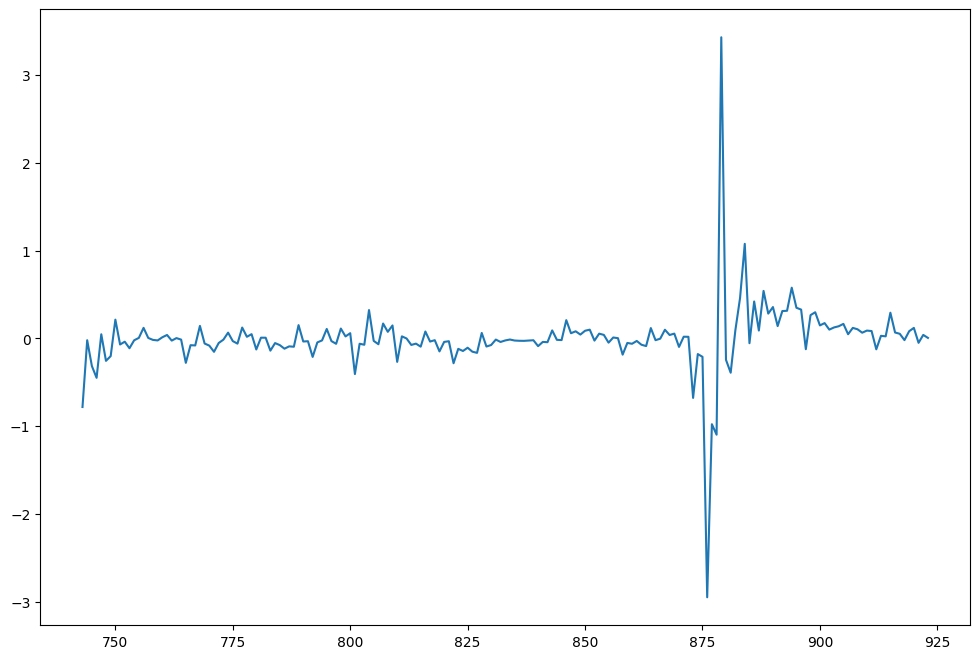

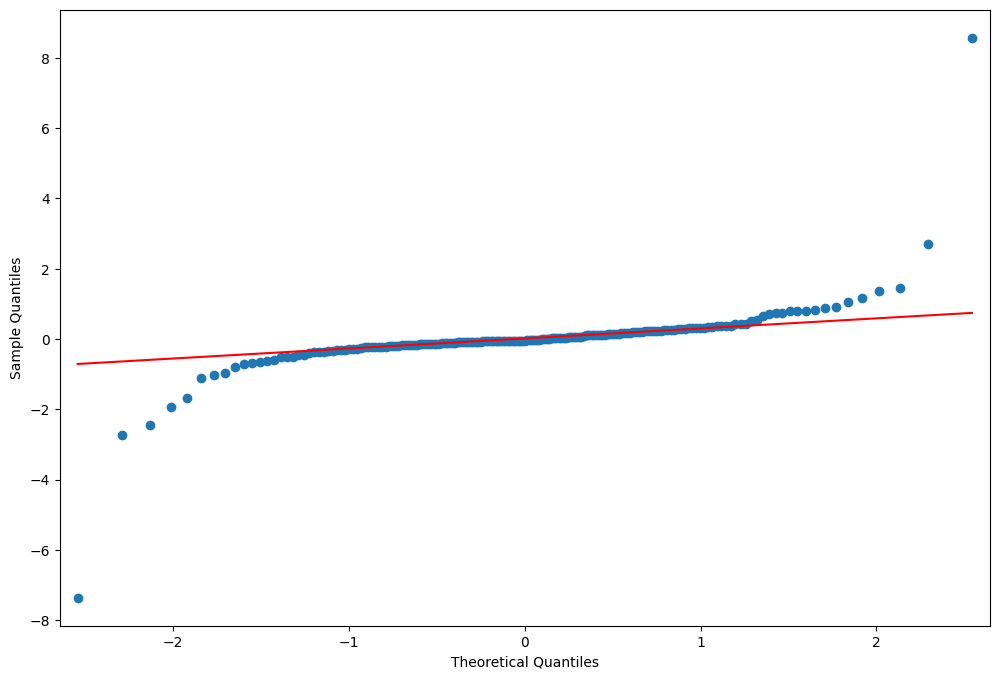

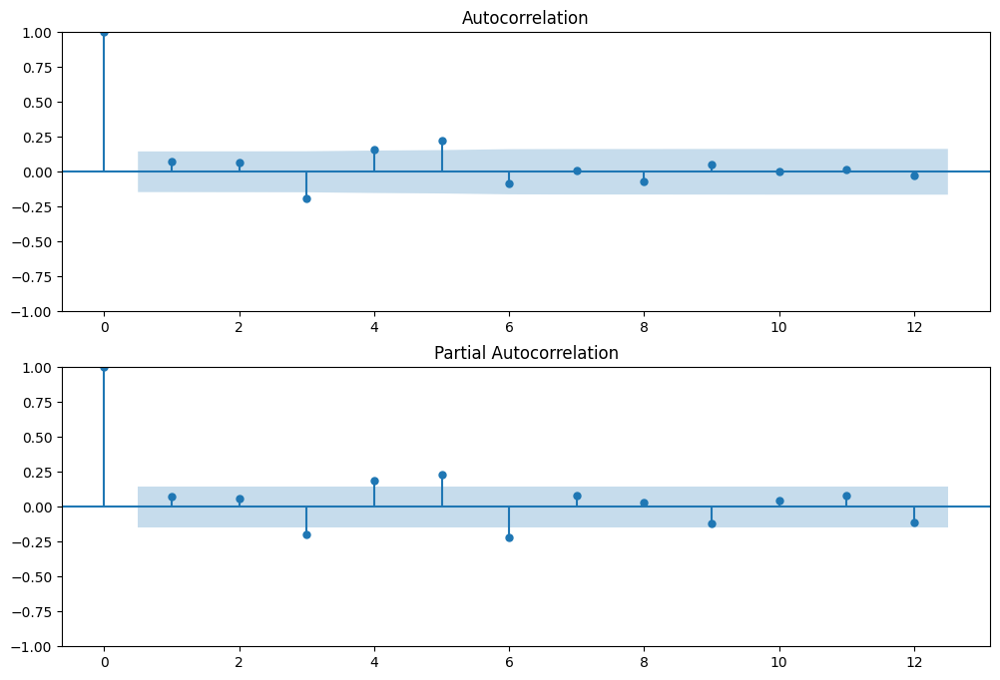

In [28]:
df_gdp_r = df_gdp[ (df_gdp['date'] >= '2009-01-01') & (df_gdp['date'] <= '2024-12-31' )].sort_values(by = 'date')
mape_gdp, rmse_gdp = arima_v2(df_gdp_r,'GDP_pctchg', 3, 1,0)     
print("mape_gdp:", mape_gdp)

arima_v1(df_gdp_r,'GDP_pctchg',3,1,0) 
#because gdp was actually quaterly, and was interpolated monthly --that is why its the gap between actual and predicted

#isssue: residuals not normal; residuals still correlated; not the appropriate model

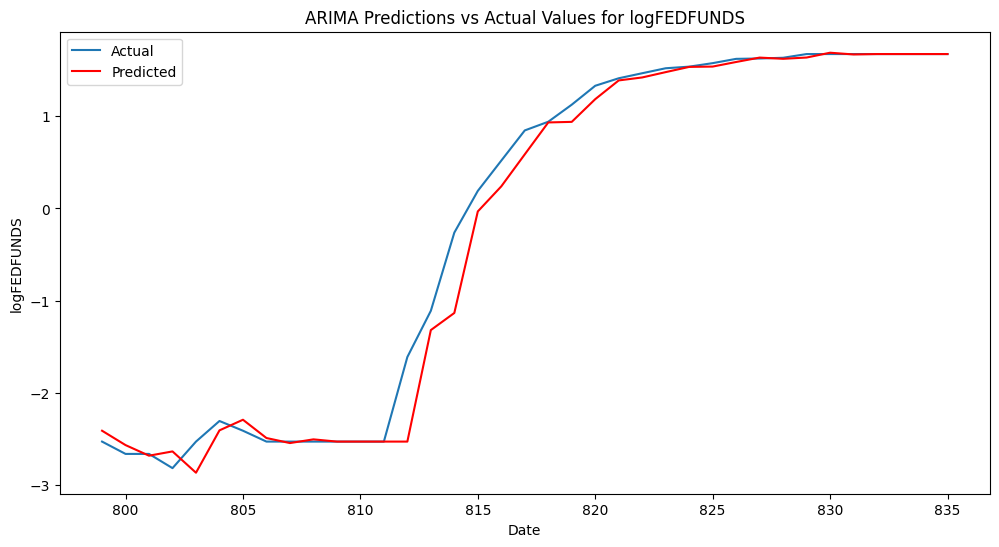

mape_fedfunds: 0.18820527901162948
ar.L1     0.380817
ar.L2    -0.106577
sigma2    0.061623
dtype: float64
15.416174588009675 25.011665681807152 19.306391896173118
                               SARIMAX Results                                
Dep. Variable:            logFEDFUNDS   No. Observations:                  182
Model:                 ARIMA(2, 1, 0)   Log Likelihood                  -4.708
Date:                Sun, 02 Jun 2024   AIC                             15.416
Time:                        13:46:46   BIC                             25.012
Sample:                             0   HQIC                            19.306
                                - 182                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3808      0.032     11.844   

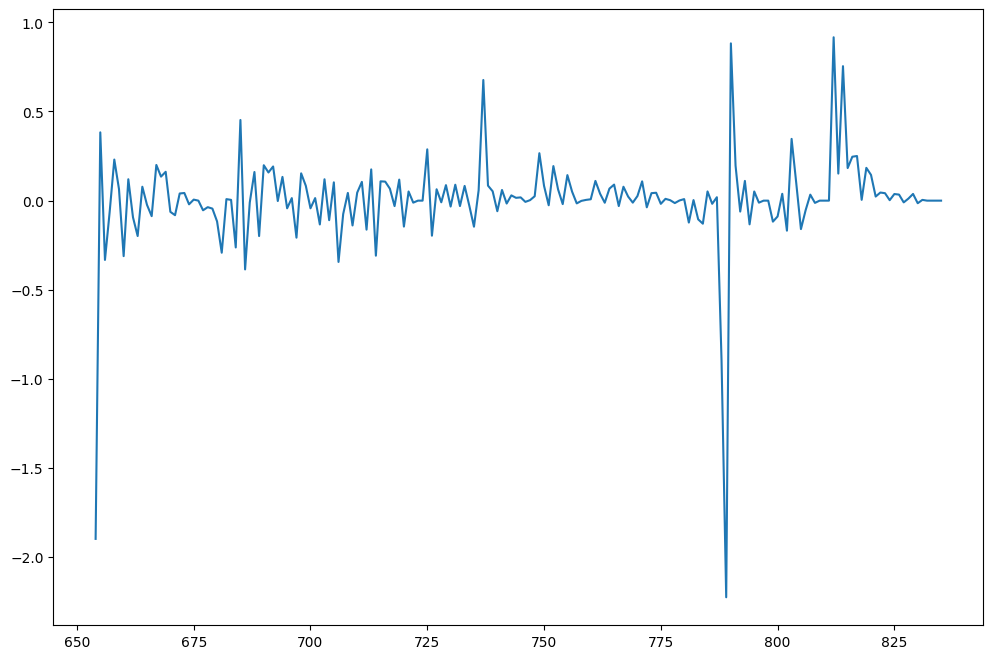

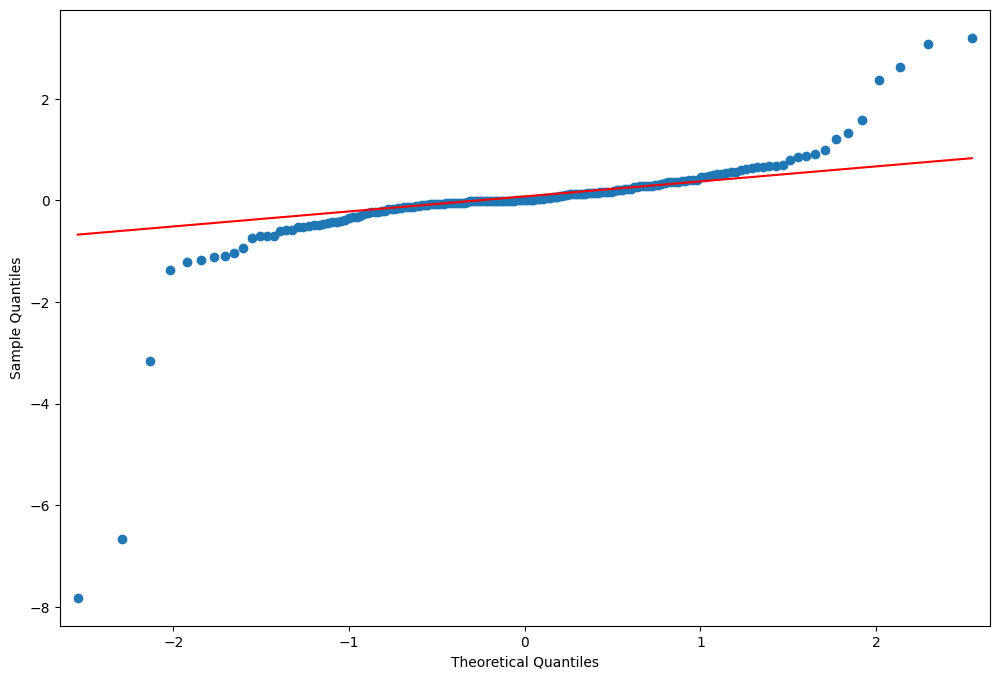

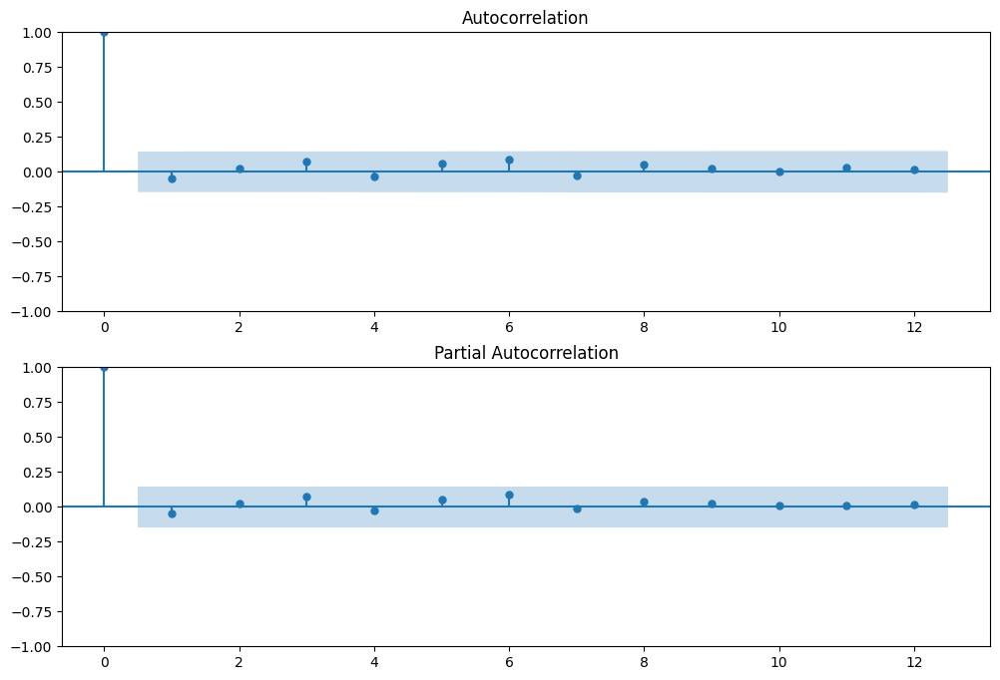

In [29]:
df_fedfunds_r = df_fedfunds[ (df_fedfunds['date'] >= '2009-01-01') & (df_fedfunds['date'] <= '2024-12-31' )].sort_values(by = 'date')
df_fedfunds_r['logFEDFUNDS']=np.log(df_fedfunds_r['FEDFUNDS'])
mape_fedfunds, rmse_fedfunds = arima_v2(df_fedfunds_r,'logFEDFUNDS', 2, 0,1)     
print("mape_fedfunds:", mape_fedfunds)

arima_v1(df_fedfunds_r,'logFEDFUNDS',2,0,1)

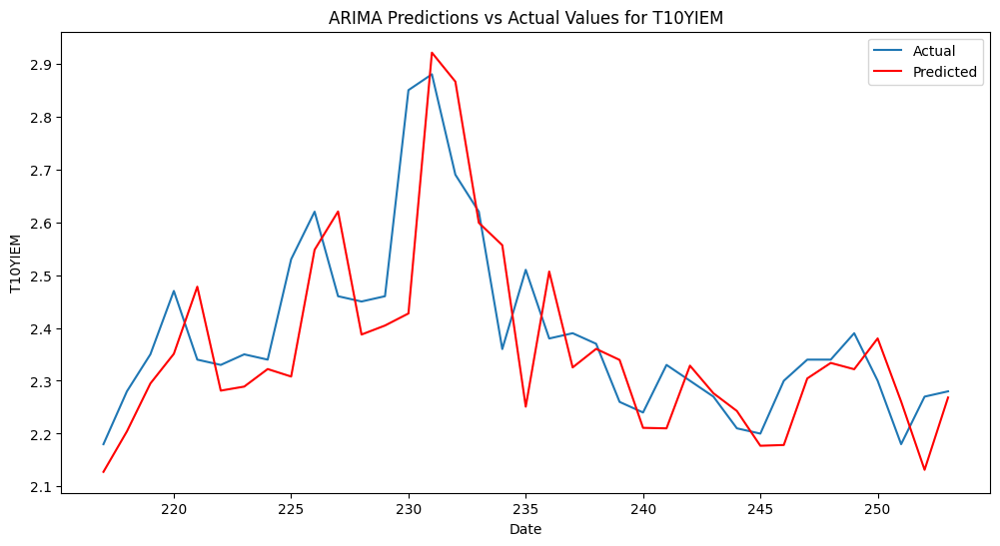

mape_t10yiem: 0.036630668890481395
const     1.929139
ar.L1     1.395034
ar.L2    -0.435697
ma.L1    -0.196530
sigma2    0.015054
dtype: float64
-234.44479404939057 -218.4247606140066 -227.95050559301768
                               SARIMAX Results                                
Dep. Variable:                T10YIEM   No. Observations:                  182
Model:                 ARIMA(2, 0, 1)   Log Likelihood                 122.222
Date:                Sun, 02 Jun 2024   AIC                           -234.445
Time:                        13:47:26   BIC                           -218.425
Sample:                             0   HQIC                          -227.951
                                - 182                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const 

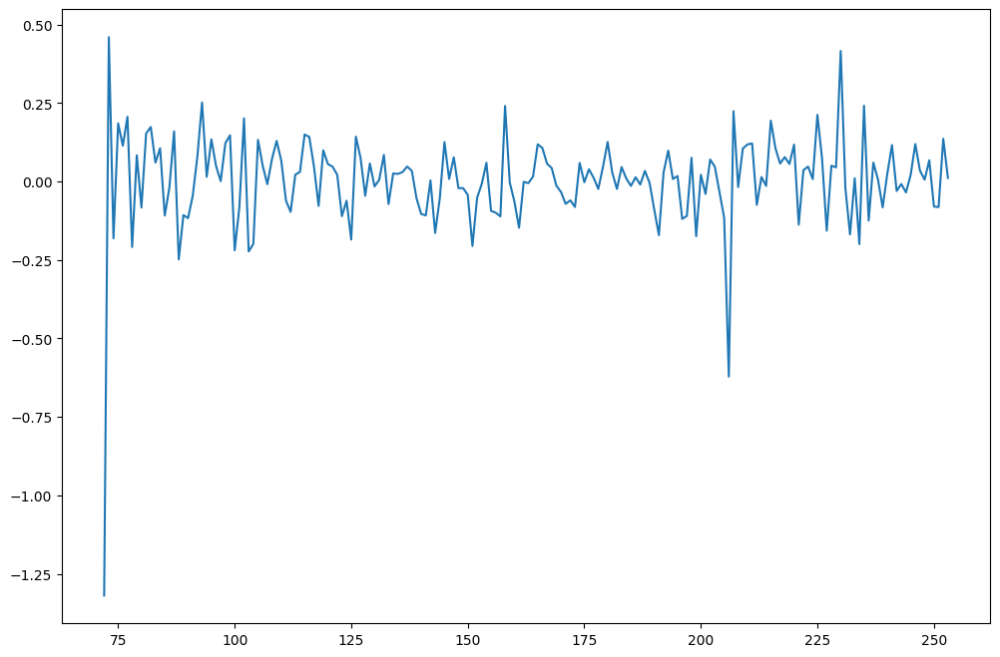

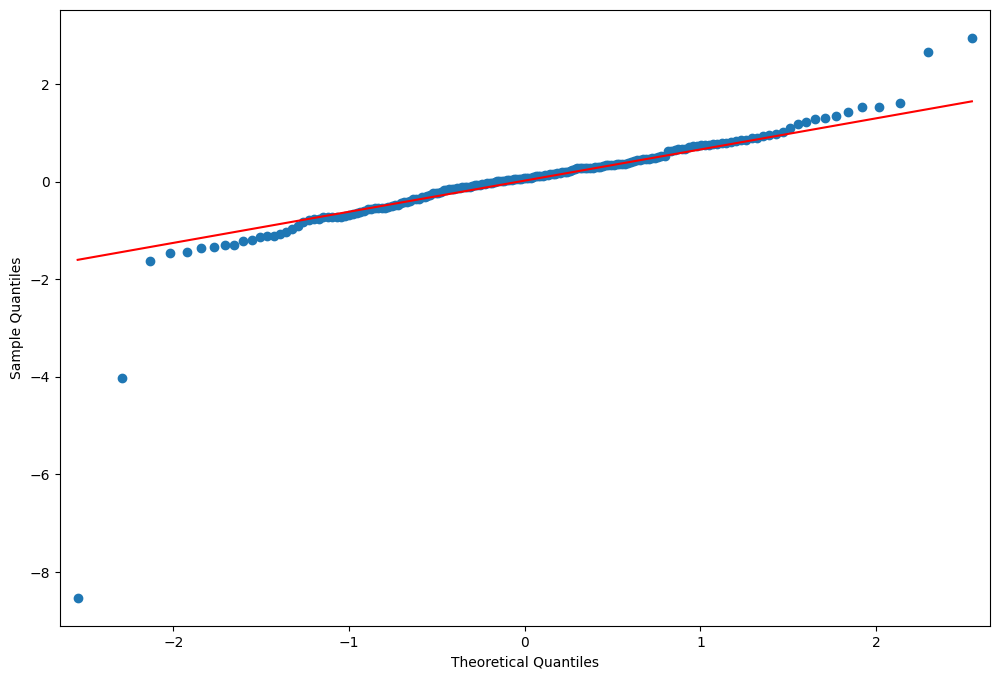

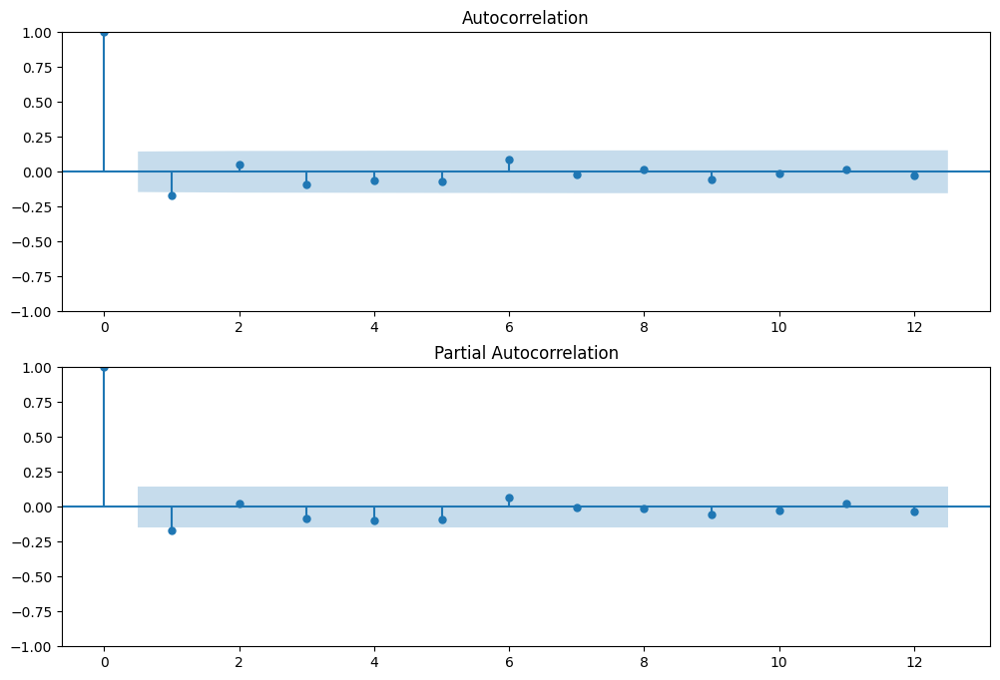

In [30]:
df_t10yiem_r = df_t10yiem[ (df_t10yiem['date'] >= '2009-01-01') & (df_t10yiem['date'] <= '2024-12-31' )].sort_values(by = 'date')
mape_t10yiem, rmse_t10yiem = arima_v2(df_t10yiem_r,'T10YIEM', 2, 1,0)     
print("mape_t10yiem:", mape_t10yiem)

arima_v1(df_t10yiem_r,'T10YIEM',2,1,0)

In [131]:
df_unrate_r = df_unrate[ (df_unrate['date'] >= '2009-01-01') & (df_unrate['date'] <= '2024-12-31' )].sort_values(by = 'date')
mape_unrate, rmse_unrate = arima_v2(df_unrate_r,'UNRATE', 1, 1,1)     
print("mape_unrate:", mape_unrate)

arima_v1(df_unrate_r,'UNRATE',1,1,1)

NameError: name 'df_unrate' is not defined

ARDL models for non-stationary vars (prices or indexes)

GOLD_diff: [ 1.00000000e+00  2.12071899e-01 -5.00847159e-02 -1.29418355e-02
  4.71726944e-03  9.98862866e-02 -3.17741102e-03 -2.14369453e-02
 -5.67113344e-02  1.32258169e-02  4.91768557e-02  1.14943317e-01
  5.67053799e-02  5.41330842e-03 -5.13872049e-03  2.08708381e-02
  4.60566262e-02 -4.30416818e-03  5.03735848e-03  1.11775232e-02
  2.54537536e-02 -1.51478031e-02  3.82014010e-03  6.66633916e-03
 -2.65821565e-04 -1.12216449e-01 -8.58065586e-02  5.98985779e-03
 -1.66579290e-02] 



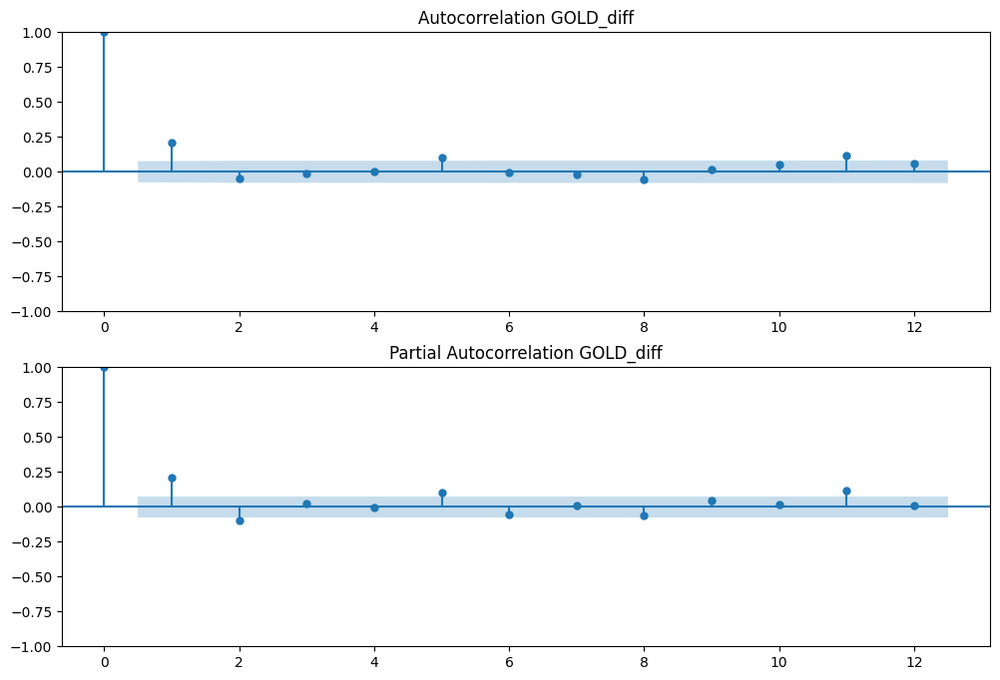

Close_SP500_diff: [ 1.         -0.08274541 -0.05009998  0.07246037  0.04994002  0.06160198
 -0.1176722   0.15146528  0.14725353 -0.1025567  -0.01280044 -0.01002608
  0.02498832 -0.00203547 -0.18163084  0.07285356  0.08252648 -0.045012
 -0.06817826 -0.01483951  0.01243874 -0.11470389 -0.14924915  0.1088433
  0.04530225 -0.02790867 -0.03126883] 



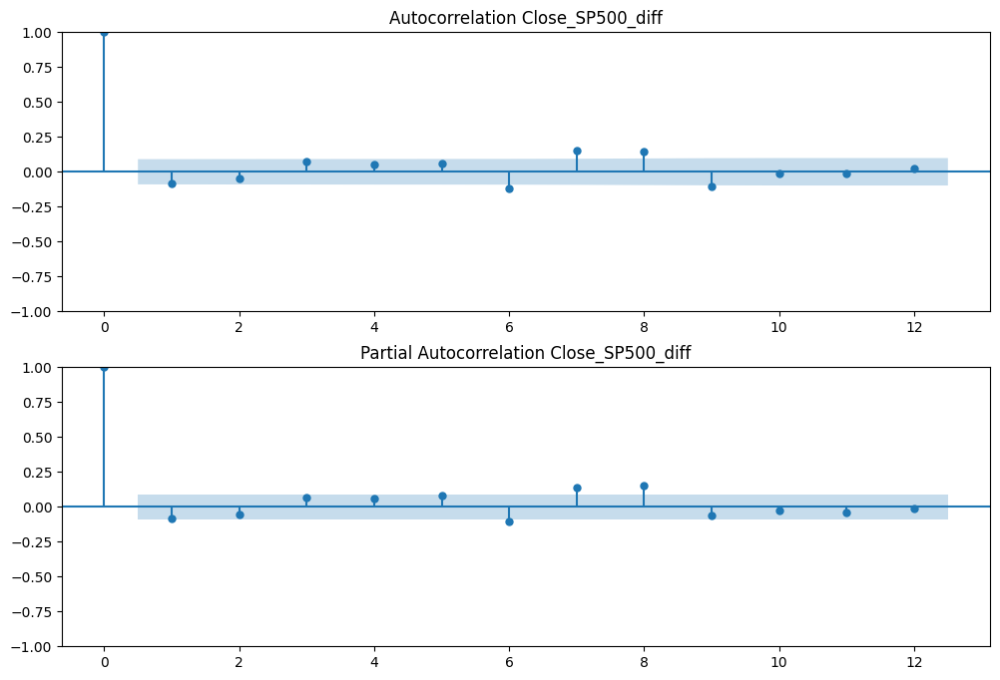

Non Farm Payroll_diff: [ 1.00000000e+00  5.97744952e-02 -1.14313127e-01 -8.03101458e-03
 -1.25928303e-03  8.24185314e-03  1.19052425e-02  2.67623387e-02
  4.97457032e-02  3.01860422e-02  1.18209340e-02  1.18321039e-03
  9.04038816e-03  9.17043789e-03 -2.82180432e-04 -2.12890960e-02
  1.78208229e-03  7.00432149e-03 -1.28990996e-02 -7.05172916e-03
 -1.07235257e-02  7.68348493e-03 -2.74388073e-02 -2.07988585e-02
 -4.46410319e-03 -7.37765052e-03 -1.93795574e-02 -2.26598240e-02
 -5.47890964e-03 -7.54010265e-03 -1.23770895e-02] 



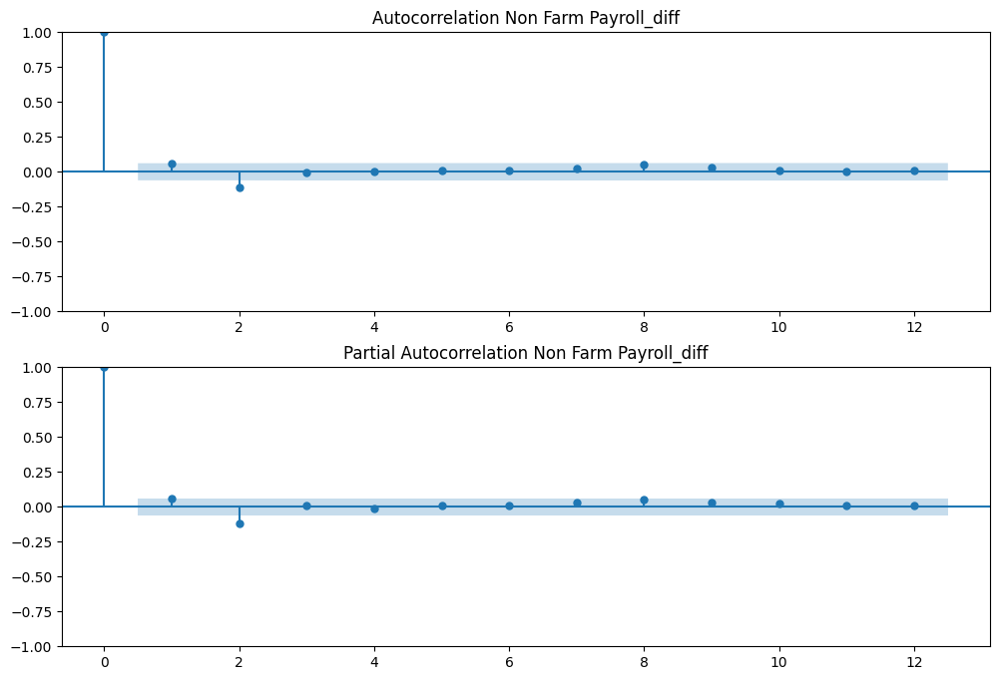

US Gross Debt_diff: [ 1.00000000e+00  2.54883618e-01  2.13162775e-01  1.45225558e-01
  7.95559688e-02  2.04695098e-01  1.07974735e-01  1.31635403e-01
  1.82680572e-01  1.72841112e-02 -5.39660387e-03  9.94605949e-02
  1.05236311e-01  2.02957754e-01  4.78206712e-02  9.30013945e-02
  3.90413933e-02  9.31172725e-02  1.46468092e-01  5.30721963e-02
  1.19040455e-01 -2.82283034e-04  2.84591843e-02  4.22984387e-02
  3.15872930e-02  8.72262814e-02  8.28087792e-03 -4.06980007e-02
  3.09740969e-02  7.70068283e-03] 



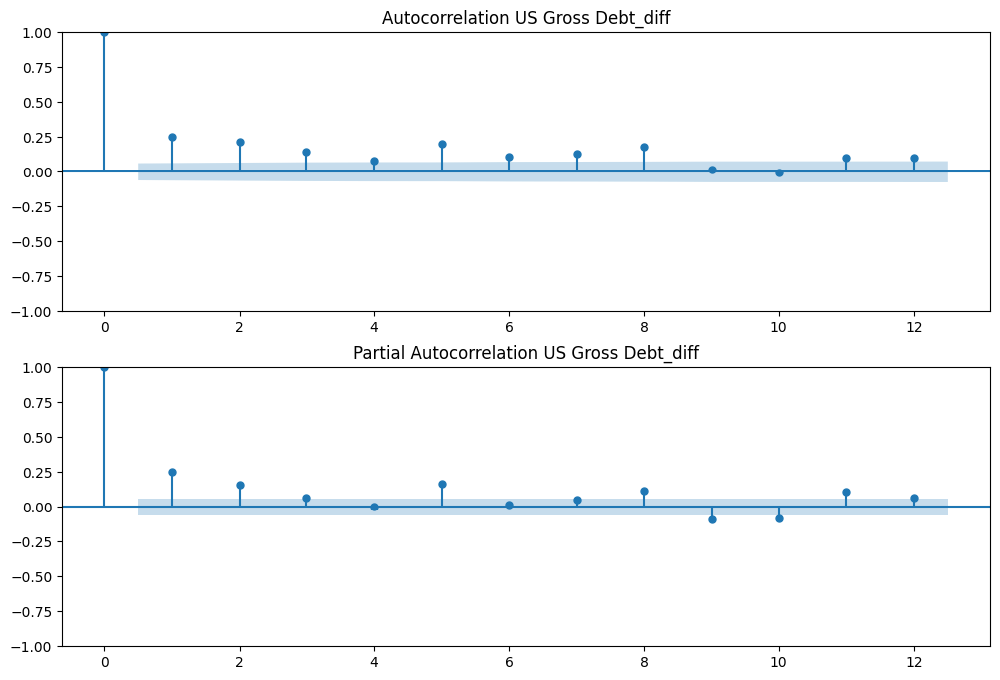

In [32]:
#differentiate SP500, GOLD, FedGrossDebt, NonFarmPayroll since they are non-stationary
df_sp500['Close_SP500_diff'] = df_sp500['Close_SP500'].diff()
df_gold['GOLD_diff'] = df_gold['GOLD'].diff()
df_debt['FedGrossDebt_diff'] = df_debt['FedGrossDebt'].diff()
df_nfp['NonFarmPayroll_diff'] = df_nfp['NonFarmPayroll'].diff()


dflib_diff= [
    (df_gold.dropna(), 'date', ['GOLD_diff'], 'GOLD_diff'),
    (df_sp500.dropna(), 'date', [ 'Close_SP500_diff'], 'Close_SP500_diff'),
    (df_nfp.dropna(), 'date', ['NonFarmPayroll_diff'], 'Non Farm Payroll_diff'),
    (df_debt.dropna(), 'date', ['FedGrossDebt_diff'], 'US Gross Debt_diff'),
]

#run again acf and pacf
for df, date_col, cols, title in dflib_diff:
    plot_acf_pacf(df, cols[-1], title)    
    



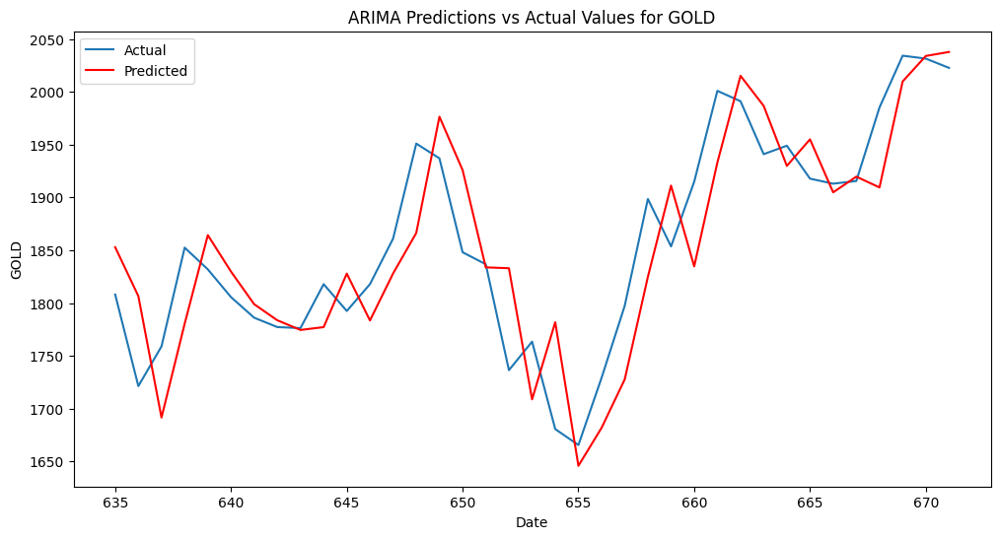

mape_gold: 0.023808892972835557
ar.L1       -0.660978
ar.L2        0.139279
ma.L1        0.942351
sigma2    2208.935751
dtype: float64
1915.7648264382915 1928.5588145633549 1920.951782849176
                               SARIMAX Results                                
Dep. Variable:                   GOLD   No. Observations:                  182
Model:                 ARIMA(2, 1, 1)   Log Likelihood                -953.882
Date:                Sun, 02 Jun 2024   AIC                           1915.765
Time:                        13:47:55   BIC                           1928.559
Sample:                             0   HQIC                          1920.952
                                - 182                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.66

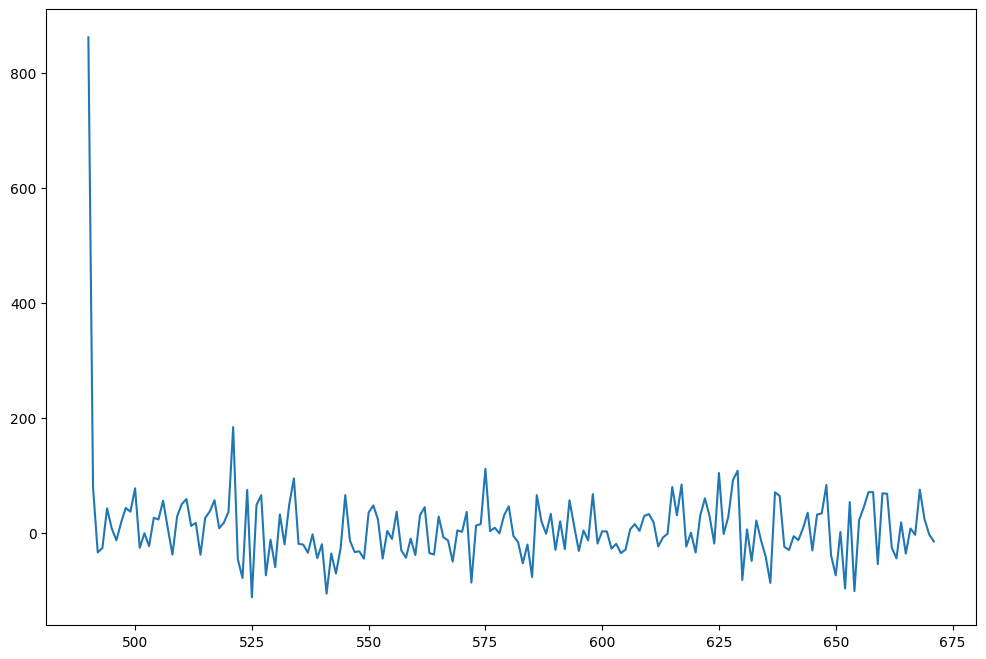

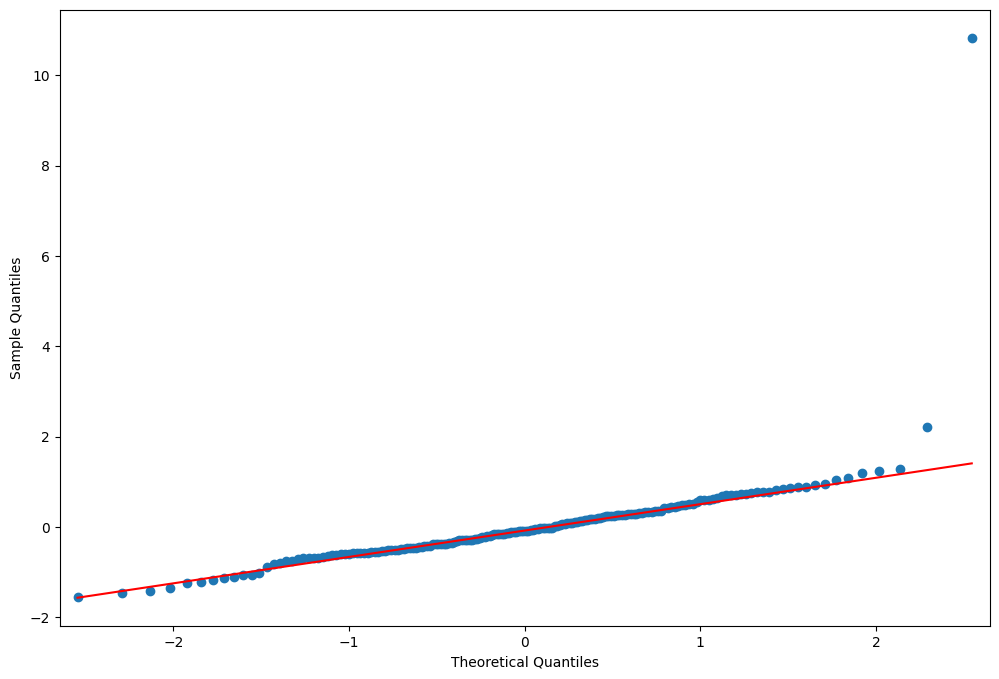

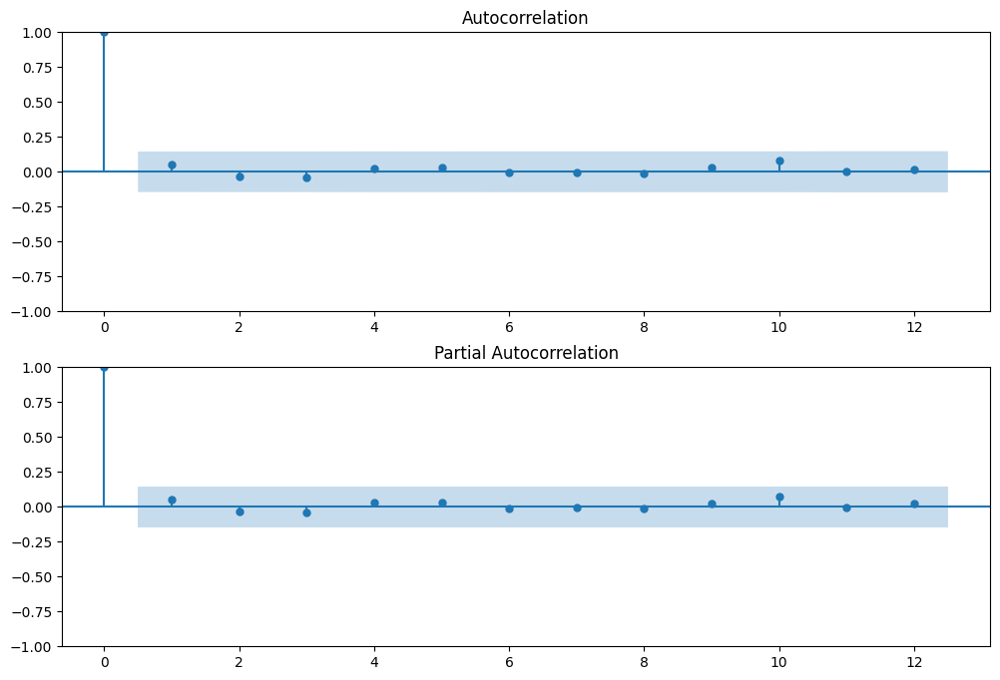

In [33]:
df_gold_r = df_gold[ (df_gold['date'] >= '2009-01-01') & (df_gold['date'] <= '2024-12-31' )].sort_values(by = 'date')
mape_gold, rmse_gold = arima_v2(df_gold_r.dropna(),'GOLD', 2, 1,1)     
print("mape_gold:", mape_gold)

arima_v1(df_gold_r,'GOLD',2,1,1)

# used GOLD not GOLD_diff bc ARIMA is used with r =1
# will be trying to build ARDL models

#issue: residuals not normal

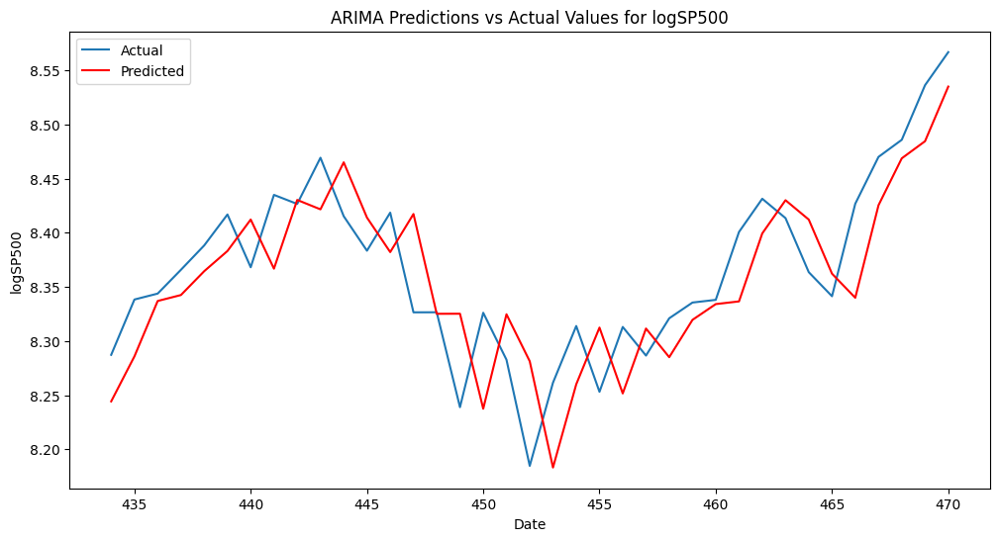

mape_sp500: 0.005233634811777754
const     7.648479
ar.L1     0.998633
sigma2    0.002000
dtype: float64
-605.9805204898398 -596.3520620313155 -602.0776331469947
                               SARIMAX Results                                
Dep. Variable:               logSP500   No. Observations:                  183
Model:                 ARIMA(1, 0, 0)   Log Likelihood                 305.990
Date:                Sun, 02 Jun 2024   AIC                           -605.981
Time:                        13:47:58   BIC                           -596.352
Sample:                             0   HQIC                          -602.078
                                - 183                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          7.6485      0.791      9.664     

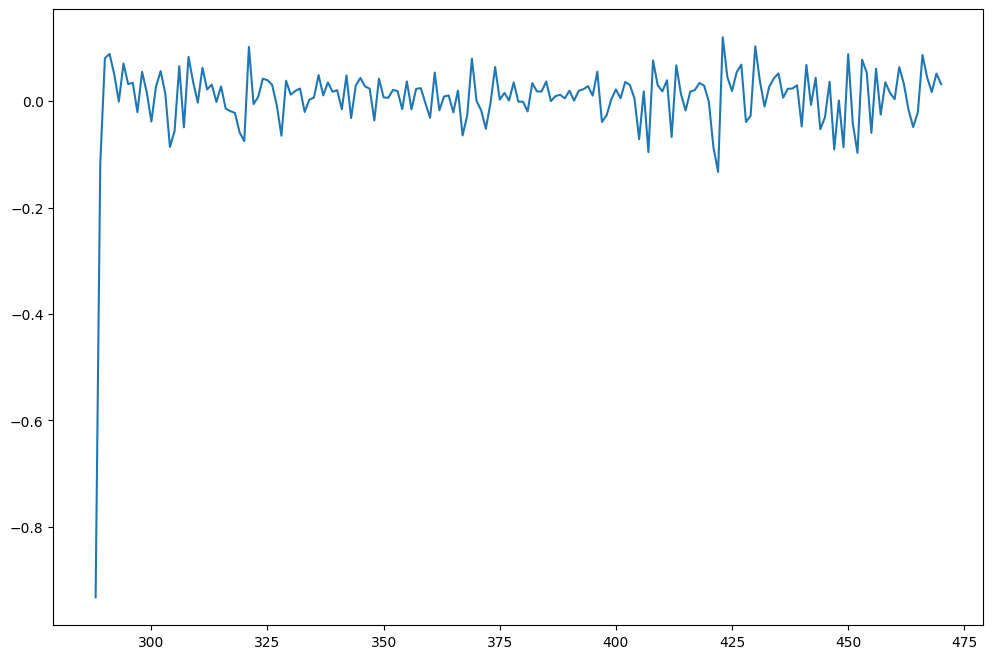

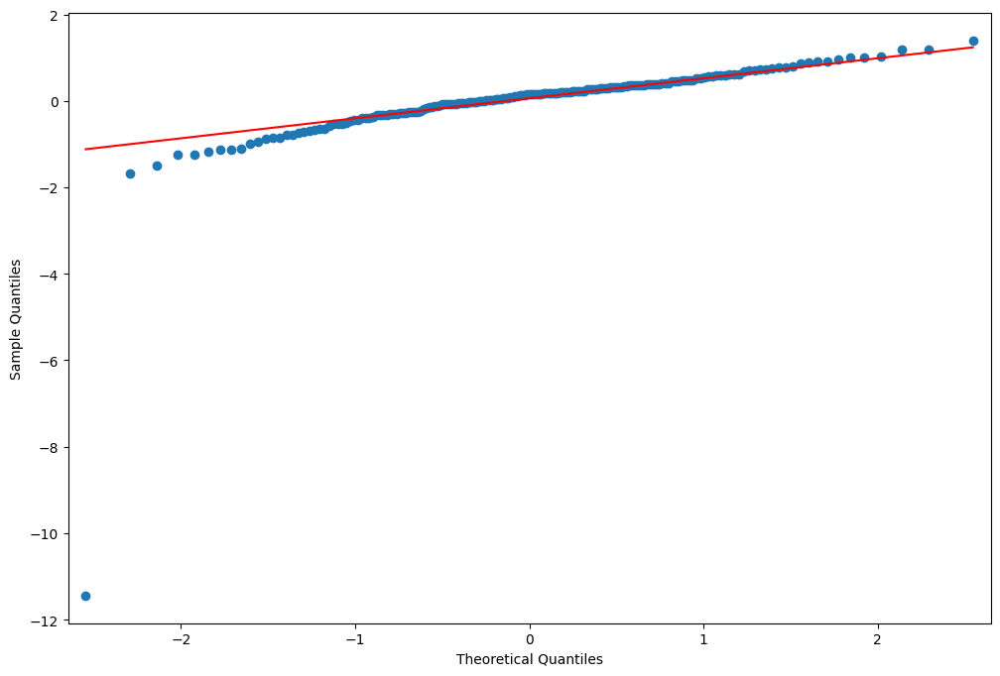

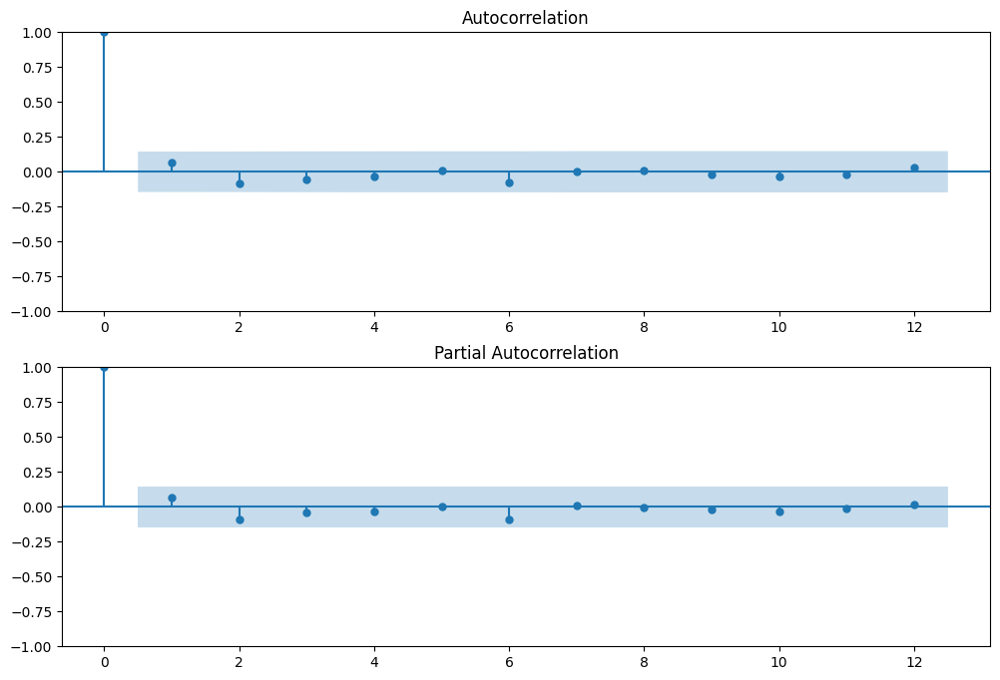

In [34]:
df_sp500_r = df_sp500[ (df_sp500['date'] >= '2009-01-01') & (df_sp500['date'] <= '2024-12-31' )].sort_values(by = 'date')
df_sp500_r['logSP500']=np.log(df_sp500_r['Close_SP500'])
mape_sp500, rmse_sp500 = arima_v2(df_sp500_r.dropna(),'logSP500', 1, 0,0)     
print("mape_sp500:", mape_sp500)

arima_v1(df_sp500_r,'logSP500',1,0,0)

# used Close_SP500 not Close_SP500_diff bc ARIMA used with r=1
# will be trying to build ARDL models

#issue: residuals not normal

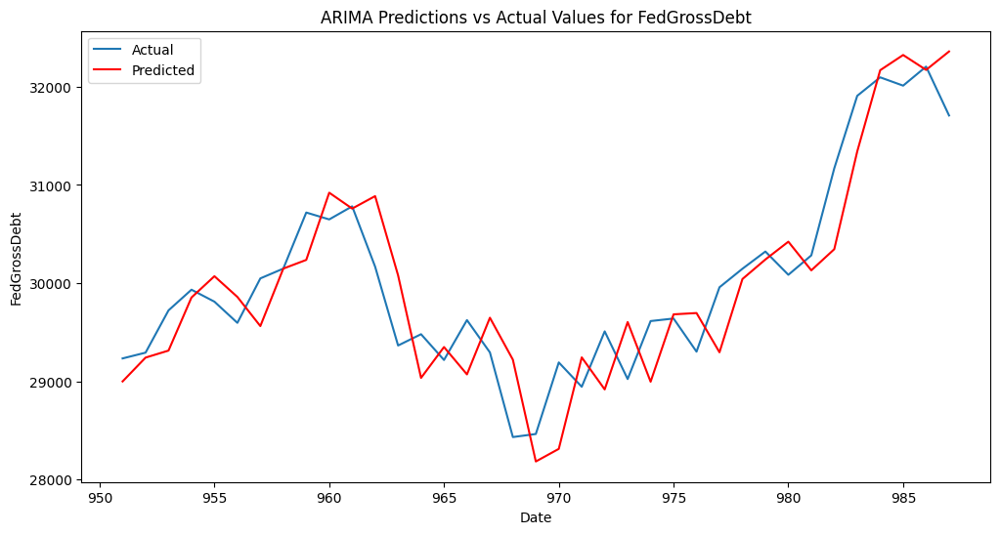

mape_debt: 0.012424774176403214
ar.L1         0.914429
ma.L1        -0.766127
sigma2    80282.105614
dtype: float64
2592.534783329954 2602.163241788478 2596.437670672799
                               SARIMAX Results                                
Dep. Variable:           FedGrossDebt   No. Observations:                  184
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -1293.267
Date:                Sun, 02 Jun 2024   AIC                           2592.535
Time:                        13:48:09   BIC                           2602.163
Sample:                             0   HQIC                          2596.438
                                - 184                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9144      0.060     15.

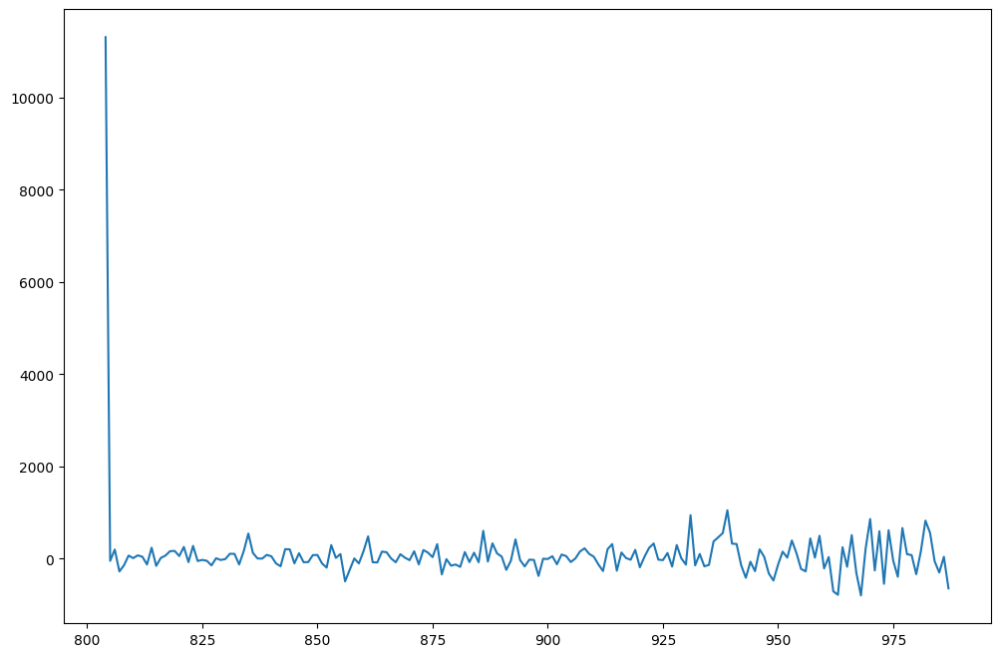

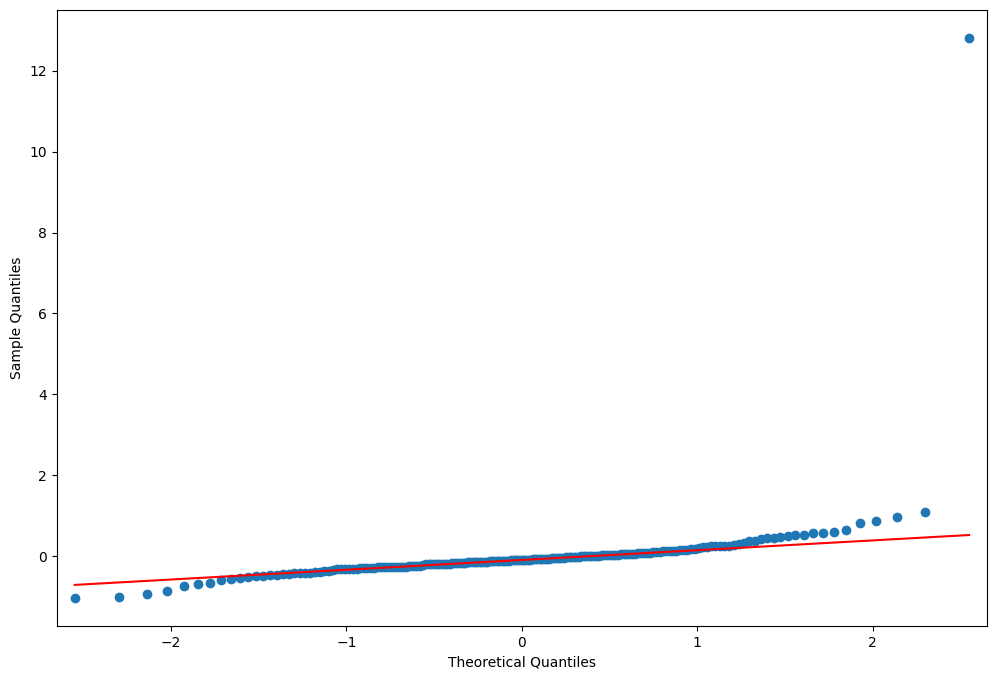

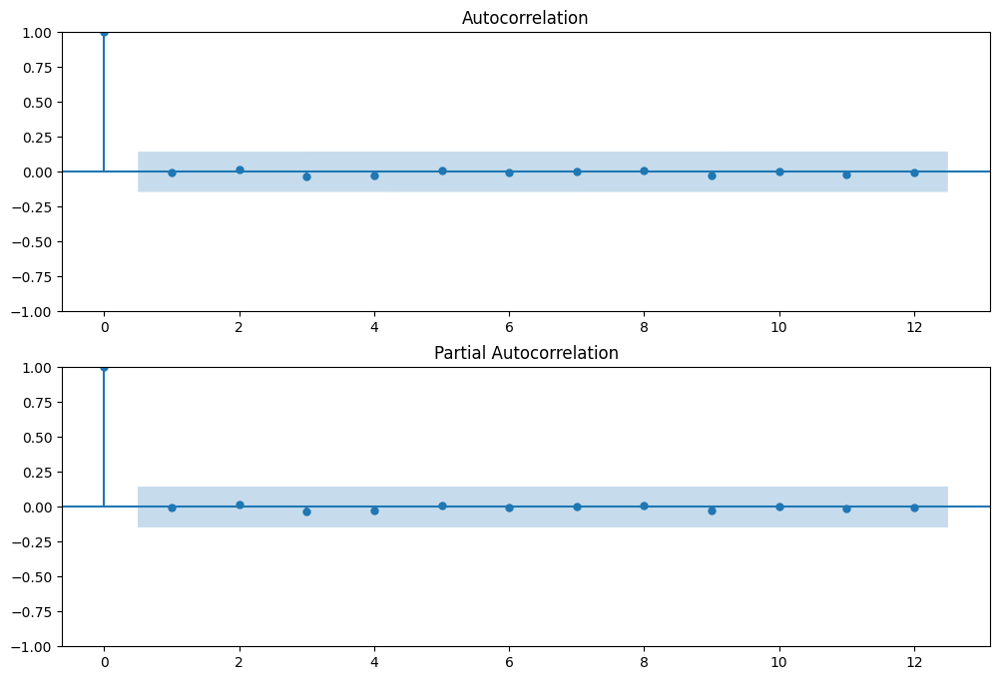

In [35]:
df_debt_r = df_debt[ (df_debt['date'] >= '2009-01-01') & (df_debt['date'] <= '2024-12-31' )].sort_values(by = 'date')
mape_debt, rmse_debt = arima_v2(df_debt_r.dropna(),'FedGrossDebt', 1, 1,1)     
print("mape_debt:", mape_debt)

arima_v1(df_debt_r,'FedGrossDebt',1,1,1)

# used FedGrossDebt not FedGrossDebt_diff bc ARIMA used with r =1
# will be trying to build ARDL models

#issue: residuals not normal

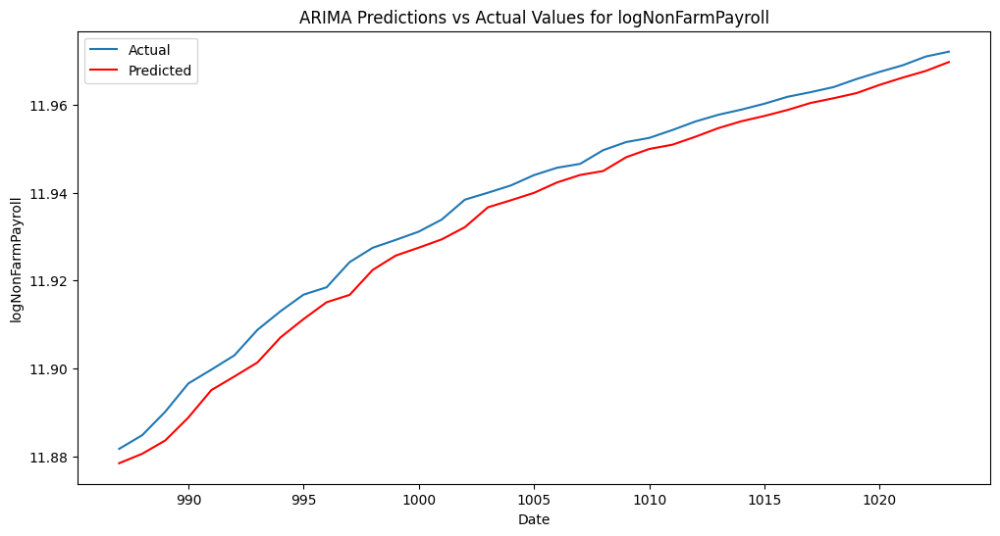

mape_nfp: 0.0003384926356246983
const     11.876186
ar.L1      0.987052
sigma2     0.000130
dtype: float64
-1113.9636108288112 -1104.3188035559842 -1110.0544502111763
                               SARIMAX Results                                
Dep. Variable:      logNonFarmPayroll   No. Observations:                  184
Model:                 ARIMA(1, 0, 0)   Log Likelihood                 559.982
Date:                Sun, 02 Jun 2024   AIC                          -1113.964
Time:                        13:48:12   BIC                          -1104.319
Sample:                             0   HQIC                         -1110.054
                                - 184                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         11.8762      0.069    172.153

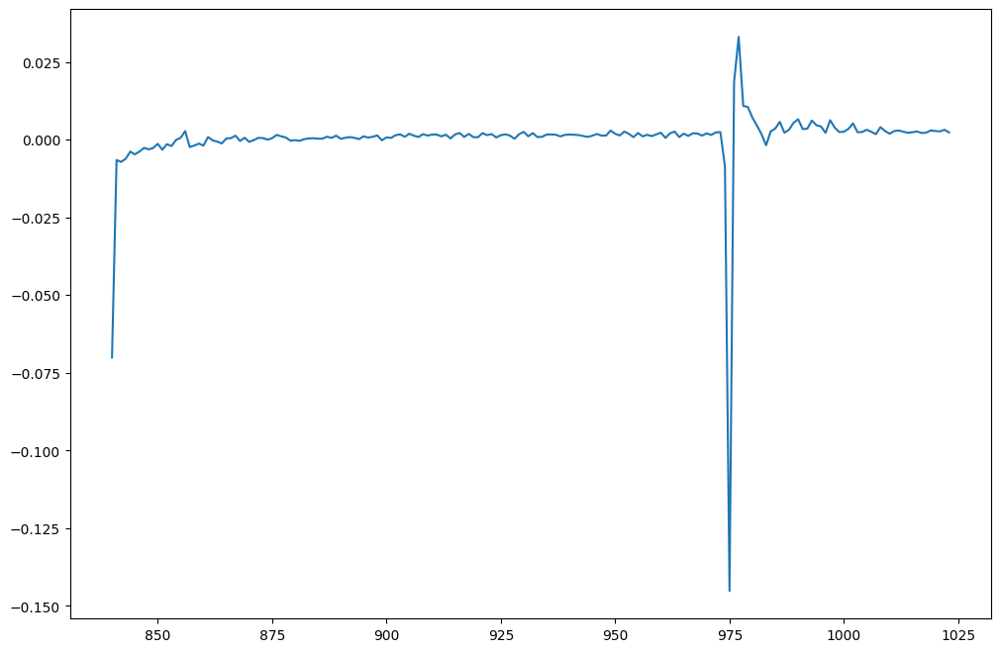

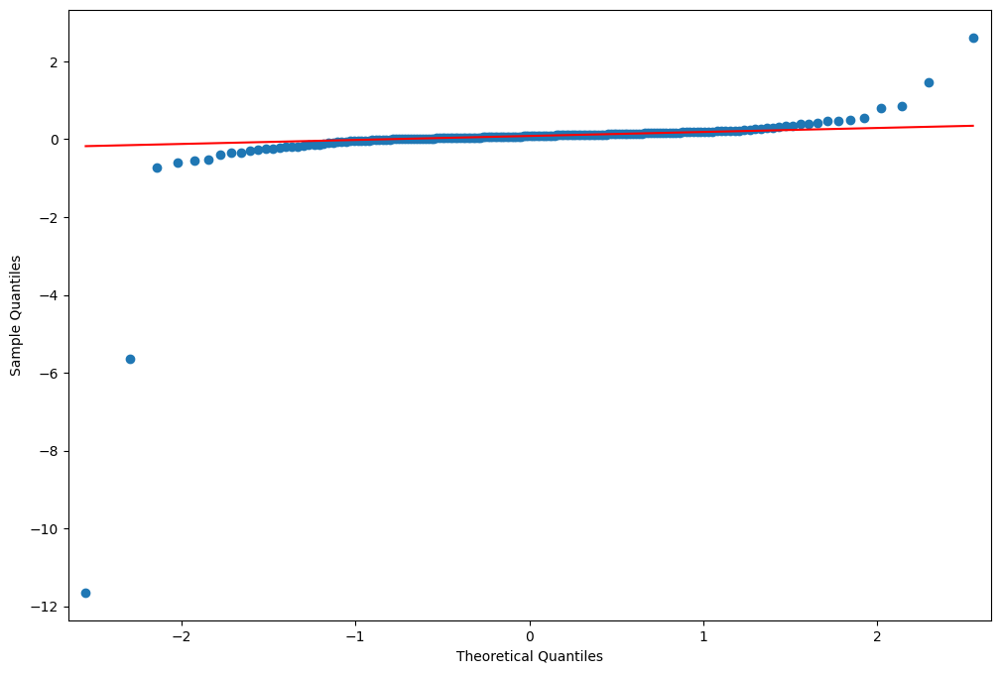

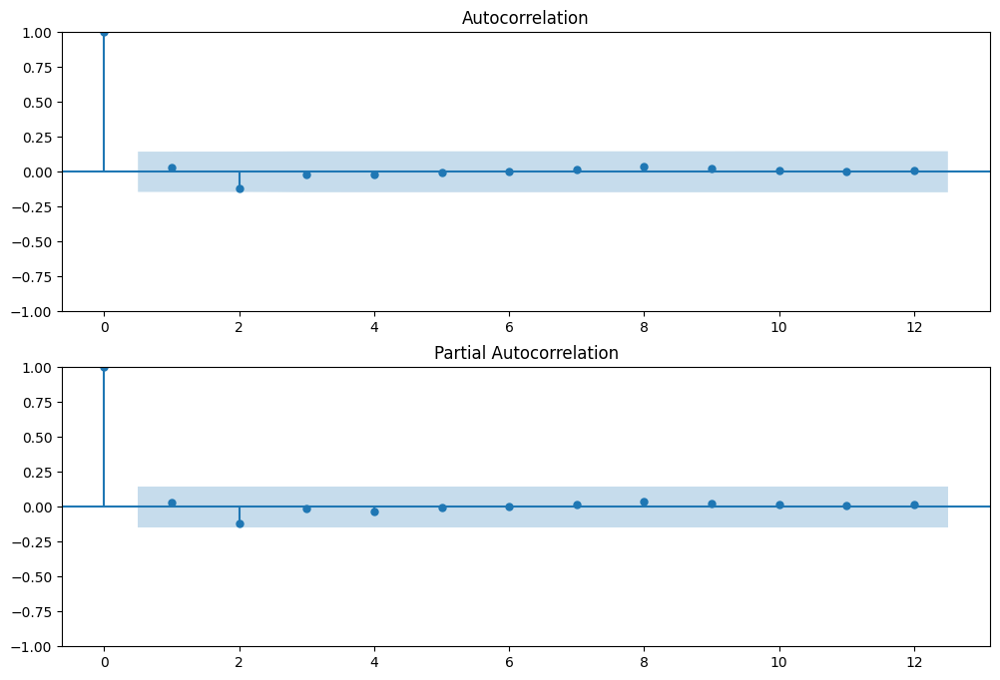

In [36]:
df_nfp_r = df_nfp[ (df_nfp['date'] >= '2009-01-01') & (df_nfp['date'] <= '2024-12-31' )].sort_values(by = 'date')
df_nfp_r['logNonFarmPayroll']=np.log(df_nfp_r['NonFarmPayroll'])
mape_nfp, rmse_nfp = arima_v2(df_nfp_r.dropna(),'logNonFarmPayroll',  1,0,0)     
print("mape_nfp:", mape_nfp)

arima_v1(df_nfp_r,'logNonFarmPayroll', 1,0,0)

# will be trying to build ARDL models

#issue: resoduals not normal

gaussian, multicollinearity, heteroscedasticity
?

individual time series models - drift/trending, mean reversion
Dickey Fuller for drift/trending ?